[13.960324203556809, 14.65179178802444, 14.817534577089868, 15.263622577698005, 16.04709904438931, 16.09588307975029, 17.445793902068974, 18.248747732197316, 18.392674709823265, 19.24678261587945, 19.667378629809452, 19.85081448357774, 20.10751556116488, 20.496095088664426, 20.55549936443803, 21.055080186178007, 21.75488349559273, 21.84114729034034, 21.8708577515941, 22.043778158483445, 22.314043789192457, 24.019370860670296, 25.796100328542302, 26.184634839994565, 26.551866291005698, 26.920101107352085, 27.210099947234376, 30.08349948078321, 30.35733030968813]


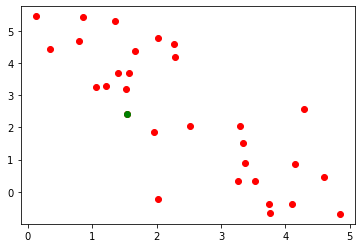

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
import random
import math
import matplotlib.pyplot as plt
from no_cluster import get_cluster
import copy

In [2]:
#random.seed(15)
P=2 #signal power threshold
#stream = BitStream()
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 30
        self.rounds = 200
        self.epochs = 2
        self.local_batches = 64
        self.lr = 0.01
        self.C = 0.9 #fraction of clients used in the round
        self.drop_rate = 0.1 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1
 
args = Arguments()

In [4]:
#checking if gpu is available
use_cuda = False
#print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
clients = []

#generating virtual clients
for i in range(int(args.clients)):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
    
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

/home/iiitd/anaconda3/envs/FL/lib/python3.8/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [5]:
for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average

#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=True, download=True, transform=transform)
global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [6]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50)  #10 iid 50 non iid
        self.fc2 = nn.Linear(50, 10) 

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

In [7]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data,target=data,target
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get() 
    #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [8]:
def test(args, model, device, test_loader, name):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))


In [9]:
torch.manual_seed(args.torch_seed)
#global_model = Net() #redundant code as we don't use it for training: assigns a CNN to the global model

for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    

accuracy=[]
rc=1

[3.5940175637646545, 3.9363130031164513, 4.418920785652297, 4.437755237342514, 4.7155994719449, 4.983965628252846, 5.342434549168612, 5.474887306062201, 5.870571835077181, 5.901353082719892, 6.144457779491201, 6.7781193309714665, 7.507230633016296, 7.692263592457451, 8.551591577230777, 16.679034595564723, 18.07540333658291, 18.83657648141312, 19.276804863498047, 21.399911118428676, 21.8523171627916, 22.344519961774463, 22.67917437723834, 23.475065231338757, 24.063813837853314, 25.198448872429623, 26.724880552493666, 29.973635813817808, 31.491752904826786]


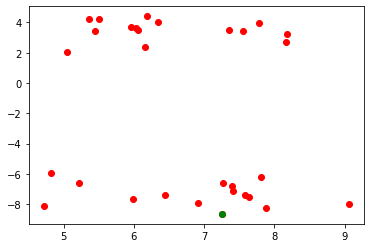

Power Allocated= 3.088348832293266
CSI= 0.8057820764017356
SNR= 3.5940175637646545
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1737967978434254
CSI= 0.3168987156746108
SNR= 3.9363130031164513
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2641010918272126
CSI= 0.9387220325656535
SNR= 4.418920785652297
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.175718373426718
CSI= 0.866805915175889
SNR= 4.437755237342514
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.428596


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.863935

Power Allocated= 2.8155077182326176
CSI= 0.6605580683853953
SNR= 4.7155994719449
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9712845568543393
CSI= 0.7363257261378983
SNR= 4.983965628252846
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05436966390677578
SNR= 5.342434549168612
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3287634202054432
CSI= 0.49984611067282225
SNR= 5.474887306062201
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.597240717066825
CSI= 0.5773210565370697
SNR= 5.870571835077181
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.096361890962867
CSI= 0.8110186445978644
SNR= 5.901353082719892
Client: client10
Poor Channel, client not taken for averaging in this round

Power 

/tmp/ipykernel_245475/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.306805
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 2.116304

Power Allocated= 0.4442255898069454
CSI= 0.257390082560212
SNR= 18.07540333658291
Client: client18
Model client18 Train Epoch: 1 [0/320 (0%)]	Loss: 2.314434
Model client18 Train Epoch: 2 [0/320 (0%)]	Loss: 2.035809

Power Allocated= 0
CSI= 0.03564031837618631
SNR= 18.83657648141312
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0269847113258344
CSI= 0.4343304413035859
SNR= 19.276804863498047
Client: client20
Model client20 Train Epoch: 1 [0/320 (0%)]	Loss: 2.256791
Model client20 Train Epoch: 2 [0/320 (0%)]	Loss: 1.862478

Power Allocated= 2.6680323612669152
CSI= 0.6019212824994464
SNR= 21.399911118428676
Client: client21
Model client21 Train Epoch: 1 [0/320 (0%)]	Loss: 2.395184
Model client21 Train Epoch: 2 [0/320 (0%)]	Loss: 1.245752

Power Allocated= 3.1999880924455057
CSI= 0.8854328872483587
SNR= 21.8523171627916
Clien

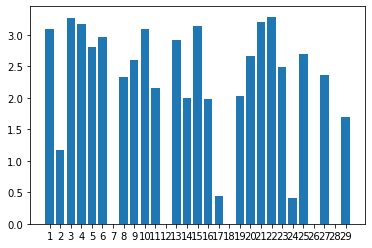

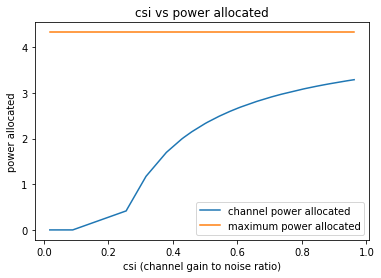

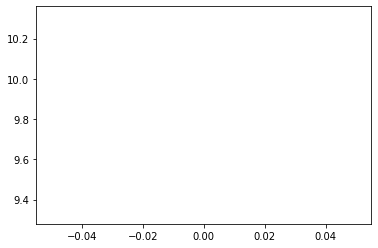

1
[11.185613958848636, 12.970576736537689, 13.743500808705194, 13.886802598961136, 14.013456417241878, 14.178288290919962, 14.255183921578588, 14.29434761914581, 14.597019435519929, 14.67845188451, 14.68352205440682, 14.997914875827153, 15.249316823590972, 15.784191559504746, 17.810015065199217, 17.963232811960697, 23.38240785169373, 24.113260229203675, 24.66213549185814, 24.835569483056652, 25.161069802627377, 27.04699022378631, 28.983116038339322, 30.0763185875396, 30.50025571239525, 31.105107980945064, 31.158997406825364, 34.83268802224701, 35.49364038375952]


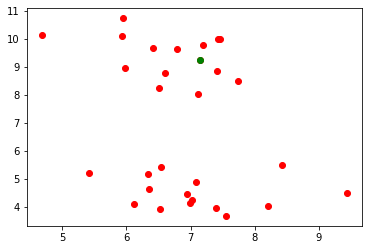

Power Allocated= 2.5675475348225354
CSI= 0.6909766844517223
SNR= 11.185613958848636
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.285108
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 2.221564

Power Allocated= 0
CSI= 0.17602363475010352
SNR= 12.970576736537689
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.526133855503754
CSI= 0.6717538522406454
SNR= 13.743500808705194
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311523
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.156368

Power Allocated= 2.7392249365398174
CSI= 0.7839758883647958
SNR= 13.886802598961136
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9202288712653104
CSI= 0.9136212258398959
SNR= 14.013456417241878
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.885201507450807
CSI= 0.46957773445365625
SNR= 14.178288290919962
Client: client6
Model c

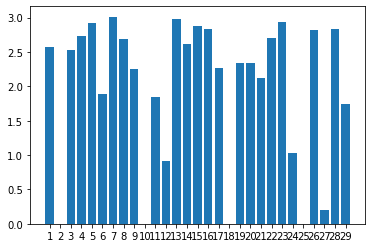

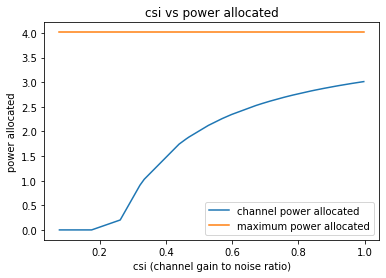

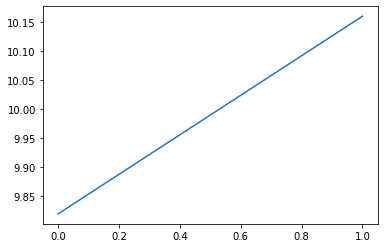

2
[2.8148722688126098, 3.172438734544879, 3.4809484283922796, 3.838147778876163, 3.858524745259345, 3.9717381299332013, 4.250648677743005, 4.829598975392152, 4.939327269213983, 5.626198352803632, 5.776244319041655, 5.8789698172112885, 6.024045844998264, 6.041360775757905, 6.562878771452919, 16.613922187013312, 19.298525231675004, 20.12433494771488, 20.19981127256998, 20.880032540335517, 22.065134389146042, 22.32604489748309, 23.432210238343977, 27.8083406619985, 29.338756295605126, 29.957608237418093, 30.101743205816582, 34.50426574988768, 41.050874328064374]


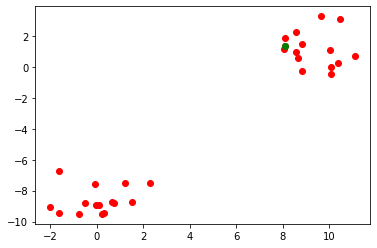

Power Allocated= 0
CSI= 0.016457527575200914
SNR= 2.8148722688126098
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.042127452493201156
SNR= 3.172438734544879
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.124818359572447
CSI= 0.7211908500730382
SNR= 3.4809484283922796
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7438214547938498
CSI= 0.5657412802720382
SNR= 3.838147778876163
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.921341562308083
CSI= 0.6289022145039357
SNR= 3.858524745259345
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8273768812392714
CSI= 0.5938111825644651
SNR= 3.9717381299332013
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2995561867099688
CSI= 0.8251793984740308
SNR= 4.25064867

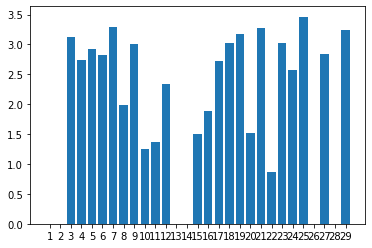

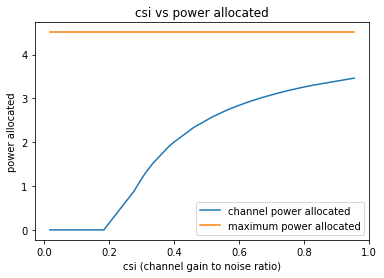

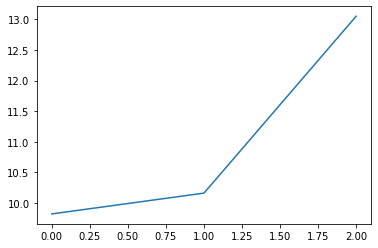

3
[1.2440645049770396, 1.2756174809398146, 1.430869138828398, 1.5053729946125776, 1.5184532504313561, 1.6506320639716394, 1.7567452272437727, 2.0538725221580325, 2.42514308992074, 2.666411216394466, 2.752007845542625, 2.8330337139512323, 3.297243059596565, 3.9535458924852063, 5.252732010693163, 12.861503750884957, 16.076271065285738, 18.140775643472956, 19.200486714422468, 19.22970706235454, 20.167819163591243, 20.406377532500546, 21.502464911142077, 22.364637646995437, 22.776220022806655, 22.879310548262303, 23.917983848543816, 24.54999019910569, 26.414484093478798]


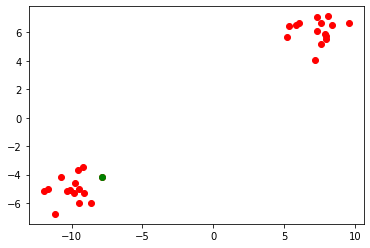

Power Allocated= 2.2101805296431274
CSI= 0.4139034672816163
SNR= 1.2440645049770396
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.578371320121604
CSI= 0.9543519230454375
SNR= 1.2756174809398146
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8296939252084243
CSI= 0.3575887080000145
SNR= 1.430869138828398
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2168682731798977
CSI= 0.2933123717836933
SNR= 1.5053729946125776
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02289709080764213
SNR= 1.5184532504313561
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3448749363267307
CSI= 0.7804403684759599
SNR= 1.6506320639716394
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.410064783335578
CSI= 0.4512354315189018

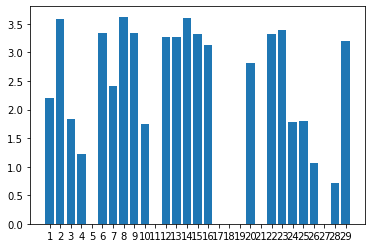

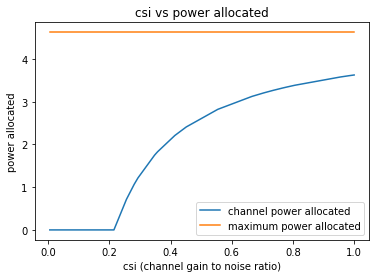

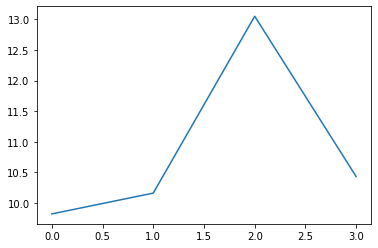

4
[5.286716412271051, 5.961068060281435, 6.443033448965373, 7.077615119911177, 7.202309176772241, 7.380152410561403, 7.514953960628841, 7.831700987472305, 8.033874994661604, 8.582144990502421, 8.836302374536846, 9.963291352854224, 10.167311053352442, 10.472502422568143, 13.49154129261874, 18.912650262793548, 19.519072422611345, 20.66709535852665, 21.484907437282107, 21.735985380967875, 22.292889834492613, 23.024753636174577, 23.119066926189223, 24.87910479023585, 25.79526988347976, 26.520389016675374, 27.895144131332174, 30.067391442870044, 41.218570018743634]


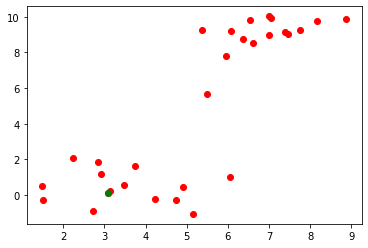

Power Allocated= 0.9648023188037285
CSI= 0.3156794224102851
SNR= 5.286716412271051
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.335599
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.778363

Power Allocated= 0.98419332631499
CSI= 0.3176237057567629
SNR= 5.961068060281435
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.318341
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 2.250882

Power Allocated= 2.0165941202033255
CSI= 0.47259452253745793
SNR= 6.443033448965373
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.477404753685194
CSI= 0.6041682098053889
SNR= 7.077615119911177
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.957500152864757
CSI= 0.8510111126920906
SNR= 7.202309176772241
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.899997141636865
CSI= 0.8113091311696231
SNR= 7.380152410561403
Client: client6


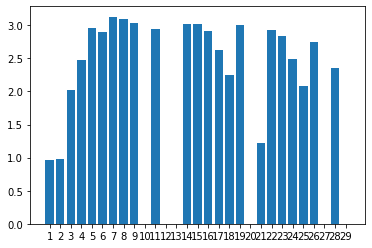

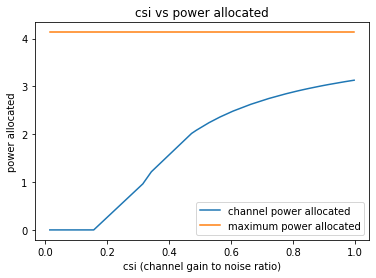

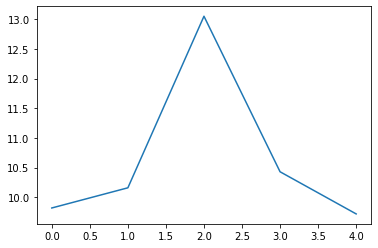

5
[7.149760796688454, 7.783713352206108, 8.561083433534307, 8.65702451154218, 8.845310095134796, 8.998433531662995, 9.90894942312237, 9.971058647516898, 10.211067703782437, 10.257422560758926, 10.613575103248213, 10.737119570205941, 11.090843564061196, 11.750321492718445, 12.304539143660461, 15.359157931544075, 18.979245513650234, 19.105957591589117, 19.952057419882003, 20.60662012603069, 21.222118077995418, 22.105675414106784, 23.98661794839996, 25.00462892357226, 25.15758625874763, 26.613142170855916, 28.74630904481852, 29.55220148711549, 31.821949083023224]


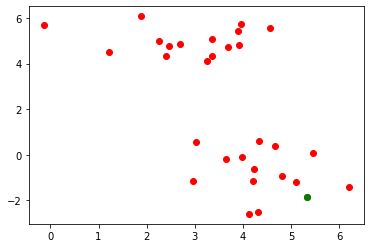

Power Allocated= 2.8785208206277915
CSI= 0.828651269930513
SNR= 7.149760796688454
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.021846339904906253
SNR= 7.783713352206108
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2229100945441456
CSI= 0.5369441777891615
SNR= 8.561083433534307
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.962346197602284
CSI= 0.8905077218301195
SNR= 8.65702451154218
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4787975552027186
CSI= 0.6224698423624755
SNR= 8.845310095134796
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2816533914257544
CSI= 0.2629055265146947
SNR= 8.998433531662995
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.333320
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.395449

Power All

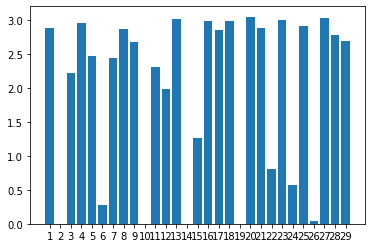

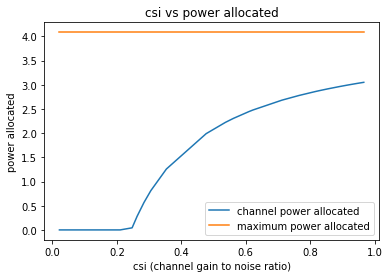

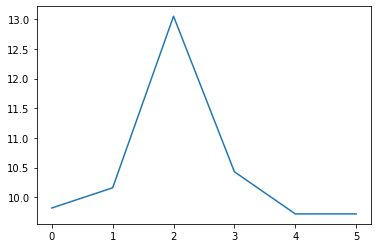

6
[1.005560420494315, 1.736076670104386, 1.902728188172789, 2.2500571912826475, 2.2551491336650558, 3.3676409873894966, 3.385126725187931, 3.5445671196262327, 3.9751351780923336, 4.231665402595263, 4.2684758241656695, 4.631377462692251, 4.813738341303485, 5.7465550513895165, 5.913476727742802, 20.35200275714253, 21.120184942259517, 21.510309853654846, 22.191438193774378, 22.355711798228928, 22.533544816053272, 23.861808532883245, 25.08100895281413, 25.426619480703785, 26.389477262614538, 28.20546170985007, 32.47052036212527, 34.25453811387385, 36.174679006426295]


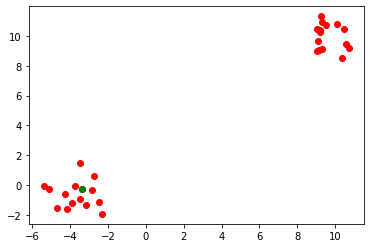

Power Allocated= 2.008465631517673
CSI= 0.4665650634751163
SNR= 1.005560420494315
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2306813043705469
SNR= 1.736076670104386
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0844975470628557
CSI= 0.9369508231007754
SNR= 1.902728188172789
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.039018652482078475
SNR= 2.2500571912826475
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1040546259409996
CSI= 0.9544400018839202
SNR= 2.2551491336650558
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.117813700307021
CSI= 0.9671406975559271
SNR= 3.3676409873894966
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.297706
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 2.130493

Power Allocated= 2.459

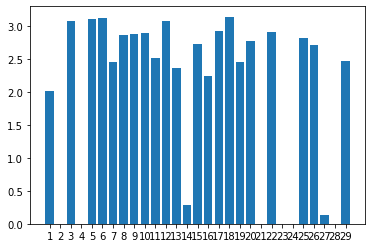

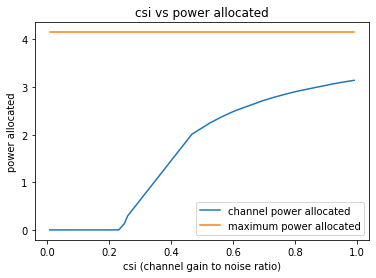

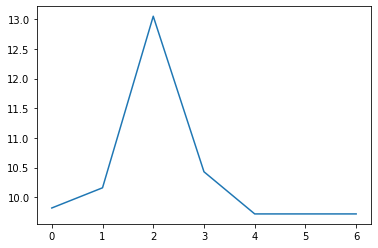

7
[9.898858450400319, 10.423726925273293, 10.424613145441345, 12.048243131642588, 12.313074831476776, 12.70781602848788, 12.935123622545449, 12.967796730065904, 13.260145951794629, 13.29231659555303, 13.456831517204131, 13.99088729799489, 14.926837994898584, 15.03114240315496, 15.267448375362186, 19.110079712491604, 19.51584220255729, 21.51068339284779, 21.59469251352032, 21.6319285947336, 22.309197224431344, 22.408094645649037, 23.25057053091963, 23.39282228235728, 23.53341678277419, 24.253785787516698, 27.371963946858955, 27.865858690471548, 34.39492408198957]


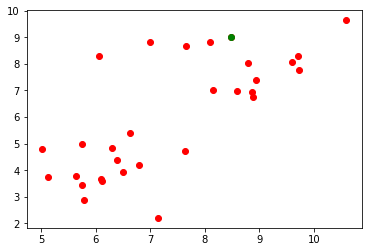

Power Allocated= 2.7648712482287263
CSI= 0.48401618208146613
SNR= 9.898858450400319
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.326556
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.471474

Power Allocated= 2.1491298340094103
CSI= 0.37288554685913033
SNR= 10.423726925273293
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.128014701407055
CSI= 0.3699725576532594
SNR= 10.424613145441345
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7735673106167074
CSI= 0.945760123705105
SNR= 12.048243131642588
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1261943440598059
SNR= 12.313074831476776
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.015849293151841692
SNR= 12.70781602848788
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.

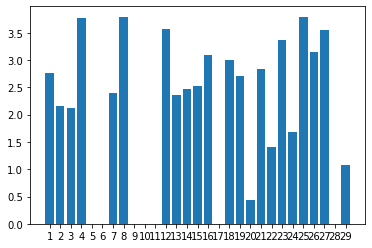

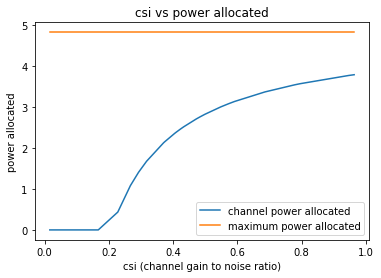

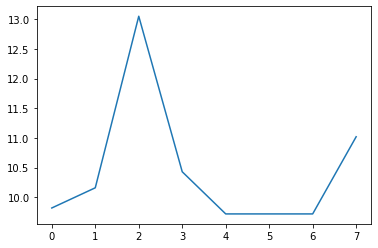

8
[3.6870292269049, 4.20294585041251, 5.558188986480671, 5.78661656222228, 5.848228379367261, 7.735641722576046, 8.056809714825254, 8.197369398766845, 8.232872386983146, 8.688417485781944, 8.984981602308435, 9.540108111845697, 9.579618915077747, 9.726784515073026, 10.030772221485726, 18.255843116415715, 18.89167870830564, 19.695006463634527, 20.99291902612345, 22.92770769984149, 23.036096786621613, 23.520921581048533, 24.066610829957998, 24.1073194355952, 25.2672848970058, 25.57649474476378, 28.540373098314664, 30.45546045219754, 35.65064986016653]


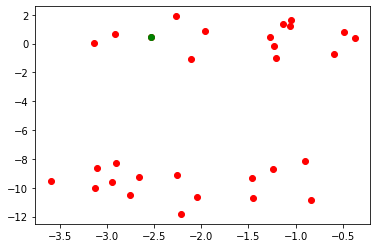

Power Allocated= 3.2487486510871317
CSI= 0.7000252870928326
SNR= 3.6870292269049
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.320936
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.917955

Power Allocated= 2.048762536693075
CSI= 0.38044426126117437
SNR= 4.20294585041251
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.334564
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 2.071881

Power Allocated= 0
CSI= 0.1806127506206563
SNR= 5.558188986480671
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.509947823270329
CSI= 0.8566626473519842
SNR= 5.78661656222228
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13900582703472253
SNR= 5.848228379367261
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8236025539931173
CSI= 0.35042644360180697
SNR= 7.735641722576046
Client: client6
Model client6 Train Epoch: 1 [0/3

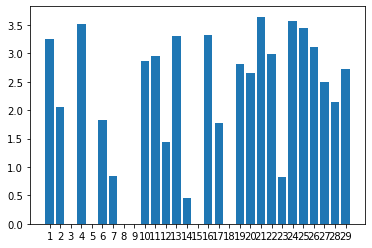

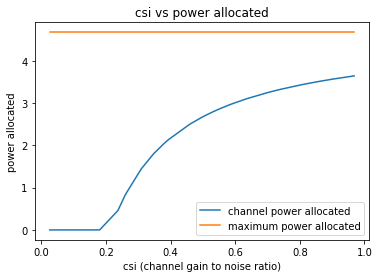

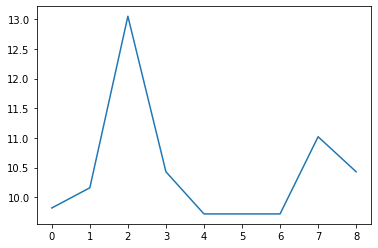

9
[4.55937686589415, 4.712048592211323, 6.389578022514236, 6.991740166209923, 7.200233218487428, 7.219459591692997, 7.449677803922437, 7.728377137550777, 8.301492537425858, 8.383382337572943, 8.532990855583279, 9.266059473646703, 9.349554146193151, 10.467415375337097, 10.858558736777445, 13.656211637427646, 16.181206445364055, 17.43242516448028, 19.1005025190086, 19.42345480989188, 19.64083191906969, 20.698355031823592, 21.28216003638646, 22.49615900533068, 23.592626791860454, 25.547290512417412, 25.82301028930962, 25.881901429575045, 34.00831114042454]


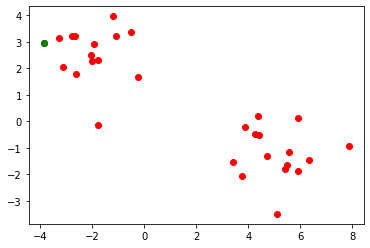

Power Allocated= 3.0886958406672687
CSI= 0.7148837448090382
SNR= 4.55937686589415
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.371175
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.944732

Power Allocated= 3.2931059050250573
CSI= 0.8372272939702035
SNR= 4.712048592211323
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14537031748079343
SNR= 6.389578022514236
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4382501672037806
CSI= 0.953039444381467
SNR= 6.991740166209923
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.389804092806312
CSI= 0.47670791116990563
SNR= 7.200233218487428
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.282368
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.981047

Power Allocated= 1.1757235648124276
CSI= 0.3019504990790528
SNR= 7.219459591692997
Client: client7
Poor Channel, 

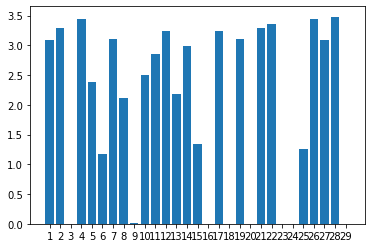

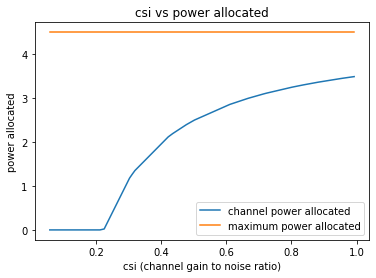

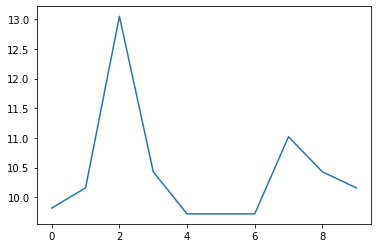

10
[4.8861865552777495, 5.0637866918040935, 5.065595386688117, 6.4325143275907255, 6.5343227729317785, 7.232265552524011, 7.297962922819507, 7.517485391772884, 7.634855578968362, 8.18198808684988, 8.28275049064523, 8.716385864406906, 8.769403417434187, 8.904144150326823, 9.254177793186331, 17.526357858087017, 18.574423389617465, 20.571773593049805, 22.095876842196287, 26.19870577309219, 26.338533652161534, 27.49923920874906, 28.11589717730431, 28.56666242794717, 29.031354475343665, 29.120951418000484, 29.35778868093928, 32.197132307665264, 35.826837602099786]


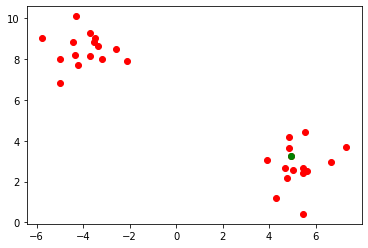

Power Allocated= 0
CSI= 0.13445752272934308
SNR= 4.8861865552777495
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1239437274097922
SNR= 5.0637866918040935
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4779218825870384
CSI= 0.49146968442120376
SNR= 5.065595386688117
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.361620
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 2.039026

Power Allocated= 3.097754075807309
CSI= 0.7067730683131053
SNR= 6.4325143275907255
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.447186189692311
CSI= 0.9385712711385222
SNR= 6.5343227729317785
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08120142261419683
SNR= 7.232265552524011
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.040842473196256
CS

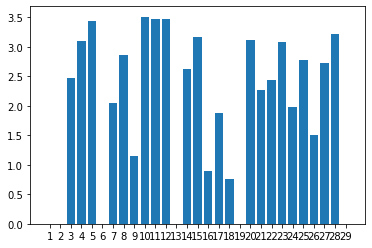

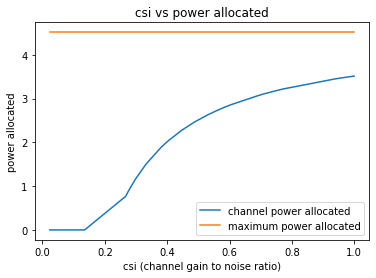

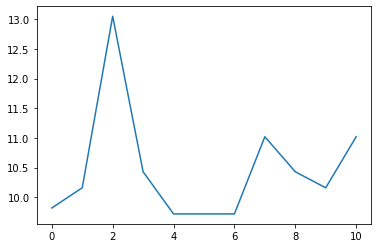

11
[8.92871760113456, 9.411691792364188, 9.65735282056783, 9.96317564559197, 10.192575774264888, 10.849114124093985, 11.073246757966999, 11.270320001527057, 11.489303121122951, 11.526354045902425, 12.056785816231393, 12.35690342690378, 13.667697365435515, 13.836657466410324, 16.011431676666703, 18.37882937042108, 18.859287227887023, 19.08003690126736, 23.97609925940073, 24.460243312837648, 24.87105968308028, 25.634491923971034, 25.912917593760376, 26.45803073405516, 26.86202564186409, 27.081499393554612, 29.526400610674806, 29.820444400917847, 30.56714909602327]


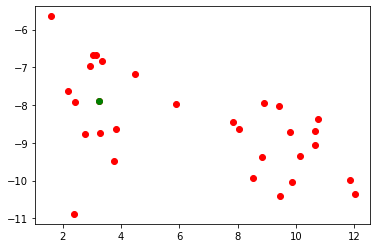

Power Allocated= 2.2769289564010653
CSI= 0.5683236045848256
SNR= 8.92871760113456
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.334093
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.751086

Power Allocated= 2.6267149703511796
CSI= 0.7093331008917061
SNR= 9.411691792364188
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0914468445713816
CSI= 0.5141274448654567
SNR= 9.65735282056783
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6145234384820433
CSI= 0.7032514825613866
SNR= 9.96317564559197
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.368636
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.586586

Power Allocated= 2.7528520721919447
CSI= 0.7790359577643782
SNR= 10.192575774264888
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.264781
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.237450

Power Allocated= 0
CSI= 0.0745309596675540

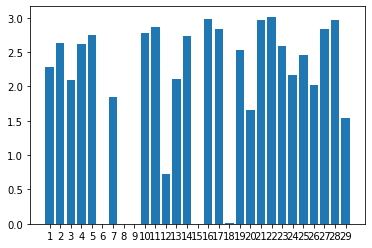

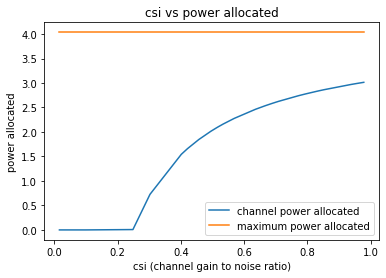

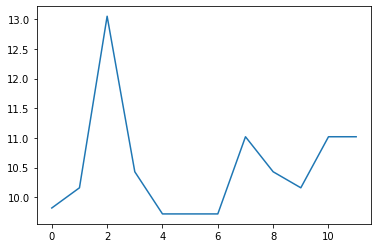

12
[-0.17594167797565152, -0.03569994293688783, 0.6197297602410954, 0.8430027892891752, 1.1081363474959494, 1.1240530541328844, 1.3715305322412163, 2.235163274035867, 2.700252224761564, 2.716750860268658, 3.1483128596066954, 3.175481304815616, 3.797279114936606, 3.8486088115845267, 4.301090490108728, 12.65539360903055, 15.187260625746273, 16.82262468862988, 17.060331276208863, 18.327976300986123, 18.69425671746199, 19.540794651943582, 20.70549924709799, 20.927584813761946, 21.14653566915633, 22.619378263366503, 23.784148610878987, 25.16235856860502, 27.453477230660223]


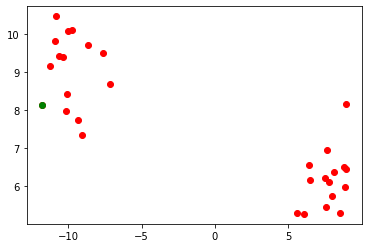

Power Allocated= 3.6468921819107374
CSI= 0.6623071426438081
SNR= -0.17594167797565152
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341547
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.574353

Power Allocated= 3.2230226225926613
CSI= 0.5171317864306131
SNR= -0.03569994293688783
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.013508492246276
CSI= 0.8746938254259725
SNR= 0.6197297602410954
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.930408439315238
CSI= 0.44916421464958156
SNR= 0.8430027892891752
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.587606472044592
CSI= 0.2801780314906298
SNR= 1.1081363474959494
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.46195969226892686
CSI= 0.2130013473068625
SNR= 1.1240530541328844
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	

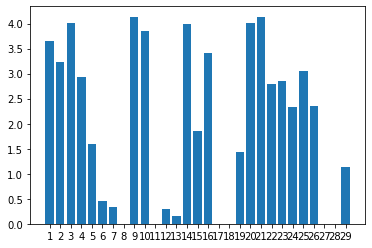

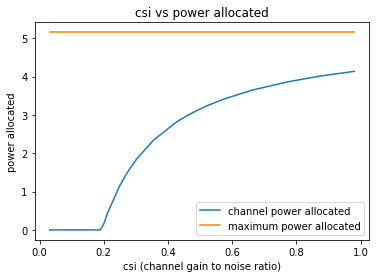

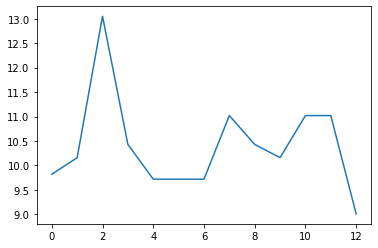

13
[18.722954562983553, 22.07531173612134, 22.210885999027276, 22.92905864233701, 23.010645462754486, 23.182335121624213, 23.400708699015265, 23.494471064438432, 23.846247546153197, 23.961544877726652, 24.080997080999676, 24.35849362140571, 25.411337713653154, 25.520772555275915, 26.372587080297308, 26.69780852297448, 26.787947055255064, 28.05878080894594, 28.25936157857656, 28.532650327162774, 28.701393191778045, 29.381378920000696, 29.621616664861307, 29.658615757308205, 29.707475728949404, 30.940662637712233, 36.79497432072837, 38.9768600189979, 49.772756766053845]


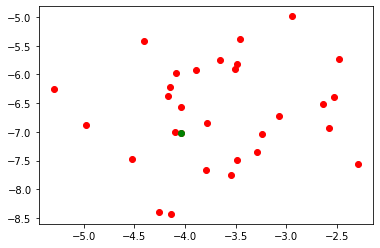

Power Allocated= 1.4269613988223302
CSI= 0.31240684535554697
SNR= 18.722954562983553
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.268934
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.521850

Power Allocated= 2.3419781057146336
CSI= 0.4374572831783743
SNR= 22.07531173612134
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.301883
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.811018

Power Allocated= 3.3747671765506215
CSI= 0.797990079870096
SNR= 22.210885999027276
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.208567
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.915590

Power Allocated= 2.269824378889555
CSI= 0.4240718071620354
SNR= 22.92905864233701
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.342098
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.635754

Power Allocated= 1.9218444702983137
CSI= 0.3695394381524417
SNR= 23.010645462754486
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	L

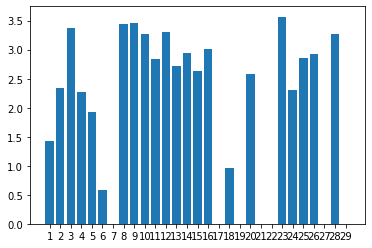

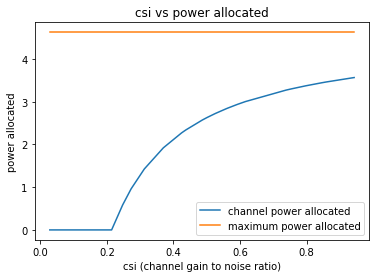

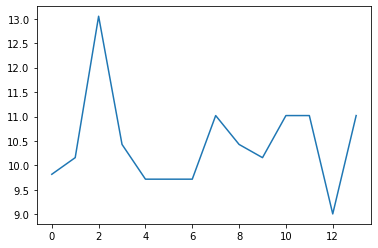

14
[2.5189364802530556, 2.658370882067792, 2.7381939013989394, 3.0798385983467282, 3.256865963654316, 3.636134511057941, 3.6463827875043897, 3.722637441482301, 3.764051596414507, 4.258869167404249, 4.586444596822531, 5.599358981926114, 5.974918076958243, 6.4348672685061175, 8.559172027358741, 20.64493556037852, 20.893099990489226, 22.097230274365078, 22.314083926817936, 22.521735744165582, 23.06059618630998, 24.956408512704783, 27.169685652373587, 29.11416078637443, 30.190795157860418, 30.436147780442354, 30.663886049978515, 33.12209809339422, 38.466992468523074]


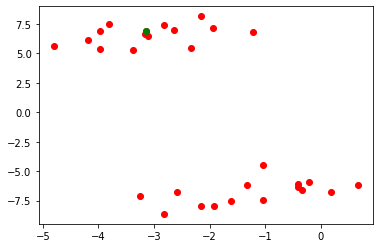

Power Allocated= 0
CSI= 0.052308479508870964
SNR= 2.5189364802530556
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1276784630277694
CSI= 0.6182360434437563
SNR= 2.658370882067792
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.045947576892278796
SNR= 2.7381939013989394
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13367772285928092
SNR= 3.0798385983467282
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5460279933033485
CSI= 0.8339201036297887
SNR= 3.256865963654316
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.203775
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.939870

Power Allocated= 0
CSI= 0.03097844096907454
SNR= 3.636134511057941
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06403369859086516
SNR= 3

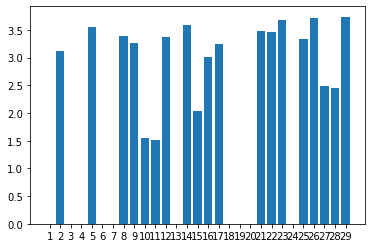

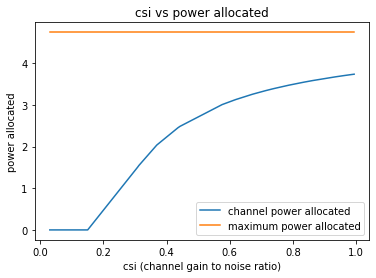

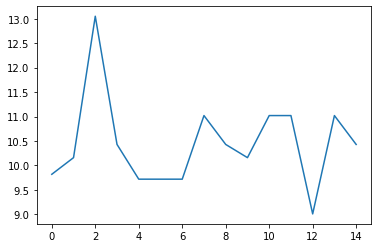

15
[-0.4199823225405037, -0.23690269956315646, 0.22302042222212393, 0.2554375460332352, 0.5057762689027987, 0.6638101307318678, 1.5997353588639562, 1.9086981858223626, 1.944458132424268, 2.039089518477445, 2.559218347908909, 2.682540232435389, 3.0561692644655425, 3.3377217427222603, 3.3410657317229195, 16.017346785919038, 17.31649546025205, 17.750661316537325, 17.805080072028165, 18.824734559398745, 18.918808399339664, 19.021245603675894, 19.519442907053275, 20.065223552115388, 21.042830365574247, 22.24358155888013, 22.52514148840422, 23.07991889637952, 23.57652950875062]


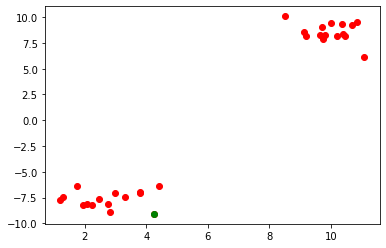

Power Allocated= 0.31772618002194797
CSI= 0.24957664624232245
SNR= -0.4199823225405037
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.351120
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.382965

Power Allocated= 2.070067783408325
CSI= 0.44356843683852154
SNR= -0.23690269956315646
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3127578256968953
CSI= 0.9883830355213217
SNR= 0.22302042222212393
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.266460628073828
CSI= 0.9451342907967129
SNR= 0.2554375460332352
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.121393624275389
CSI= 0.8311738702363827
SNR= 0.5057762689027987
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.986321075602735
CSI= 0.4276811940453653
SNR= 0.6638101307318678
Client: client7
Poor Channel, client not taken for averagi

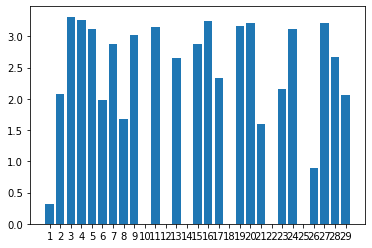

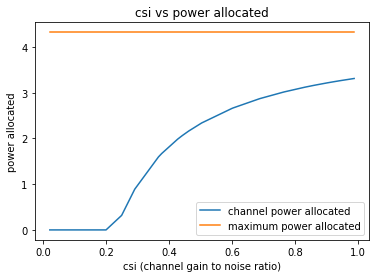

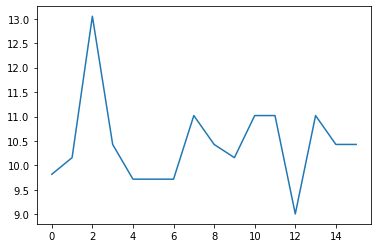

16
[10.310847915466045, 10.673230784836889, 11.357238429093805, 11.369507374798186, 11.46771386875372, 12.753089693510667, 13.427455641788963, 13.621751505905985, 14.421007430168029, 14.818521327588236, 14.855204751408214, 15.910627259313358, 16.384251095811283, 16.537572471957084, 16.584177392330258, 16.917536975814677, 20.22847676202445, 20.296422386794095, 21.684784269423822, 22.000837404779293, 22.140055725566278, 22.299198528489647, 22.439203322122864, 22.859574732012824, 23.243472131514295, 23.585512875561697, 23.689171239615376, 26.275507545173816, 35.1577596693441]


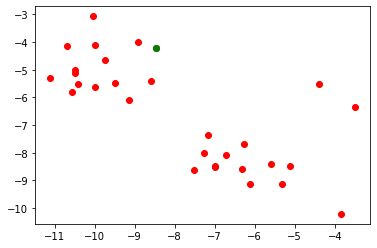

Power Allocated= 1.7157755749825414
CSI= 0.3624109843949813
SNR= 10.310847915466045
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.344412
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.340663

Power Allocated= 3.0153256088951066
CSI= 0.6850496404580788
SNR= 10.673230784836889
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.315201
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.637193

Power Allocated= 2.196168067827866
CSI= 0.4388070857396953
SNR= 11.357238429093805
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0752179456680966
CSI= 0.2941301135862887
SNR= 11.369507374798186
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.514167
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.426505

Power Allocated= 0.5630152509082946
CSI= 0.255619893606883
SNR= 11.46771386875372
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2813448183538787
CS

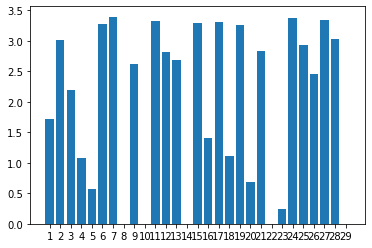

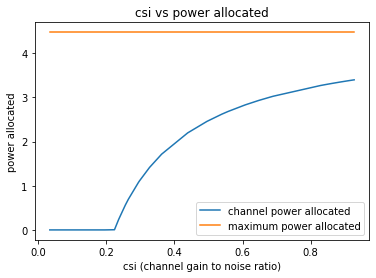

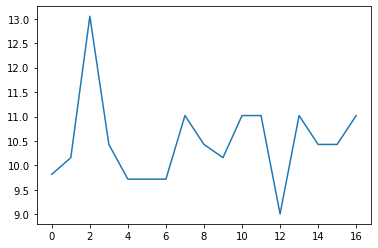

17
[0.9643652417751003, 1.5868421722903472, 1.6892183902302618, 1.8663950450053606, 2.461671812882261, 2.7972133564985038, 2.9502986785430485, 3.2681664715227057, 3.6210282507315283, 4.102146973218382, 4.212891621134034, 4.313856393712051, 4.335177983887492, 5.470119974429217, 5.612735405059779, 18.77203863275712, 19.360084475049867, 21.62308507140139, 22.07324112730628, 22.52157112084865, 22.89784592243832, 23.53275361054969, 23.62484321888272, 25.639586977711954, 25.654305414027263, 26.382179554414734, 26.483806356396478, 30.127202783285103, 30.690703280478466]


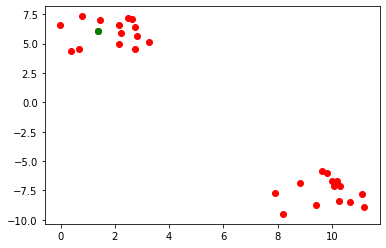

Power Allocated= 2.5428904186947126
CSI= 0.4788229710377472
SNR= 0.9643652417751003
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.406079683542614
CSI= 0.44938462771683974
SNR= 1.5868421722903472
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.360454
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.561654

Power Allocated= 3.1639673405749225
CSI= 0.681487845145806
SNR= 1.6892183902302618
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9524673881045045
CSI= 0.373290671062005
SNR= 1.8663950450053606
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09060800835688043
SNR= 2.461671812882261
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5073510837754043
CSI= 0.889684576275997
SNR= 2.7972133564985038
Client: client6
Poor Channel, client not taken for averaging in this round

Power

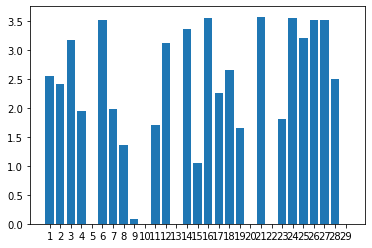

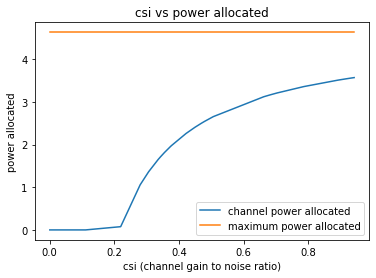

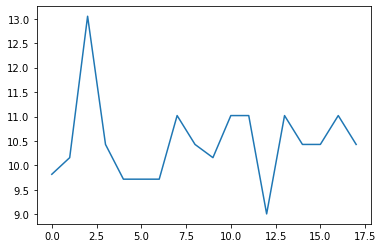

18
[2.995670868982783, 3.4063998681733807, 3.525807685096914, 3.7051349146193946, 4.05132000355761, 4.108798618536381, 4.1527104409516635, 4.849330813116387, 5.650841344666917, 6.035347528016722, 6.17773241025702, 6.190457784006081, 6.827110281270773, 6.874680137578758, 7.444573220839535, 18.918793276316745, 20.53890122404674, 21.824016378794678, 23.098749579868514, 23.46857394263173, 23.490032318119404, 23.583286199605663, 24.352168748056506, 25.47308655845883, 26.915319856288626, 27.86548960142283, 28.141896038756144, 30.108481418614407, 39.08337044867104]


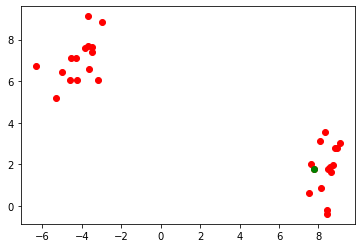

Power Allocated= 2.8201785597824136
CSI= 0.6987335953597759
SNR= 2.995670868982783
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5710729319854457
CSI= 0.3730972636712474
SNR= 3.4063998681733807
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3379499392981447
CSI= 0.5226328145851242
SNR= 3.525807685096914
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8073291099587534
CSI= 0.29035919815341227
SNR= 3.7051349146193946
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.781950
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.705020

Power Allocated= 2.4704152942544795
CSI= 0.5615063128672194
SNR= 4.05132000355761
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.062839782463727
CSI= 0.8413971508434325
SNR= 4.108798618536381
Client: client6
Poor Channel, client not taken for averaging in th

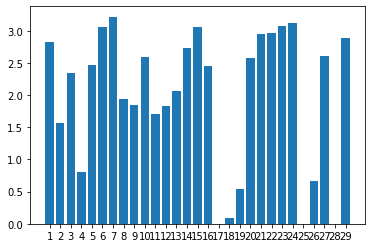

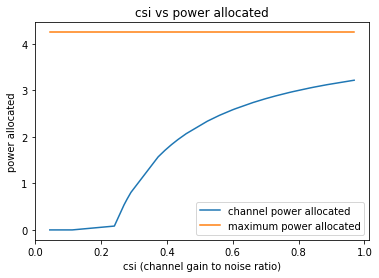

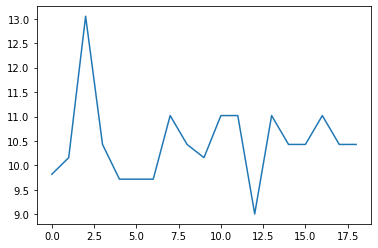

19
[3.3029542574492226, 3.6558722135451474, 4.276851764547352, 6.087304287083289, 6.2973442122974905, 6.302289225668922, 6.419458347023415, 6.7269344367933455, 7.2840234789377325, 7.431983712641255, 7.460382295843308, 7.548056286160926, 7.564038822678474, 7.671942495569294, 8.050978907678005, 15.332917979305243, 16.267144911345298, 17.34661160727064, 18.05040884504735, 18.60854953382084, 20.443522720081223, 21.657796337811142, 21.65944200959736, 23.403059769339492, 24.754691276347415, 26.38234986214443, 28.036209778923865, 33.06736096466086, 33.234061113753874]


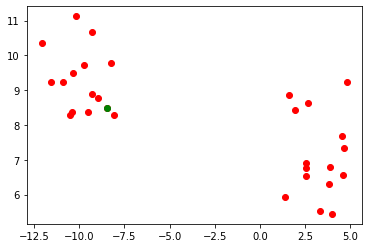

Power Allocated= 0
CSI= 0.046023878041616006
SNR= 3.3029542574492226
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5901805357392877
CSI= 0.7211910700598733
SNR= 3.6558722135451474
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7788486673325674
CSI= 0.8347754336430228
SNR= 4.276851764547352
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.760825690463812
CSI= 0.8224022776124872
SNR= 6.087304287083289
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.489561863546199
CSI= 0.6723982942745994
SNR= 6.2973442122974905
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8477517747016439
CSI= 0.4696988234121229
SNR= 6.302289225668922
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7003797545160504
CSI= 0.7834559943016216


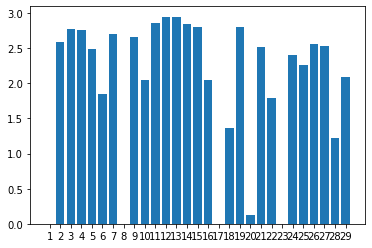

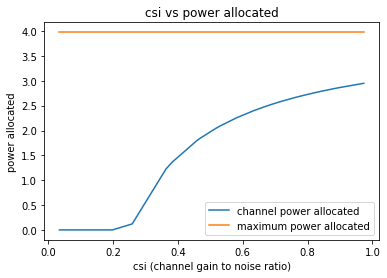

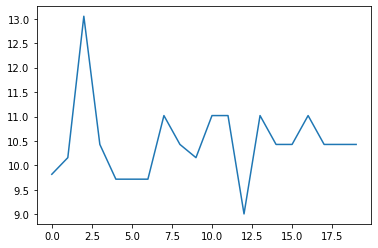

20
[7.755605457839129, 9.577031838379186, 9.963483237369779, 10.25229190290895, 10.515402669614211, 10.679510831247804, 10.823767636803439, 11.091347542305776, 11.309240130574054, 11.672300626089577, 12.248112412790485, 12.83187961075911, 13.198212237355534, 14.145126101182921, 14.560236230422978, 17.99202280603992, 18.340488845150634, 18.546715978802993, 20.15206341533188, 20.410863681244685, 21.13007192117337, 22.273851660344302, 23.03095914909619, 24.021387105558873, 25.20144096859615, 26.67132806382468, 28.414946557421185, 28.551110828580168, 31.564181905830388]


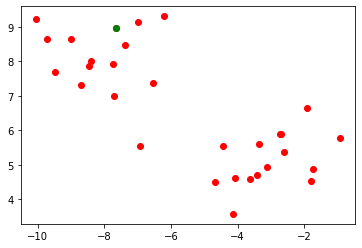

Power Allocated= 0
CSI= 0.12249085587628994
SNR= 7.755605457839129
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08003631541828715
SNR= 9.577031838379186
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5906315872794403
CSI= 0.2730732563734083
SNR= 9.963483237369779
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.327169
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.396393

Power Allocated= 0
CSI= 0.17447168164144777
SNR= 10.25229190290895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6096854413641775
CSI= 0.3783626295481637
SNR= 10.515402669614211
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.281010
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.833493

Power Allocated= 3.2109898473693534
CSI= 0.4897968598516135
SNR= 10.679510831247804
Client: client6
Poor Channel, client not taken for averagi

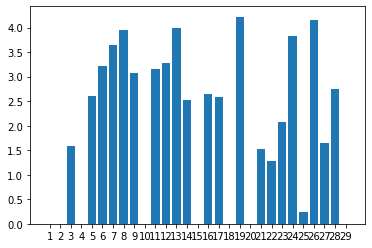

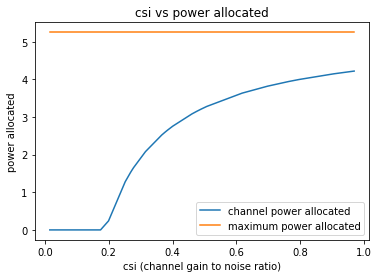

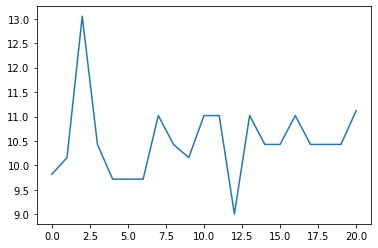

21
[6.0055459040742765, 6.357386479144425, 6.6232054131885, 6.670199111390167, 6.771186398300748, 7.286798814549487, 7.426418104382118, 7.427102578030529, 7.510838196101009, 8.828369364174147, 9.259086211491104, 9.900461181149517, 10.49251721239781, 11.485943036387049, 11.735553540808924, 19.09851470507204, 20.995502733547738, 21.366317515143262, 21.659889668783975, 21.997046108308503, 22.193678103811546, 23.791824619831722, 26.090549566238003, 28.322328907318678, 28.325693076151985, 29.3788139273116, 29.93857466161496, 32.982288196908534, 36.328546480170026]


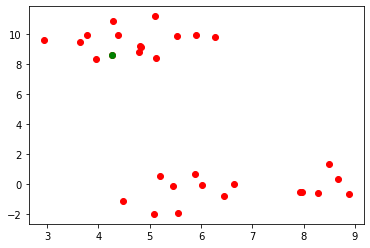

Power Allocated= 3.4126439405743856
CSI= 0.6963419776089348
SNR= 6.0055459040742765
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.756450354466349
CSI= 0.47794988174580466
SNR= 6.357386479144425
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.490058
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.384705

Power Allocated= 2.944151551509421
CSI= 0.5250533439105682
SNR= 6.6232054131885
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2313911261754185
CSI= 0.3820689229058185
SNR= 6.670199111390167
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8135882035531434
CSI= 0.9660606150728425
SNR= 6.771186398300748
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.544955709050258
CSI= 0.7670098456790053
SNR= 7.286798814549487
Client: client6
Poor Channel, client not taken for averaging in this r

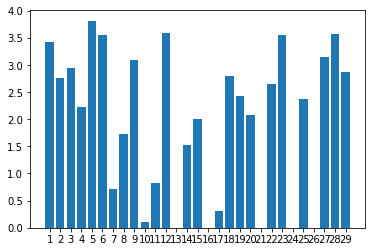

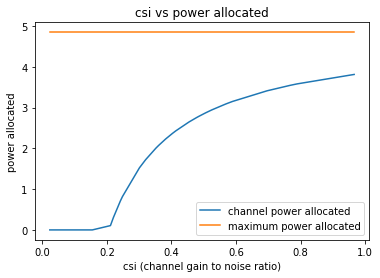

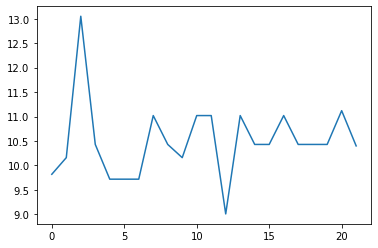

22
[4.505609715306479, 4.508822235858606, 4.552648493239078, 5.155152179076534, 5.4829715769963565, 6.169880290771399, 6.337771437888538, 6.347037707241304, 7.19263290756718, 7.582784142749283, 8.167916385739257, 8.527112003291343, 8.9610850290968, 9.465674347821235, 9.759050466454386, 18.87923625128338, 20.480589578188187, 20.707889850845298, 21.271442657240428, 22.749708251052454, 22.824646037201077, 23.524794448918527, 25.013944280089238, 27.93020019839499, 28.915700782455723, 29.521078385455954, 32.53226318978738, 33.17995659100307, 33.98232392809261]


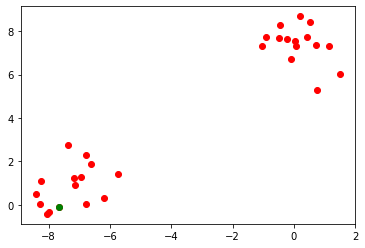

Power Allocated= 0.7867366636076376
CSI= 0.260075500044063
SNR= 4.505609715306479
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.440828
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.069865

Power Allocated= 0
CSI= 0.15903685882800744
SNR= 4.508822235858606
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8094692499575666
CSI= 0.2616222602309556
SNR= 4.552648493239078
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.052623180281266
CSI= 0.6332517495296607
SNR= 5.155152179076534
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8385851439172751
CSI= 0.35801374789482776
SNR= 5.4829715769963565
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3104859334209698
CSI= 0.7568372472515628
SNR= 6.169880290771399
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.559920
Model clie

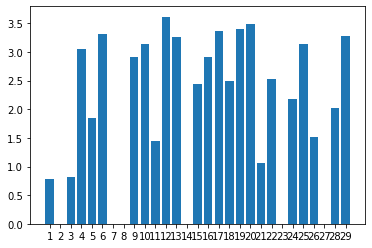

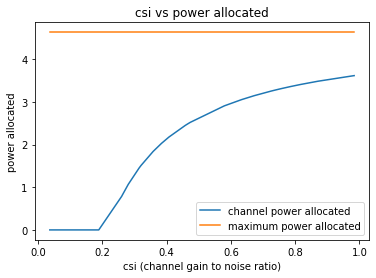

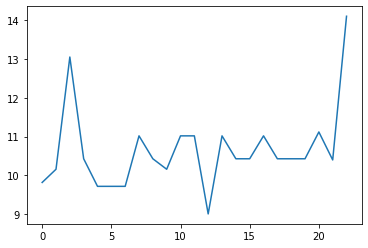

23
[2.9784963043634187, 3.2837111180236507, 3.3106083083073212, 3.345242954783057, 3.4223337092457395, 3.8441156072621965, 3.990682566337455, 4.558997917424657, 5.093144243290066, 5.205527627347356, 5.705753612934561, 6.566317481206584, 6.644379012887569, 7.127074830551466, 7.638552941415578, 13.593146335969465, 16.43798038292005, 17.220340962078392, 17.317813326069835, 17.76741995280512, 18.00744151836296, 18.772135694611254, 19.049494707358217, 19.637891240084752, 20.404423041131473, 20.440949743410556, 24.39593094258638, 27.329777275989024, 29.281349110086218]


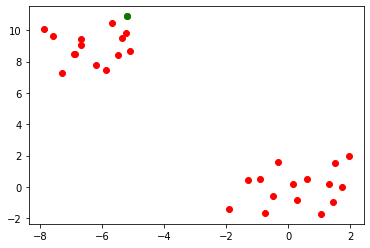

Power Allocated= 3.6051863840900906
CSI= 0.8093540079845482
SNR= 2.9784963043634187
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09193013671602734
SNR= 3.2837111180236507
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.685324129152157
CSI= 0.8654894875097101
SNR= 3.3106083083073212
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.051758024392988
CSI= 0.26392315794758436
SNR= 3.345242954783057
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.384161339950162
CSI= 0.2243873947809667
SNR= 3.4223337092457395
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.228624
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.114444

Power Allocated= 1.5001917106453715
CSI= 0.2993520864414192
SNR= 3.8441156072621965
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.468046
Model c

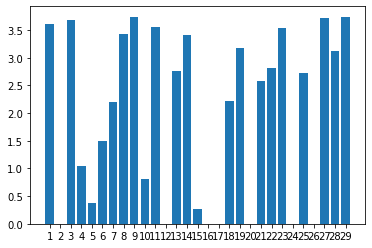

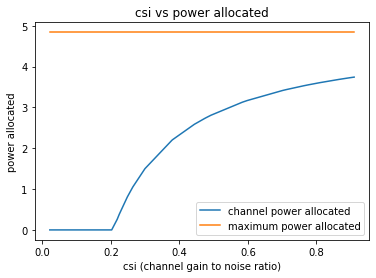

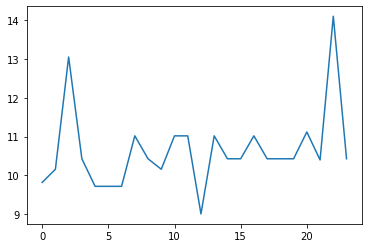

24
[0.20169322279394297, 1.088813830467343, 1.2185263991808366, 1.2679242895568765, 1.3395050655152865, 1.408102533156831, 1.760705637683723, 1.8177378067765835, 3.7628414163129458, 3.8037283286992394, 3.8991444220171942, 4.09343894907053, 4.648564458441773, 4.762407083014691, 5.060688380777971, 15.05031701100076, 17.179488749861946, 19.16836523774257, 19.53386406809378, 20.10642528247505, 21.5036083149325, 22.067133786960788, 22.576430217355092, 23.73511885338836, 27.25332567832638, 28.18694508169448, 29.718822783041944, 30.18101892997081, 40.95998858276344]


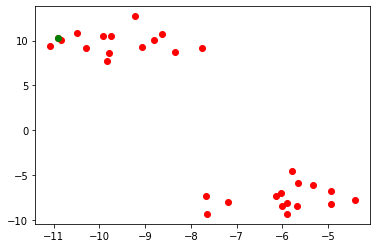

Power Allocated= 2.2196583878865694
CSI= 0.4470139181065219
SNR= 0.20169322279394297
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3896040105047303
CSI= 0.9371006886696026
SNR= 1.088813830467343
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8147525952110426
CSI= 0.2745764751621328
SNR= 1.2185263991808366
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.281913969359934
CSI= 0.8512005804381084
SNR= 1.2679242895568765
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00886661963242752
SNR= 1.3395050655152865
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1148253449531498
CSI= 0.745212094246448
SNR= 1.408102533156831
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8594666095825665
CSI= 0.6260727017204697

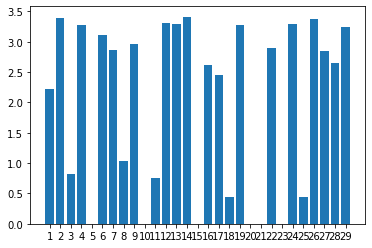

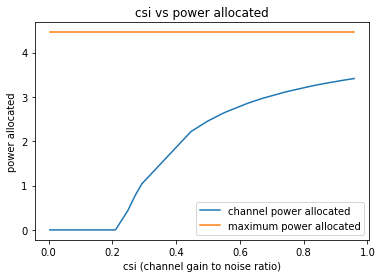

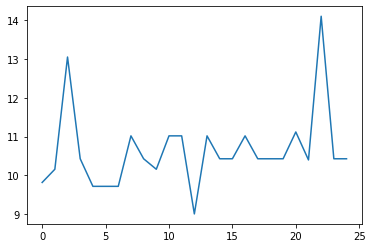

25
[6.469315808440002, 6.859907476866985, 7.052324656420269, 8.056305406674888, 8.77153741807902, 8.964419715305397, 9.685399352455462, 10.112895971561258, 10.483171848963424, 10.765913045631667, 10.950533122803604, 11.574562022928548, 11.853243251455764, 14.008471273838218, 15.282255365989808, 16.101797818372965, 20.055314110808602, 20.096012688824597, 22.2456137443191, 23.576102077934287, 24.055294684044704, 24.390677090230014, 25.746078890994443, 26.005333908530798, 26.792349541367592, 27.892209675866873, 30.61928896349243, 30.844876233486662, 36.06198754556104]


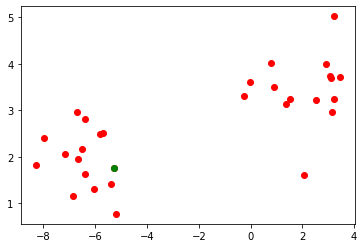

Power Allocated= 0
CSI= 0.1426284357989227
SNR= 6.469315808440002
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2002933229158366
CSI= 0.5486026370478368
SNR= 6.859907476866985
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1428749932964115
SNR= 7.052324656420269
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8337893942971837
CSI= 0.45676347834880937
SNR= 8.056305406674888
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.388480
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.780506

Power Allocated= 3.1082642725735363
CSI= 0.5222362949310714
SNR= 8.77153741807902
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5853557445129725
CSI= 0.4102142453789963
SNR= 8.964419715305397
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.255388

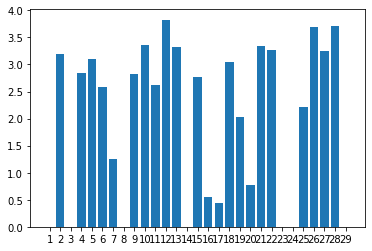

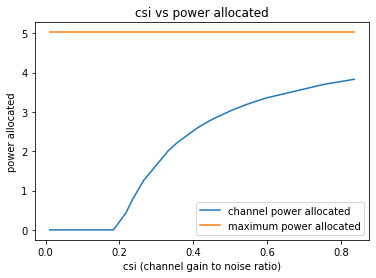

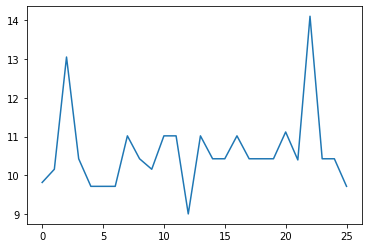

26
[0.5286815397885851, 0.8326875081411034, 1.6621526116213365, 2.463194574588175, 2.897133492442603, 3.223956100251732, 3.3966745097903157, 3.4715318707572473, 3.5057943983955036, 3.9596452207008, 3.976070180798844, 4.088205181285243, 4.207612659819302, 4.437153195316183, 5.108245375527609, 16.76945558932486, 20.648548115286854, 20.796773209701655, 20.920096613310765, 21.167900255370196, 22.1001565203815, 22.43912228003416, 22.891233467738104, 23.655809030063672, 23.99847858520988, 27.15741628695087, 28.15328494086791, 30.08574560126722, 38.85012811165028]


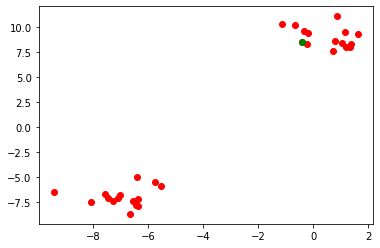

Power Allocated= 0
CSI= 0.045340641965600725
SNR= 0.5286815397885851
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06628439991163682
SNR= 0.8326875081411034
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3557216968529633
CSI= 0.8677255845760969
SNR= 1.6621526116213365
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0692787693627013
CSI= 0.41002410534742717
SNR= 2.463194574588175
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13392546056770926
SNR= 2.897133492442603
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9121872962297344
CSI= 0.38521209697671155
SNR= 3.223956100251732
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.436291
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.158297

Power Allocated= 1.09211370863003

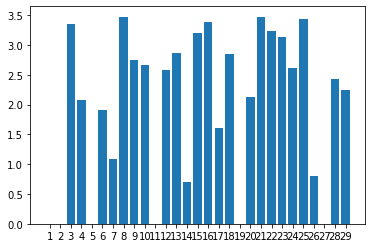

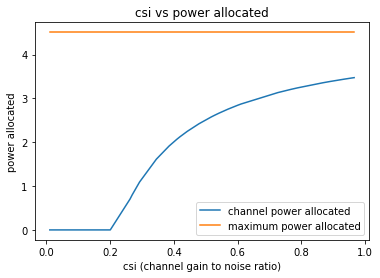

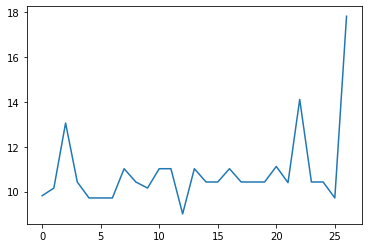

27
[1.7698937367685117, 2.7425972729013335, 2.771194680093636, 3.048723915515434, 3.2474101480107547, 3.807638964556351, 3.8770775427067283, 4.229497720093615, 4.729720304932323, 4.837404301188967, 4.999824593305677, 5.6476778399101555, 5.963887822074101, 6.139519919865508, 6.449770332183134, 13.156503118214594, 16.6185498789034, 19.16441344172808, 20.402284176654597, 21.03187754942273, 21.120228824992008, 21.222573653482954, 21.363198728307516, 23.01026355840922, 23.398934866336017, 23.550646315434975, 25.62165881004625, 26.99324951811367, 27.17288253888674]


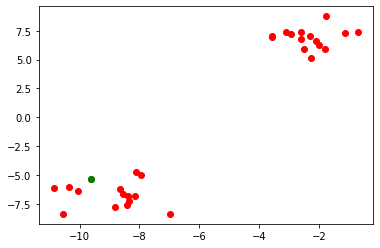

Power Allocated= 1.6964522354352307
CSI= 0.2909498881827649
SNR= 1.7698937367685117
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2741463382021383
CSI= 0.5378299104481026
SNR= 2.7425972729013335
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.795909676106334
CSI= 0.747629705566974
SNR= 2.771194680093636
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6081434797837089
CSI= 0.28366164955045314
SNR= 3.048723915515434
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8990940907466527
CSI= 0.2361622983146201
SNR= 3.2474101480107547
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.456485
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.232219

Power Allocated= 1.3743863752868961
CSI= 0.26602226493141456
SNR= 3.807638964556351
Client: client7
Poor Channel, client not taken for averaging in 

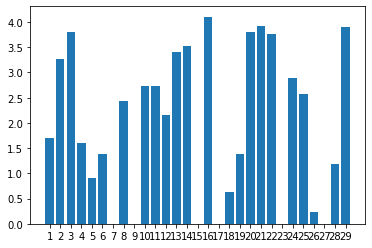

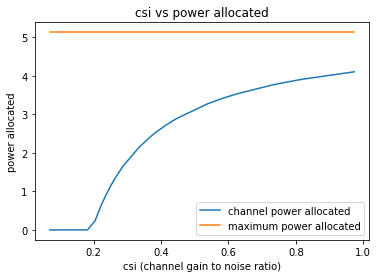

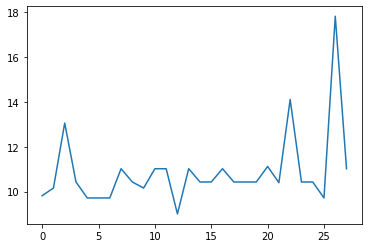

28
[2.518922141323138, 2.9406019462724267, 3.9975471397052402, 4.341995124694336, 4.752172102173659, 4.775989423572047, 5.303497615388684, 5.344369444845613, 5.76930625728359, 6.760812876466821, 6.927487790968728, 7.132199076800243, 7.240897673352556, 7.940996991644667, 8.16417846137487, 18.53592559141187, 18.555087100080748, 21.561159428611735, 21.77935009922205, 22.017209027031605, 22.430207879745158, 22.44345974013576, 22.448706828816576, 22.622660705727164, 24.54624660649206, 26.80859238837728, 27.449364625784817, 30.51253088068631, 30.706245091981827]


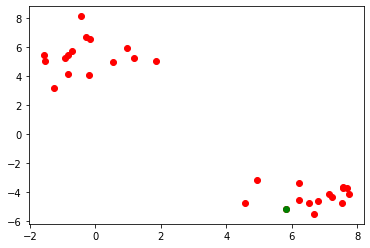

Power Allocated= 1.5108147268736531
CSI= 0.37490507350544955
SNR= 2.518922141323138
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06626180171219664
SNR= 2.9406019462724267
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6034084223952294
CSI= 0.6350221679439604
SNR= 3.9975471397052402
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.408863
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.647121

Power Allocated= 3.114643659947575
CSI= 0.9402800519571626
SNR= 4.341995124694336
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.914590564303787
CSI= 0.7914109542981818
SNR= 4.752172102173659
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.041013894388869154
SNR= 4.775989423572047
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.83

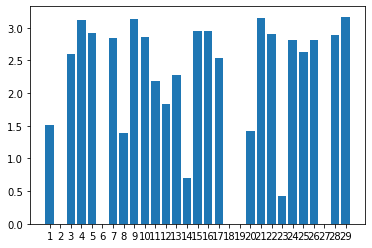

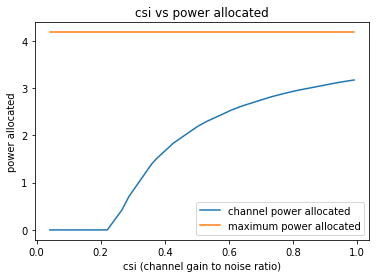

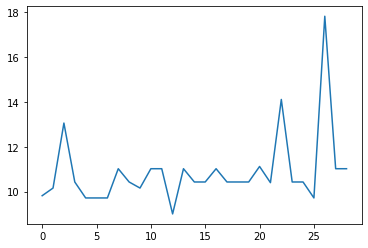

29
[6.2400334916732, 6.513028185476989, 6.605306119164436, 6.612156884844817, 8.720047575937244, 8.723755518088346, 9.238342651971731, 9.639229278668402, 9.714186183232322, 9.806636893463747, 10.11082583570469, 10.855835010115559, 10.914295179477097, 11.694074348030615, 13.502089327922066, 14.535624747071827, 17.249670670377853, 20.159439816128778, 20.317091930211948, 20.617957849288167, 20.926158373017465, 23.482559350274105, 23.951207638230926, 24.672062187158257, 25.450085421584227, 25.511231903639203, 26.004468344830812, 26.25863403687829, 28.935116966069508]


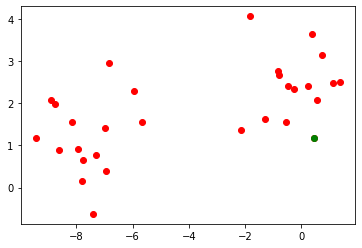

Power Allocated= 3.624610589821631
CSI= 0.8985293667925414
SNR= 6.2400334916732
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.543241
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.348818

Power Allocated= 3.033515088417249
CSI= 0.5868457880438442
SNR= 6.513028185476989
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.361236
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.201622

Power Allocated= 0
CSI= 0.17760448950220464
SNR= 6.605306119164436
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1311592111488404
CSI= 0.27728628337743044
SNR= 6.612156884844817
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.139855799432344
CSI= 0.6259058149401846
SNR= 8.720047575937244
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05165692735390803
SNR= 8.723755518088346
Client: client6
Poor Channel, client not taken f

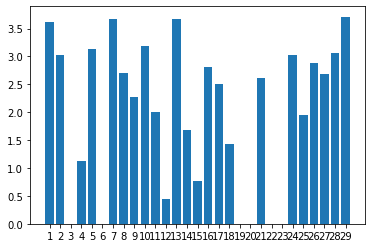

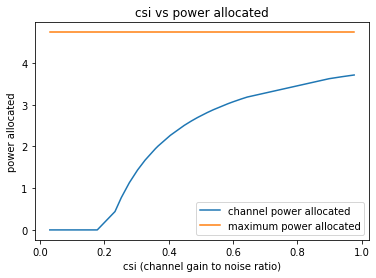

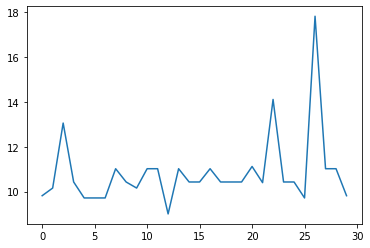

30
[7.131167613773895, 7.9144867892619155, 8.841220851188837, 10.040143919655387, 10.345649212783592, 10.661628001905619, 10.786218165827506, 10.951251526548386, 11.343743229663076, 11.897896383357537, 11.984393219838456, 12.117414295238603, 13.020929665740596, 13.481189151931078, 13.922283137122456, 14.399166944859633, 14.453194829155528, 15.943383863474839, 16.319801778331264, 16.839172951351124, 17.191165473292862, 17.26140474027007, 17.74220941491394, 17.84705168790452, 19.791499923294253, 21.437306783474394, 22.555159048404615, 29.38026233358152, 62.72733924419976]


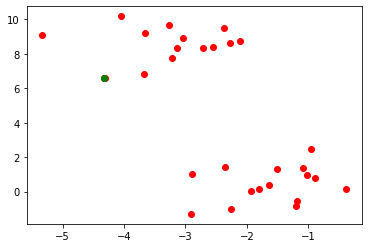

Power Allocated= 0
CSI= 0.12827721025595995
SNR= 7.131167613773895
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09359490261593473
SNR= 7.9144867892619155
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.894876359982933
CSI= 0.4558582752866458
SNR= 8.841220851188837
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.557141
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.886387

Power Allocated= 3.1732161318435166
CSI= 0.5221047468476612
SNR= 10.040143919655387
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.026128120841043
CSI= 0.9412539982798205
SNR= 10.345649212783592
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0794564970340762
SNR= 10.661628001905619
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1166771929913706
CS

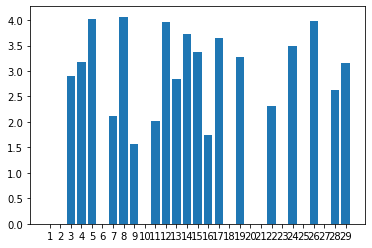

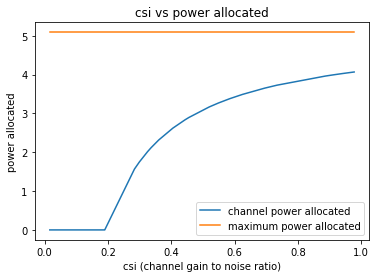

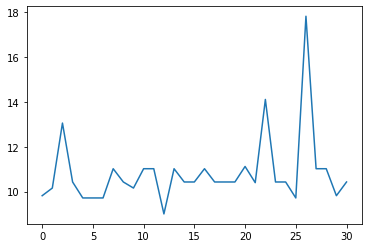

31
[-0.1601865439267005, -0.07289585644389263, 0.23963033021897928, 0.5231999657915347, 0.9194495729488343, 1.3192328582598591, 2.2115008845502064, 2.4456735311386057, 2.5223223808784367, 2.6289123319377676, 3.0598372812898753, 3.697397065026073, 4.113532401544848, 4.561887676824697, 4.605732833014663, 19.847365218606022, 21.362761855770753, 22.51362892190505, 23.831683235317072, 23.833136197671156, 24.93244856663991, 25.94423858604255, 25.9514351221035, 26.008882356398367, 26.2523426311214, 27.27442460500431, 28.998153693907113, 29.083237742492784, 29.503289266611443]


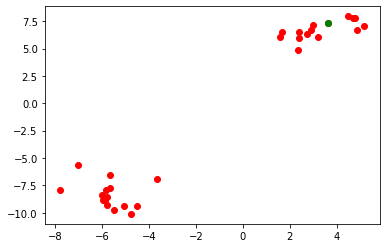

Power Allocated= 3.1276352467182895
CSI= 0.9823588125527147
SNR= -0.1601865439267005
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0228596123719247
CSI= 0.47109066800770616
SNR= -0.07289585644389263
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2848057533417014
CSI= 0.5374068829372158
SNR= 0.23963033021897928
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.218358
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.660418

Power Allocated= 2.1947566092400494
CSI= 0.5126005874130809
SNR= 0.5231999657915347
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.366107
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.272678

Power Allocated= 0
CSI= 0.0426630074738652
SNR= 0.9194495729488343
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.394707583336797
CSI= 0.5711395255293548
SNR= 1.3192328582598591
Client: client6
Poo

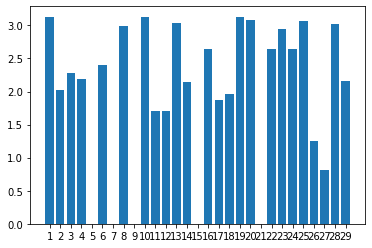

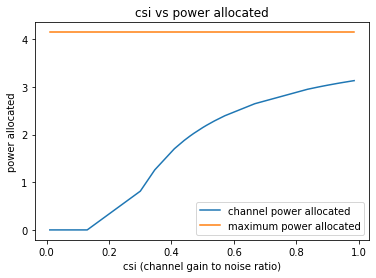

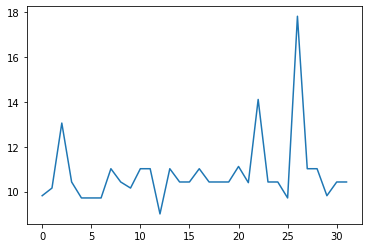

32
[7.739580230151612, 8.051606079056715, 8.384392252790542, 8.526259114682725, 8.541661824958453, 9.038330839292477, 9.289800884460051, 9.533133212059285, 9.637045446809495, 10.59728997276997, 10.746853708143073, 10.98477873193689, 10.985859488678877, 11.271192992531702, 12.88632245195951, 14.881240534891049, 15.232617252200148, 17.840647928223884, 18.593061310253844, 20.246630434476593, 20.3918299209527, 21.395646978161043, 22.17024251098402, 22.2473672291502, 22.74247269423386, 23.25165019002774, 25.76421997873812, 30.63669119701208, 31.237685346404717]


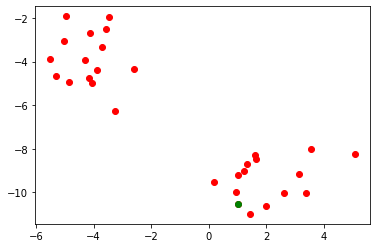

Power Allocated= 3.552480444111276
CSI= 0.6830254979201046
SNR= 7.739580230151612
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.899205455408892
CSI= 0.8949753778761042
SNR= 8.051606079056715
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.430141
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.899570

Power Allocated= 0
CSI= 0.011863361269836115
SNR= 8.384392252790542
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6537979926018878
CSI= 0.7338067358113711
SNR= 8.526259114682725
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.484778
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.044068

Power Allocated= 3.0356501213077047
CSI= 0.5048198918577382
SNR= 8.541661824958453
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6226968011776264
CSI= 0.2946499383164872
SNR= 9.038330839292477
Client: client6
Model client6

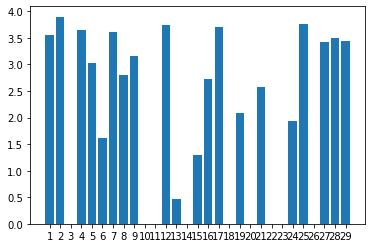

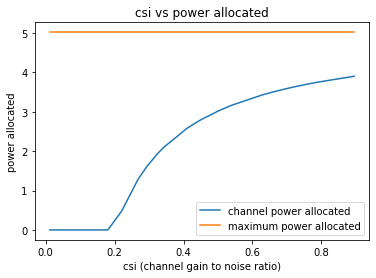

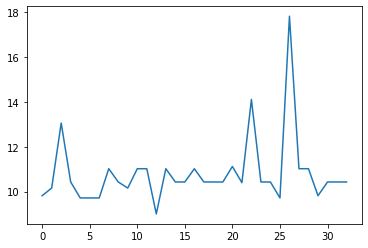

33
[6.739310605347953, 7.320582759917154, 8.12093976274473, 8.479232165153558, 8.578198615436886, 8.923929795351533, 9.494987087299021, 9.819622145153458, 10.166151680439286, 10.450641223924222, 10.510056092644128, 10.701494188000018, 12.058302459019718, 12.172098014896974, 12.355507912108267, 13.030910099202647, 14.245663607400283, 14.482820281321127, 14.674729988140959, 14.703153823203877, 14.898235824778348, 14.958294301786232, 15.05916030226659, 15.700622454571056, 16.431282821468812, 17.229057290148752, 18.040887613757533, 20.684718203355764, 22.79660275675235]


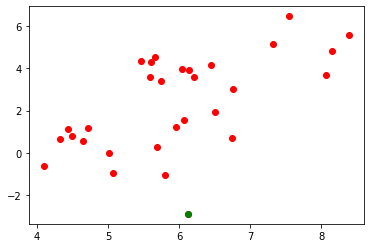

Power Allocated= 2.1898995876635063
CSI= 0.4123369531524702
SNR= 6.739310605347953
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.285206678769283
CSI= 0.7519396676101061
SNR= 7.320582759917154
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4492636076433194
CSI= 0.3158722320543641
SNR= 8.12093976274473
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5887741317477806
CSI= 0.974348827566652
SNR= 8.479232165153558
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3637073386023317
CSI= 0.4441694008161231
SNR= 8.578198615436886
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.703683616301208
CSI= 0.5231720779497477
SNR= 8.923929795351533
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.005527215883901
CSI= 0.62128263

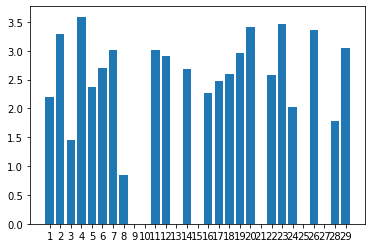

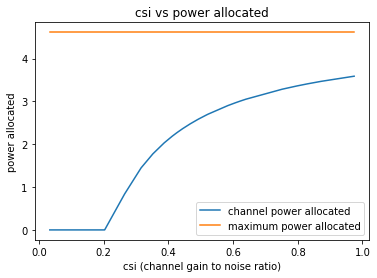

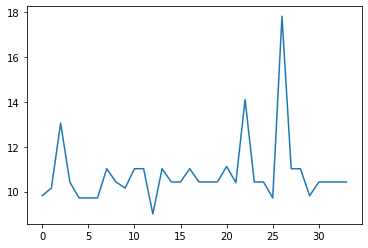

34
[7.458166046734591, 8.591074199784424, 9.902570438547134, 10.12008078817115, 10.433566327539266, 10.721291346712983, 10.819579305678012, 11.359480688648762, 11.672421877665462, 11.774215028968475, 11.98051878915522, 12.363579535236804, 13.684291039532148, 14.157058216450277, 14.40435224526521, 14.924964127194016, 16.366239999369572, 16.495824452928222, 18.11079967323328, 18.204158852812515, 19.62185394237411, 19.80769398633987, 20.817754121676625, 20.925266588524753, 22.73411337984556, 22.765520550807786, 22.99670274828707, 23.0472575232609, 23.62616030822722]


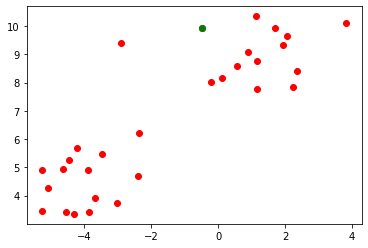

Power Allocated= 3.368787393412071
CSI= 0.7782265625296652
SNR= 7.458166046734591
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.474270
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.242793

Power Allocated= 3.563446001103284
CSI= 0.9171667817490332
SNR= 8.591074199784424
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.184808213821025
CSI= 0.6807574266240226
SNR= 9.902570438547134
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.772798502483143
CSI= 0.531642925516577
SNR= 10.12008078817115
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.316728
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.568993

Power Allocated= 2.9932706177262896
CSI= 0.6022320089365083
SNR= 10.433566327539266
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4347992972348296
CSI= 0.45066138006565637
SNR= 10.721291346712983
Client: client

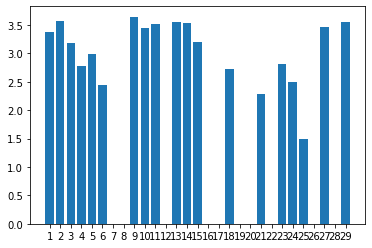

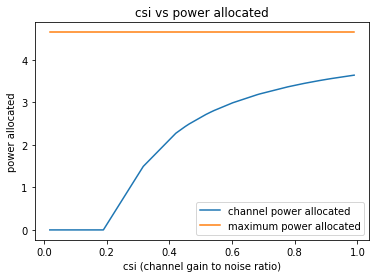

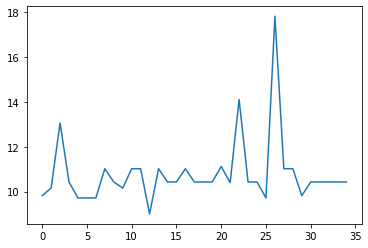

35
[2.302694039948191, 2.404403842308551, 2.441293802937894, 2.8638105008587322, 2.902605224362052, 3.4856074740013705, 3.5727095537845406, 4.354983844577878, 4.487592188538013, 4.687572916038415, 5.519306025077535, 5.7304025503761356, 5.80934730332987, 6.236460903919211, 6.419815521960355, 18.70770243878262, 19.39089430356366, 19.87914794546038, 21.184712011708363, 21.553374959690988, 23.574841568765123, 23.669987060760736, 24.34467514062158, 26.4102161482395, 27.29976761667023, 27.915496078467218, 28.760910862559275, 35.68328215065558, 35.97219467947652]


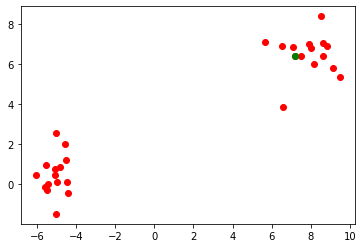

Power Allocated= 2.3426379197474048
CSI= 0.5218373641327299
SNR= 2.302694039948191
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6285408863732007
CSI= 0.613345328763543
SNR= 2.404403842308551
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0005597571075113
CSI= 0.7946699737634617
SNR= 2.441293802937894
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2099869316939076
CSI= 0.9533280608854273
SNR= 2.8638105008587322
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.116954513269976
CSI= 0.4668557469569995
SNR= 2.902605224362052
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21237533272505216
SNR= 3.4856074740013705
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8218886763711217
CSI= 0.41033130425072406
S

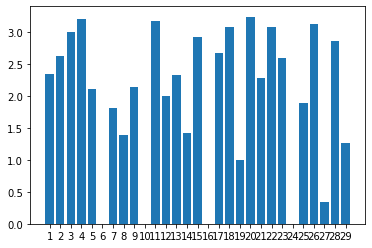

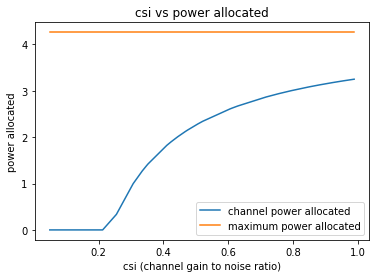

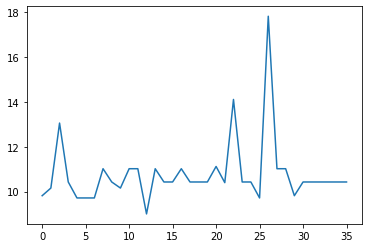

36
[1.0881712423988548, 1.3078808739399594, 1.3137834337998573, 2.1458763930979714, 2.448660814744615, 3.0826501714425856, 3.2010389518663773, 3.231058515728193, 3.3716421918771475, 4.156492601097293, 4.7886581104151995, 5.168886478758493, 5.322794489889343, 5.7485943997031494, 6.070235398363935, 13.690403655022404, 15.905328447303248, 17.623158107259364, 19.690038375018588, 19.96164343646463, 19.995658267528643, 21.22736751741225, 21.349377887162074, 21.969532178360726, 22.22697543375323, 24.524813319839325, 26.02351972769982, 28.52405579690923, 30.425112145056023]


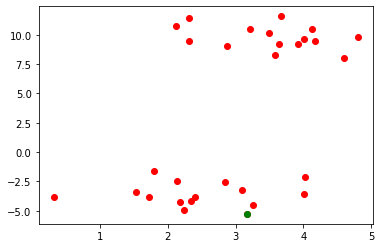

Power Allocated= 3.1950486274020697
CSI= 0.9210025783794396
SNR= 1.0881712423988548
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2453711003485353
CSI= 0.96576291518405
SNR= 1.3078808739399594
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339814
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.017947

Power Allocated= 3.076117928798027
CSI= 0.8300794295711192
SNR= 1.3137834337998573
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06609380648729712
SNR= 2.1458763930979714
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8392908683665574
CSI= 0.693706875330237
SNR= 2.448660814744615
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.228974325513757
CSI= 0.48736563268889865
SNR= 3.0826501714425856
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.394582
Model cli

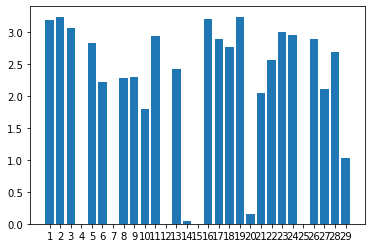

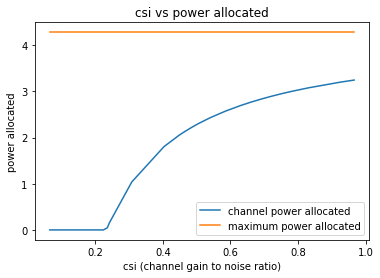

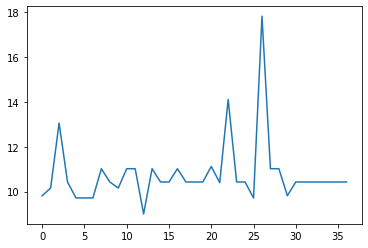

37
[1.6890021448992156, 1.863170817172274, 3.375832733255794, 3.756609179766027, 3.9788748006361097, 4.005198236464283, 4.046482508401703, 4.1006289743025395, 4.925116950895593, 4.935762605158881, 5.629198400059091, 5.970470253265993, 6.017280342087323, 6.701325949104719, 6.710077398904501, 13.499949502763219, 13.845283742949881, 14.715894095073821, 14.896553987359294, 15.339596431519057, 17.388628358402638, 20.123857922759402, 20.364901118874684, 20.909945380527738, 21.442923033047705, 21.545564420423084, 22.563864489056115, 29.816156790147133, 30.479306302799262]


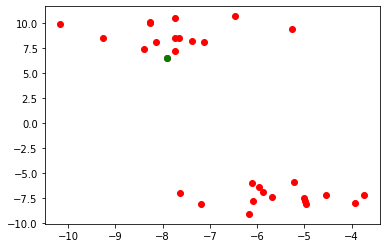

Power Allocated= 2.9822209666229353
CSI= 0.8636473168432529
SNR= 1.6890021448992156
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.539432
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.102944

Power Allocated= 2.5117619502479696
CSI= 0.6141227091571088
SNR= 1.863170817172274
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22664477518549975
SNR= 3.375832733255794
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09068737857970821
SNR= 3.756609179766027
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0122937845528335
CSI= 0.8866763485200327
SNR= 3.9788748006361097
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.378619
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.335492

Power Allocated= 0
CSI= 0.10979490579218842
SNR= 4.005198236464283
Client: client6
Poor Channel, client not taken for averagi

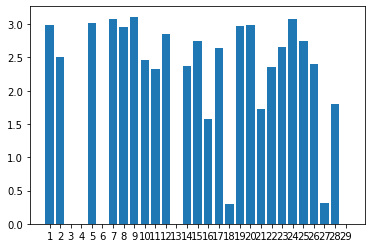

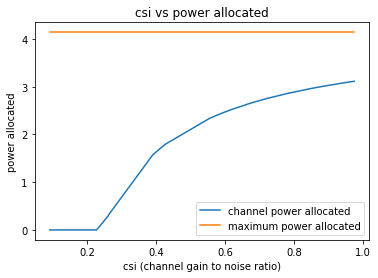

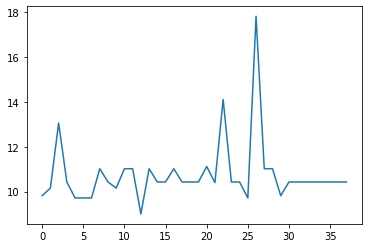

38
[1.8067212980706913, 2.570616245995268, 2.699814833428591, 2.7501869434365425, 2.8147466874882148, 3.2206276157731537, 3.485967638595517, 3.596347052682765, 3.782589528027884, 3.8253519225626724, 4.018339847006642, 4.317054208054529, 4.4552226393978716, 5.570228409470966, 5.5720659191845785, 18.87025319787879, 22.270253036519108, 23.709822249339844, 24.460361855468562, 25.943200293097515, 26.45522761256403, 26.507462110078137, 26.730968801319584, 27.922914650395196, 29.005643689519726, 30.662256682881605, 30.976057980691145, 33.135177605632336, 48.15643220324739]


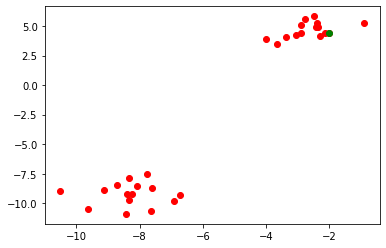

Power Allocated= 0
CSI= 0.10957479034389694
SNR= 1.8067212980706913
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2647694873507684
CSI= 0.4353773528291135
SNR= 2.570616245995268
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15073657668839213
SNR= 2.699814833428591
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1620353350096858
SNR= 2.7501869434365425
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11089075676543692
SNR= 2.8147466874882148
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8663916835200216
CSI= 0.37102503646125284
SNR= 3.2206276157731537
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.429466
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.163502

Power Allocated= 3.2252145793869857
CSI= 0.74827167

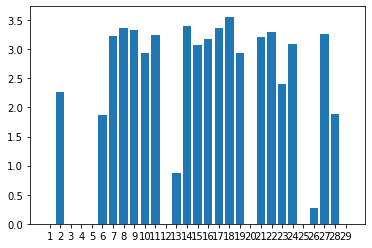

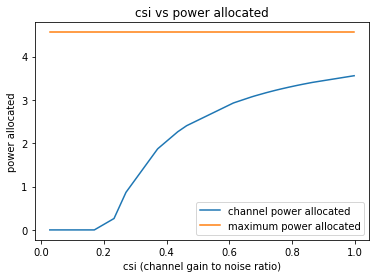

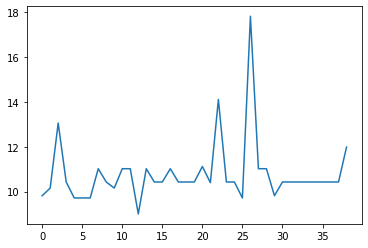

39
[1.6583241125090549, 2.7496485852262644, 3.253074881403257, 3.50635886017907, 3.673806650886242, 3.8735853210139704, 3.898738526133536, 3.9958284398720734, 4.182904974933064, 4.447837935598907, 5.041363314829577, 5.150078205903097, 5.219239566262793, 5.529283899760933, 5.9849767743381435, 17.554146780771973, 19.50775147161642, 21.64206064185676, 22.475450173202074, 24.70588154249577, 25.767722167423457, 26.391764926179583, 26.402216709459644, 28.323175259989156, 30.14366800395756, 31.69583352923134, 33.087511203956645, 34.20499951802622, 34.518298981202996]


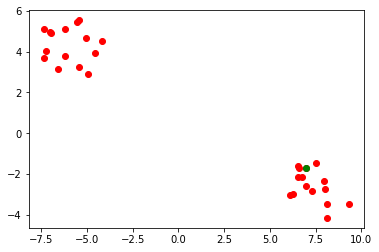

Power Allocated= 0
CSI= 0.07092709775329764
SNR= 1.6583241125090549
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.406280760570225
CSI= 0.918350060052151
SNR= 2.7496485852262644
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.526061
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.932433

Power Allocated= 2.842834395191412
CSI= 0.6051965499449257
SNR= 3.253074881403257
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12927976954877718
SNR= 3.50635886017907
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.007584695134919217
SNR= 3.673806650886242
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.435401805795018
CSI= 0.9435846400175047
SNR= 3.8735853210139704
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.425289
Model client7 Train Epoch: 2 [0/320 (0%)]	L

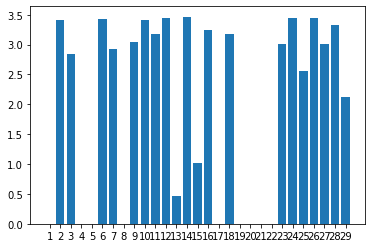

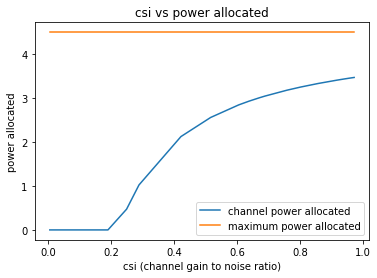

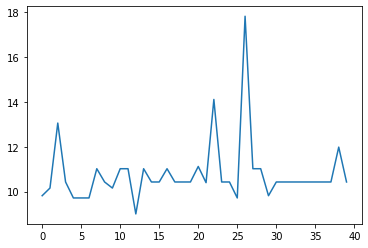

40
[6.735003143733918, 6.9222325614785625, 6.964854413103396, 8.34711477766857, 8.860874398436984, 9.099844470019189, 9.953573862558358, 10.059343045364185, 10.556143985009564, 10.601411550257364, 10.808208270880124, 11.206366746161603, 12.257435449967868, 13.246600078739013, 13.607337223274167, 15.652365576039701, 18.541250415896524, 18.6145549231138, 19.8192943151174, 22.538197935730537, 24.449856113603563, 27.203034645928227, 27.481683957149734, 29.98129766158147, 30.28387273994424, 31.90135213547025, 33.82131704265131, 34.43710158497236, 36.90644823880592]


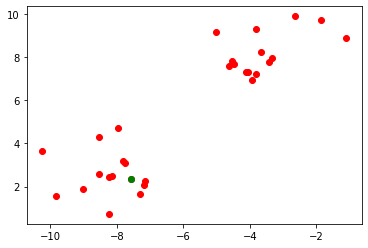

Power Allocated= 2.7021546536279284
CSI= 0.668765118739942
SNR= 6.735003143733918
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.652465
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.116026

Power Allocated= 2.428469541178717
CSI= 0.5652980240363287
SNR= 6.9222325614785625
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1842862399506151
SNR= 6.964854413103396
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.908127450789772
CSI= 0.775602341959209
SNR= 8.34711477766857
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9288624523514484
CSI= 0.7882795448601633
SNR= 8.860874398436984
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07375730472979558
SNR= 9.099844470019189
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.849418160

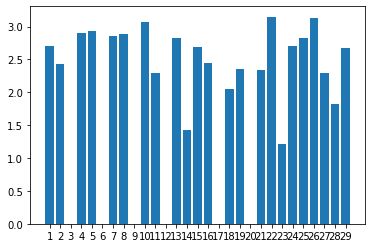

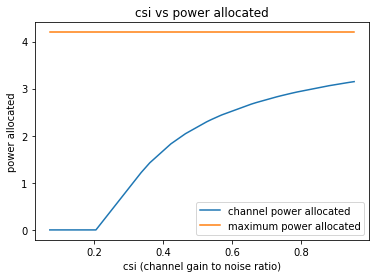

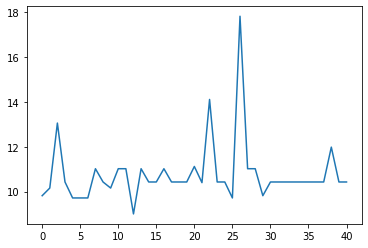

41
[5.473424202653558, 5.5387582706144745, 6.491546642673262, 6.750073724862544, 6.923915217530307, 8.081808402096659, 8.170837314716248, 8.358160379246378, 8.561906568175395, 9.07636151389206, 9.380767464193166, 9.65599526374773, 9.79335772492203, 10.140171635858996, 10.740189305011185, 16.76029372903269, 17.873599854241885, 19.02251401970181, 21.246229086687784, 22.61279608071011, 23.300999694746146, 23.498567516727352, 25.68887119051067, 25.700611734080848, 26.379068369085648, 28.68167423163146, 30.87105541161971, 31.047568240521308, 32.02827543869382]


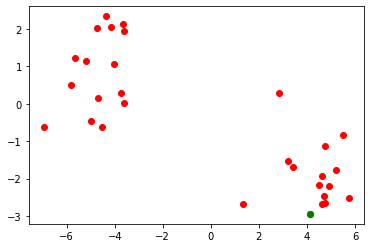

Power Allocated= 0
CSI= 0.08434230530350784
SNR= 5.473424202653558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06881539011640558
SNR= 5.5387582706144745
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.390808809148462
CSI= 0.7207030799118379
SNR= 6.491546642673262
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.413896
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.546539

Power Allocated= 0
CSI= 0.08008175378770965
SNR= 6.750073724862544
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.708296081558803
CSI= 0.9345386604094824
SNR= 6.923915217530307
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.345186
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.231782

Power Allocated= 0
CSI= 0.15596768707577002
SNR= 8.081808402096659
Client: client6
Poor Channel, client not taken for averaging in this round

P

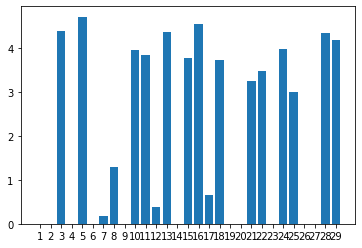

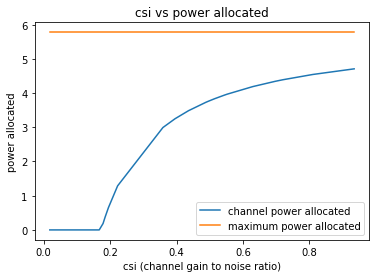

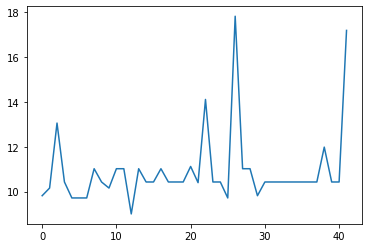

42
[5.826324647261521, 6.905072568713164, 8.28984962233562, 8.323733429070618, 8.863205566924533, 8.928787319011983, 9.123981094570551, 9.196914475840813, 9.353771526303477, 9.53003826322114, 9.696855544581366, 9.81483827184358, 9.933271810987078, 10.070396721202538, 10.292254321911265, 17.877751588287357, 18.76952612040451, 19.24063050985593, 19.257035358202163, 20.08346327056973, 22.439828239436032, 22.452114512352406, 23.855084158886235, 23.863047559816486, 25.633398501689392, 26.464766741294746, 28.523871499494955, 30.143641927049114, 32.503012493125475]


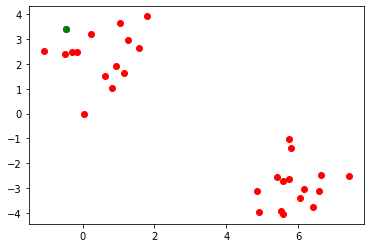

Power Allocated= 2.9719415351292264
CSI= 0.6599874071773372
SNR= 5.826324647261521
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05277496180481667
SNR= 6.905072568713164
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5319292316995257
CSI= 0.25283218004801145
SNR= 8.28984962233562
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.337426
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.386315

Power Allocated= 0.6308856734224233
CSI= 0.2593202090564619
SNR= 8.323733429070618
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.805504
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.169836

Power Allocated= 0
CSI= 0.13016422136424433
SNR= 8.863205566924533
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7455271532926284
CSI= 0.5741863699655714
SNR= 8.928787319011983
Client: client6
Poor Channel, client not tak

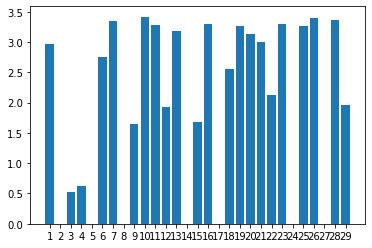

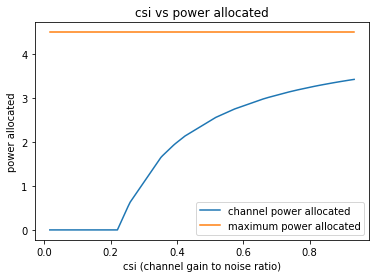

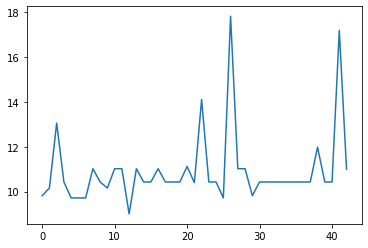

43
[10.823204665777592, 11.71145912840242, 12.63333642806543, 12.73362680139903, 12.879626283347939, 13.222700419410224, 13.319621196322778, 13.327873110840782, 13.895135599428631, 14.316736215382432, 14.36231906568751, 14.68298484469975, 14.772480476176092, 14.833638365205307, 14.920229100594204, 14.937454901761432, 15.969106757724223, 16.1594739777426, 16.85081807661071, 17.801596309754135, 17.820764943572314, 18.501646603199234, 19.03172142369106, 20.153554142925078, 20.26554534403396, 20.743747690176903, 21.362976991550404, 22.438410914787372, 25.569129609587808]


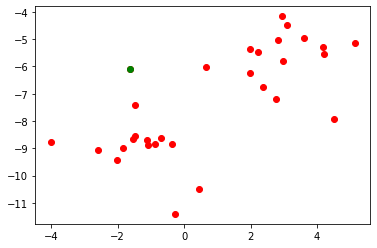

Power Allocated= 1.8639030823223637
CSI= 0.3377289220430494
SNR= 10.823204665777592
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.465085
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.296693

Power Allocated= 2.2834091001653416
CSI= 0.39347638711566035
SNR= 11.71145912840242
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1448096000652876
CSI= 0.5952210653136797
SNR= 12.63333642806543
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.237838
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.343489

Power Allocated= 3.5152772586506202
CSI= 0.7636033601710208
SNR= 12.73362680139903
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.414488
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.912163

Power Allocated= 3.009246061770746
CSI= 0.5507785901376353
SNR= 12.879626283347939
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.331267507220959
CSI

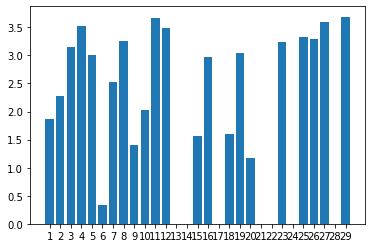

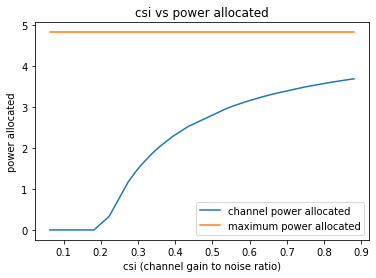

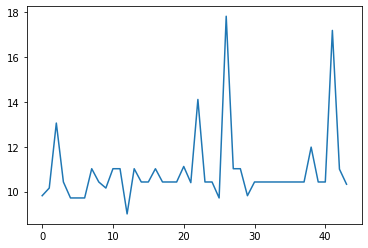

44
[8.398267312863988, 8.505736072983073, 9.126321451691872, 9.128413731771396, 9.738873900785503, 9.891331789277801, 10.438226622550143, 11.270012525928376, 11.478058278791927, 11.574487005426516, 11.792018963961835, 11.863792506435422, 12.131528958236611, 12.766871844305436, 13.251923579490906, 14.258748767064327, 18.50061004099233, 20.229334279507093, 21.416197042029395, 24.452359254524513, 25.35702870093335, 25.53621055014284, 25.723692592328533, 26.404300702663345, 26.67977035276786, 27.01158157183059, 29.158664093289776, 30.561481482654614, 48.56876844068099]


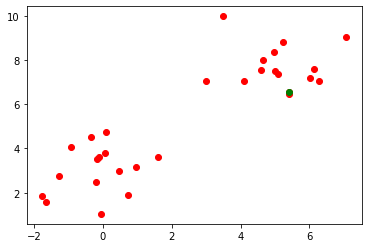

Power Allocated= 0
CSI= 0.20920623281117257
SNR= 8.398267312863988
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.45401903156636
CSI= 0.4799390718344071
SNR= 8.505736072983073
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19173683950769493
SNR= 9.126321451691872
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.056521360595434667
SNR= 9.128413731771396
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8138841743711778
CSI= 0.5801363621121114
SNR= 9.738873900785503
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.306353146860867
CSI= 0.8121737062667266
SNR= 9.891331789277801
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.988860753115649
CSI= 0.6456794624550835
SNR= 10.438226622550143
Client: clien

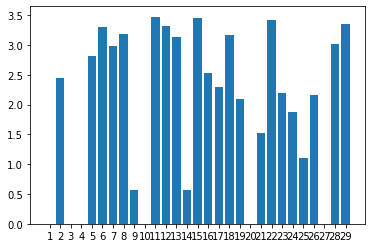

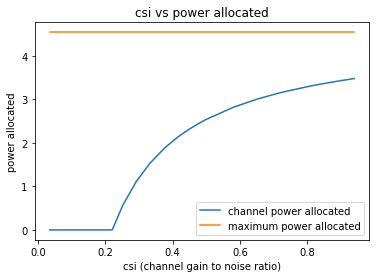

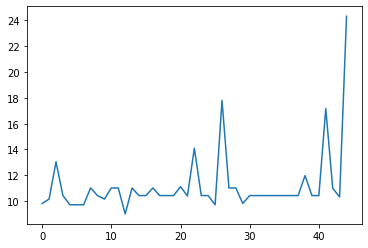

45
[4.661237440357463, 6.094491029957949, 6.437092713694321, 6.887004854942965, 6.9167632346813885, 8.374289175217822, 8.72439848364766, 9.002728557594175, 9.266129718330506, 9.277878937784338, 9.653314893624678, 9.957581231634004, 10.593180819812368, 10.698794424314332, 10.875930473455062, 18.21366543027892, 18.76175840110384, 19.539007396382345, 19.839474265171866, 21.302012972791402, 22.359683264192263, 23.77231202770021, 24.14194420682279, 25.679338693152246, 26.680558558376774, 27.82046129847108, 29.53716648470483, 32.368715330188735, 32.80167075956781]


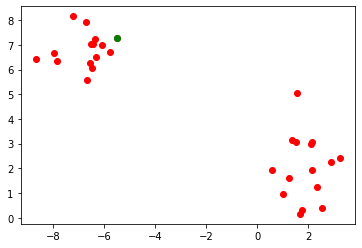

Power Allocated= 4.051075410506351
CSI= 0.9662982344126493
SNR= 4.661237440357463
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7575153138074437
CSI= 0.42947259365449786
SNR= 6.094491029957949
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.924705741160862
CSI= 0.8611433420176935
SNR= 6.437092713694321
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.146507
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.104710

Power Allocated= 3.802428587060336
CSI= 0.7791050192738839
SNR= 6.887004854942965
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.795252006446082
CSI= 0.7747730231390847
SNR= 6.9167632346813885
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.076232934133092
CSI= 0.9903738976986527
SNR= 8.374289175217822
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.0449

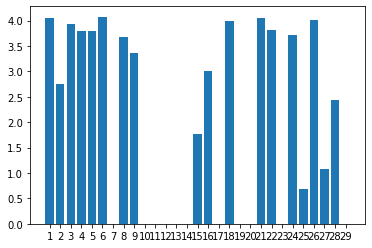

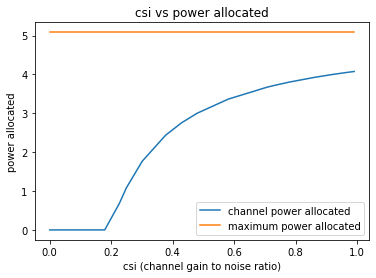

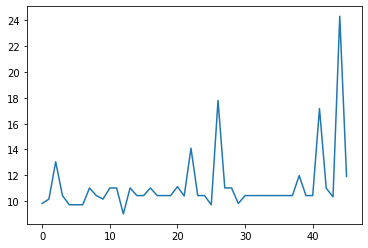

46
[10.043241435583674, 11.808227059897188, 11.859740745812223, 12.549129912583, 13.924015420937597, 14.657994455151506, 15.357819172358774, 15.462334152573643, 16.683945232220683, 16.97262279797785, 17.335522622334782, 17.70579960685975, 17.804665756461134, 17.94904061942974, 18.08796801745085, 19.5079581511262, 19.73305610679737, 20.112089466064038, 20.522406983923684, 20.701210763296096, 21.15111752393988, 22.10674188761034, 22.16292404533334, 22.383176073509627, 24.474057339321753, 25.137646693716256, 26.693746993955134, 27.002627890869775, 38.349054885682214]


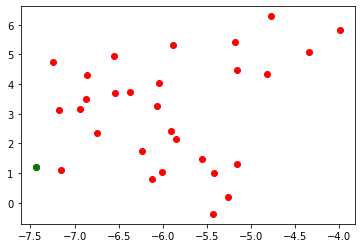

Power Allocated= 0.8495337730828845
CSI= 0.26640594001940776
SNR= 10.043241435583674
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.336903
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.865514

Power Allocated= 2.8514769585100437
CSI= 0.5708652509428894
SNR= 11.808227059897188
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.45554018761909
CSI= 0.8713354359141493
SNR= 11.859740745812223
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.408762
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.183113

Power Allocated= 1.95026892923044
CSI= 0.3769410247346985
SNR= 12.549129912583
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.510513
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.745269

Power Allocated= 0.5906355838433717
CSI= 0.24921694503046454
SNR= 13.924015420937597
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.984886
Model client5 Train Epoch: 2 [0/320 (0%)]	L

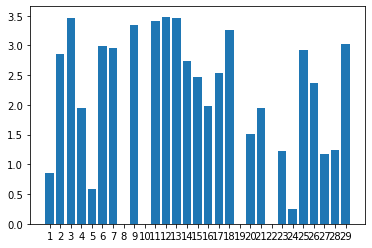

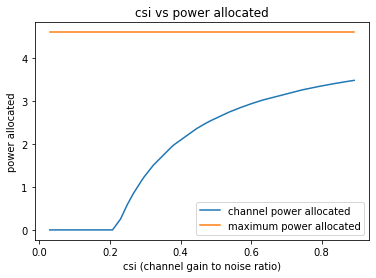

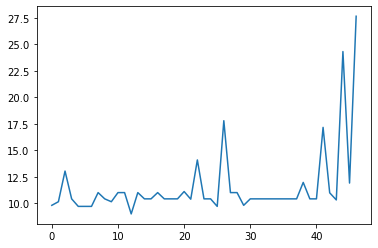

47
[6.709587809387465, 6.949465582562333, 7.896370732153708, 8.097786811993034, 8.609300774365373, 8.852337594391702, 9.235502090187524, 9.37225035566485, 9.805557277331777, 9.89244722105571, 10.371452288538514, 10.52482352410781, 10.595016669927826, 11.191512340648252, 11.64498006472216, 16.554942712690703, 20.054376566956005, 20.204495187973713, 21.640827766996622, 21.68482180664014, 24.58609312133514, 26.007285546428292, 26.072078835009844, 28.692742221098378, 28.7024243552486, 31.31977905908492, 31.33455604503522, 35.66212097914387, 39.371374569342464]


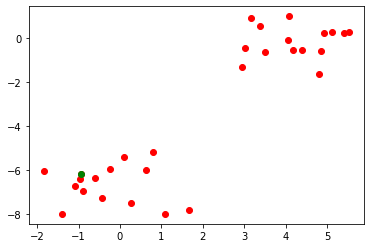

Power Allocated= 3.092131809308042
CSI= 0.8893388162155009
SNR= 6.709587809387465
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4418389385320793
CSI= 0.3603962415933618
SNR= 6.949465582562333
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05854563181535133
SNR= 7.896370732153708
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.769808376275984
CSI= 0.691202378004603
SNR= 8.097786811993034
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.781778833489046
CSI= 0.6969691063084924
SNR= 8.609300774365373
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.681821566663499
CSI= 0.282906151858355
SNR= 8.852337594391702
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6695381692594915
CSI= 0.3926149922676131
SNR= 9.2

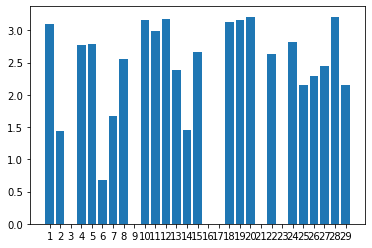

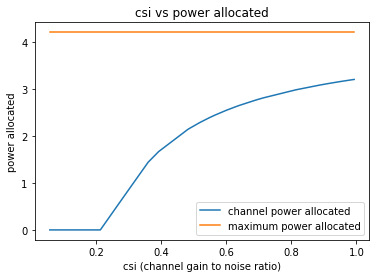

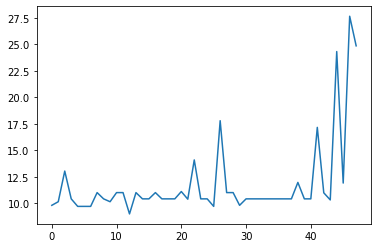

48
[10.464950322485254, 11.600828636121218, 12.937946842972764, 13.029506962607877, 14.365766291750235, 14.551533629563483, 14.862067942689027, 14.972772474567371, 15.260939589694937, 15.357632223916553, 15.926466133442874, 16.013199321016963, 16.05678828656585, 17.11575069361702, 19.59172363666691, 20.78081995386266, 21.432735186630367, 21.478793813663362, 21.945644496798348, 22.196231094815808, 24.96680555622735, 26.01159787032833, 26.682680832225206, 26.751038247153993, 28.365124463660223, 30.64034280563942, 31.571448950638064, 33.85515734967829, 40.2335370844972]


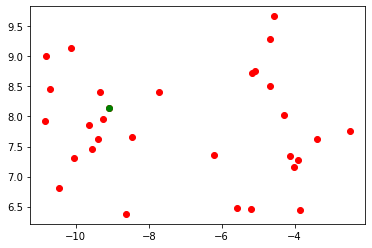

Power Allocated= 2.4473835211767128
CSI= 0.6923899850058505
SNR= 10.464950322485254
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.350261976918975
CSI= 0.6487632607803041
SNR= 11.600828636121218
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6908403977190027
CSI= 0.8327671271925073
SNR= 12.937946842972764
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.066841596139013
CSI= 0.5480008485013371
SNR= 13.029506962607877
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.219155
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.671897

Power Allocated= 2.7656139787262632
CSI= 0.8880660974725578
SNR= 14.365766291750235
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07388066973697272
SNR= 14.551533629563483
Client: client6
Poor Channel, client not taken for averaging in this round

Pow

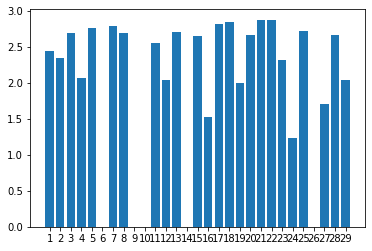

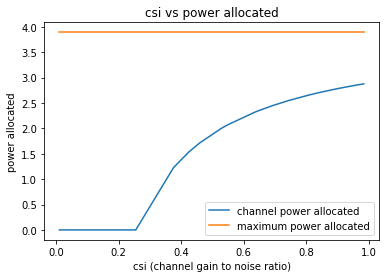

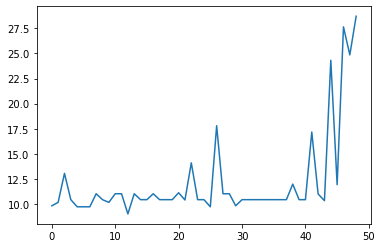

49
[4.793413825818092, 6.299463874482537, 6.600946515948638, 6.712763077977912, 7.1692362116426365, 7.847296050627591, 8.285340473035436, 8.349952791613394, 8.442479254593415, 8.743287922749793, 8.812029767167914, 9.019022320024124, 9.700612090497, 9.963608520938534, 10.32811789747676, 19.06669912667954, 19.7183918219897, 20.920942371512194, 21.19346739813125, 21.362420735701516, 22.086315367482673, 23.18940176188475, 24.463704204187366, 25.34916573751962, 27.930716280783095, 30.134284715969308, 30.62695318618518, 36.199003793973596, 38.15976816579595]


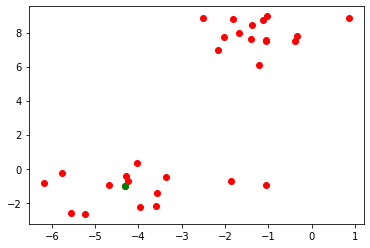

Power Allocated= 2.4619056476706254
CSI= 0.49093617519583566
SNR= 4.793413825818092
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.470815
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.751177

Power Allocated= 3.1264280412809944
CSI= 0.7286493377899219
SNR= 6.299463874482537
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1792305488404674
SNR= 6.600946515948638
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1151388458086084
CSI= 0.4195173819634539
SNR= 6.712763077977912
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.322182
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.517496

Power Allocated= 0
CSI= 0.20335171789080264
SNR= 7.1692362116426365
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.37077735208520135
CSI= 0.24224495461153384
SNR= 7.847296050627591
Client: client6
Poor Channel, client not 

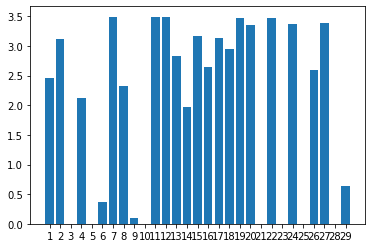

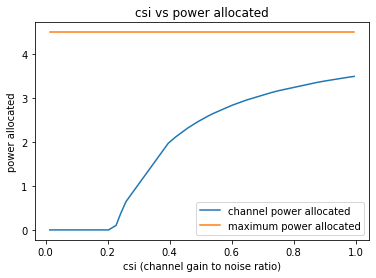

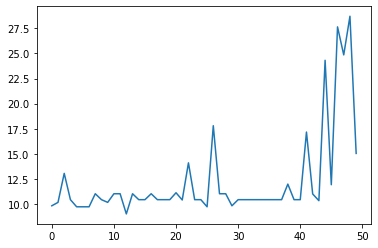

50
[2.199185758592308, 2.8409281458646074, 3.230745566035731, 3.7665753180717214, 3.9058143424947023, 4.009899719774619, 4.159267924600228, 4.2227322743453755, 4.501904285794922, 4.636302213809193, 5.573392679161051, 5.804628103597452, 6.593493107013122, 7.079991540956257, 7.292607525295799, 15.333774415981171, 15.968845799880036, 16.9298632582039, 17.492906934249994, 17.825574193469333, 18.25997444469386, 19.03131328003096, 19.322711015782755, 20.79053440877828, 21.204233785952503, 22.506888503547124, 22.86643303334855, 29.036275834624018, 30.707781384694936]


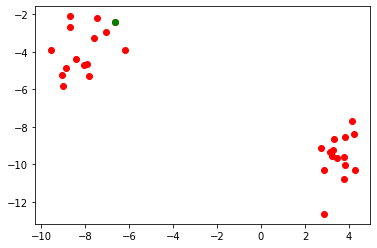

Power Allocated= 0
CSI= 0.14086826703011324
SNR= 2.199185758592308
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.718358193855101
CSI= 0.5611383046024273
SNR= 2.8409281458646074
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.440667842902498
CSI= 0.32682064733656246
SNR= 3.230745566035731
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5522322491256624
CSI= 0.5132896343084147
SNR= 3.7665753180717214
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.244898
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.070901

Power Allocated= 0
CSI= 0.005528816603336151
SNR= 3.9058143424947023
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06861104439975418
SNR= 4.009899719774619
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2049906786634144


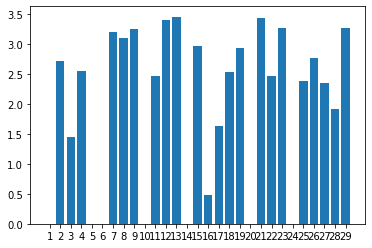

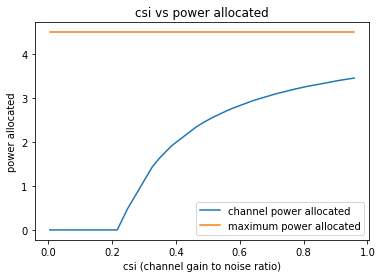

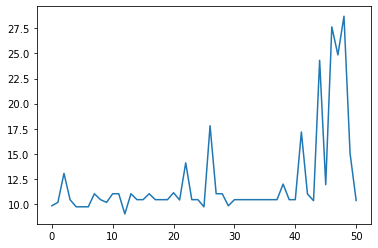

51
[12.453444678168358, 12.78582722164543, 13.584100201658364, 14.285519480546327, 14.598476036968473, 14.680613923100557, 15.98857846484512, 16.195842400450847, 16.410407888438776, 16.536423630922695, 17.43845803347977, 17.853601182190157, 17.874425170490237, 18.043314549298586, 18.5160558600777, 18.801964322507168, 22.72497081044387, 23.886896074035736, 24.09300919473586, 24.49254951590859, 24.628454520504555, 25.6748042135115, 28.35205208002351, 28.78875063386511, 29.083728250084633, 30.533327890695624, 31.018659873502795, 33.34095700312468, 40.06918609642804]


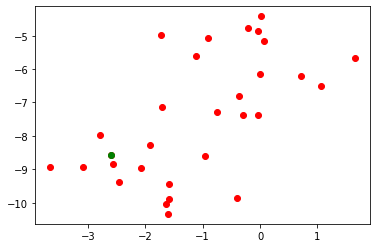

Power Allocated= 0
CSI= 0.13483808025439992
SNR= 12.453444678168358
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8819660590186515
CSI= 0.6117159104709616
SNR= 12.78582722164543
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.489124
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.893084

Power Allocated= 2.3715170762295843
CSI= 0.46615814087639096
SNR= 13.584100201658364
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.255758149690272
CSI= 0.7930505399312963
SNR= 14.285519480546327
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.198711
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.895719

Power Allocated= 2.581266091424411
CSI= 0.516676845086926
SNR= 14.598476036968473
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.497117
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.965044

Power Allocated= 3.141568882627213
CSI= 0.727197124602

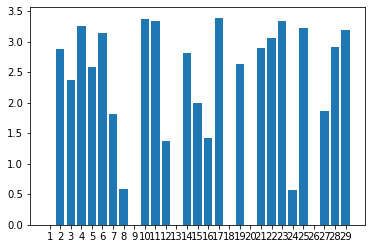

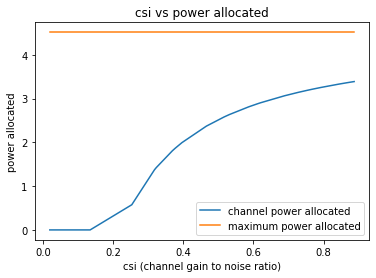

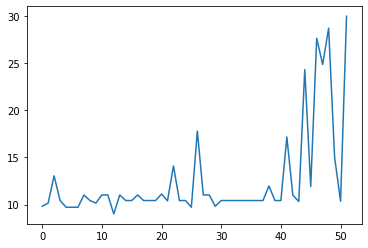

52
[4.312439641423125, 4.394940741134663, 4.57489536436826, 4.706767524947274, 4.783039036738828, 4.854810784726213, 5.0639914566139606, 5.1096910321844, 5.321152487830273, 5.546723663774732, 5.7762540371260815, 6.308347275759209, 7.911501782574508, 8.18958052925247, 8.512738954079493, 19.700329141907197, 19.714915004393806, 21.58178603774725, 21.684958992078954, 21.729879943959453, 21.838475100769955, 22.912008161159555, 26.020314089754148, 27.480583014567905, 27.734664934343613, 31.543835192904407, 32.233464592234306, 32.30671046805647, 36.52422634092146]


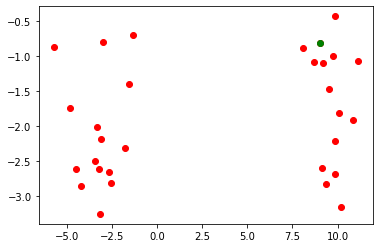

Power Allocated= 0
CSI= 0.09908547844966642
SNR= 4.312439641423125
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.917346273336016
CSI= 0.7320415150638564
SNR= 4.394940741134663
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3289423483204126
CSI= 0.5116537666773667
SNR= 4.57489536436826
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.98659528447609
CSI= 0.7711326594339842
SNR= 4.706767524947274
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.047570
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.395680

Power Allocated= 1.78360238361444
CSI= 0.40003414150960803
SNR= 4.783039036738828
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.23855196631799558
CSI= 0.24722874799980432
SNR= 4.854810784726213
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.610109
Model client6

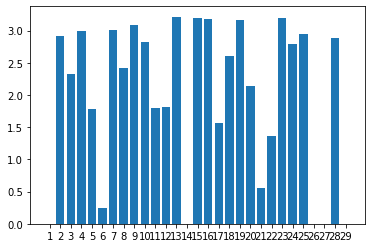

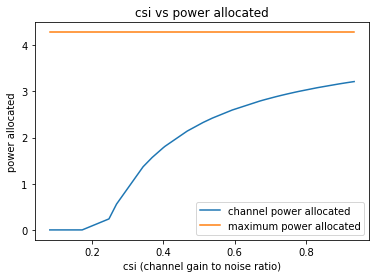

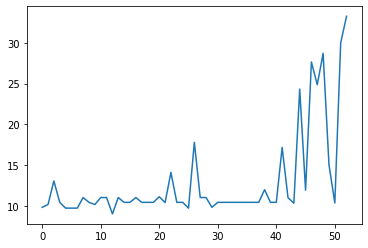

53
[8.416425225531107, 8.572275770483103, 8.758334937295125, 8.847906003706706, 8.945635599133666, 9.066811134986274, 9.621772444868245, 10.111438354059253, 10.218758170957557, 10.345874406437677, 10.701098308100272, 10.80484372815412, 11.04253142857893, 11.660762232104469, 11.802035283482695, 16.37809118673002, 19.132842532343137, 19.19921465445644, 20.110728650525097, 20.905422194128644, 21.22923404165211, 23.086344240283953, 25.014824545303988, 25.40413876849148, 25.71716095382586, 26.085790118811456, 34.432048505362864, 34.899018659269025, 42.1881117723053]


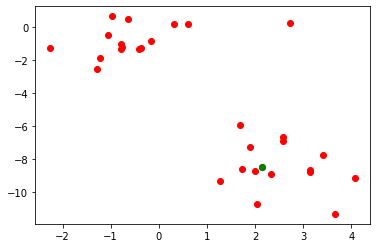

Power Allocated= 0
CSI= 0.06819269513873838
SNR= 8.416425225531107
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.790448118335682
CSI= 0.8182831015317853
SNR= 8.572275770483103
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3897752513967858
CSI= 0.38128009183488
SNR= 8.758334937295125
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.686578
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.031732

Power Allocated= 2.121156651930372
CSI= 0.5287194014302903
SNR= 8.847906003706706
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2551362437740687
CSI= 0.5690279835849317
SNR= 8.945635599133666
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21190143405728235
SNR= 9.066811134986274
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.70299239

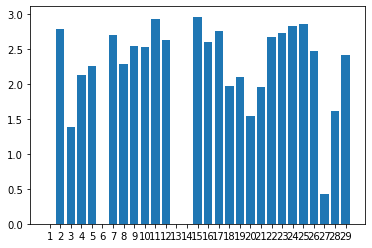

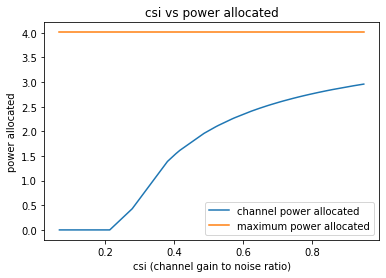

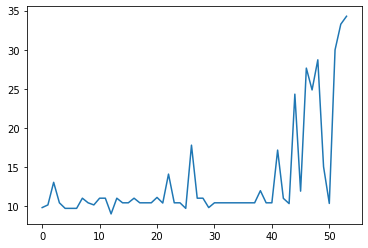

54
[6.547534581213465, 7.587943508825168, 7.749361946895458, 7.796568867588961, 8.2946522730801, 8.676180720876935, 9.372797075146007, 9.476854957468499, 10.024714227766836, 10.475061679145794, 10.813883530763794, 11.276836879887405, 11.32940318217643, 11.591875614146517, 11.99199592847887, 18.781457115503283, 19.645372413598945, 20.404681977528405, 21.837153047165412, 23.004802424167192, 24.496875850115828, 24.651180517957588, 24.721120365828636, 24.873915854928693, 25.12191209551801, 27.94549759521623, 28.84516868161731, 29.24639314571939, 30.409594164473525]


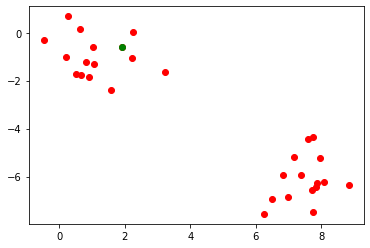

Power Allocated= 0.9104975538657794
CSI= 0.30214912761702495
SNR= 6.547534581213465
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.691127
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.627640

Power Allocated= 2.537533297804469
CSI= 0.5943224701201034
SNR= 7.587943508825168
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.957452697290222
CSI= 0.44195596869713627
SNR= 7.749361946895458
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.063667858710212
CSI= 0.8647125402518293
SNR= 7.796568867588961
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5975653269158543
CSI= 0.6163114672045005
SNR= 8.2946522730801
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1307852247288771
SNR= 8.676180720876935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Alloc

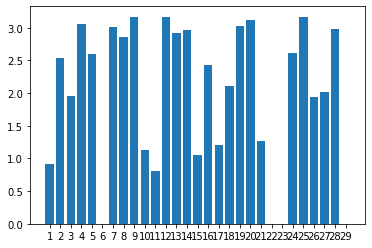

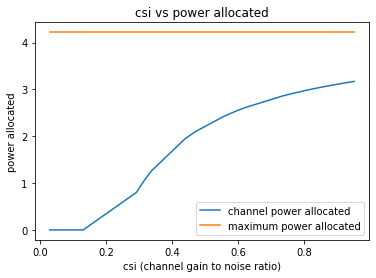

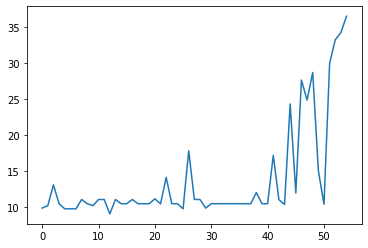

55
[7.974374029622378, 9.706722291868132, 10.110247653243384, 10.820585097001548, 11.341768210782497, 11.71376441209331, 11.934238043924479, 12.441470513475753, 12.91055420889426, 13.043577270214653, 13.078726278827316, 13.191575197670506, 14.359311905110683, 15.404308621730891, 15.450968567023054, 18.131091444870627, 20.5130962319138, 23.42446102922128, 24.07315113641095, 24.535893786558884, 24.79806819167783, 25.25086969837915, 26.26718312666145, 28.64193599628427, 30.349714829570296, 31.698470700870438, 32.528544522493725, 35.50862353697253, 40.521310668327125]


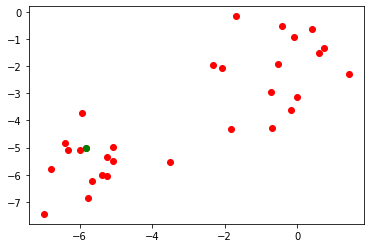

Power Allocated= 3.1957533300447496
CSI= 0.6635564809539642
SNR= 7.974374029622378
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.473625
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.890338

Power Allocated= 3.334092347605987
CSI= 0.7306247269545917
SNR= 9.706722291868132
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0088464903606407
CSI= 0.37120385255627475
SNR= 10.110247653243384
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6143504872492085
CSI= 0.9187515305629591
SNR= 10.820585097001548
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7616133857816418
CSI= 0.3400006714307503
SNR= 11.341768210782497
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.058224553365968
CSI= 0.37813480920725884
SNR= 11.71376441209331
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 

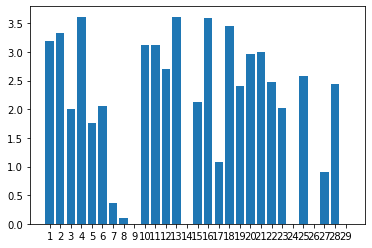

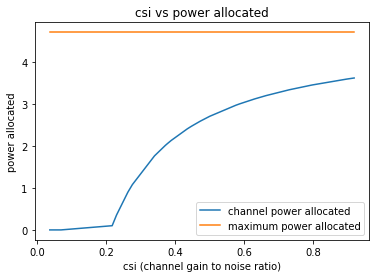

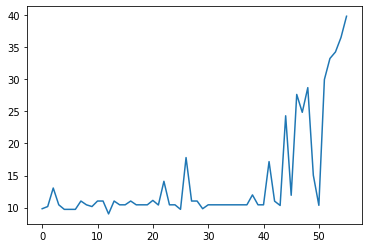

56
[1.3262545592419928, 2.1450200059690365, 2.918506856286808, 3.0815650705373994, 3.5420448737984787, 3.560842471401264, 4.269468621715055, 4.5615204454091725, 4.749631141035945, 4.833710804491586, 6.0146450331941566, 6.357031230295393, 6.7905248888892515, 6.839915809147666, 7.933251911894078, 20.737875125950485, 21.227153217243625, 23.07344979200544, 23.78423846604265, 24.58532233351314, 25.547236649695012, 26.24649510778138, 28.66311080831342, 30.27876850294205, 30.705627219378492, 31.462640447268186, 31.767478882930227, 34.612238948249704, 39.63665171319052]


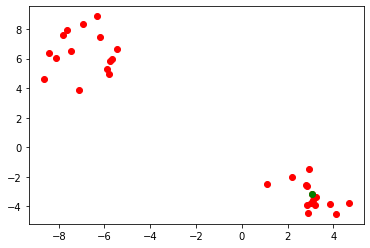

Power Allocated= 3.0083643489338137
CSI= 0.7973144878156984
SNR= 1.3262545592419928
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.609173108842966
CSI= 0.6048137783464161
SNR= 2.1450200059690365
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17068168249496407
SNR= 2.918506856286808
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.513613804038703
CSI= 0.26674058645694265
SNR= 3.0815650705373994
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.443076837106384
CSI= 0.549602216123076
SNR= 3.5420448737984787
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0956958061537208
CSI= 0.8569870405655868
SNR= 3.560842471401264
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.035422861308237796
SNR= 4.269468621

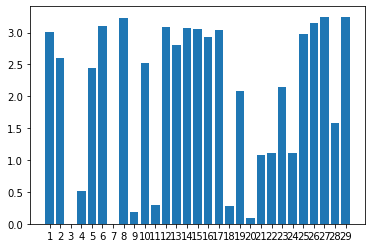

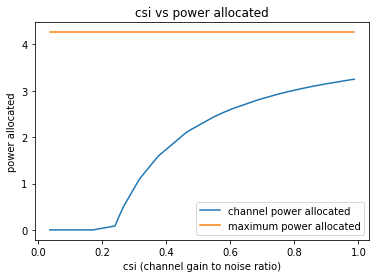

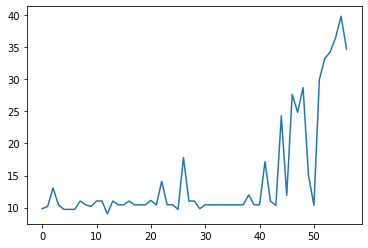

57
[-0.8114990822742416, 0.9078089194727408, 0.9963348222833939, 2.2180612885285003, 2.889283462276161, 2.940425782700558, 2.9976582681824055, 3.09103197776956, 3.522844960196241, 3.7006885346086733, 3.9689576067731624, 4.8182941070218455, 5.01976611353116, 5.905166728551991, 6.036527618334059, 16.96773488271417, 20.435246959983285, 21.45579636184265, 22.42184461156304, 23.687829815211312, 23.963872155682978, 24.622396718466895, 26.272879378397935, 27.562636404039793, 30.555218313748394, 31.56423323592693, 31.847143215376626, 38.46301273961926, 40.471775812781615]


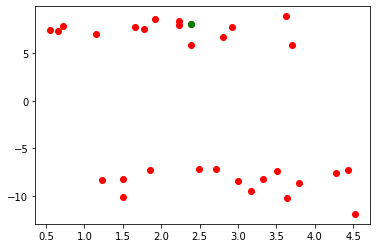

Power Allocated= 1.4841337671515635
CSI= 0.32586335198539274
SNR= -0.8114990822742416
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7375105482564246
CSI= 0.5508445478445988
SNR= 0.9078089194727408
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8047011148292684
CSI= 0.36387405431893627
SNR= 0.9963348222833939
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3604031542321326
CSI= 0.8385732990529211
SNR= 2.2180612885285003
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2694433295820655
CSI= 0.304556646469779
SNR= 2.889283462276161
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.008111289930311849
SNR= 2.940425782700558
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1482880609110946
SNR= 2.99765

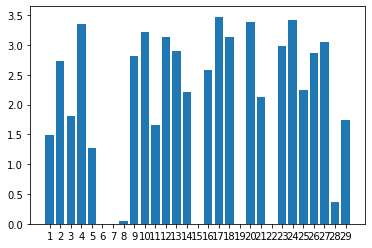

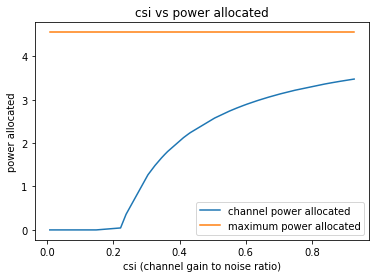

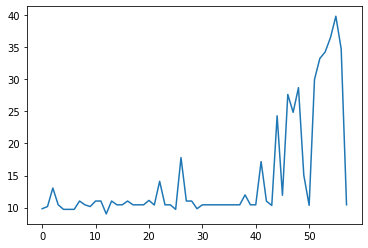

58
[5.811678867152257, 5.842276510566723, 6.189621837553408, 6.754195919335, 6.9208836817098165, 7.104131677134079, 7.139549816210635, 7.7204429220724595, 8.09812969011237, 8.564361466300872, 8.792825727353401, 8.900354520043274, 9.142869259169085, 9.831955090516605, 10.655507871253917, 15.193553630043084, 15.67816945489841, 17.752677522003843, 18.309603339007577, 18.36274829323906, 19.292958470605026, 19.29627670995553, 19.892550906443226, 20.530594024602074, 20.58070239072965, 21.193260112339374, 22.846694548631596, 23.09921598947007, 25.174558729800427]


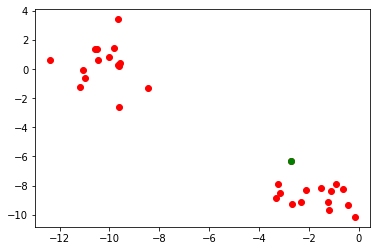

Power Allocated= 2.0036066817303793
CSI= 0.43379199142054337
SNR= 5.811678867152257
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.274212955925965
CSI= 0.9665140963591425
SNR= 5.842276510566723
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.022190577911608833
SNR= 6.189621837553408
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.506000633105968
CSI= 0.5546747379181589
SNR= 6.754195919335
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.679050
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.431134

Power Allocated= 2.0085328454594347
CSI= 0.4347209598438876
SNR= 6.9208836817098165
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8153510495857237
CSI= 0.2862452326280722
SNR= 7.104131677134079
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.465369
Model client

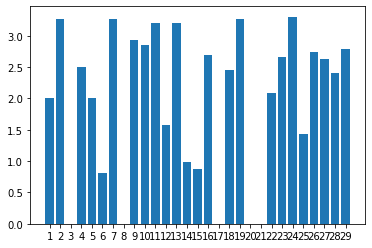

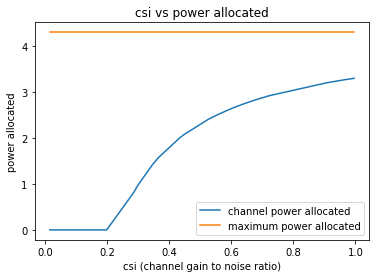

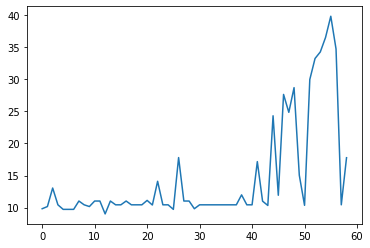

59
[10.366137411478242, 10.39111574530597, 11.50234910384156, 12.18354742207919, 12.316520805242629, 12.853480218370068, 13.803467664108641, 13.975562475331714, 13.99308710203814, 14.145595323173552, 14.766808758731758, 15.667343975871711, 15.91468521206095, 16.100640370636434, 16.538501675550467, 17.94640759240911, 18.66347101492551, 21.693543130842578, 21.872647387353386, 21.99450419839082, 22.247475894077315, 22.66735874403623, 24.194461906018613, 26.272202268437805, 26.94352483544959, 27.950236204934097, 30.55510362049231, 34.76980976773551, 38.589959916796516]


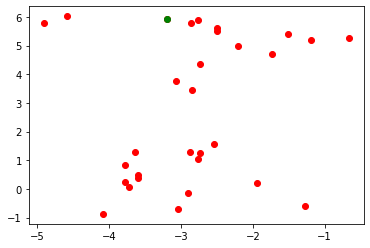

Power Allocated= 3.157192784842467
CSI= 0.9848480790801796
SNR= 10.366137411478242
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8286567156773135
CSI= 0.7440912995878504
SNR= 10.39111574530597
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.175120
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.722027

Power Allocated= 3.047695126986221
CSI= 0.8889815866808511
SNR= 11.50234910384156
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.037340
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.794391

Power Allocated= 2.9573533167422337
CSI= 0.8228932172535739
SNR= 12.18354742207919
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.532969
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.269402

Power Allocated= 2.9627597220792024
CSI= 0.8265705422120899
SNR= 12.316520805242629
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9086810598238988
CSI=

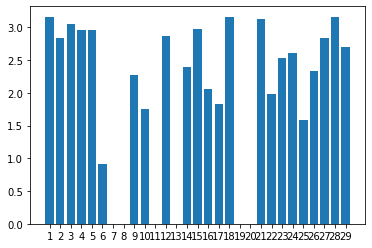

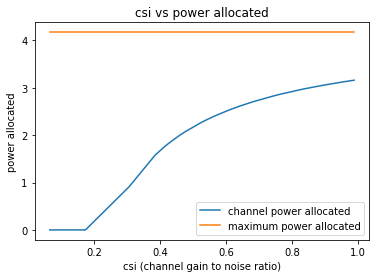

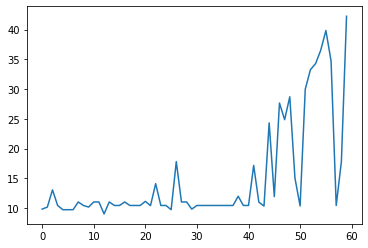

60
[2.5203952669533676, 3.1997339066479364, 3.756782254186967, 4.343976979686625, 5.05463186810166, 5.324454603336454, 5.424665334085002, 5.588866904637185, 6.077321390959444, 6.233793252722026, 6.273021113988705, 6.300067830528576, 6.304915874015348, 7.008892664829286, 7.691947324832139, 17.955189261892144, 19.56217296727395, 19.602520845763376, 19.93838857241018, 20.752922513468548, 21.121856468660855, 21.174408597753313, 21.359780507441013, 22.604212523076544, 23.22913356195537, 23.945073619224466, 24.57514204894921, 24.668853181051134, 28.400962561016687]


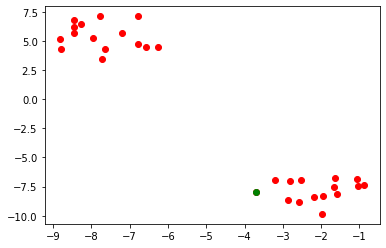

Power Allocated= 2.550022321591979
CSI= 0.5369815209184174
SNR= 2.5203952669533676
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.990447
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.434946

Power Allocated= 2.8193162394680042
CSI= 0.6277591747457485
SNR= 3.1997339066479364
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4429347578161944
CSI= 0.5077820028585575
SNR= 3.756782254186967
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03288666938869067
SNR= 4.343976979686625
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5773320249270757
CSI= 0.5449734508683794
SNR= 5.05463186810166
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2944457388898924
CSI= 0.3207350673803664
SNR= 5.324454603336454
Client: client7
Poor Channel, client not taken for averaging in this round

Power A

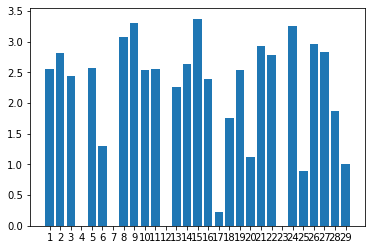

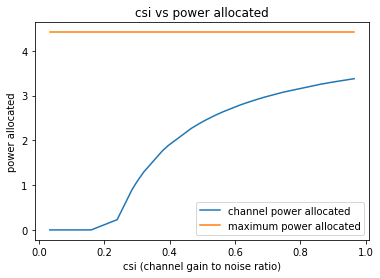

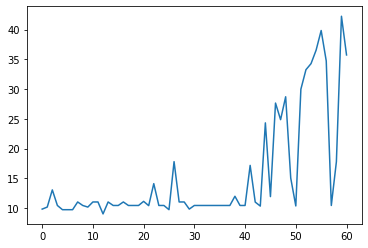

61
[-0.3190952820067041, 0.4275320178454054, 0.9534803085896737, 1.646071696865683, 1.8341746120855333, 1.8812515771362728, 2.787468744659729, 3.113981273823901, 3.2038710846929646, 3.518140459955646, 3.5365564981960507, 3.5918355171154577, 3.6970957094117276, 3.7050284067683514, 3.8343493223740706, 13.119629694188541, 15.515419656569446, 15.86255341111418, 16.152067064828277, 16.638206911621545, 17.09520668705631, 19.70947502823534, 19.746652596764925, 20.249213578234436, 22.43077084631054, 22.534806149470928, 22.834717948108857, 24.021032800600057, 25.188987161681844]


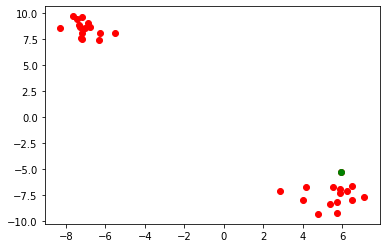

Power Allocated= 3.2768754894986523
CSI= 0.7965625006762217
SNR= -0.3190952820067041
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5902655517693196
CSI= 0.5149319426822476
SNR= 0.4275320178454054
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.05861345876042
CSI= 0.4042598800881515
SNR= 0.9534803085896737
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.524983918613395
CSI= 0.9927668574512208
SNR= 1.646071696865683
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02951141078996178
SNR= 1.8341746120855333
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4671775385406796
CSI= 0.9388858346706205
SNR= 1.8812515771362728
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2172128267963096
CSI= 0.7604233506713403

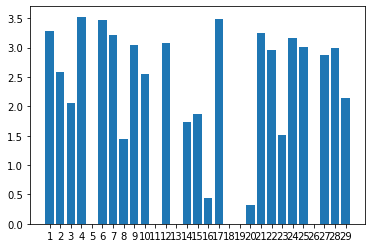

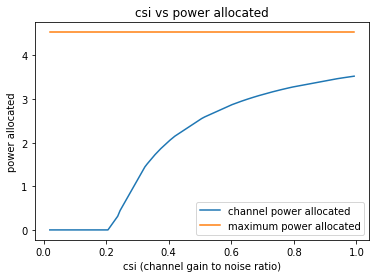

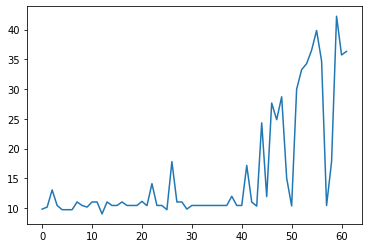

62
[6.005598668014838, 6.786706618760675, 7.413581841770312, 7.577685550441857, 7.678517256677292, 8.252455900889109, 8.72307291286678, 8.73282454576718, 8.77286839315854, 8.80065716676253, 8.845269773700226, 8.902401291547694, 8.916041554735402, 9.376276644545058, 10.648637263685867, 12.797251372010109, 12.958595150453306, 14.149555696005915, 15.299715982215027, 15.67515613277942, 15.719510607219132, 16.055186945046945, 16.12417024688749, 16.492991578222505, 18.576744318780403, 19.699498622735955, 21.083362100412906, 21.793170687555264, 24.689855026769138]


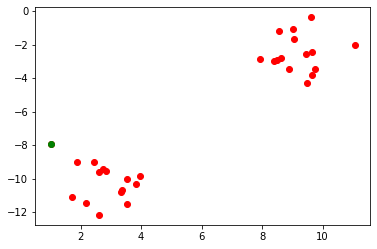

Power Allocated= 0
CSI= 0.0639590126510442
SNR= 6.005598668014838
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9521624724646207
CSI= 0.9350772352324577
SNR= 6.786706618760675
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01641198976632563
SNR= 7.413581841770312
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.013325372535939
CSI= 0.4979416395445403
SNR= 7.577685550441857
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14479049827856494
SNR= 7.678517256677292
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9936748923137881
CSI= 0.33025993908076945
SNR= 8.252455900889109
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1086603207909302
CSI= 0.5227575908306911
SNR= 8.72307291286678
Client: clien

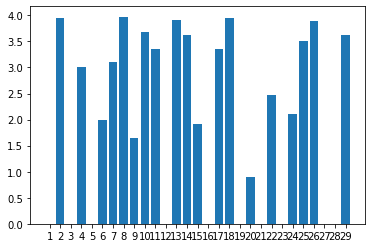

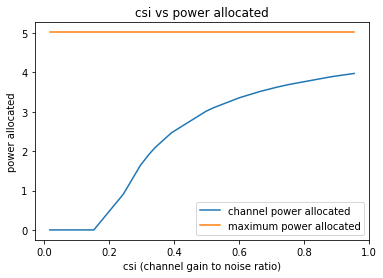

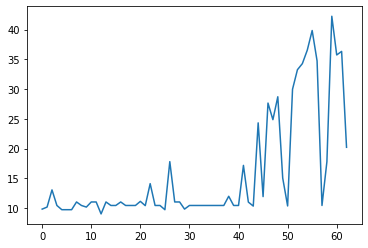

63
[13.644304036230277, 14.147661633294245, 14.347683155741533, 15.029764544346868, 15.181856147563625, 15.224879459203228, 15.803061893661297, 15.825781061053643, 16.082513785368505, 16.211787216313002, 16.246021685985465, 16.484029219501558, 17.680549393997687, 18.133127664368573, 18.172557232523957, 18.955439987267503, 19.084366176944776, 19.760061975627544, 20.05129973147594, 20.601181070828034, 21.021440866828108, 21.464494750361364, 21.522110332045404, 22.82949211038154, 23.522738164127233, 24.003671864357813, 25.14506167718836, 26.18893660774112, 26.928479736918074]


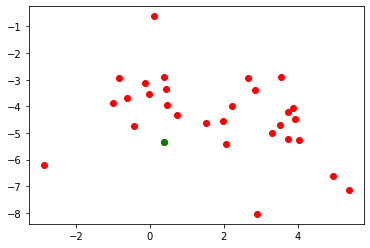

Power Allocated= 3.1361178829965586
CSI= 0.830974401198867
SNR= 13.644304036230277
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1377425733544395
SNR= 14.147661633294245
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.45459731142236937
CSI= 0.25740508901601256
SNR= 14.347683155741533
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.289173
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.925327

Power Allocated= 3.2599487423576163
CSI= 0.9262898842877012
SNR= 15.029764544346868
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9352163456554194
CSI= 0.7120944762515564
SNR= 15.181856147563625
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.14825557363616504
CSI= 0.23859123436380314
SNR= 15.224879459203228
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.023577
Mo

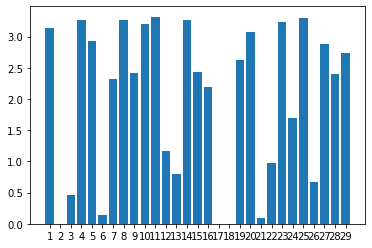

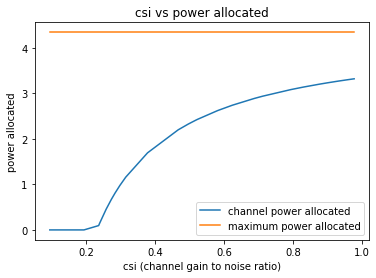

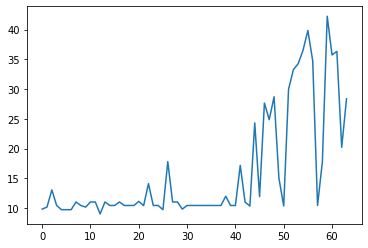

64
[0.9100846845455015, 1.6363035608857652, 1.9680634559133052, 2.0554917544663875, 2.6728341072404316, 3.3843179755509274, 3.7687038173600054, 4.177428701781331, 4.369328706398554, 4.491286878558481, 4.571619130265602, 4.59708839407882, 4.648592771521033, 5.0066516583457386, 6.7907675514311165, 18.580802370664884, 18.854815701801783, 19.600831894703813, 19.675207277334717, 20.743723530042054, 22.78962086107558, 24.31242380463377, 24.60805845716305, 25.213624495875493, 25.59098618107373, 26.82809609664117, 27.76678579632862, 29.053253856700376, 29.190539774089423]


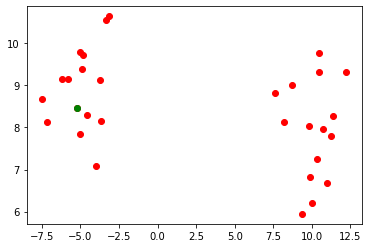

Power Allocated= 0
CSI= 0.1051605171581661
SNR= 0.9100846845455015
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9699740918487185
CSI= 0.8096470636939828
SNR= 1.6363035608857652
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6839562101710026
CSI= 0.6574086229284412
SNR= 1.9680634559133052
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.881136505981358
CSI= 0.7553191544806612
SNR= 2.0554917544663875
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.932746032002282
CSI= 0.7859570684952011
SNR= 2.6728341072404316
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.971388
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.853539

Power Allocated= 0
CSI= 0.0051125217452808736
SNR= 3.3843179755509274
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1

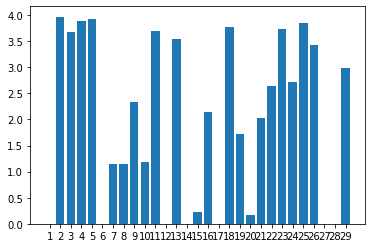

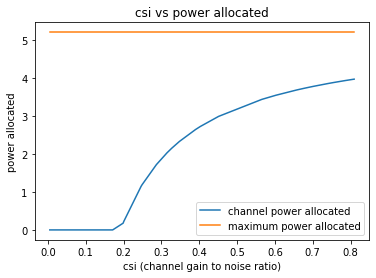

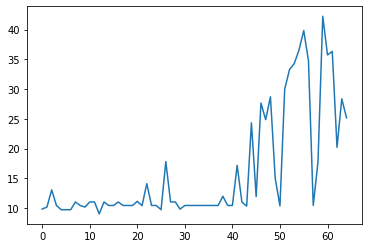

65
[10.94100010993777, 11.11087919301938, 11.769532734488063, 13.155797108706194, 13.264794155082711, 13.691735132624295, 13.748048566891446, 14.001019906902538, 14.388446561933765, 14.99986941185267, 15.341433712450858, 15.514835601280053, 16.034293494869235, 16.219367757228156, 16.35431059189178, 17.186114402957724, 18.7865188113609, 19.567383997456652, 21.253003032314282, 21.460260239673183, 22.433501849643015, 26.040197782721723, 28.107231321744838, 29.802971649385597, 29.87419725744588, 30.066694898723647, 30.88557850135254, 31.328863736979336, 33.103275143544764]


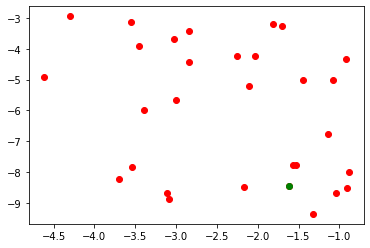

Power Allocated= 3.431583974868171
CSI= 0.6949936061918801
SNR= 10.94100010993777
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020209730362021783
SNR= 11.11087919301938
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18508275281554265
SNR= 11.769532734488063
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2858557899117065
CSI= 0.6310779340833023
SNR= 13.155797108706194
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.684254
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.139858

Power Allocated= 3.0734525004464572
CSI= 0.5564849991446627
SNR= 13.264794155082711
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5890296298699895
CSI= 0.7803863908899946
SNR= 13.691735132624295
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0


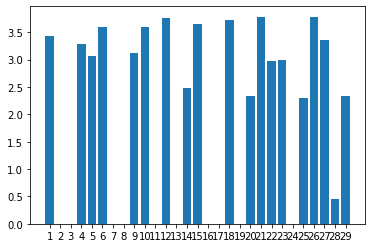

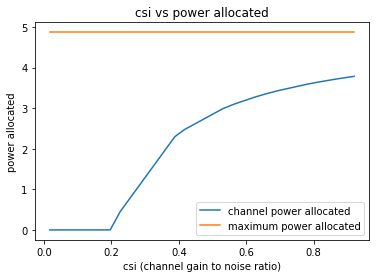

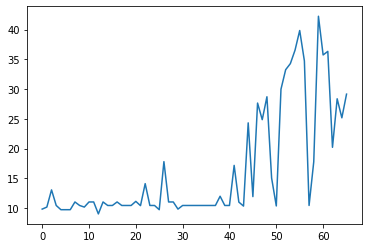

66
[3.607197519146866, 3.7634291677978364, 5.477309048504129, 5.528393462651238, 5.594632344302248, 5.83191145164598, 5.863518982782644, 6.751035423371608, 7.254426310315876, 7.616759308860204, 7.623539411180644, 7.7745808015220055, 7.775979549549971, 8.058455168228058, 8.78855626422163, 16.04979503579031, 16.406055073413246, 17.272785187251266, 19.163955664070876, 19.70655233511227, 20.537135932321323, 21.50205194267831, 21.868748939583806, 22.020172068370854, 22.659429493940845, 23.98839766140759, 30.42671684246427, 30.887595789588246, 31.871167590368493]


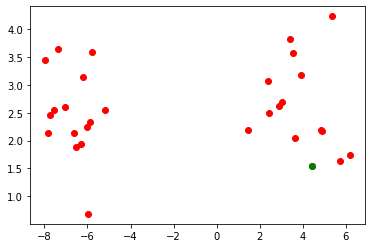

Power Allocated= 3.1522915901782937
CSI= 0.678269921918552
SNR= 3.607197519146866
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11596500964674561
SNR= 3.7634291677978364
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.484765615357288
CSI= 0.8757600607481727
SNR= 5.477309048504129
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.000873203280382
CSI= 0.38084245399049066
SNR= 5.528393462651238
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2676456198380173
CSI= 0.7358431499428234
SNR= 5.594632344302248
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9334664796830663
CSI= 0.27077050724134655
SNR= 5.83191145164598
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.380032938904999
CSI= 0.8021832550075745
SNR=

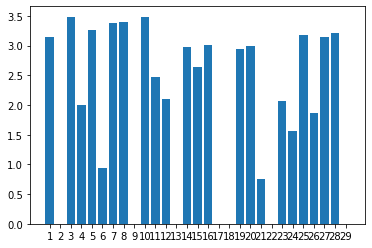

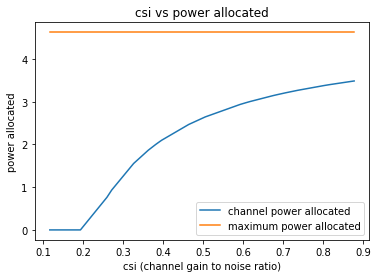

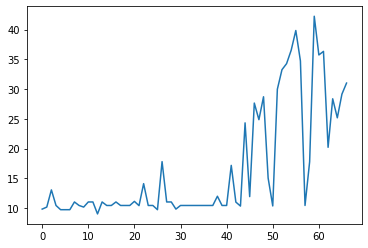

67
[-0.04536138806563583, -0.01784587512717284, 0.14759396984160134, 0.2235641391287162, 0.5597339366059693, 0.7965270043716419, 0.9834661348020042, 1.4222187169682847, 1.517147618187494, 1.728991908332556, 1.7658026965796472, 2.030914739710948, 2.0761464502045492, 2.139192497751355, 4.9799369528372885, 17.09814531826472, 18.454826546236024, 19.946653882547682, 25.856297974830476, 27.00662738096494, 27.433394800053073, 28.04254146743508, 28.56707704267245, 29.910479108961727, 30.15612780619385, 31.740302803733893, 34.303908843738256, 34.41775825476415, 57.164687477818376]


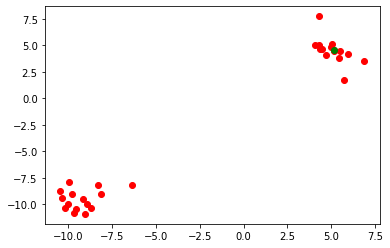

Power Allocated= 0.5916502340767376
CSI= 0.2937552836882321
SNR= -0.04536138806563583
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.236203
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.512525

Power Allocated= 2.5154220036038115
CSI= 0.6754829264848182
SNR= -0.01784587512717284
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5469320961551176
CSI= 0.6901729326508836
SNR= 0.14759396984160134
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.675793166668548
CSI= 0.757546399647175
SNR= 0.2235641391287162
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.698103815594857
CSI= 0.7705700755559773
SNR= 0.5597339366059693
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8783118285845832
CSI= 0.8948285673807731
SNR= 0.7965270043716419
Client: client6
Poor Channel, client not taken for averagin

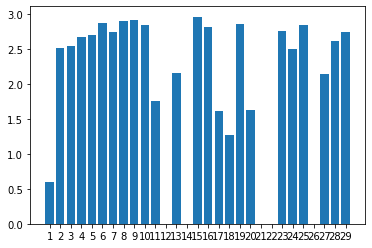

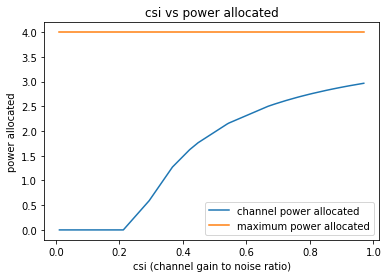

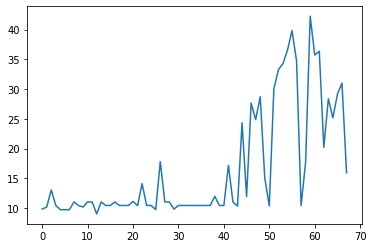

68
[-0.09985924832105386, 1.2866499104841576, 1.7954432698716212, 2.151876708799101, 2.1682236800972365, 2.1860756896427214, 2.558017184263061, 2.764766170980805, 2.80660267843412, 4.050046010296282, 4.084678123663281, 4.739938989533449, 4.830632374825166, 5.098110506181402, 5.161376001392554, 17.374717349056127, 20.49538369576822, 21.07921421032237, 21.20244275285168, 21.45550407070819, 23.883690296119855, 24.54153556680704, 24.655033281640236, 26.59735051465644, 27.158885786232045, 27.4152048409919, 30.430895894998795, 30.534930427549074, 49.185938208720266]


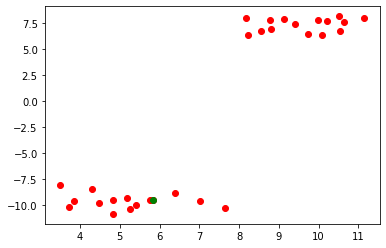

Power Allocated= 3.42631632122997
CSI= 0.9257389320110914
SNR= -0.09985924832105386
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9112635939641742
CSI= 0.6268527883850684
SNR= 1.2866499104841576
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2071343630908562
SNR= 1.7954432698716212
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.678746602762021
CSI= 0.5471094404305934
SNR= 2.151876708799101
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06242004961200576
SNR= 2.1682236800972365
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8673800115751025
CSI= 0.3789092354626309
SNR= 2.1860756896427214
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5609999473349085
CSI= 0.33949695398627144
SNR= 2.5580171

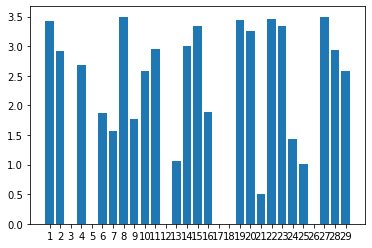

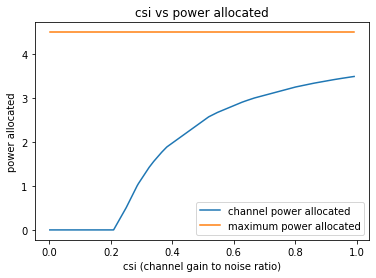

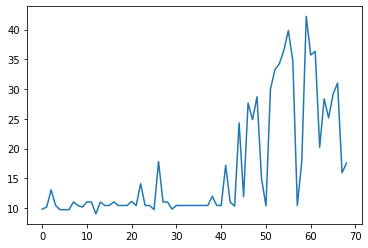

69
[6.02044665305149, 6.432964639162861, 7.226676747294619, 7.355351487206085, 7.586485070710744, 7.7901573663328945, 7.91871526700845, 9.00930583209362, 9.38176877389132, 9.590401042321604, 9.962865433413782, 10.703030132854554, 11.260143223304633, 11.28060349531909, 11.830870086983724, 17.136306832232997, 17.631381641472874, 17.810103535603403, 18.01151719424987, 18.14545127190949, 18.434800529024006, 18.96021058474642, 19.26500979828309, 19.38582701738769, 20.640060545359912, 22.123208006329225, 22.218315213234433, 24.804921352113716, 27.983228305757077]


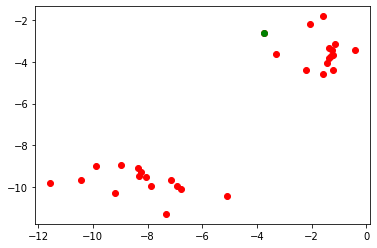

Power Allocated= 2.301814242187321
CSI= 0.5529940155583257
SNR= 6.02044665305149
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.985914386014577
CSI= 0.8894916166211312
SNR= 6.432964639162861
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.551910528126299
CSI= 0.3908935029910894
SNR= 7.226676747294619
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6531215003779884
CSI= 0.40699534229383516
SNR= 7.355351487206085
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19919567835075547
SNR= 7.586485070710744
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7842465797922764
CSI= 0.7542015649993565
SNR= 7.7901573663328945
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.582712
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.595522

Power All

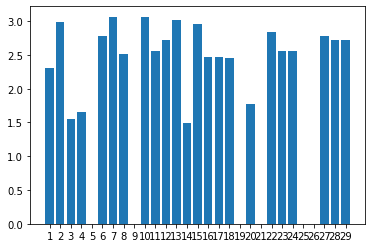

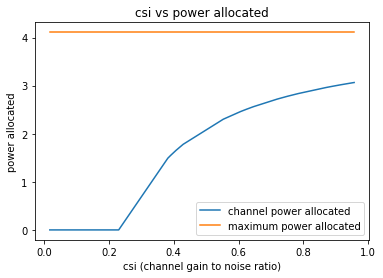

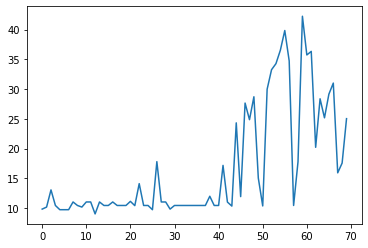

70
[-0.19393523751814268, 0.7583102486053765, 1.1860734442214849, 1.44991382899605, 1.6565296519967339, 2.043238923311865, 2.2362754548380566, 2.280762205720955, 2.2862941112665855, 2.665597267378123, 2.78117659737842, 2.94182267118974, 3.934244507309306, 4.59305658012246, 4.615002161465743, 18.529024767696697, 20.729728303959988, 21.820284762825757, 22.634399196384656, 23.33379568495987, 24.936913864329963, 24.95794717092182, 25.092063126562596, 25.45096902377856, 27.305311329991795, 28.5034202458453, 29.279956693251023, 30.363283815991288, 30.506294509155545]


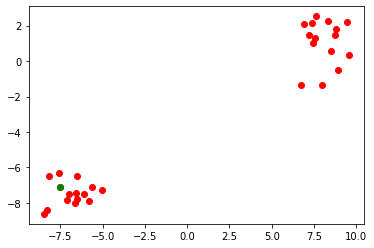

Power Allocated= 0.7049934324156215
CSI= 0.24867263442638676
SNR= -0.19393523751814268
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1818165973176573
SNR= 0.7583102486053765
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.545737525865
CSI= 0.314405383163342
SNR= 1.1860734442214849
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.429589382030372
CSI= 0.7711555360646524
SNR= 1.44991382899605
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3740805514380643
CSI= 0.22976546884352167
SNR= 1.6565296519967339
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 3.120121
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.845032

Power Allocated= 0
CSI= 0.06427142122609264
SNR= 2.043238923311865
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI=

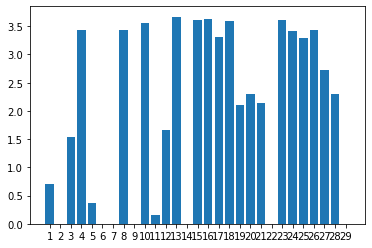

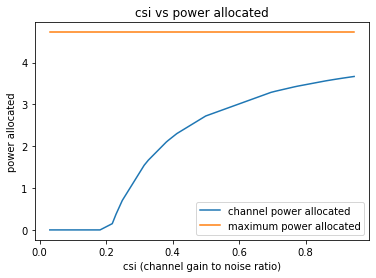

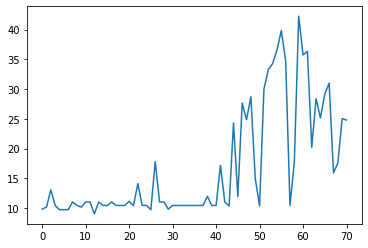

71
[7.263382843424569, 7.428942884556374, 9.279314721933622, 9.67159645285622, 9.910357982475144, 10.47879480306332, 10.63434012114739, 10.695310103747499, 10.867678179073273, 11.243267614791815, 11.417664716219758, 11.44470216962596, 11.83438086467263, 12.90358597941883, 13.332222178110026, 17.50482555251919, 17.806104594899196, 18.94150085527289, 20.80660857293922, 21.462897070448435, 23.110934503318735, 24.42204278843974, 24.847263995869827, 27.230800335688095, 28.00877910532943, 29.02441122501969, 31.31722388658365, 34.15338494883146, 41.69314994563256]


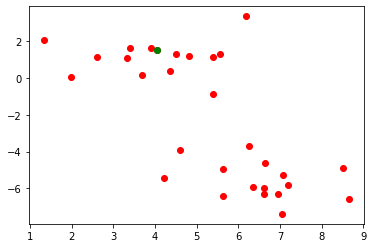

Power Allocated= 2.070410170412761
CSI= 0.38476398029618974
SNR= 7.263382843424569
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07472701134258586
SNR= 7.428942884556374
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0991734474777991
SNR= 9.279314721933622
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.569924148054728
CSI= 0.9095192897858815
SNR= 9.67159645285622
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.191267
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.935214

Power Allocated= 3.2919541382530872
CSI= 0.7259781560040622
SNR= 9.910357982475144
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5985111172976225
CSI= 0.3256379724509386
SNR= 10.47879480306332
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.436224
Model client6 Train Epoch: 2 

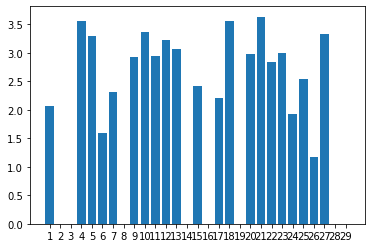

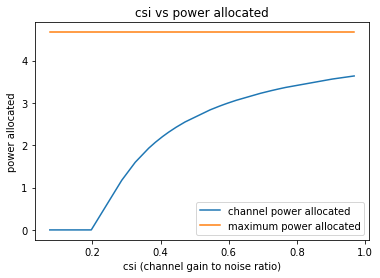

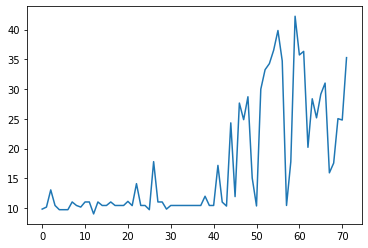

72
[2.071192995535454, 2.0876607036606902, 2.1685119462901445, 2.363654370156725, 2.4610782192384058, 3.0320607494129748, 3.1432296434500016, 3.4825146791298542, 3.494544017124517, 4.840394244514278, 5.3697836399582854, 5.53426875915186, 5.753040210234825, 6.176722649782614, 7.073944264341934, 11.691074623296162, 14.375240742153217, 16.9978227124208, 17.242682287803877, 18.26211604661605, 18.623384660623753, 18.868304845921323, 19.364504884633174, 21.281794964306933, 22.111839584457996, 24.091683494501243, 27.262916756842795, 30.392170348968087, 32.743495835150284]


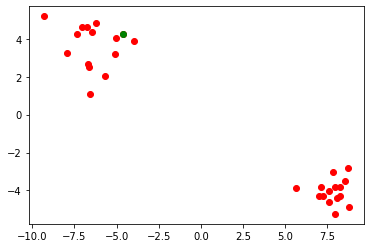

Power Allocated= 1.935347940451953
CSI= 0.37602527905391425
SNR= 2.071192995535454
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.771482435872934
CSI= 0.5484677743248311
SNR= 2.0876607036606902
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 3.026169
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.666364

Power Allocated= 2.6923205321756636
CSI= 0.5256454307763369
SNR= 2.1685119462901445
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.636055869225573
CSI= 0.5105459014699136
SNR= 2.363654370156725
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5517907391148444
CSI= 0.9588160929848404
SNR= 2.4610782192384058
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.395533
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.478299

Power Allocated= 2.4060215959289426
CSI= 0.4568876230331177
SNR= 3.0320607494129748
Client: cl

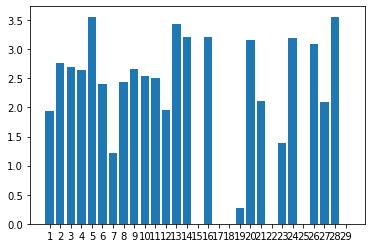

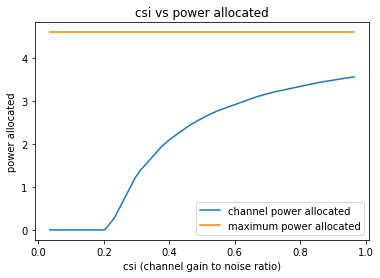

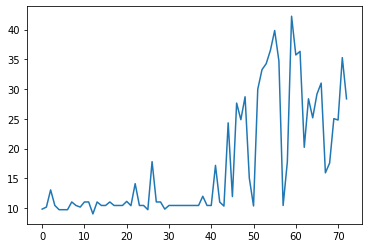

73
[2.4234061239657256, 3.5923969462573897, 4.403331055186076, 4.7402583234390585, 5.466179757462214, 5.470786953487536, 5.600595462736589, 5.889701359129349, 6.125134498274763, 6.13057725495649, 6.183348400885936, 6.573645034552599, 6.93627465812572, 7.037810959751508, 7.380679372345221, 17.111886440808973, 17.39339237954192, 17.77535602936342, 19.86904075833384, 20.352949320269975, 22.0552349188559, 22.573542182310955, 22.826314176684622, 22.883998805006556, 23.760993687697646, 24.74720907923856, 26.37003649083808, 27.60941193466929, 45.2408640302171]


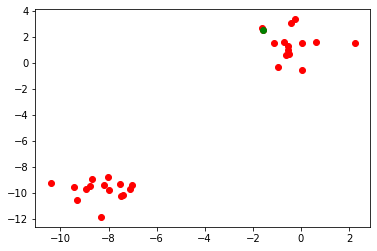

Power Allocated= 3.2853933790387355
CSI= 0.7706784343210502
SNR= 2.4234061239657256
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2169650498923601
SNR= 3.5923969462573897
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.442206231225856
CSI= 0.876619957913251
SNR= 4.403331055186076
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.472492449268229
CSI= 0.9005285433435251
SNR= 4.7402583234390585
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1151388302505296
CSI= 0.681285885198289
SNR= 5.466179757462214
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5726333411332543
CSI= 0.9897872959114653
SNR= 5.470786953487536
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.988896894132103
CSI= 0.6273311127841108
SNR= 

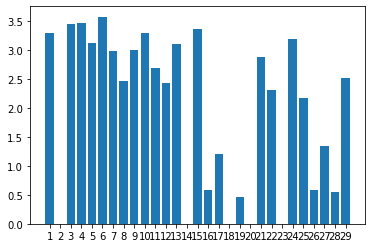

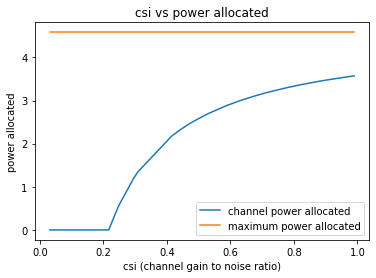

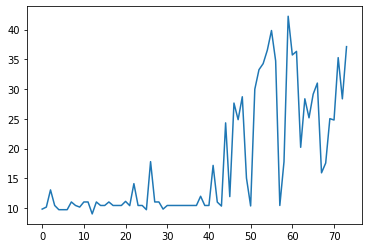

74
[-0.9884619341557057, 0.04232124418162542, 0.27736956288447345, 0.3086816962771959, 1.2994676069823834, 1.3473442589098088, 1.8398857841043537, 1.9383578582583776, 2.165896467456538, 2.4130950910592106, 2.675448986950707, 3.4863152802249724, 3.506641012189093, 3.6780808639852807, 3.719809879102515, 17.459309016621194, 18.73284955459918, 21.479355704750375, 22.62893711355768, 22.63812764063473, 22.81258905502897, 22.882273963768654, 23.11860581407411, 24.790786550228777, 25.831220141880852, 26.991483184259323, 30.602892473045607, 31.143372238058106, 34.840529467197754]


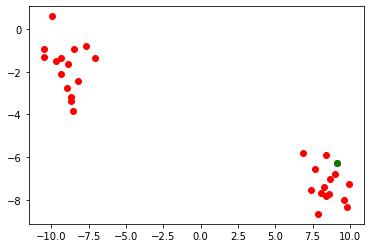

Power Allocated= 0
CSI= 0.16534563482172904
SNR= -0.9884619341557057
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3976453729983565
CSI= 0.29126729660776374
SNR= 0.04232124418162542
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2444142188350673
CSI= 0.6303168583914454
SNR= 0.27736956288447345
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.830180149944384
CSI= 0.49981563689156794
SNR= 0.3086816962771959
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.014901902455021
CSI= 0.5506559498653174
SNR= 1.2994676069823834
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4482683971121872
CSI= 0.7232491071881415
SNR= 1.3473442589098088
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.111876
Model client7 Train Epoch: 2 [0/320 (0%)]	Loss: 0.486636

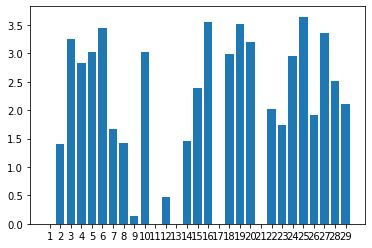

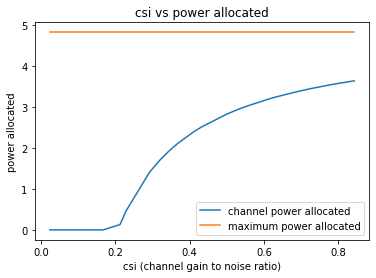

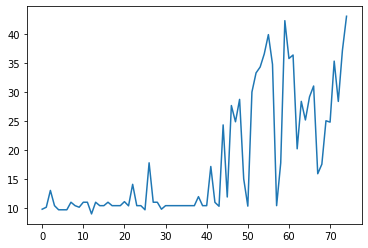

75
[13.478549597063285, 15.944837537694653, 16.957723720644587, 17.79307219496564, 17.807682706211082, 19.717848062976493, 19.772044726817185, 19.879260127057865, 20.036581973346387, 20.076585715619082, 20.61635184957051, 21.047392545608105, 21.099419376607592, 21.303330726681505, 22.708132211561374, 22.924375058774583, 25.107980280096303, 25.24574729286551, 27.375722884546057, 27.85825778159915, 28.42625895628315, 28.795657252582444, 28.868062878305157, 29.1844930967786, 29.28096950828776, 30.095804180041924, 32.40232399015874, 32.631800988650845, 38.054897669348904]


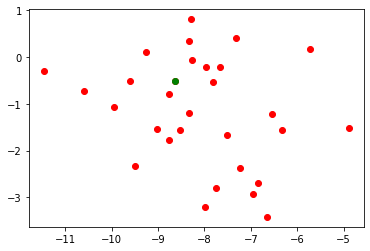

Power Allocated= 2.483775138176016
CSI= 0.5492596439029245
SNR= 13.478549597063285
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.235512
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.384451

Power Allocated= 0
CSI= 0.06336384063192613
SNR= 15.944837537694653
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1128605183033056
CSI= 0.8392449783205718
SNR= 16.957723720644587
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.179416
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.601172

Power Allocated= 0
CSI= 0.22378193458448326
SNR= 17.79307219496564
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.235916871523221
CSI= 0.9358994581093578
SNR= 17.807682706211082
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.087565
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.452586

Power Allocated= 2.628402491122353
CSI= 0.5966568520484208
SNR= 19.717

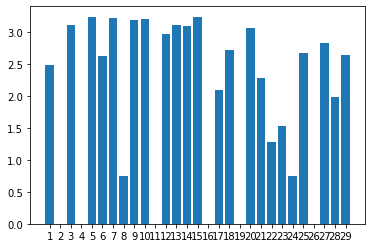

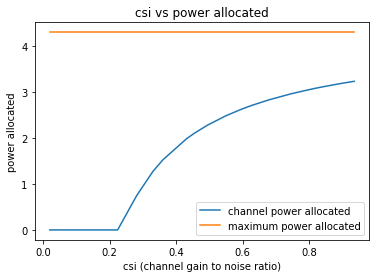

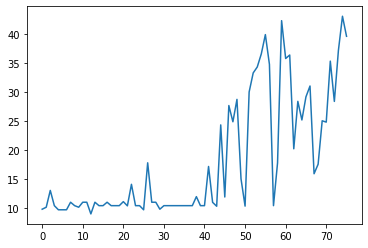

76
[12.383556315147093, 14.218959734485843, 16.593005892455462, 16.918157094359096, 17.22952434403954, 17.45918630269951, 17.670688121673052, 18.724744772584458, 19.0344868428232, 19.188424904632157, 19.315276433980387, 19.854004498454252, 19.89661186546628, 20.024725848550915, 20.127404805458532, 20.47964335489893, 20.74868987735323, 21.618505831985004, 21.92087239516758, 22.6776672085475, 22.93707556265831, 23.59555143768103, 23.949008152164573, 24.864360939916285, 26.065342105133258, 30.608264677212016, 31.086619744315758, 31.523990635271417, 33.5117105119883]


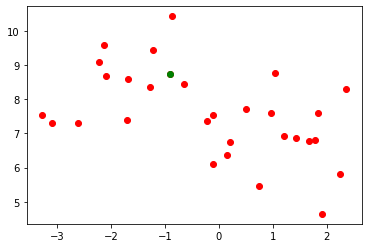

Power Allocated= 3.164860548934862
CSI= 0.8456033915407425
SNR= 12.383556315147093
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.116300422193941
CSI= 0.8122502769302898
SNR= 14.218959734485843
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.372562
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.587013

Power Allocated= 0
CSI= 0.14318558807521942
SNR= 16.593005892455462
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6034143731419808
CSI= 0.5733834239660285
SNR= 16.918157094359096
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.006430
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.303025

Power Allocated= 3.0238114779383256
CSI= 0.7554943876748839
SNR= 17.22952434403954
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.646869
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.929166

Power Allocated= 3.2978231709545356
CSI= 0.95272132156

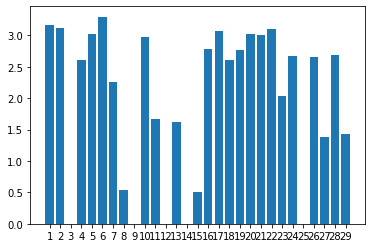

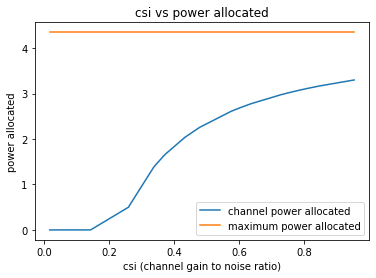

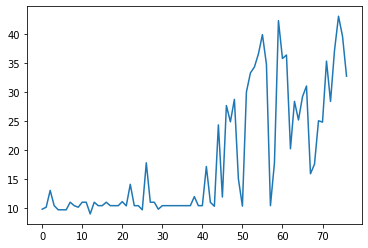

77
[8.06709006703529, 8.510471678748583, 9.013163685595948, 9.068934452050158, 10.171323245415309, 10.574327425497653, 10.895831838866531, 10.948044303204789, 11.54903813986418, 11.620583386369619, 11.621574162090218, 12.083390949300082, 12.11255285957093, 12.425645148356761, 13.834410055087671, 16.92922607575342, 17.878366851475196, 17.913661489392638, 19.491455538167518, 20.01461922485035, 20.081891621423257, 20.6889439387031, 21.28309211816909, 22.49886163885945, 23.70248570224974, 24.09357345974258, 24.43229945878181, 24.74532928246548, 26.408376692090947]


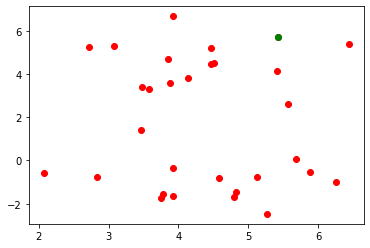

Power Allocated= 3.407123039179814
CSI= 0.6659673237004458
SNR= 8.06709006703529
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5673568343086908
CSI= 0.42710559382798785
SNR= 8.510471678748583
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.218788543965002
CSI= 0.27100934430139223
SNR= 9.013163685595948
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.600336
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.442389

Power Allocated= 0.13911770214615427
CSI= 0.2096620442144267
SNR= 9.068934452050158
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.714514
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.507452

Power Allocated= 0
CSI= 0.13988894258244866
SNR= 10.171323245415309
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5587076400923947
CSI= 0.42553362189154476
SNR= 10.574327425497653
Client: client6
Model cli

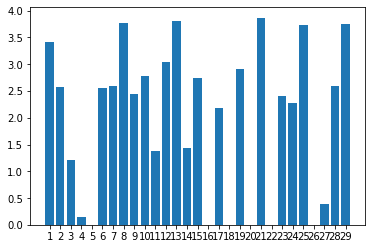

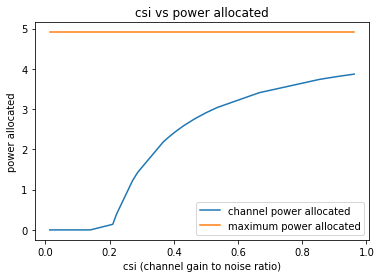

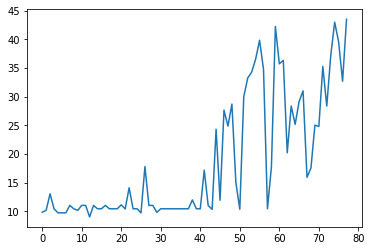

78
[6.426388039717548, 7.46649466772241, 8.014865065072023, 8.152426161942113, 8.283677787635748, 8.866501158166903, 9.161385436698897, 9.26905467187712, 9.46589224043779, 9.473139487570133, 9.951157551944902, 10.219252327532535, 10.457270307679726, 10.74680632182368, 11.148031092473278, 20.928585602547436, 20.93384157864138, 21.216264169039206, 23.482494511845623, 23.883161655455353, 24.497320997913512, 25.304450653095415, 27.13488339606914, 29.53290333822954, 30.614156749132437, 31.851051751093017, 34.71772240351858, 36.00342782384136, 37.602509227972156]


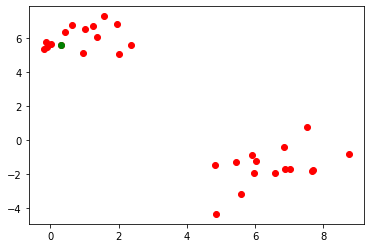

Power Allocated= 3.1464971177230296
CSI= 0.9967855153282672
SNR= 6.426388039717548
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.620351481449659
CSI= 0.6538638010758334
SNR= 7.46649466772241
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9999952849460385
CSI= 0.869771932923258
SNR= 8.014865065072023
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.416845917723726
CSI= 0.5770753190788449
SNR= 8.152426161942113
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1869746803698513
CSI= 0.5094899409526974
SNR= 8.283677787635748
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3687134975759978
CSI= 0.3595817885522352
SNR= 8.866501158166903
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.865669
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.387

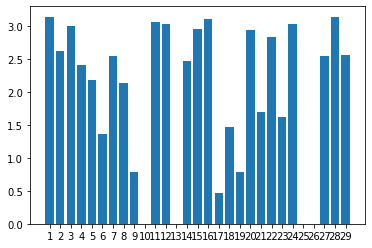

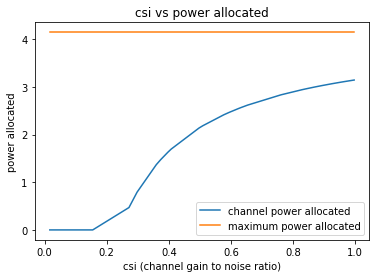

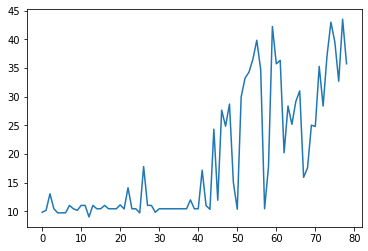

79
[3.577736586930328, 4.659443704113454, 5.48567409068647, 6.049708177478411, 6.159046148192309, 6.637166213155902, 6.982087125650882, 7.146812157842567, 7.515078193027234, 8.054275151812021, 8.108733801697674, 8.122869737911977, 8.187728307031296, 8.543898039333385, 9.525658470945608, 17.204155901006725, 17.57820626381998, 17.731581926793606, 18.031241762810634, 20.10434506773405, 20.55038104264252, 21.070034115245228, 21.806028935277673, 22.55362587824445, 23.986902549904187, 24.04408261790548, 24.433468662995196, 26.128257524020142, 27.16141835443365]


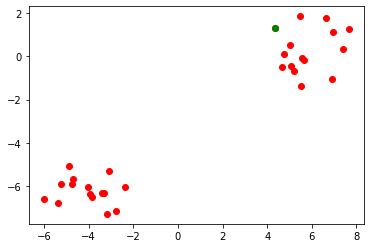

Power Allocated= 2.9317296380506517
CSI= 0.7296842023834955
SNR= 3.577736586930328
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2543044733354707
CSI= 0.9543068008505736
SNR= 4.659443704113454
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8305310546332296
CSI= 0.2880471005359101
SNR= 5.48567409068647
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.866179461022813
CSI= 0.6963758965676938
SNR= 6.049708177478411
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.609951
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.214833

Power Allocated= 2.0039934781200572
CSI= 0.43512464842971244
SNR= 6.159046148192309
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01999233182521054
SNR= 6.637166213155902
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

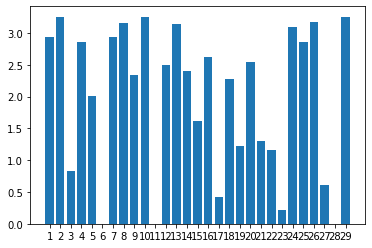

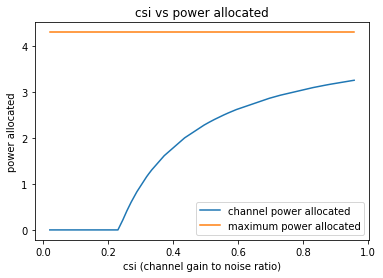

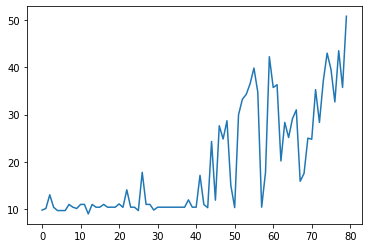

80
[0.5414575197717788, 0.7853355297140716, 1.503596937158994, 1.535095338902157, 1.721354596643656, 1.9210667931371699, 2.908955691683487, 3.0255693661168848, 3.4521186450498442, 3.786872494504086, 4.426393737707835, 4.749481313744805, 4.8071545902659105, 5.0127629307717525, 5.276876746873043, 18.532951846809034, 20.432738791172053, 21.98786110154677, 22.46165286851681, 23.831025872109414, 25.606354677884767, 25.731403580123388, 25.9356209768671, 26.066049565587498, 26.80475591812395, 26.885424363777506, 27.355500070386523, 28.500529379573887, 32.006842376962794]


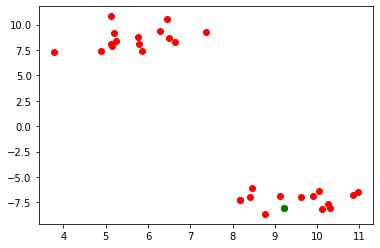

Power Allocated= 2.8592088222007734
CSI= 0.6155005314493175
SNR= 0.5414575197717788
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1484273509544487
SNR= 0.7853355297140716
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4621164159691356
CSI= 0.9786781526999265
SNR= 1.503596937158994
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.157777519829148
SNR= 1.535095338902157
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.642919094602025
CSI= 0.35199075657354406
SNR= 1.721354596643656
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11470273519214935
SNR= 1.9210667931371699
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09021303626331645
SNR= 2.908955691683487
Client: client7
Poor Channe

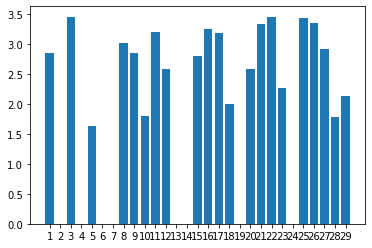

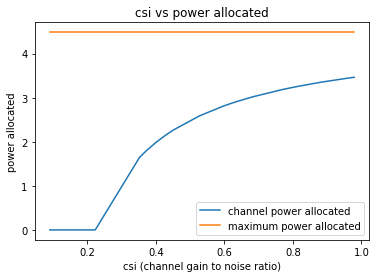

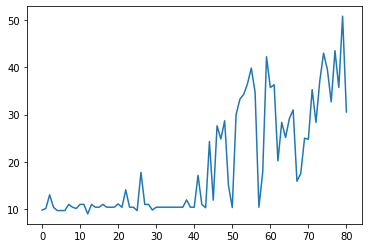

81
[3.9979171895869596, 4.894988345537484, 5.423628617243291, 5.741630243633328, 6.161535480071274, 6.683782620518896, 6.7402631903385615, 6.740645529393933, 6.766926769370435, 7.221275787670385, 7.5204316226964, 7.652769865883901, 8.04404520596353, 8.351297432144191, 8.766594207370305, 15.842083198305598, 18.39444289985683, 19.984611688702664, 20.391622663358234, 20.591833197333884, 22.8006287540051, 23.693858214612355, 24.279621125302327, 24.785005334148607, 25.879538103477934, 26.346108380052904, 28.422360405664897, 29.39866743947769, 31.15597083290478]


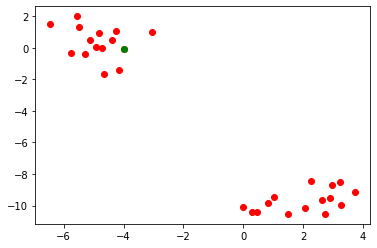

Power Allocated= 2.99994151559824
CSI= 0.8380247110186414
SNR= 3.9979171895869596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7550584009646197
CSI= 0.6953303390175848
SNR= 4.894988345537484
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0485802827591977
CSI= 0.4662779688461779
SNR= 5.423628617243291
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1891377690750304
CSI= 0.4989805873144205
SNR= 5.741630243633328
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.164140776635046
CSI= 0.9717389418291765
SNR= 6.161535480071274
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5337153023355632
CSI= 0.27326074367269415
SNR= 6.683782620518896
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.147082753365966
CSI= 0.95589

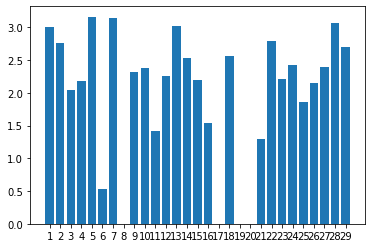

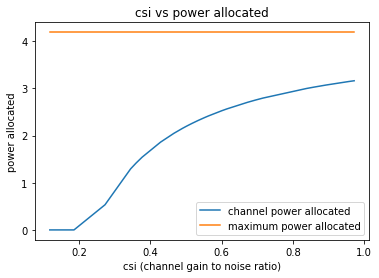

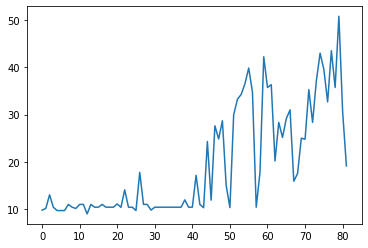

82
[13.550252911632, 16.184159736222107, 17.62020438061355, 17.728121675571362, 18.107374085983565, 18.993806523349143, 19.3975535858177, 19.640427764539986, 19.734871537074916, 20.633262922540535, 20.654968637556408, 20.70107053966848, 21.600831306538147, 22.27869296314934, 22.28316378074634, 22.90053200865249, 23.74409290640075, 24.57071937331029, 26.0901759308765, 26.12727648708792, 26.174680909723183, 26.21836791285498, 27.995962552440343, 28.60240682514314, 28.870864765438817, 33.98189085834263, 34.66861259968532, 41.207188687087786, 47.47911724970193]


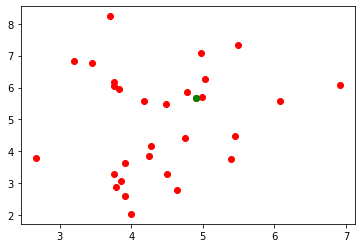

Power Allocated= 2.3155891584195376
CSI= 0.40448050497949206
SNR= 13.550252911632
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.052789
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.668622

Power Allocated= 2.4315431569604304
CSI= 0.42438462420915735
SNR= 16.184159736222107
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.117730
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.280861

Power Allocated= 2.6216781242380325
CSI= 0.461634039491569
SNR= 17.62020438061355
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.567122
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.080297

Power Allocated= 1.461073882770004
CSI= 0.30058713845298923
SNR= 17.728121675571362
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.614623
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.400295

Power Allocated= 3.331496907272439
CSI= 0.6866248878893682
SNR= 18.107374085983565
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Lo

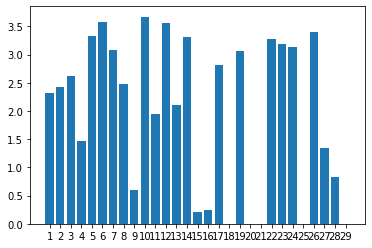

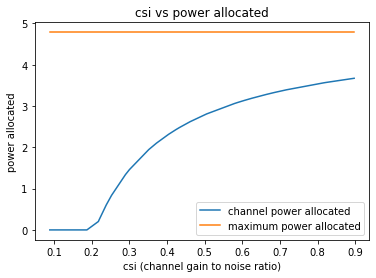

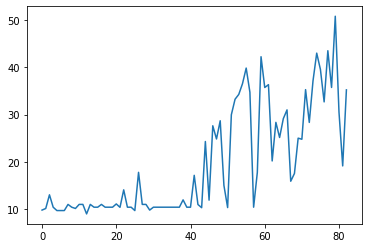

83
[-0.9692667215654316, -0.5444579507248308, -0.2728110667227108, 0.15759542469273358, 0.4293619702584084, 0.49856835438549973, 1.2221487903744221, 1.2515402549111458, 1.3984345791333888, 1.5937315157583383, 3.3560972800501294, 3.521242003641561, 3.5655327216219126, 3.8033361502179375, 4.254573558057729, 15.742227019771473, 15.903403282789581, 16.37161614617071, 18.63054609883619, 19.381560652539285, 19.76996951173103, 20.35709937155353, 20.5617792069728, 21.81172362487486, 21.922252882378206, 23.050408171699765, 23.672513674265375, 23.948720051001303, 26.07609816482781]


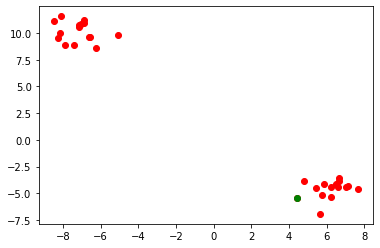

Power Allocated= 0
CSI= 0.14420199030108427
SNR= -0.9692667215654316
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.187186960793079
CSI= 0.3771861859456951
SNR= -0.5444579507248308
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3849040304569682
CSI= 0.2895618602537723
SNR= -0.2728110667227108
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.042934793102816005
SNR= 0.15759542469273358
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7680934228305403
CSI= 0.48302082773412436
SNR= 0.4293619702584084
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.209014
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.482967

Power Allocated= 2.3983911971378813
CSI= 0.40983500309283294
SNR= 0.49856835438549973
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allo

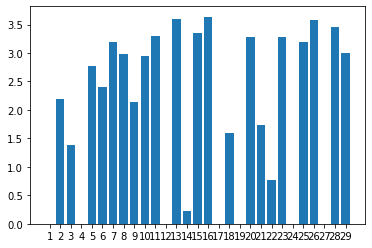

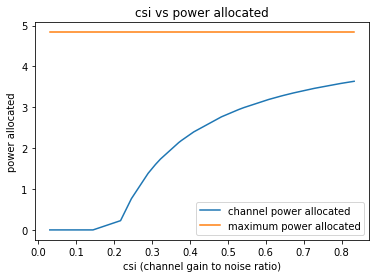

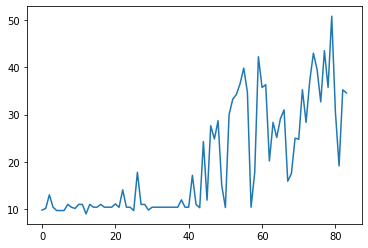

84
[3.0433745779512495, 3.7208489729961647, 5.376480426047782, 5.429873540676726, 5.53904996511116, 5.726674779449651, 6.601181127261903, 7.2159838735667385, 7.435289580578765, 7.795201718365885, 8.023030733133961, 8.20329667414939, 8.24637597043229, 8.698009750531487, 9.337650328370257, 12.822023885599073, 14.889207106375459, 15.785586166515664, 16.64213701957315, 17.56142888256508, 17.634784560365347, 17.861142230356947, 18.057419224969905, 18.336242466664253, 21.466748578532954, 24.319031108957525, 24.906533680653208, 30.17779247104592, 31.254385695150514]


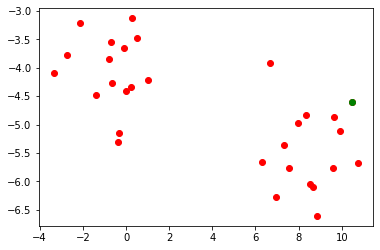

Power Allocated= 0
CSI= 0.21232007300938394
SNR= 3.0433745779512495
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5681461934093925
CSI= 0.261401898774968
SNR= 3.7208489729961647
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.895207
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.594330

Power Allocated= 0
CSI= 0.22613478758047056
SNR= 5.376480426047782
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.225599785293272
CSI= 0.8561106381175441
SNR= 5.429873540676726
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.00487938730088
CSI= 0.7200493371595578
SNR= 5.53904996511116
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6786066125267407
CSI= 0.5830677708723705
SNR= 5.726674779449651
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9591321

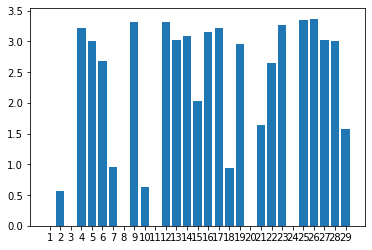

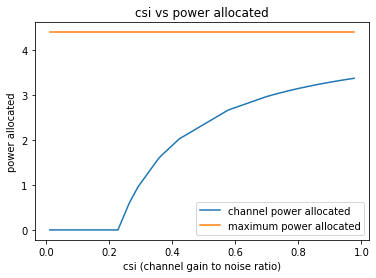

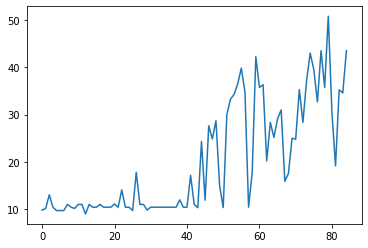

85
[-0.6879447686954094, -0.05194245133929165, 0.4769729951155215, 0.5229516963172256, 0.7811435693627109, 1.0979570094499689, 1.6342676832715526, 1.6536539550890543, 1.6865262036908253, 1.7645036764802793, 2.0042986631548168, 2.009522830091835, 3.537258635025529, 3.5699744287111876, 4.47076176082505, 16.252113006541578, 17.497989833751507, 18.825337343386884, 21.965835834256787, 21.982539203418728, 23.164581034754473, 23.280014724682154, 23.78512452436387, 24.977400572840644, 25.745704183766865, 26.60000750925621, 28.30378079530789, 28.52279305389929, 31.538617036005114]


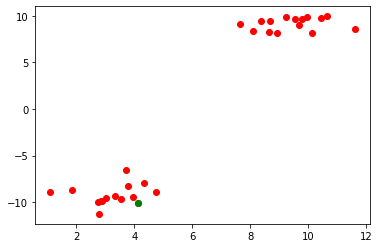

Power Allocated= 0
CSI= 0.19927071599669244
SNR= -0.6879447686954094
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4552072210446383
CSI= 0.7047031254178678
SNR= -0.05194245133929165
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.745292
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.780922

Power Allocated= 3.200974302614324
CSI= 0.5976321136187599
SNR= 0.4769729951155215
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.920038274318069
CSI= 0.5117167220627091
SNR= 0.5229516963172256
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1933086705513913
CSI= 0.5949067104039231
SNR= 0.7811435693627109
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7836837509217442
CSI= 0.24446526118836476
SNR= 1.0979570094499689
Client: client7
Poor Channel, client not taken for averaging in this round


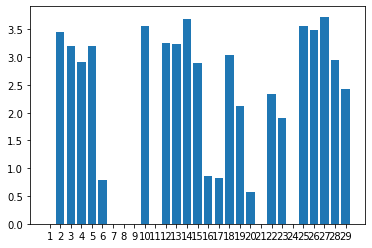

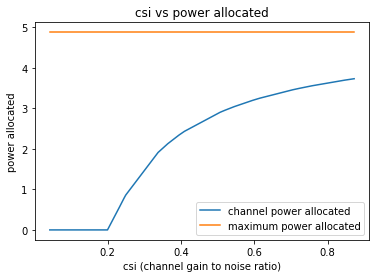

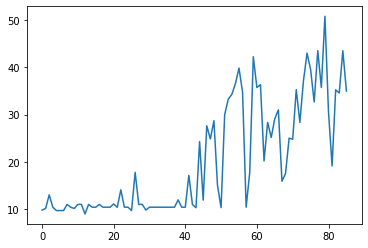

86
[0.372428630827236, 2.3721097699186604, 2.4240658749988957, 2.9725828481948096, 2.9907413625783397, 3.626618140140959, 3.8568767261281303, 4.274741177018395, 4.357350118969897, 4.434592375975129, 4.589059314843894, 4.764873502927404, 4.832251353680479, 5.207470195725152, 6.104820978380828, 16.065295099813675, 17.925774143626, 17.953261968462833, 18.5189173992083, 18.562014097555444, 19.830907219216158, 21.163461785886565, 23.138133755634108, 24.291427914829892, 25.504333602005968, 26.12739991553355, 26.3264803293404, 28.27359967501003, 34.4396911489877]


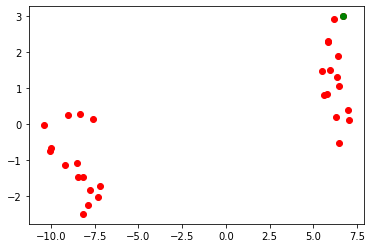

Power Allocated= 0
CSI= 0.03292487210158446
SNR= 0.372428630827236
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.190488787529448
CSI= 0.32397360854153245
SNR= 2.3721097699186604
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22328482810796613
SNR= 2.4240658749988957
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.482344272684654
CSI= 0.5571602721355937
SNR= 2.9725828481948096
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5553559759945252
CSI= 0.36740338531051053
SNR= 2.9907413625783397
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7901811933632028
CSI= 0.4020943045794265
SNR= 3.626618140140959
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7180172224508006
CSI= 0.2809665338299181
SNR= 3.8568767

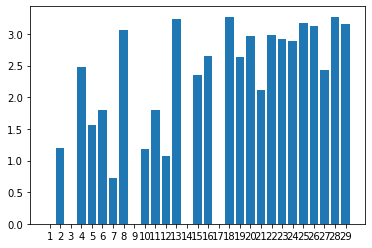

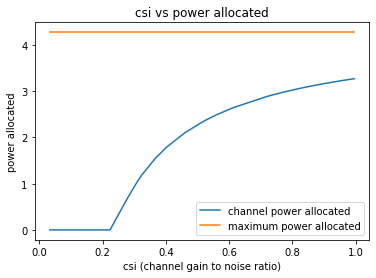

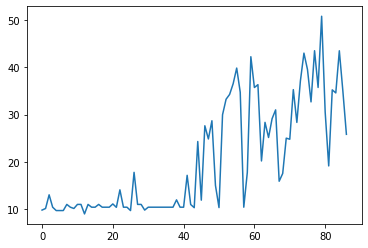

87
[4.924198761214223, 5.523258483298852, 6.100696130839291, 6.84161106890897, 6.904797313191706, 7.500858614384342, 7.744410732346912, 8.119894486501291, 8.409162238257679, 8.849483535467042, 8.890528825175034, 9.161828671587518, 9.252445999002596, 9.270840555780392, 10.059610903796411, 13.592721285233733, 13.98781503754514, 15.74841781391478, 16.28926248487475, 16.41956899287843, 17.808922080535574, 18.53676288549799, 19.060005293086476, 19.55311159245396, 20.069517130441152, 20.170359237068503, 21.119067927227256, 22.736890285238072, 26.707234144076562]


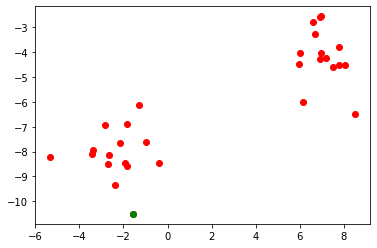

Power Allocated= 2.8201009151939824
CSI= 0.5882777231603139
SNR= 4.924198761214223
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.67880238867078
CSI= 0.5431311541811112
SNR= 5.523258483298852
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1286226783304707
SNR= 6.100696130839291
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3233213363887053
CSI= 0.8356613691129813
SNR= 6.84161106890897
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2794483509997514
CSI= 0.235819581764263
SNR= 6.904797313191706
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.266800
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.494671

Power Allocated= 3.45298709181648
CSI= 0.9372148415876826
SNR= 7.500858614384342
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.276013
Model client6 Tra

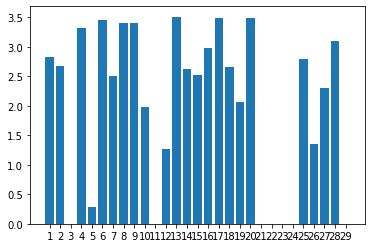

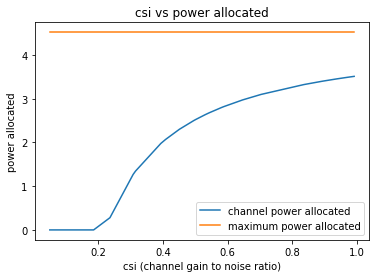

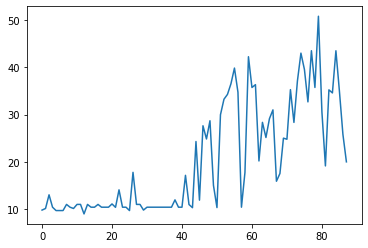

88
[8.598796562954048, 9.205793256767418, 9.313369833577507, 9.685887232356329, 10.122591702688867, 11.647129359314038, 11.989124294389164, 12.428617863176608, 12.873801084189202, 13.397509440019348, 13.701939761670626, 13.944780716481219, 14.153699871193913, 14.769540022350863, 15.717453613501615, 19.308818976154253, 20.483688194649417, 20.69911939737908, 20.724966093003427, 25.44460496071234, 25.676025798747265, 26.08595814472367, 26.753338188602555, 26.791336924515257, 30.635652619966674, 31.82530386806857, 32.72802524525094, 32.88803447295081, 34.18849546819036]


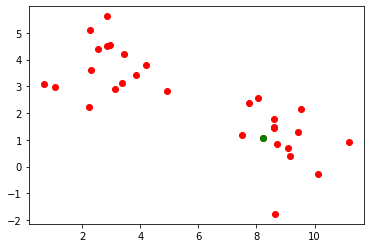

Power Allocated= 0.05489273447642873
CSI= 0.22213601920140869
SNR= 8.598796562954048
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.164388
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.171663

Power Allocated= 3.2925464234740893
CSI= 0.7910812865528729
SNR= 9.205793256767418
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.008293691363465139
SNR= 9.313369833577507
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1772504555184442
CSI= 0.22834237806901347
SNR= 9.685887232356329
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.869616
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.279933

Power Allocated= 3.246144279006507
CSI= 0.7630705918813546
SNR= 10.122591702688867
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4479375593647363
CSI= 0.9019560564750742
SNR= 11.647129359314038
Client: client7
Model c

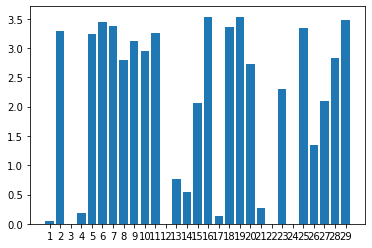

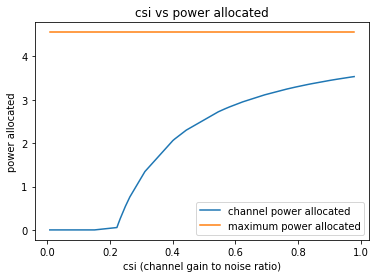

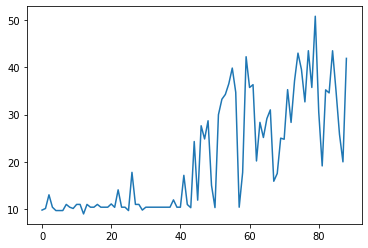

89
[1.3362219904407207, 1.6189042791076327, 2.48413690436008, 2.637735492175823, 2.6427187967711534, 3.5859882422141154, 4.394722395063312, 4.862982808830677, 5.171137949235024, 5.598373986792198, 5.980786614137466, 5.987731578636397, 6.04847768043218, 6.084801472603994, 6.708770680650541, 16.000746933678506, 19.32157014406116, 19.344703962695025, 19.43924128304661, 20.378916818502514, 22.263910128210654, 23.549017880415164, 24.18105550369416, 25.329883518010874, 25.38142386608822, 27.869556776487247, 30.611243338862774, 31.463860381565716, 39.31626147003182]


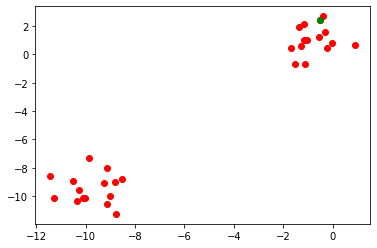

Power Allocated= 2.58359334844619
CSI= 0.4903913415319472
SNR= 1.3362219904407207
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9502684620168664
CSI= 0.5979028188864373
SNR= 1.6189042791076327
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4187381369467484
CSI= 0.8305351716510777
SNR= 2.48413690436008
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10263657907047607
SNR= 2.637735492175823
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.031037711730480422
SNR= 2.6427187967711534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1799026918337705
CSI= 0.6930591091637492
SNR= 3.5859882422141154
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1477029805225658
SNR= 4.394722395063312
Client: cl

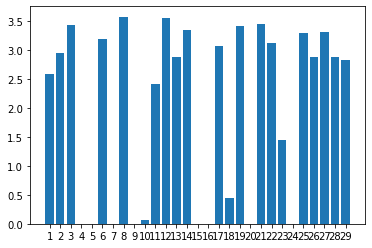

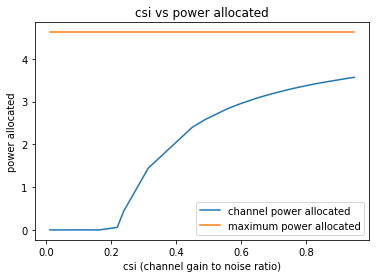

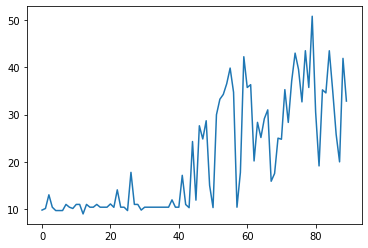

90
[6.048972226664648, 7.1074291291172855, 7.440785828679027, 7.812197162676359, 8.105479761515468, 8.21746840666608, 8.237792019937524, 9.221423166547842, 9.397635614453812, 10.143727647688165, 10.480474117120373, 11.243582306173458, 11.245863935039438, 11.608045911028649, 11.616787636615417, 14.524823435846288, 16.624525676806698, 17.017816584149344, 18.679131205273627, 19.163414931720975, 19.19220088966744, 19.35895615292871, 20.818909459815217, 21.112958419184345, 21.402177510462593, 22.06985933429487, 22.214436574326108, 23.568255642869246, 25.50899539310607]


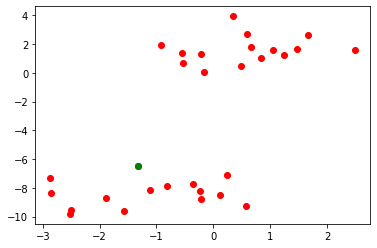

Power Allocated= 2.6202212795758424
CSI= 0.5292223464083139
SNR= 6.048972226664648
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.770996370792978
CSI= 0.36512476282145157
SNR= 7.1074291291172855
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.684868
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.474055

Power Allocated= 0
CSI= 0.1983570151268893
SNR= 7.440785828679027
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.726563872381136
CSI= 0.5607825587696921
SNR= 7.812197162676359
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.390872
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.104576

Power Allocated= 0.41906037354542836
CSI= 0.24445539339258038
SNR= 8.105479761515468
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9608839810136187
CSI= 0.6456185318957075
SNR= 8.21746840666608
Client: client6
Poor Channel

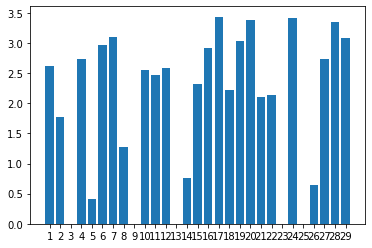

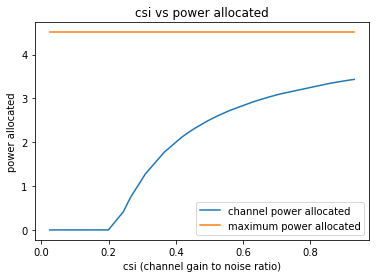

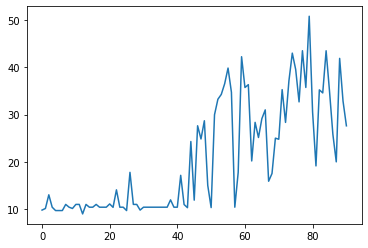

91
[3.0459863115133388, 4.162066227802523, 4.424027117405046, 4.456632962172729, 4.997808026126812, 5.21626154182181, 6.028477385742805, 6.135331384732326, 6.365827548748876, 7.089620288973301, 7.24067618369852, 7.6565512992316975, 7.735312794784786, 7.876725038390211, 7.904539810648022, 15.649391205663207, 16.577999491473193, 18.643311400663002, 20.203899161474194, 20.240687047687583, 20.96964350951683, 21.08679035714706, 21.19487898777462, 21.25206687793479, 23.12760823241579, 23.371832653232822, 25.201359698753407, 26.623228033994174, 29.359255420942816]


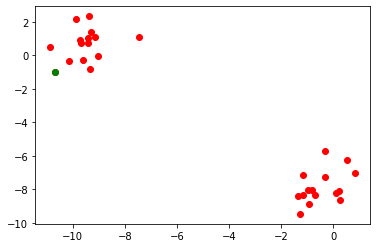

Power Allocated= 0.6710364089047554
CSI= 0.24884812743567664
SNR= 3.0459863115133388
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.407066
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.016814

Power Allocated= 3.1201211976784036
CSI= 0.6371738104941149
SNR= 4.162066227802523
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1453555128983433
CSI= 0.6475861176467408
SNR= 4.424027117405046
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.29528607246584215
CSI= 0.22756931181968565
SNR= 4.456632962172729
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.367997
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.142016

Power Allocated= 0
CSI= 0.11572504277191431
SNR= 4.997808026126812
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.659481335972794
CSI= 0.970807486018106
SNR= 5.21626154182181
Client: client6
Poor Channe

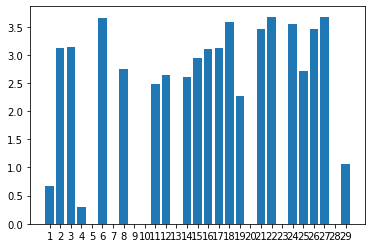

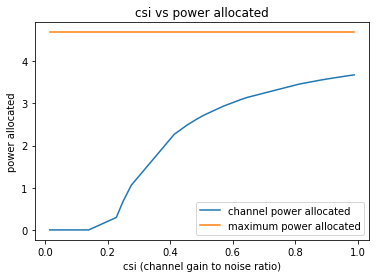

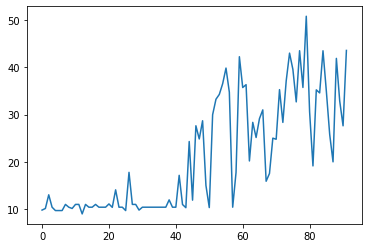

92
[6.407378737384242, 6.7047598023549435, 6.9376818182965785, 7.079978495845112, 7.34090970902175, 7.718630701052106, 7.967456294496197, 8.14674850552176, 8.914753249056838, 9.05881351635343, 9.098013837980838, 9.11872927370661, 9.254636190728034, 9.349805984666624, 9.64685122170908, 15.651548326371277, 16.510865504847484, 20.041832753856124, 22.548555302048257, 22.884428085438778, 22.949167874339256, 23.98527684293092, 25.438971200702518, 27.259598122531422, 27.92279104536737, 29.184764653405814, 30.09358589563862, 30.877108336092423, 32.446356076543495]


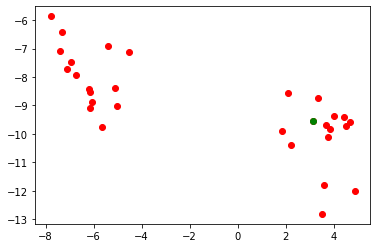

Power Allocated= 1.4816442613742877
CSI= 0.33787871030530514
SNR= 6.407378737384242
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.019424956359123557
SNR= 6.7047598023549435
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6509912953207913
CSI= 0.558567194349309
SNR= 6.9376818182965785
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3153252703592733
CSI= 0.8881302865834897
SNR= 7.079978495845112
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.392765207384646
CSI= 0.953724351154863
SNR= 7.34090970902175
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.66512979050894
CSI= 0.5630134804776046
SNR= 7.718630701052106
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.358050397581764
CSI= 0.9231600368215442
SNR= 

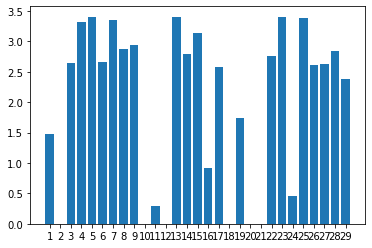

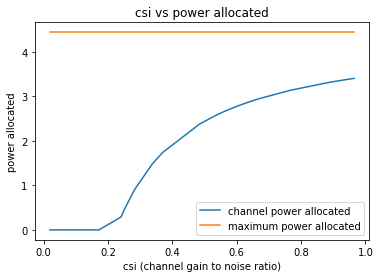

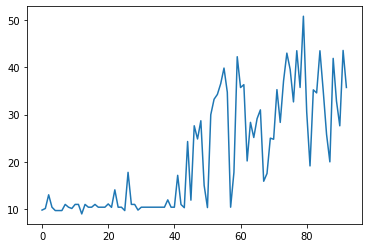

93
[-2.7019785325421735, -2.5253461189120285, -2.15807230706908, -1.8408063517483564, -1.829963819819259, -1.6188628170655441, -1.4611334070272592, -0.6160123487935194, -0.4434878506848072, -0.1978889978923517, 0.15500712010282447, 1.1286804315236205, 1.3550610490329125, 1.778787338300841, 2.21749161563518, 15.190661487939431, 18.799531061088796, 19.262584473597293, 22.261193744604974, 23.13200314601864, 23.196090507777058, 24.566767635366425, 25.944717596562676, 26.22674137429902, 26.454870330889992, 27.70622991412243, 28.042117392327118, 32.617503811366646, 34.59193091257648]


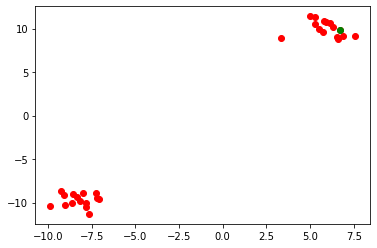

Power Allocated= 0
CSI= 0.01728748498131716
SNR= -2.7019785325421735
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.85452953195788
CSI= 0.6696593497469235
SNR= -2.5253461189120285
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6613004031712237
CSI= 0.5929349369618311
SNR= -2.15807230706908
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16700691894077058
SNR= -1.8408063517483564
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6146047103176566
CSI= 0.5769603430226513
SNR= -1.829963819819259
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.791133
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.370553

Power Allocated= 0
CSI= 0.12866003124342462
SNR= -1.6188628170655441
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0020442568230

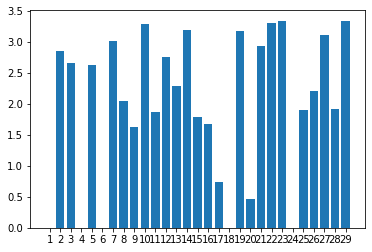

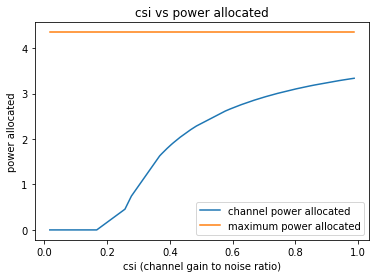

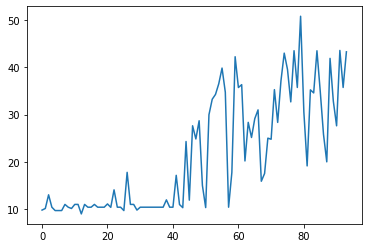

94
[2.4153082326764013, 2.814539848126965, 3.5276768150213176, 4.282882785459831, 4.4654734615178775, 4.567147930959622, 5.348315795184818, 5.411881078400707, 5.711924686113306, 5.720968597572648, 5.796402947331357, 5.877006518675812, 6.1660726332602955, 6.429719895426245, 6.612087299819831, 17.42142326873273, 18.34597255152519, 22.88340722530326, 23.09235205333438, 25.133258211169867, 26.860421211101865, 27.06246775073326, 27.210159214658628, 28.210061254038703, 29.05361506653174, 29.682590968077633, 30.486343563344498, 32.14449196118127, 40.066390409662446]


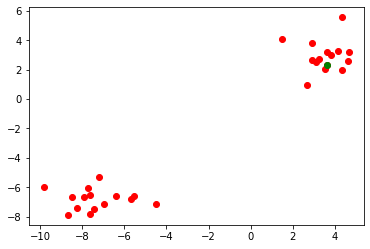

Power Allocated= 3.543918394240297
CSI= 0.7035689011804069
SNR= 2.4153082326764013
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7948251187233817
CSI= 0.8543954790066838
SNR= 2.814539848126965
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2700594372810037
CSI= 0.37103220116985347
SNR= 3.5276768150213176
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8224316790448496
CSI= 0.8750348564514154
SNR= 4.282882785459831
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11923868359924727
SNR= 4.4654734615178775
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.730316420917382
CSI= 0.8097645451165906
SNR= 4.567147930959622
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.036378385480789754
SNR= 5.34831579

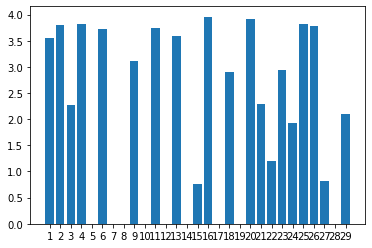

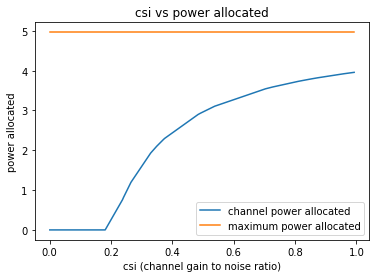

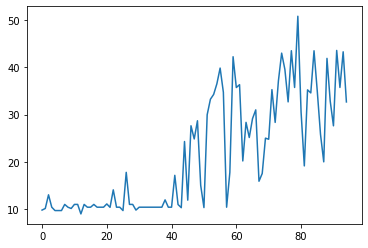

95
[1.8387284233407062, 1.9434640336524147, 2.0367718568015842, 2.3222320555901046, 2.975924677286459, 3.3496348381590106, 3.499136881414213, 4.74327024635695, 4.903591649108172, 4.9492158473650765, 5.0249184290492135, 5.232168431459457, 6.474300963143369, 6.630472477986309, 7.355015465532993, 20.215993955674772, 21.831157658184015, 22.45077570417866, 22.937505970421483, 23.251653850793325, 25.207215638936713, 25.580448661160613, 25.607331440303263, 27.223559985946572, 28.200778493546945, 28.85623128343863, 29.7787977852713, 30.60463962705114, 38.21522441057175]


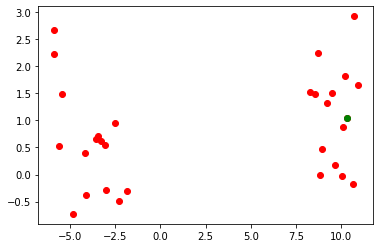

Power Allocated= 0
CSI= 0.08551899474990632
SNR= 1.8387284233407062
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030617025648248197
SNR= 1.9434640336524147
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3236718458461776
CSI= 0.9537559492776214
SNR= 2.0367718568015842
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.68786532003244
CSI= 0.37253760412875825
SNR= 2.3222320555901046
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.395665
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.098787

Power Allocated= 2.0104332451039393
CSI= 0.4234193492509202
SNR= 2.975924677286459
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.676157570879067
CSI= 0.5896224585185206
SNR= 3.3496348381590106
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0


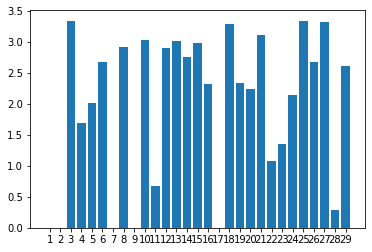

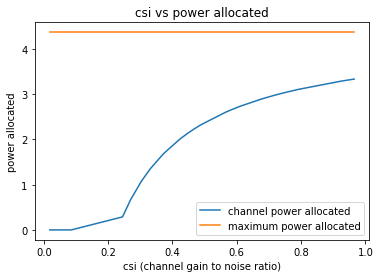

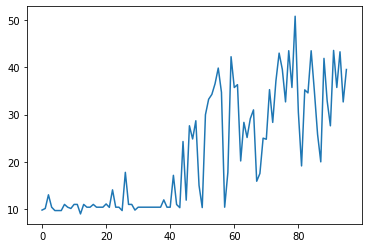

96
[5.2447365246953686, 5.465494169738985, 5.7228304983177, 5.760549912083295, 6.187474495822405, 6.502728578600005, 7.360450412825644, 7.410918494384204, 7.491905590497852, 7.525467907781901, 7.546162568580389, 7.557094208108975, 7.812501125460988, 9.754735740449762, 9.846533227889264, 13.811190607235794, 16.022444619096543, 16.459834742463983, 17.35486253264822, 17.81228652090817, 18.774838914494186, 19.6271514454483, 21.053705945094997, 21.814532209151956, 22.011782601315982, 23.623647139133507, 24.955634189871063, 25.907256982556255, 30.164452211886967]


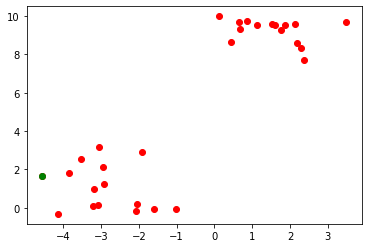

Power Allocated= 2.6931556552575957
CSI= 0.4207320127084323
SNR= 5.2447365246953686
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.031119295110767387
SNR= 5.465494169738985
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0866649948065263
CSI= 0.3351992164837907
SNR= 5.7228304983177
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.171506
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.796131

Power Allocated= 3.3398041157224805
CSI= 0.5779807566392963
SNR= 5.760549912083295
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04703895955386361
SNR= 6.187474495822405
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.05200696212914
CSI= 0.9823582582100312
SNR= 6.502728578600005
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.101095

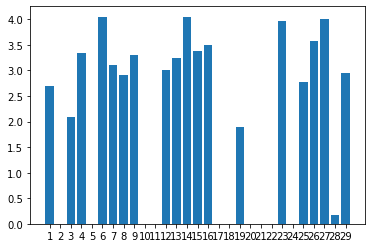

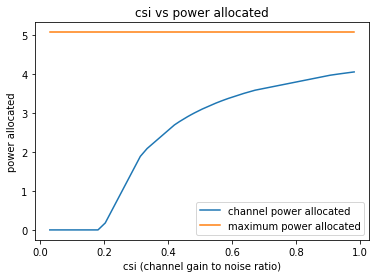

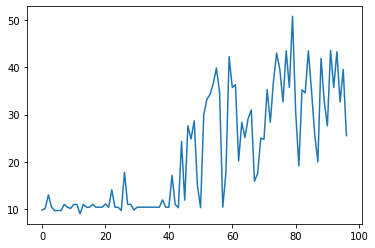

97
[-0.45043680459599944, 0.6418598113420666, 0.6943435677175436, 0.8239023365334983, 1.278987304651527, 1.29738079094838, 1.4588092661945584, 1.9268092547258844, 2.636307380222897, 2.728138240693804, 2.8641802005084562, 2.9320859683880856, 3.072828734348893, 3.4326383170901287, 3.5732365666718517, 19.598604757353026, 20.13236719466226, 22.617838833583786, 22.750421492229968, 23.036054837367033, 23.709743344869523, 26.46637505086927, 27.28507961776748, 27.950797025780368, 28.60854045314586, 30.494252103528076, 30.567235541797043, 33.46796087617972, 42.17973635721036]


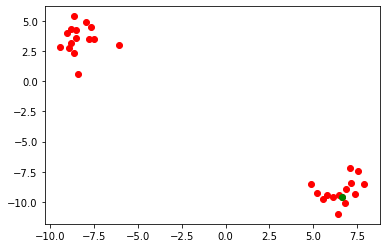

Power Allocated= 3.1300290184469657
CSI= 0.5864781675279946
SNR= -0.45043680459599944
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.006474784215405
CSI= 0.5468522368202676
SNR= 0.6418598113420666
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.800910672166553
CSI= 0.4915909299996969
SNR= 0.6943435677175436
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9526119225552208
CSI= 0.5312055629501492
SNR= 0.8239023365334983
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12218846554897178
SNR= 1.278987304651527
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.444323746148503
CSI= 0.7190113741996854
SNR= 1.29738079094838
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5894100639369899
CSI= 0.2355317406514108


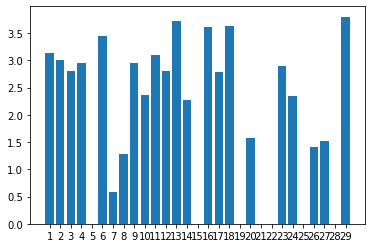

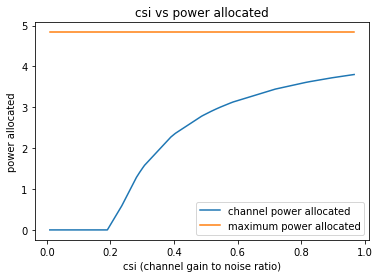

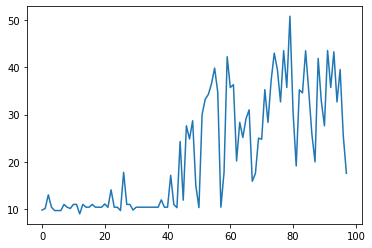

98
[2.029610964330277, 2.7463643871989802, 3.7777778655298064, 3.927786163633021, 4.309329194226754, 4.375113645909371, 4.634583407854704, 4.7329363700835305, 5.212011574202279, 5.278393780054705, 5.784163080000889, 5.973836486819998, 6.723956276594547, 6.823415280021818, 6.93902387410895, 18.38934395936021, 18.649242863658102, 18.990687275754965, 20.2165633322518, 20.265077301976838, 21.720786623529353, 23.163467021302008, 23.339856759438277, 26.278928576894923, 26.382952317219754, 26.9001028541964, 27.856993627876534, 27.909130129405774, 29.91870941978462]


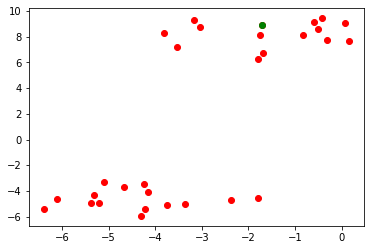

Power Allocated= 0.8352264063629864
CSI= 0.23154143476390432
SNR= 2.029610964330277
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.257268060227915
CSI= 0.5271926596715641
SNR= 2.7463643871989802
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.227687958134043
CSI= 0.5190976368922318
SNR= 3.7777778655298064
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.026950898674887203
SNR= 3.927786163633021
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11068148927599897
SNR= 4.309329194226754
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.001317960687932
CSI= 0.2408019748001119
SNR= 4.375113645909371
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.106922
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.147130

Power Allocated= 3.728

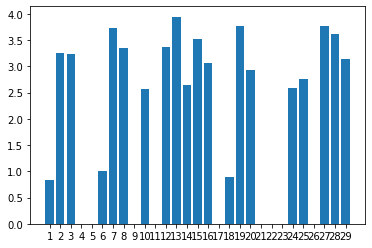

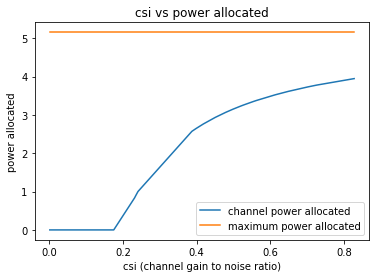

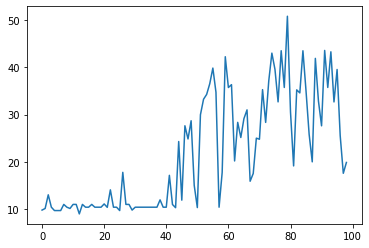

99
[11.37732972749711, 11.739805186941453, 11.9041778565026, 12.803737502713185, 13.086466113262613, 13.451405465174364, 13.8522519632077, 15.390279786868568, 15.409820204526888, 16.13276581920435, 16.225185930067664, 16.446496601898208, 17.56613500561412, 17.667077349852434, 18.74713425045303, 18.956065693217802, 19.056322584127336, 20.24998859516213, 21.295317012654884, 22.60502173148075, 22.708129547427095, 23.57926448649848, 25.170163776679725, 26.113532909132616, 26.140653946349435, 27.852187015238105, 29.416064639973502, 30.923289580323733, 31.977452100669957]


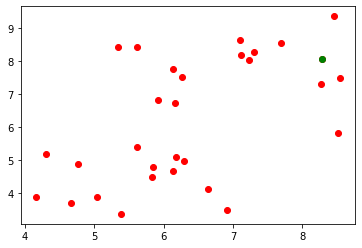

Power Allocated= 0
CSI= 0.028960606279620715
SNR= 11.37732972749711
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9062108536409808
CSI= 0.7986333064303693
SNR= 11.739805186941453
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.125793
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.498285

Power Allocated= 3.047227693726155
CSI= 0.8999909589547412
SNR= 11.9041778565026
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6388792611983787
CSI= 0.6581239087776397
SNR= 12.803737502713185
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3641364215781353
CSI= 0.557347258190115
SNR= 13.086466113262613
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.00742652924088
CSI= 0.8688675262174161
SNR= 13.451405465174364
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 2.627883
Model clie

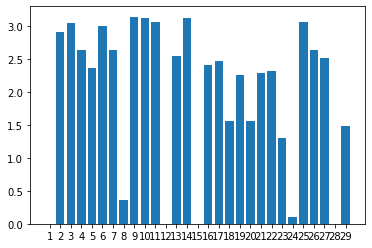

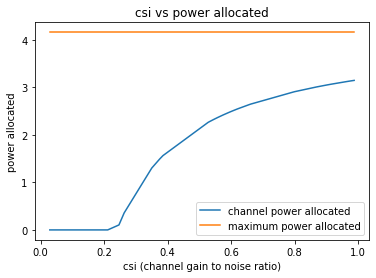

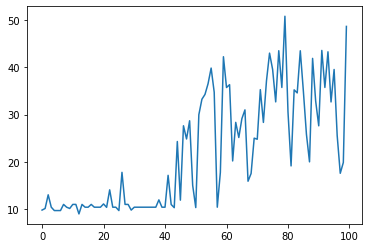

100
[15.131853569062097, 15.179026625054671, 15.863699158448552, 16.09467979691774, 16.961965329767132, 18.199324674525332, 18.295051055044052, 19.23285387637704, 19.870610853398897, 19.87732407859192, 20.175617009294694, 20.176506232636704, 21.075129863863943, 21.40079268016839, 21.526875859758313, 21.66305596812945, 21.708345490637566, 22.146291408998444, 22.164180844632426, 22.626262954826775, 23.14426131258922, 23.80145514838465, 25.158004239289227, 25.857872139189457, 25.935483656726433, 27.59709711591065, 27.792206076486167, 28.780401552019562, 30.68017567368457]


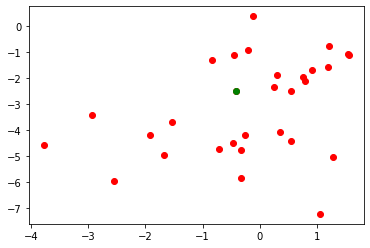

Power Allocated= 0
CSI= 0.027125126477698713
SNR= 15.131853569062097
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.522654907092539
CSI= 0.9072235487373064
SNR= 15.179026625054671
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04758990520833317
SNR= 15.863699158448552
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.852824428650443
CSI= 0.5643039486148658
SNR= 16.09467979691774
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.784728
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.080144

Power Allocated= 0
CSI= 0.07910288892988127
SNR= 16.961965329767132
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14884463620966515
SNR= 18.199324674525332
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5865753203661113
CSI= 0.49059438

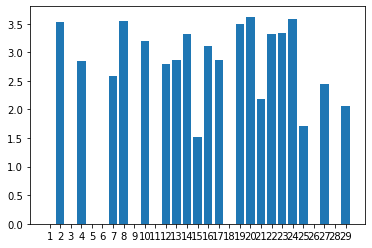

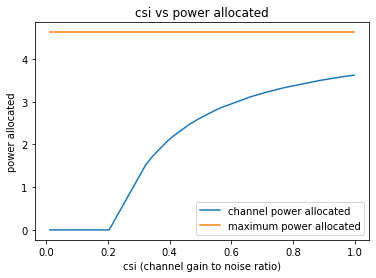

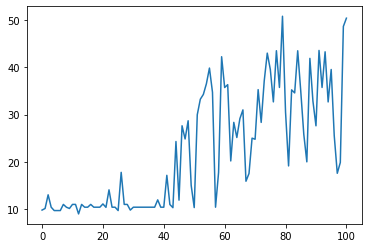

101
[5.129180458466518, 5.4989827343961215, 6.641224087719138, 6.960612976135655, 7.311095253831255, 7.554309188404236, 8.218229594810365, 8.430282190429985, 9.085884014687904, 9.149639944983532, 9.203539160948415, 9.642985542930685, 9.787230072137042, 10.398887266669032, 10.741087511606626, 19.728940170591027, 20.44121181040562, 21.632932790452443, 21.69981226786429, 21.71715792358944, 22.211470768354165, 22.765255532713667, 24.73795186191139, 25.657063134342724, 26.418367563009024, 26.714050897636906, 27.233778358894977, 29.40324131521961, 29.53857445297593]


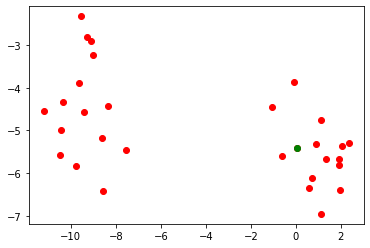

Power Allocated= 2.3303654734736767
CSI= 0.5129896151125053
SNR= 5.129180458466518
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.07460280411381
CSI= 0.8297929733067645
SNR= 5.4989827343961215
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.971189936269603
CSI= 0.7642147354727221
SNR= 6.641224087719138
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.359776
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.854563

Power Allocated= 2.8035641167949596
CSI= 0.6774340026947587
SNR= 6.960612976135655
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1952168519718699
SNR= 7.311095253831255
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.19253060965235935
CSI= 0.2446667502440124
SNR= 7.554309188404236
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.818480
Model client

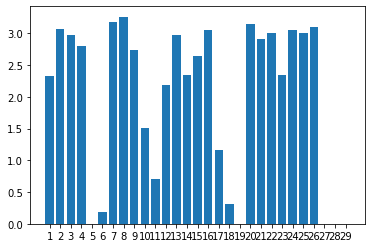

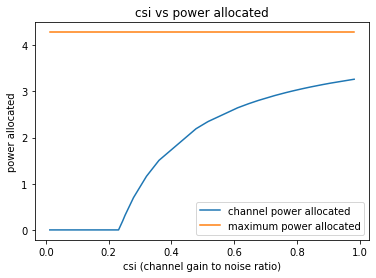

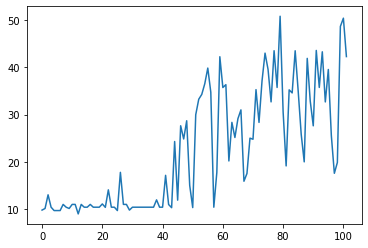

102
[-0.9268037751502334, -0.88867670461664, -0.8365669450228808, -0.8291623169780338, -0.4701159812031497, -0.16328099539479224, -0.06883313571847083, 0.06398108174041006, 1.008819598310715, 1.0243250611374806, 2.7959317764407006, 2.916088363890175, 3.2825370667193265, 3.8882839597759986, 4.41929775766053, 16.934472580525565, 18.500365934745684, 18.80336945768416, 21.032362281122186, 21.243166451766896, 22.965959024424606, 23.30886873441594, 25.32140698031907, 26.026844650373803, 30.050596922287617, 31.29998809471206, 34.7628340188422, 35.76944742838138, 46.321046412486744]


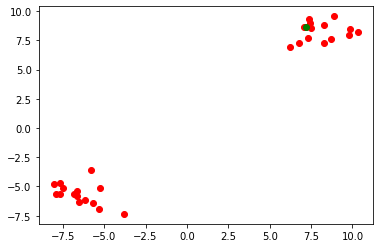

Power Allocated= 0.45611972285697133
CSI= 0.2524716081813163
SNR= -0.9268037751502334
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17115558757086125
SNR= -0.88867670461664
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3975686540744428
CSI= 0.9809764373272504
SNR= -0.8365669450228808
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5788738054988807
CSI= 0.544043792841822
SNR= -0.8291623169780338
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.01258850432297
CSI= 0.7120617286236487
SNR= -0.4701159812031497
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1922539371126103
SNR= -0.16328099539479224
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.368988871013989
CSI= 0.9542237313219465
SNR= -0.068

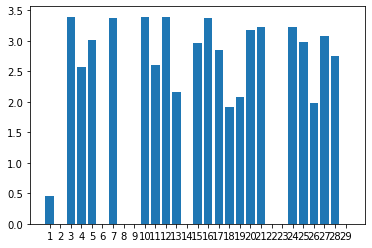

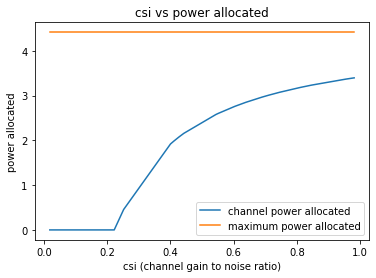

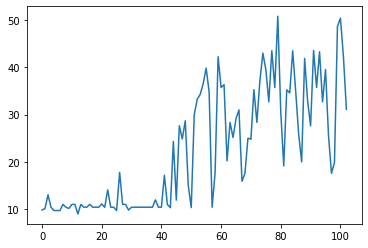

103
[12.526029760814012, 15.208827078747124, 15.635256276543942, 15.75805923983185, 16.513963407304423, 16.70544582887292, 18.45022431048354, 18.84808095946881, 19.553282145925863, 19.593324245863197, 20.44972084907068, 20.699908969702715, 20.775906104801088, 21.168640552669988, 21.350384481265824, 21.8229544242715, 23.00321917269848, 23.835179026395473, 23.850476954833564, 23.90528552283252, 25.141786835906515, 25.457220795375353, 26.697561089568172, 27.10409902563557, 27.993486920168515, 28.04509919904661, 28.990633184297213, 30.99889335138244, 32.38048397799436]


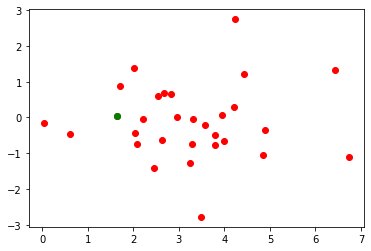

Power Allocated= 2.653220851499568
CSI= 0.7224145035231905
SNR= 12.526029760814012
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.350389
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.453793

Power Allocated= 0.5303601602509267
CSI= 0.28513525422084207
SNR= 15.208827078747124
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.043178
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.291409

Power Allocated= 0.8474796787018026
CSI= 0.3134808009441634
SNR= 15.635256276543942
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.410764
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.064346

Power Allocated= 2.8138548250147464
CSI= 0.8172519431854465
SNR= 15.75805923983185
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.379267
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.203132

Power Allocated= 0
CSI= 0.06051166781772921
SNR= 16.513963407304423
Client: client5
Poor Channel, client not taken for averaging in this roun

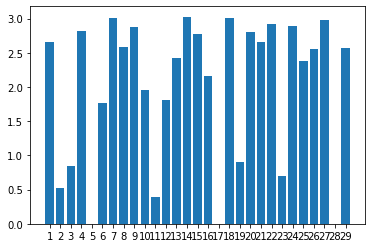

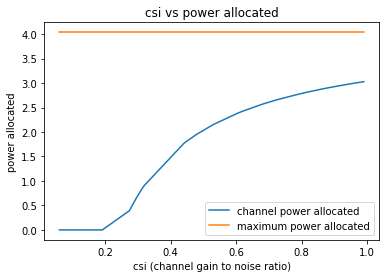

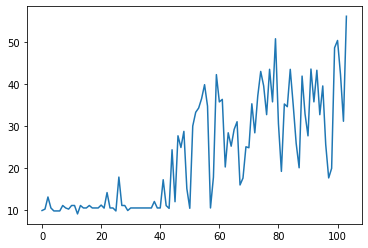

104
[0.8319165094190621, 2.043432363355271, 2.4497676843523095, 3.057280874707393, 3.163326585894332, 4.024852397198469, 4.041954414544355, 4.0662931613037046, 4.304070666949865, 4.386893182144243, 4.433383948770886, 4.66277681946564, 6.228717240961423, 6.280910813982934, 6.861663680391108, 16.914726666855803, 19.938665002144543, 22.860316190354723, 23.398717588126015, 23.64738789026518, 24.523393854888848, 24.889286399999403, 25.318011989747365, 26.582989578130185, 26.884949948318415, 28.631480972253488, 29.18701017310745, 29.47781233134821, 29.984229345222392]


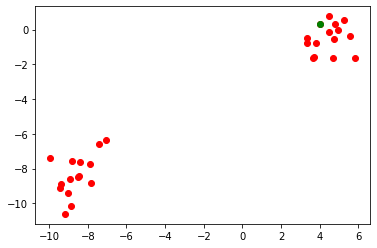

Power Allocated= 2.1980746268105187
CSI= 0.4998923468604608
SNR= 0.8319165094190621
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3636893918823634
CSI= 0.2607687084826986
SNR= 2.043432363355271
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.060481
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.291284

Power Allocated= 3.1910354069571643
CSI= 0.9925854609069455
SNR= 2.4497676843523095
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4844021514226484
CSI= 0.5833954520774739
SNR= 3.057280874707393
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7730694938571263
CSI= 0.7015398190290559
SNR= 3.163326585894332
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.453029337755118
CSI= 0.5729096265079523
SNR= 4.024852397198469
Client: client6
Poor Channel, client not taken for averaging in th

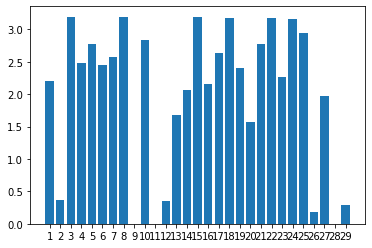

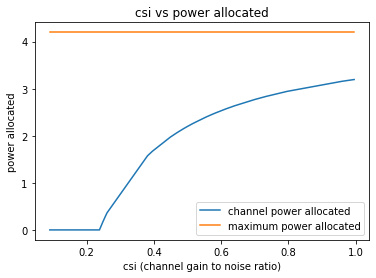

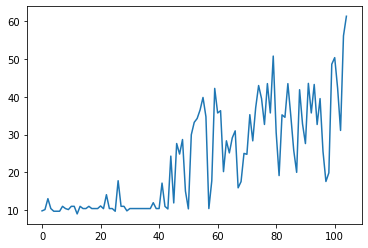

105
[3.671306196603636, 4.17420679586958, 4.47154785018661, 4.512379984374308, 4.926828471921752, 4.939097685321674, 5.000476401608408, 5.1141918963777915, 6.003761108332583, 6.276910099193547, 6.704127179991588, 6.879130203672807, 6.928926364054281, 7.734867902158603, 8.199224470453599, 13.523587616520361, 16.003388943567742, 16.05841590282033, 17.968017516989015, 18.756965287648065, 18.77603717051525, 21.10882455774145, 21.36983867099773, 21.507477125228817, 21.911982296657875, 22.536711623760876, 22.940990594049016, 24.260050350075876, 25.6325823445496]


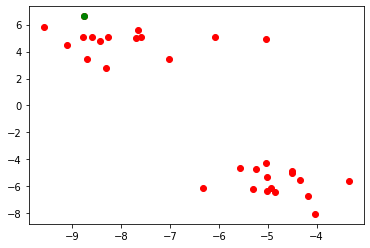

Power Allocated= 0.9546432869944357
CSI= 0.2900618827175142
SNR= 3.671306196603636
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15152180981017171
SNR= 4.17420679586958
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9838978068847712
CSI= 0.41351607457854633
SNR= 4.47154785018661
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3674451608975104
CSI= 0.9664279157655746
SNR= 4.512379984374308
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1929934019813473
CSI= 0.8269998370735603
SNR= 4.926828471921752
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.280763
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.550490

Power Allocated= 3.185967025702559
CSI= 0.8222220592340386
SNR= 4.939097685321674
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

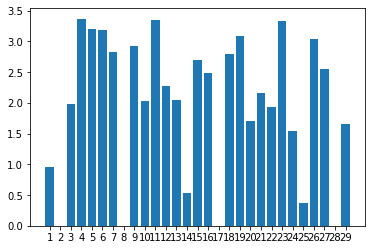

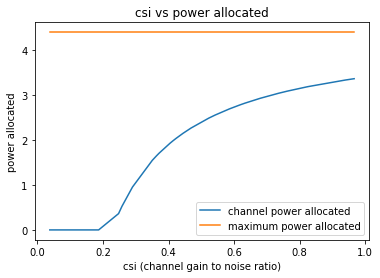

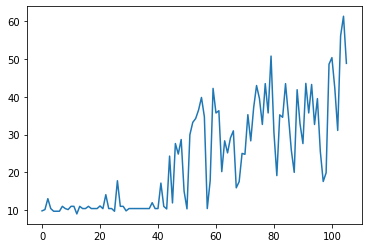

106
[8.992417947909392, 9.093978124724924, 9.452442827239775, 10.00538083298406, 12.57961545752294, 12.747320924441283, 12.941272473616939, 13.561607886844493, 13.63065859728648, 13.840223968369695, 13.890784646458616, 14.035641812243181, 15.217586942073686, 15.22866361493427, 16.68837149637892, 17.0016592149897, 17.199552408259624, 17.21667927094905, 18.73225689925075, 19.927343007600157, 20.79649831874218, 21.375115460372665, 23.20305632547968, 24.34944160969049, 27.276698993067253, 27.964127872906218, 28.355812376660808, 31.01851219585125, 33.43331556159199]


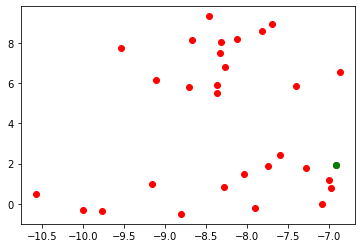

Power Allocated= 2.159946534577479
CSI= 0.46031324751458447
SNR= 8.992417947909392
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8442339915826684
CSI= 0.6719769790319519
SNR= 9.093978124724924
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.103469539551622
CSI= 0.8137287959989165
SNR= 9.452442827239775
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.656554
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.303441

Power Allocated= 0
CSI= 0.05040496267486283
SNR= 10.00538083298406
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06441559303093358
SNR= 12.57961545752294
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05871065576602219
SNR= 12.747320924441283
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6125028168384103
CSI

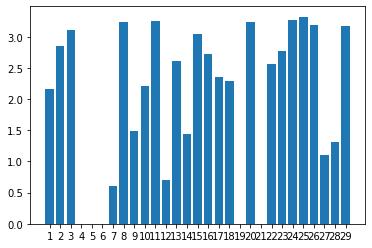

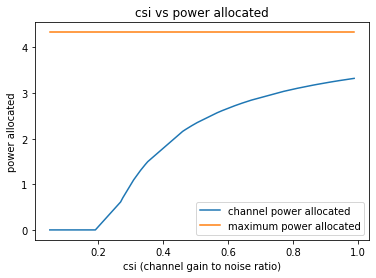

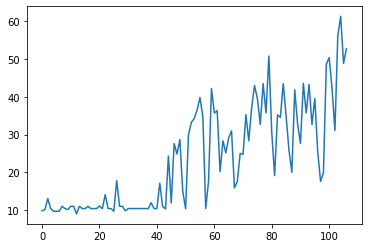

107
[1.5100380586566384, 1.897249736936483, 2.0082792450587315, 2.1676869877523117, 2.3569124502336782, 2.5324133275745444, 2.559497204854714, 2.685093871807376, 4.057800349965346, 4.368347305494524, 4.4301749345294175, 4.549717300599021, 4.840685724167783, 5.030213983991282, 5.288489651501242, 20.44893993672458, 23.73952345890563, 23.852517464214056, 25.409585550496406, 26.325943861102267, 26.881637156870354, 27.553288911990776, 29.048146458284233, 30.36105265903993, 31.09575145811007, 33.68967281256037, 37.48210155320848, 38.94892122514277, 44.19529335754509]


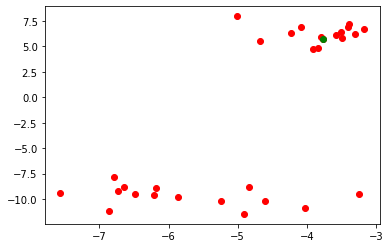

Power Allocated= 0.01853643576082309
CSI= 0.203182369779224
SNR= 1.5100380586566384
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 4.482191
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.932844

Power Allocated= 3.4627276566144536
CSI= 0.6768209475048191
SNR= 1.897249736936483
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9401497439711175
CSI= 0.49998161214568837
SNR= 2.0082792450587315
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.177029661694176
SNR= 2.1676869877523117
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2942292517924523
CSI= 0.6075356118373119
SNR= 2.3569124502336782
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.527924590968221
CSI= 0.41454236038278525
SNR= 2.5324133275745444
Client: client6
Poor Channel, client not taken for averaging in this round

Pow

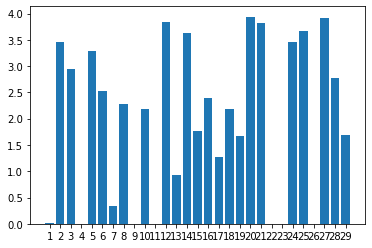

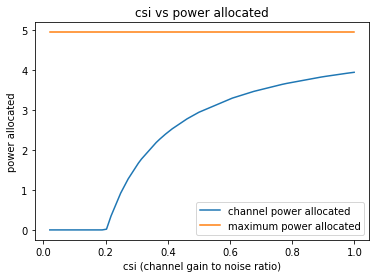

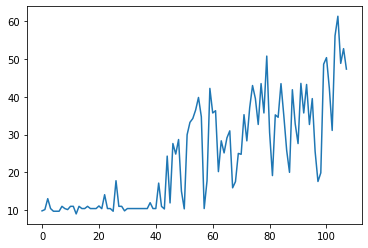

108
[5.584797489389277, 5.956482543101087, 6.337314918877293, 6.461534428970535, 6.633040187731511, 6.6586668959875315, 7.226722678868475, 7.400804503540773, 7.964100931430638, 8.274299961411955, 8.890574977521215, 8.966894409032273, 9.445167406332267, 9.487373742599175, 9.492808903680004, 13.699300110586677, 16.42694195372422, 17.115311284924946, 17.54440449226698, 18.930171157194597, 19.399480451898206, 19.591585585942383, 19.826889404809965, 21.196913579931508, 22.85673304556876, 24.213859785730257, 26.260799951142275, 26.871112091945808, 35.82682871377914]


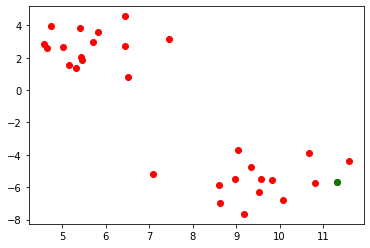

Power Allocated= 0.9109344526302419
CSI= 0.3117516312127533
SNR= 5.584797489389277
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06906825203849698
SNR= 5.956482543101087
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5933380473591132
CSI= 0.2836655640518334
SNR= 6.337314918877293
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.652840
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.411870

Power Allocated= 2.0754281413785516
CSI= 0.4894312213263853
SNR= 6.461534428970535
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.952964
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.091764

Power Allocated= 2.4006336944581244
CSI= 0.5820781229160381
SNR= 6.633040187731511
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.170769356051306
CSI= 0.5133874007370839
SNR= 6.6586668959875315
Client: client6
Poor Channel

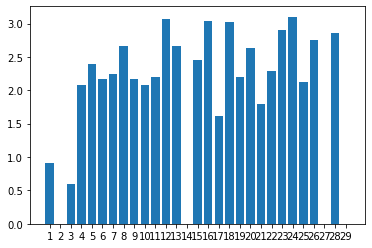

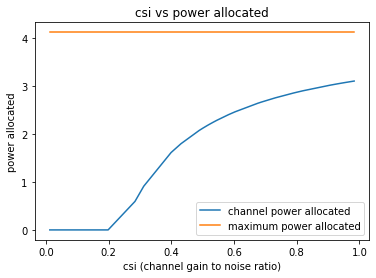

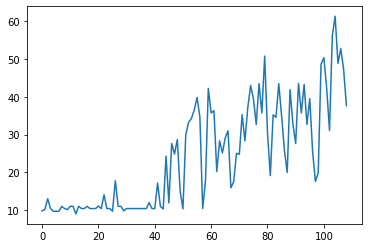

109
[3.6707425345326126, 4.019850099503815, 4.530795313602375, 4.600530179502938, 4.705225404740235, 4.7578860766682975, 5.235950179573574, 5.350724939150678, 5.839732400824042, 5.980771456139189, 6.893384183667905, 7.379944129168376, 7.740326023819387, 7.7459199116793975, 9.218165705805104, 14.82327483504119, 15.439522222652183, 15.467551052614429, 16.68509377096921, 17.49949315091077, 17.573655437444042, 18.845896328912815, 20.21042400819661, 20.2464381472173, 20.457836896969017, 22.30689058363895, 24.180840431736364, 24.718485470845312, 35.50776398546618]


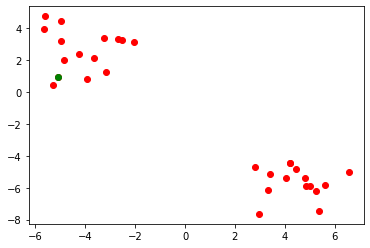

Power Allocated= 3.542651346347621
CSI= 0.9581636145499131
SNR= 3.6707425345326126
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1604216173503197
CSI= 0.412219365836756
SNR= 4.019850099503815
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.529656
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.176113

Power Allocated= 1.7647049647296411
CSI= 0.35440765618809067
SNR= 4.530795313602375
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1710003021404964
CSI= 0.7065569224967837
SNR= 4.600530179502938
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4799990159437808
CSI= 0.32192480937069823
SNR= 4.705225404740235
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7571937751378943
CSI= 0.5467107886635002
SNR= 4.7578860766682975
Client: client6
Poor Channel, client not taken for averaging in t

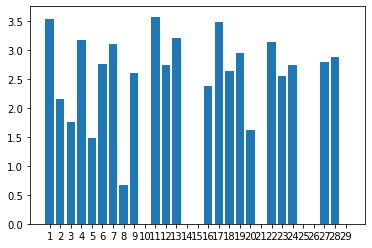

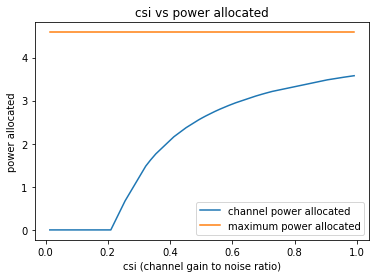

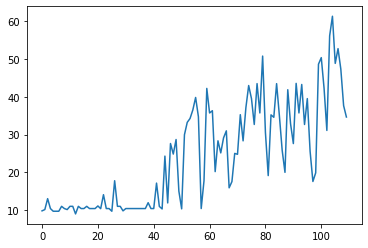

110
[6.831506529468415, 8.512196939405207, 8.74784510405527, 8.748507112773233, 9.114127518087209, 9.576659349858534, 9.608795962750811, 10.490151565527237, 11.35166001608392, 11.599000358704433, 12.084558052860805, 12.286929042780983, 12.319310885800162, 12.651103277662068, 12.758769201296833, 17.480910682903406, 22.01256304463685, 22.163733031575802, 22.888873649307243, 23.06434958640931, 23.975207005707563, 24.616009780696533, 24.89165880315636, 25.46043597230723, 26.633506885078198, 26.75244888907226, 26.953202717660506, 32.429976477879215, 39.741088067360806]


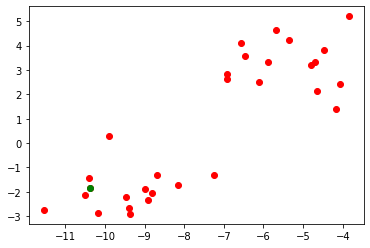

Power Allocated= 0
CSI= 0.09604172065509131
SNR= 6.831506529468415
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.573550474249971
CSI= 0.9114406485827773
SNR= 8.512196939405207
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.348069
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.247736

Power Allocated= 0
CSI= 0.05194998228414416
SNR= 8.74784510405527
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04259493568929962
SNR= 8.748507112773233
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9126523737437147
CSI= 0.5688080740636495
SNR= 9.114127518087209
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4942571443615558
CSI= 0.850009474435759
SNR= 9.576659349858534
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0676583811211586

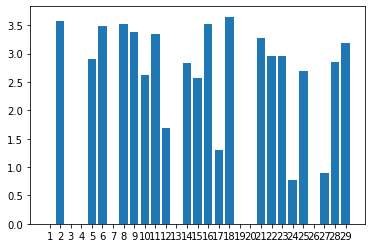

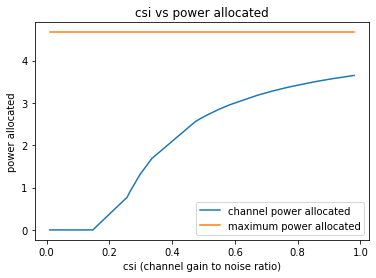

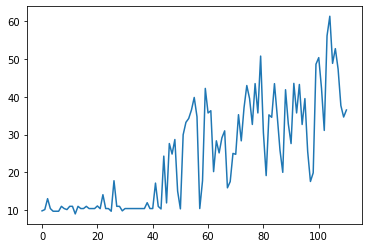

111
[5.764073787347852, 6.786209547084472, 6.929426845531078, 7.399830402081113, 7.4073568224592155, 7.923977437221974, 7.966598178352692, 8.734215195750476, 8.7425996987585, 8.880054180920256, 9.643489495455437, 10.517827868070246, 11.503799354853971, 11.636630335943341, 13.008501146433192, 16.08118076207363, 16.872065876856368, 17.625822197534603, 18.365052697051333, 18.771750626776154, 19.566779671295052, 19.572262591136603, 21.231589640957004, 21.25572786109417, 21.315964853356768, 22.985194624400172, 23.075720794687356, 24.52360723835384, 31.622385895160132]


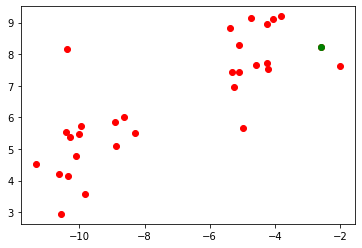

Power Allocated= 1.3174074880057005
CSI= 0.2567932675564375
SNR= 5.764073787347852
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.163836
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.307537

Power Allocated= 3.073441276685355
CSI= 0.46769418751299274
SNR= 6.786209547084472
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.431656
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.166449

Power Allocated= 0
CSI= 0.1382382914925936
SNR= 6.929426845531078
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.033345042046439066
SNR= 7.399830402081113
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.173999024138646
CSI= 0.9637703745890768
SNR= 7.4073568224592155
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.203587587697532
CSI= 0.9920605495932798
SNR= 7.923977437221974
Client: client6
Poor Channel, client not take

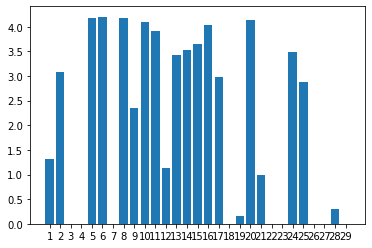

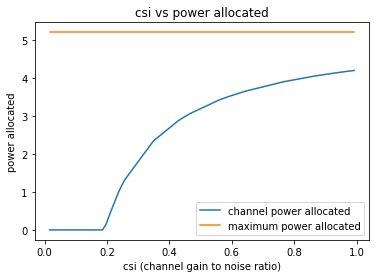

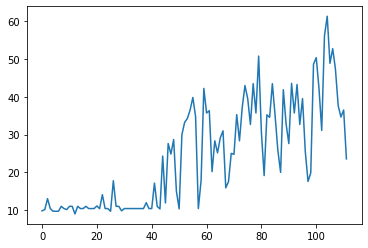

112
[5.544876663353776, 5.7300184659592865, 6.9263678038717424, 7.260503187923643, 7.515338059381678, 8.205397217718499, 8.453565541931336, 8.885031108336289, 9.220659938543857, 9.36624059881325, 9.517342316104731, 9.847305421154203, 9.876561304951109, 10.461806051061535, 10.84065872698336, 15.751955887080356, 16.15681047556469, 16.420928789934997, 17.279963052326416, 18.325609057379445, 18.465396214254035, 20.10037261529681, 22.431434919606644, 23.530656229276765, 24.996443483803517, 26.283747476684727, 31.093526057819364, 33.65433683349332, 35.43093406397428]


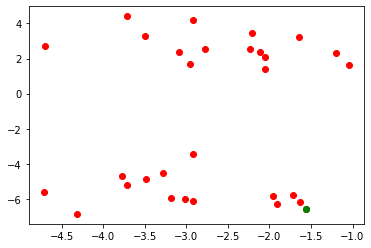

Power Allocated= 0
CSI= 0.05522766679039781
SNR= 5.544876663353776
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0086352848076743
CSI= 0.5343827562870839
SNR= 5.7300184659592865
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.097723
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.139564

Power Allocated= 0
CSI= 0.09554572296678632
SNR= 6.9263678038717424
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13650093619957815
SNR= 7.260503187923643
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.790838984464746
CSI= 0.9181773861686608
SNR= 7.515338059381678
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.483902
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.146893

Power Allocated= 2.4280771593987613
CSI= 0.40785096914935326
SNR= 8.205397217718499
Client: client7
Poor Channel, client not taken for averagi

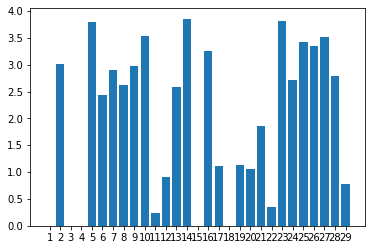

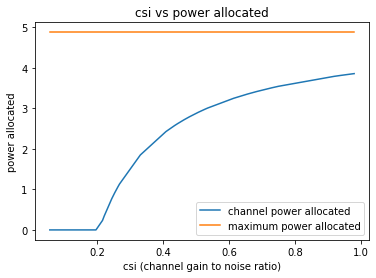

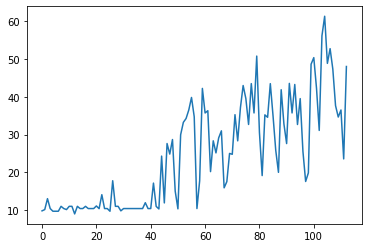

113
[3.2515850951524756, 3.4204366669632833, 3.7640135487703796, 4.023407672875532, 4.0356540117959, 5.013069825360384, 5.265175081409319, 5.7129976542544965, 6.1369405291716195, 6.216569950792554, 6.482984537713014, 6.6555662132943025, 7.044632463179299, 7.094356795222749, 7.766043745747224, 19.602849148030526, 20.43539886589884, 21.845728356352062, 23.050968606728137, 23.55024210473117, 23.959840206394517, 24.63108873762291, 26.360285987237056, 26.810259663385615, 26.86897885288339, 29.32739192101025, 33.27139782447031, 34.70590955010171, 36.19400293425265]


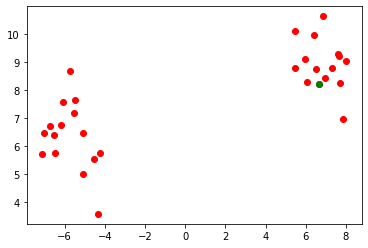

Power Allocated= 3.5084588839233604
CSI= 0.9540344857388301
SNR= 3.2515850951524756
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00860326506658493
SNR= 3.4204366669632833
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08760470326230874
SNR= 3.7640135487703796
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.222303683910079
CSI= 0.7494367949808948
SNR= 4.023407672875532
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.174674104881788
CSI= 0.7236073700918859
SNR= 4.0356540117959
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.512430
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.257311

Power Allocated= 3.3737797462472296
CSI= 0.8454091028453229
SNR= 5.013069825360384
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.36150

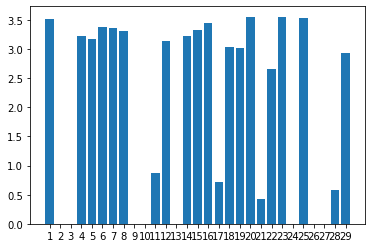

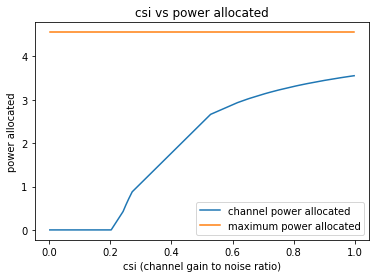

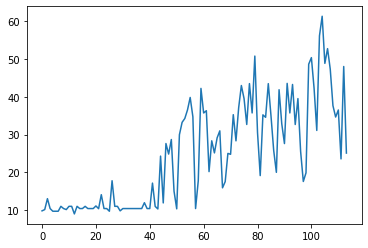

114
[5.0046383837853945, 5.474235895259458, 5.531502353610318, 5.746302180055645, 5.825481883447807, 5.954565720695974, 5.993449001221727, 6.078643531329264, 6.0811843389995, 6.869594239935898, 7.217311647174301, 7.403412295902937, 8.062320637444248, 8.347606840724977, 9.191290301710561, 17.469854604641906, 18.154751802647915, 18.42679179217297, 19.056856102446023, 19.221730911579378, 19.588281657369325, 20.860738722763116, 21.351386021672102, 23.548857396233426, 23.933583247505272, 24.567677338863334, 25.260332410450985, 34.360260933720724, 36.13608300491862]


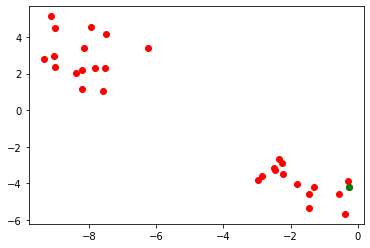

Power Allocated= 2.442566566910897
CSI= 0.4880454944659176
SNR= 5.0046383837853945
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9640844578399195
CSI= 0.39565234772911206
SNR= 5.474235895259458
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.687706
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.224818

Power Allocated= 3.09926395803861
CSI= 0.7182401821411296
SNR= 5.531502353610318
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2461178435170144
CSI= 0.8029303544271946
SNR= 5.746302180055645
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08537511395451114
SNR= 5.825481883447807
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1742440593725787
SNR= 5.954565720695974
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.863728

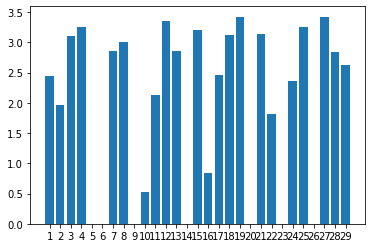

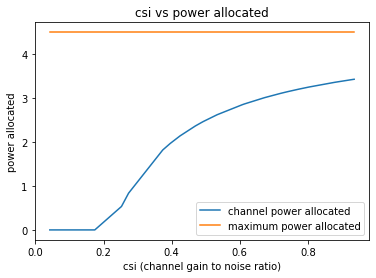

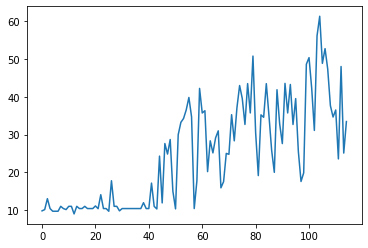

115
[6.919720035907638, 7.4909084975149876, 8.017075676503989, 8.41954843534095, 8.503914096462488, 8.993794070602277, 9.235963648782821, 9.30571098253004, 9.608792325205599, 9.67172404191588, 10.248513066042, 10.286706894583425, 10.66582236837036, 11.887197816514032, 12.627569440291422, 16.14874084172131, 17.79097576433075, 20.132090784369343, 20.33051481943275, 21.01793970872135, 21.252250639167322, 21.263235806782063, 24.31578890670309, 24.390732183875016, 26.897666392980792, 27.160705486167164, 27.506553213360675, 29.1272469199926, 31.20876346901381]


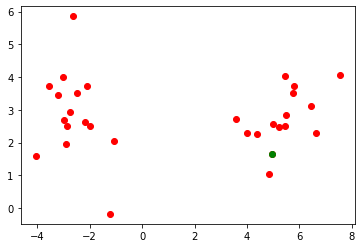

Power Allocated= 3.070720814014318
CSI= 0.9499829652679836
SNR= 6.919720035907638
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.703150670782997
CSI= 0.7041159674162476
SNR= 7.4909084975149876
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.028876
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.420723

Power Allocated= 1.2854437993563508
CSI= 0.35236982302257136
SNR= 8.017075676503989
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.592458132854494
CSI= 0.6532049250963398
SNR= 8.41954843534095
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.987198
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.619745

Power Allocated= 3.0791805645072516
CSI= 0.9576794701584532
SNR= 8.503914096462488
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.818259
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.054245

Power Allocated= 0
CSI= 0.1244501837565879

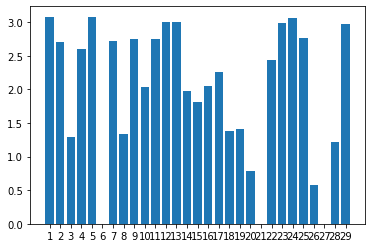

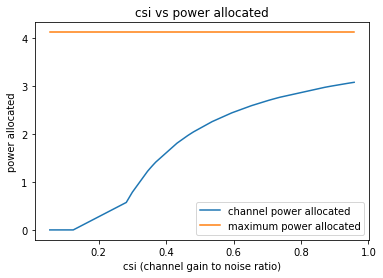

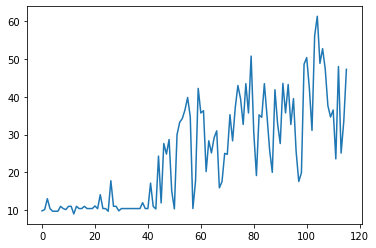

116
[6.503110263703673, 7.545893649163918, 8.20133776574896, 8.505528049692977, 8.557545544504821, 8.588318530575545, 9.399856964464806, 9.796106676071906, 9.931863297125146, 10.239775616967105, 10.331670333642274, 11.691142178816587, 11.848285485356774, 12.21123325599003, 12.347251389694211, 22.254112972386803, 22.742478130223944, 23.02064676443687, 23.120830092053584, 24.450832294459435, 24.90701855482323, 25.256028742260106, 26.704700708598494, 27.582033053058037, 28.949478539452834, 29.524957216634533, 30.252291814479282, 32.02728026471273, 35.178968822968436]


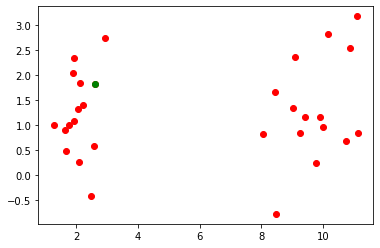

Power Allocated= 2.668797701580292
CSI= 0.891531393468742
SNR= 6.503110263703673
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.618980
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.304756

Power Allocated= 2.2533501593988965
CSI= 0.6505702424594059
SNR= 7.545893649163918
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.19326917542440025
CSI= 0.27799445753233243
SNR= 8.20133776574896
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.615536
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.063540

Power Allocated= 1.4876399166394534
CSI= 0.4342495620786384
SNR= 8.505528049692977
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6197347392659456
CSI= 0.8541690393204139
SNR= 8.557545544504821
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4450994236067705
CSI= 0.7432933913924196
SNR= 8.588318530575545
Client: clien

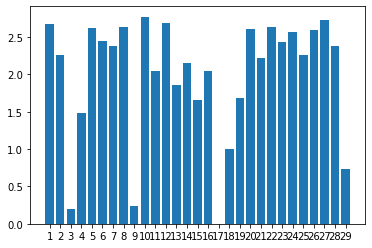

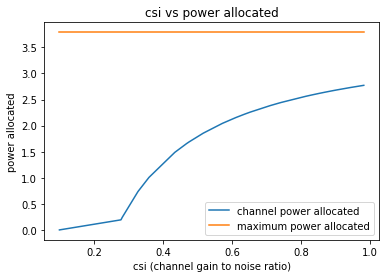

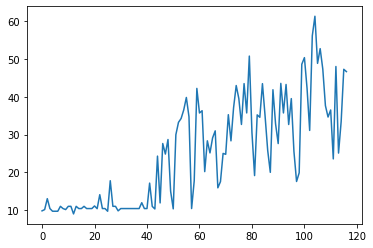

117
[5.956245262989445, 7.411608794798043, 8.282265016424022, 8.34358935870931, 8.906744262690996, 8.935487688345209, 8.960534662625934, 9.245485745564716, 9.3297165419987, 9.41683664202332, 10.811016273753285, 11.755352910297583, 11.984794153712848, 12.216400952685643, 13.725751155180129, 15.001787734376954, 15.668832637051093, 16.84309898970529, 17.10426333045891, 18.33972876959175, 19.554211851925178, 19.849831022764278, 20.070253632710223, 20.81369427544435, 21.111866580009803, 23.808296566335763, 24.170149114708288, 26.332634121921444, 33.69573296705666]


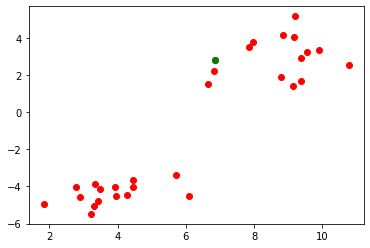

Power Allocated= 2.9023331467656943
CSI= 0.6243110793264967
SNR= 5.956245262989445
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9706760823092853
CSI= 0.6521359271739842
SNR= 7.411608794798043
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.120100
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.515352

Power Allocated= 0
CSI= 0.14624229701409142
SNR= 8.282265016424022
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1297827256159788
SNR= 8.34358935870931
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0087339325347173
CSI= 0.6687331424405599
SNR= 8.906744262690996
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2831414603786597
CSI= 0.3104667079814508
SNR= 8.935487688345209
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.353551

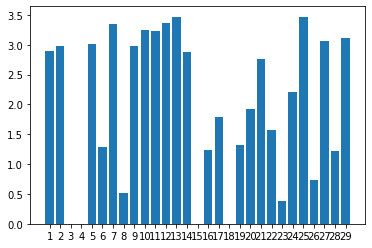

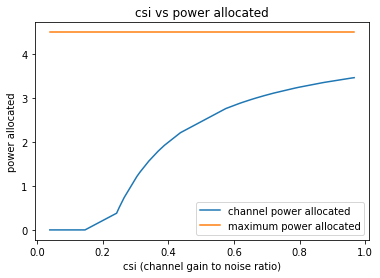

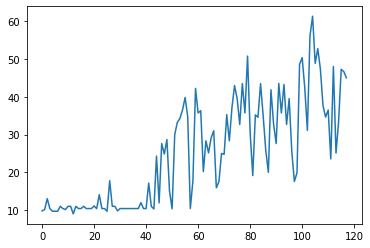

118
[0.8712214656633757, 1.6643624798207783, 2.1054734974818636, 2.2106422365591474, 2.5894929509060747, 2.7194493351435396, 3.494268272956911, 3.677367333912415, 4.093504876054972, 4.192550681007878, 4.488346853418003, 4.498242985216558, 4.684785523620639, 4.865371852433441, 5.663891141479285, 14.12823966455898, 14.177768332744098, 17.003297018284854, 18.83116673199966, 20.506677588572852, 20.819531365235946, 20.96670063682162, 21.725764069028106, 22.712220172950385, 23.27237075836766, 24.206566367044484, 25.48229383051553, 28.745567233011606, 29.632919617693126]


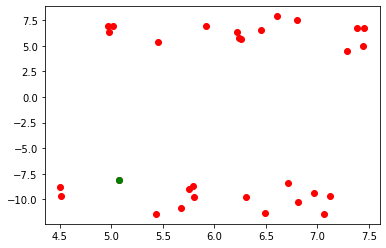

Power Allocated= 2.878062238533984
CSI= 0.9183306795705012
SNR= 0.8712214656633757
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6343322042001196
CSI= 0.7503775896160884
SNR= 1.6643624798207783
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5151145292278003
CSI= 0.6887621207594764
SNR= 2.1054734974818636
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9338996779835
CSI= 0.9679652604592153
SNR= 2.2106422365591474
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1863523263303406
SNR= 2.5894929509060747
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.828069660043373
CSI= 0.8780209833200288
SNR= 2.7194493351435396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0294091779808077
CSI= 0.5161062764578739
SN

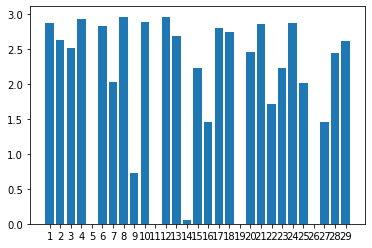

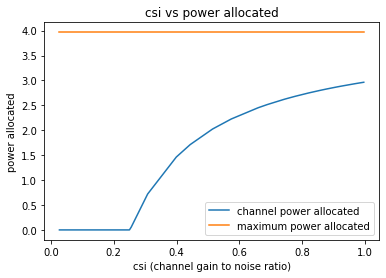

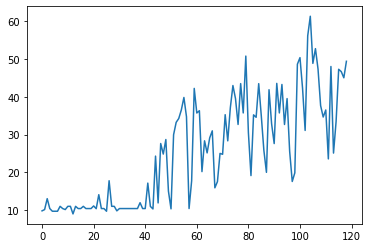

119
[11.816868276278893, 12.458913472752792, 13.902414815708804, 14.336748275202527, 15.027727455797972, 15.118659089001117, 15.983116611756303, 17.560674912349093, 19.346268024742535, 19.50501479632306, 19.597465980816, 19.654864386342883, 20.303597356337548, 20.52366106590522, 20.721137335751294, 21.42963423001002, 21.940146721314942, 22.11061511431101, 22.165765642670728, 22.74677148114514, 22.890597249497088, 23.48876044614319, 26.997445893787347, 27.334602795280844, 27.50184681172546, 29.58682528451571, 32.09276635334057, 32.74574025912354, 44.57854703853011]


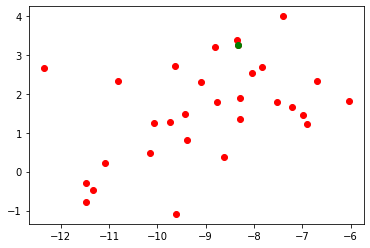

Power Allocated= 2.9037593691925
CSI= 0.9243064341987584
SNR= 11.816868276278893
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.738338799033502
CSI= 0.8017234777798026
SNR= 12.458913472752792
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10393744211003397
SNR= 13.902414815708804
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8875965342933942
CSI= 0.47663190093783636
SNR= 14.336748275202527
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.263600
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.061530

Power Allocated= 2.585923641131283
CSI= 0.7144245101716019
SNR= 15.027727455797972
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6308525873371642
CSI= 0.42466468334288954
SNR= 15.118659089001117
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.889215
Model c

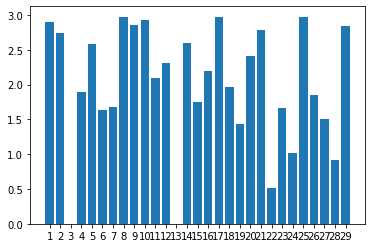

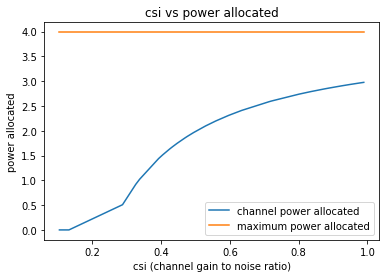

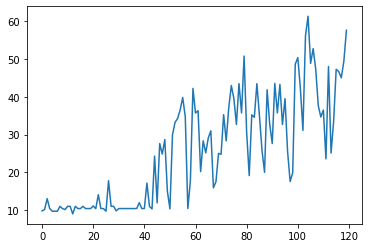

120
[7.791453376570713, 7.940326670993112, 8.20353716404104, 9.075115819107562, 9.386165918646935, 9.577760860988263, 10.101827007796862, 10.132111229314376, 10.35076094767529, 10.851802399790742, 10.93925488211815, 11.872626472862047, 12.847462142854598, 13.357579233412563, 15.742992555151396, 16.082332172021843, 17.90791233644509, 20.09733980673293, 21.624635814636346, 21.64646027648441, 22.002756276615585, 22.11367495126902, 22.17784686763319, 23.634283364687416, 24.288112834721158, 24.318862583272303, 25.14023341704371, 25.831866477268175, 34.646200930778996]


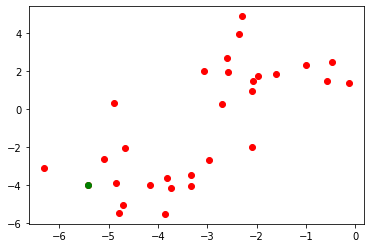

Power Allocated= 3.6505322721931353
CSI= 0.8788717438024296
SNR= 7.791453376570713
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.191568
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.178091

Power Allocated= 3.4445356013979795
CSI= 0.7441477689790943
SNR= 7.940326670993112
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.700655
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.141596

Power Allocated= 3.424646879688385
CSI= 0.7332948960716877
SNR= 8.20353716404104
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2724586548732337
CSI= 0.3974726990265034
SNR= 9.075115819107562
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.011534752129996884
SNR= 9.386165918646935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8701571524798783
CSI= 0.25521939167975927
SNR= 9.577760860988263
Client: client7
Model client

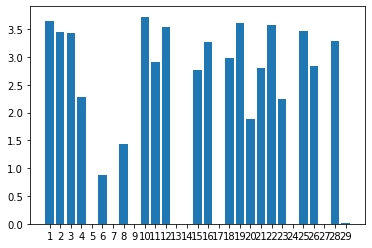

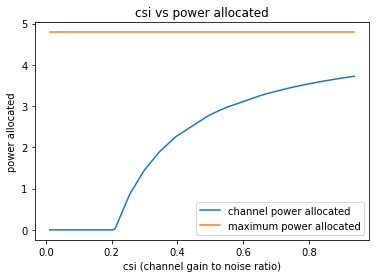

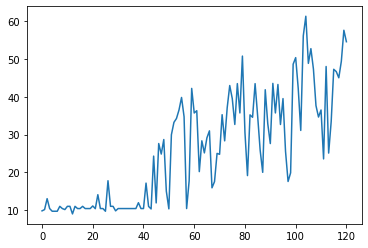

121
[0.42506047745876074, 1.3167228627670267, 1.6566812895065084, 1.7017591063668016, 1.7796026166538939, 2.1277975712737933, 2.64060158695977, 2.9026671752159863, 4.51606685056563, 4.777178692964216, 4.856739117027446, 5.012929248703317, 5.431104078014027, 5.47056098675351, 5.609649300108732, 14.90744518385808, 18.02051117314357, 21.795936601929043, 22.645182570026137, 24.222103878951458, 24.293894967871132, 24.63207832561239, 24.744441544157866, 25.650448485480354, 29.13090628820325, 29.617990542394242, 31.925803554619478, 32.672074674126904, 38.42758361087738]


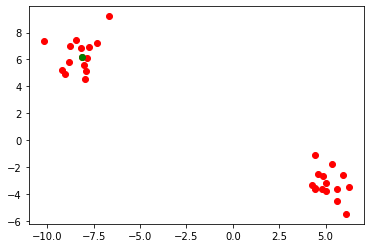

Power Allocated= 2.4253375278425597
CSI= 0.5635141047537388
SNR= 0.42506047745876074
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13545469341249916
SNR= 1.3167228627670267
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.921002954875757
CSI= 0.7819139874274296
SNR= 1.6566812895065084
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0926759769378114
CSI= 0.9031465424422844
SNR= 1.7017591063668016
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6973419566735344
CSI= 0.28550431401316256
SNR= 1.7796026166538939
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.561607
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.241051

Power Allocated= 2.8481606679213662
CSI= 0.7397788453470561
SNR= 2.1277975712737933
Client: client6
Poor Channel, client not taken for averaging in this round



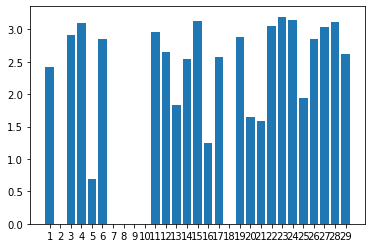

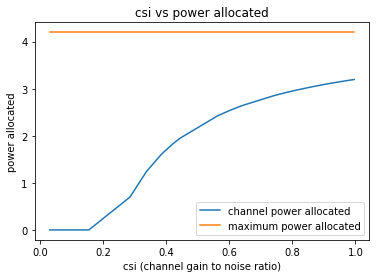

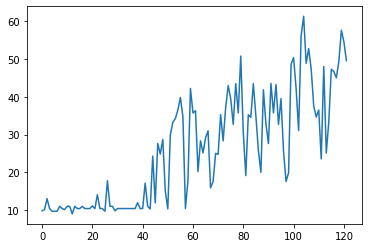

122
[11.41583520987646, 13.314658998313242, 14.33969615206953, 14.402919188744827, 14.721168632250823, 15.405309977425665, 16.01035751953967, 16.209464373166494, 17.11225824469337, 17.745937169029755, 19.11045961044841, 19.77455764016421, 20.461368573121682, 20.660760662042534, 20.68783475643263, 21.11670506611183, 21.95527614873514, 22.109404293069037, 22.68547596731699, 22.717597209151027, 22.719377309090405, 23.546370261035587, 24.26051590454993, 25.443271984025632, 29.56842849614722, 30.38962506110585, 31.509437340725807, 38.140109733119004, 38.3827764986306]


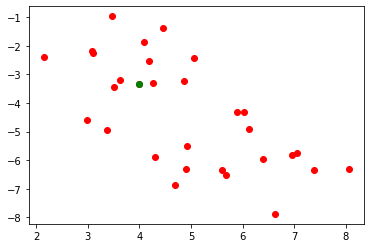

Power Allocated= 2.811673172617908
CSI= 0.7504433382087161
SNR= 11.41583520987646
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1162201288228313
CSI= 0.9727638893762829
SNR= 13.314658998313242
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.130614
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.214706

Power Allocated= 3.108029148679467
CSI= 0.9650742839276499
SNR= 14.33969615206953
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.349314
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.201959

Power Allocated= 2.8658205397840137
CSI= 0.7822288402443028
SNR= 14.402919188744827
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.642631
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.136651

Power Allocated= 3.0036482857902387
CSI= 0.8767541985401179
SNR= 14.721168632250823
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2874695221804031
CSI

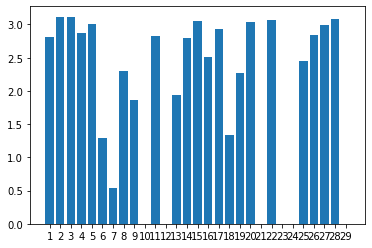

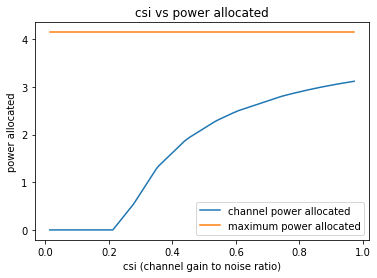

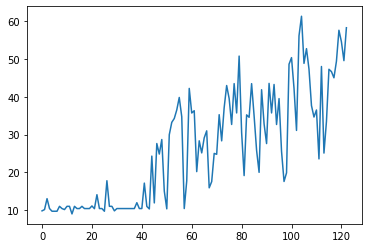

123
[3.766629025209806, 4.227962498861476, 4.6659458799893905, 5.267535788086552, 5.3290750252040215, 5.581749339178817, 5.674173089051635, 6.262904832762648, 6.849155234464488, 7.090940506124231, 7.126830785275564, 7.353182287635616, 7.495499089587369, 7.581100084334906, 9.541640049639625, 21.233156160609916, 21.872127273548177, 22.658347127059102, 23.558643335195246, 23.916565147192493, 25.13710637543894, 28.074867312065578, 28.99438080668675, 29.772859751406468, 31.52889755949063, 32.803580430656076, 37.3684346268654, 38.8929427479594, 42.42799476903201]


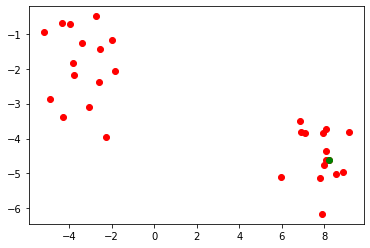

Power Allocated= 2.4876224301375003
CSI= 0.6110866873926397
SNR= 3.766629025209806
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8011961179064788
CSI= 0.43050463727311117
SNR= 4.227962498861476
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.957095458044102
CSI= 0.8569303309884752
SNR= 4.6659458799893905
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.57737055791807
CSI= 0.6465457699621933
SNR= 5.267535788086552
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.123906127571411
CSI= 0.9998546805294359
SNR= 5.3290750252040215
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7291579520286513
CSI= 0.7169006009658978
SNR= 5.581749339178817
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.913975399843254
CSI= 0.82639

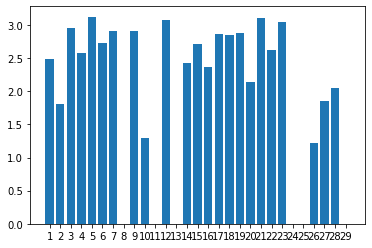

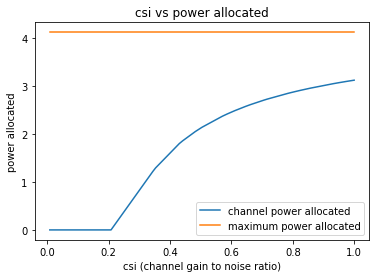

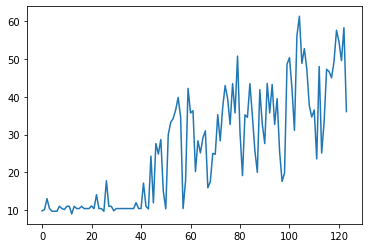

124
[5.746038179352009, 6.462011740029145, 6.4705681828945485, 6.828416110418118, 7.761435341100966, 7.975516692782584, 8.005617724822319, 8.072267316476035, 8.119248594799497, 8.46608598231941, 8.676307219873008, 8.901351993058514, 10.122210549770124, 10.345664263164815, 11.578101760095153, 18.29501222764636, 20.112456675814155, 20.40968529416204, 20.746820122100505, 20.851123155540556, 21.377124949670232, 21.703196017361023, 22.488749619843382, 25.26987418055193, 25.537034752421654, 26.252656271005794, 26.5517410133881, 29.2587096571951, 29.867042988803956]


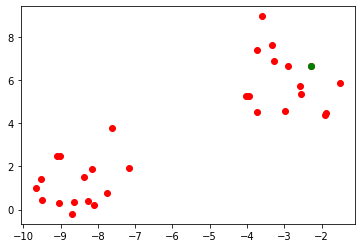

Power Allocated= 0
CSI= 0.0537912680896816
SNR= 5.746038179352009
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0370915113642845
CSI= 0.4772529707868175
SNR= 6.462011740029145
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.100027
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.181995

Power Allocated= 3.0322761247418075
CSI= 0.4761586831042136
SNR= 6.4705681828945485
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9929370690907255
CSI= 0.46740345318731336
SNR= 6.828416110418118
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.041935777680222
CSI= 0.9170268898628847
SNR= 7.761435341100966
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.871258149835857
CSI= 0.7929219399432935
SNR= 7.975516692782584
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.997687
Model clien

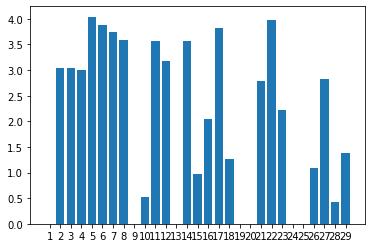

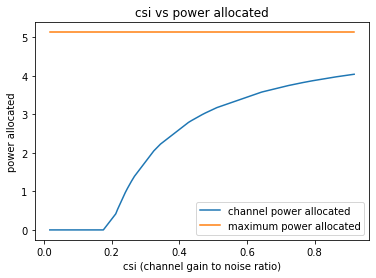

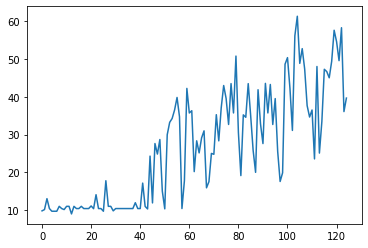

125
[6.72343704891774, 6.853930567805259, 6.894050387211491, 7.159170270411762, 7.348936942897068, 7.361230099819819, 7.877745057436308, 7.930476788863359, 8.050573440574974, 8.840068204649903, 8.873721853722765, 9.1877624156307, 10.004984407381345, 10.576464543652076, 11.390515368140555, 17.793595834220447, 21.36208909919582, 21.539711214570115, 22.036682792013735, 22.038081701632752, 22.615753337960978, 22.9917734895008, 23.93236434423348, 24.376292753973686, 24.449667352242646, 26.36545291294275, 26.51037162035866, 30.404348945413783, 34.474394306824095]


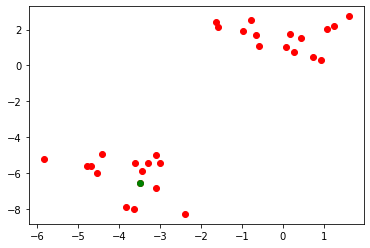

Power Allocated= 0
CSI= 0.09134570730505609
SNR= 6.72343704891774
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6004152736475956
CSI= 0.9470187384455989
SNR= 6.853930567805259
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4889492869856733
CSI= 0.8565961273869087
SNR= 6.894050387211491
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.036265
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.093010

Power Allocated= 3.4518345386572875
CSI= 0.8302020533944965
SNR= 7.159170270411762
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4745956461482477
CSI= 0.23913347922952133
SNR= 7.348936942897068
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.686082
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.873202

Power Allocated= 3.53094694621354
CSI= 0.8885621804896238
SNR= 7.361230099819819
Client: client6
Model client6 

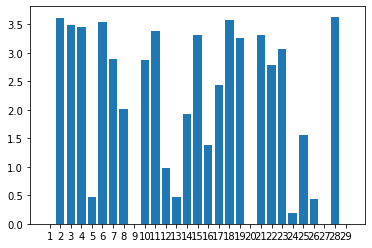

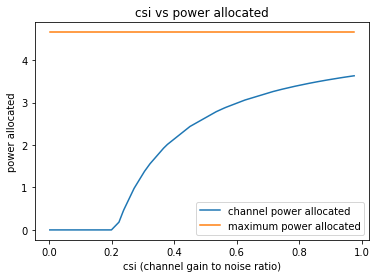

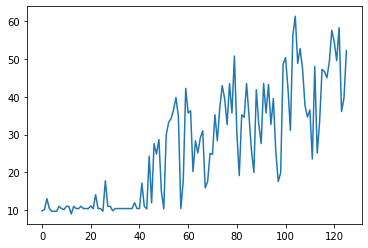

126
[3.3010299008879596, 4.060628252370375, 4.797017425442476, 5.196169508767512, 5.367879125371189, 5.470084388353695, 5.573051601337916, 6.196593908912225, 6.252610565711186, 6.4313600827358695, 7.148357060711527, 7.206193705069465, 7.248522752833887, 7.816556992628923, 9.083915624214072, 21.648745694407122, 21.80293310326827, 22.110672266489733, 24.91871324464905, 24.932579974049723, 25.702369325653073, 26.222414004651366, 26.793012604473677, 28.31336927190968, 31.33333748358956, 31.77102828563283, 34.56521824035958, 34.60047038825353, 35.76335803183226]


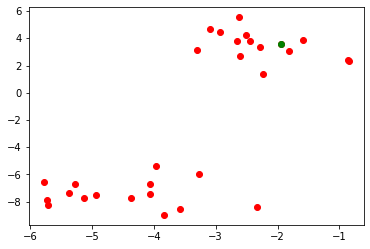

Power Allocated= 0
CSI= 0.05423130551424227
SNR= 3.3010299008879596
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17584870881792825
SNR= 4.060628252370375
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0989160973394476
CSI= 0.6212626406023837
SNR= 4.797017425442476
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19207213943425483
SNR= 5.196169508767512
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12867652110379868
SNR= 5.367879125371189
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2117856787214708
SNR= 5.470084388353695
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5067563580171592
CSI= 0.8320956355299548
SNR= 5.573051601337916
Client: client7
Poor Channel, client not ta

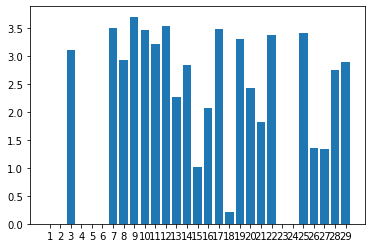

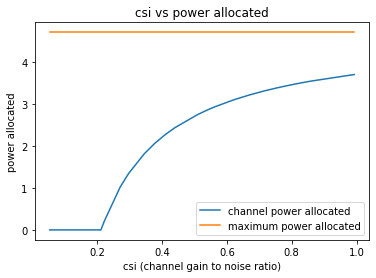

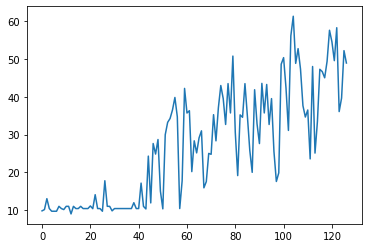

127
[14.174059748286115, 14.64091552398104, 15.797217424066222, 15.834801968269492, 16.662642350764248, 16.724496611973347, 16.940784782187396, 17.049014715800045, 17.709579097477373, 17.91521408531323, 18.0099038439206, 19.194063219967074, 19.44450171793742, 20.461157795765196, 20.473783200418875, 20.81618291185721, 21.26490709474954, 21.98538858360543, 22.092495909608342, 22.283311874860846, 22.569430849150496, 22.790687252872072, 23.940482163863464, 24.69483661512785, 25.784554153261677, 26.55592516226102, 27.726893029935084, 29.588880505291343, 31.55315328647662]


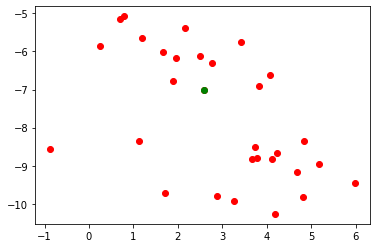

Power Allocated= 2.300805596289333
CSI= 0.49377781598047965
SNR= 14.174059748286115
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.750353
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.077441

Power Allocated= 0
CSI= 0.22103807301687461
SNR= 14.64091552398104
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.439233988091281
CSI= 0.34640744643717525
SNR= 15.797217424066222
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.308515
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.254552

Power Allocated= 2.9487541142505305
CSI= 0.7260825614620424
SNR= 15.834801968269492
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.910638
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.465892

Power Allocated= 2.695183602398588
CSI= 0.6131868189408485
SNR= 16.662642350764248
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.268025
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.156079

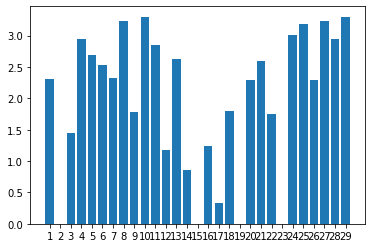

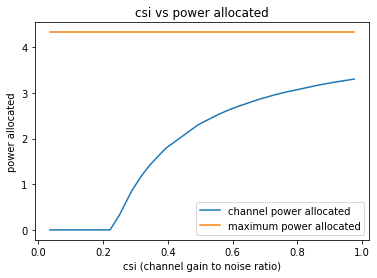

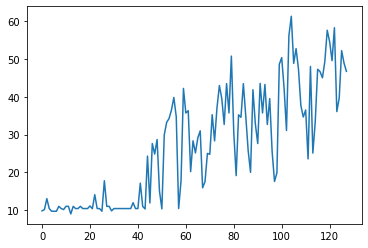

128
[0.0457261333029475, 0.18438240077246526, 0.7943218063968329, 0.9190312019323921, 1.2321084842579535, 1.2726392328589915, 1.6089879117693417, 1.9522079882395884, 2.4917936966864205, 2.7312388297097505, 3.1034066426508757, 3.828914714009236, 3.9611191586912016, 4.871983133294534, 5.36704591882823, 15.788408335748919, 20.80107509883895, 22.45970820611623, 23.70236836091259, 24.48956646567351, 25.022419928058557, 25.145667208234737, 25.297801387304837, 29.10948942221444, 31.191362670119286, 32.350744770959714, 33.393261134416846, 33.54302316461084, 36.97679626321294]


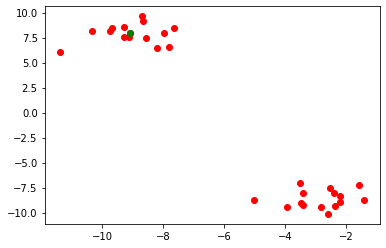

Power Allocated= 0
CSI= 0.1247445553171419
SNR= 0.0457261333029475
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6442312732378728
CSI= 0.3105993304604442
SNR= 0.18438240077246526
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4690320355000805
CSI= 0.7169583331421245
SNR= 0.7943218063968329
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7571032966446758
CSI= 0.24350392804273668
SNR= 0.9190312019323921
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15297408487165742
SNR= 1.2321084842579535
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.383852555209855
CSI= 0.6756936297856646
SNR= 1.2726392328589915
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9599750389871504
CSI= 0.25615815799222696
SNR= 1.6089

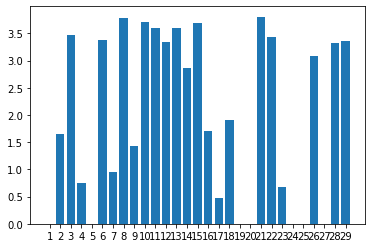

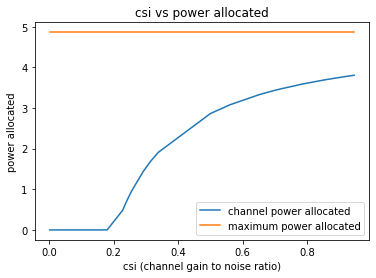

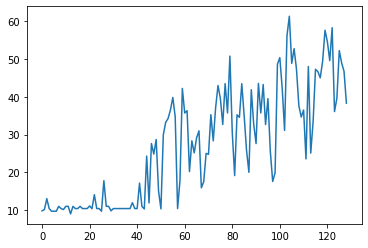

129
[3.478578339404721, 4.004860591699874, 4.328679581096413, 4.417601986068963, 4.912246686936426, 5.0217599200729595, 5.425104650222653, 5.74516953580854, 6.035818775212583, 6.049493235489436, 6.313697396927843, 6.592192642337522, 6.62627044696479, 7.478258251380059, 8.961353938389644, 14.52061955231541, 18.838373056828786, 19.236506800438903, 21.08407258389923, 21.104892038423525, 21.198079341966377, 22.291296797344526, 24.450000750660454, 26.572926924992004, 26.701784088137217, 27.159187673870264, 27.219170522620345, 31.312348078995704, 38.29142065323151]


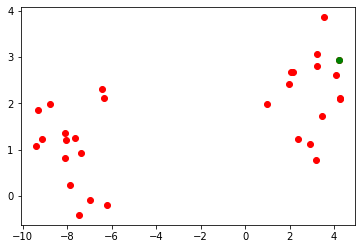

Power Allocated= 2.7943142516872745
CSI= 0.7818574642093378
SNR= 3.478578339404721
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.693069513793155
CSI= 0.7245063030671838
SNR= 4.004860591699874
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9044208767106134
CSI= 0.855505996334799
SNR= 4.328679581096413
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.439600128324808
CSI= 0.37969113706841107
SNR= 4.417601986068963
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.025742
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.052983

Power Allocated= 2.97853132466703
CSI= 0.9134184941529091
SNR= 4.912246686936426
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.375569
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.266295

Power Allocated= 2.997440260158249
CSI= 0.9294721241882234
SNR= 5.0217599200729595
Client: client6


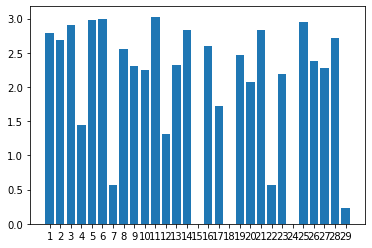

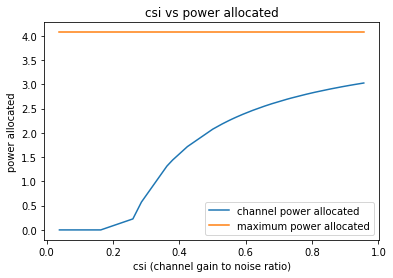

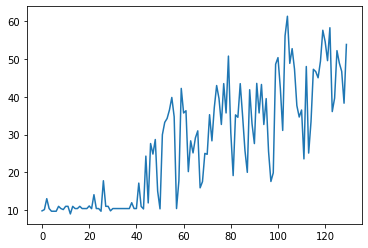

130
[0.8759352914299523, 1.4156806298534788, 1.9812622758321803, 3.0845839457736575, 3.5030065040083387, 3.885964147948286, 4.309451380863748, 4.672459990304401, 4.725012827999942, 5.034558390591232, 5.196038643909059, 5.722415119391925, 5.742710081429154, 6.155790831913931, 6.168481505872213, 17.772434086526157, 18.745858250571676, 20.038414038913583, 20.857721252416685, 20.9611638259918, 21.115441970118212, 23.065086149725346, 24.195826271757284, 24.892394425161196, 25.06747909713087, 25.896473276087963, 26.534072026516377, 28.21246279283527, 28.214693097489658]


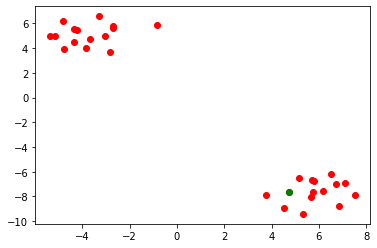

Power Allocated= 0.5534347194451277
CSI= 0.23161627547611086
SNR= 0.8759352914299523
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5559318955069297
CSI= 0.3016601526996602
SNR= 1.4156806298534788
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7286632243098534
CSI= 0.24141425998887078
SNR= 1.9812622758321803
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6169805554374754
CSI= 0.7974862922280684
SNR= 3.0845839457736575
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7938348476535473
CSI= 0.9284311802592242
SNR= 3.5030065040083387
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02191646728056129
SNR= 3.885964147948286
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08935075885339328
SNR= 4.3094

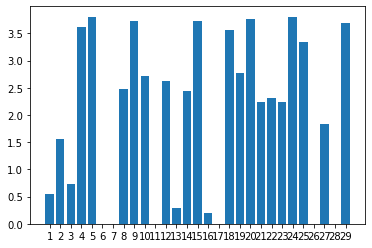

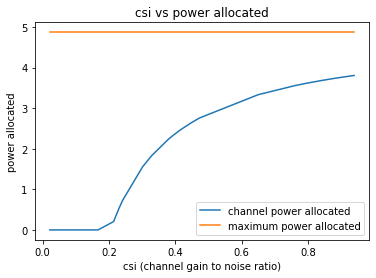

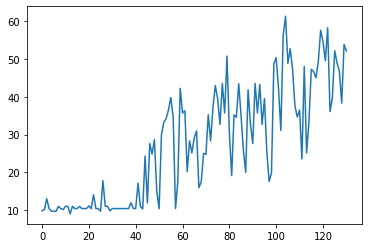

131
[7.306515438156918, 7.58427498376507, 7.624141832828256, 7.726104176065725, 8.37275934059318, 8.714140594148391, 8.86238013177401, 9.135874932226036, 9.143544865993674, 9.89419954527192, 9.956166934922116, 10.567269731425677, 11.982230486330126, 13.140295319986224, 13.701074174023278, 17.938995305515395, 20.928870524427133, 22.65580026264705, 23.781040440793642, 24.726526299825892, 26.374202137999582, 26.748333015391186, 27.10648062859414, 27.299668500477043, 32.80472478614037, 33.44309842373932, 35.29224988390591, 35.99946730008071, 45.12106280721095]


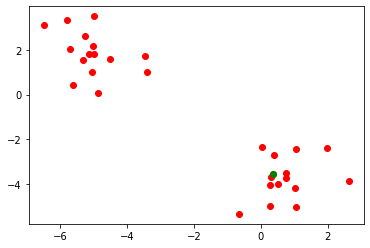

Power Allocated= 0
CSI= 0.0264867532376436
SNR= 7.306515438156918
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4504841327791316
CSI= 0.5850520451230936
SNR= 7.58427498376507
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0407690001892744
CSI= 0.89368317992599
SNR= 7.624141832828256
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.29873826305042206
CSI= 0.2590005599273606
SNR= 7.726104176065725
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.400101
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.096651

Power Allocated= 2.418933521128817
CSI= 0.5744484449637791
SNR= 8.37275934059318
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.599943
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.196969

Power Allocated= 1.07218629104834
CSI= 0.3238816583509905
SNR= 8.714140594148391
Client: client6
Poor Channel, clien

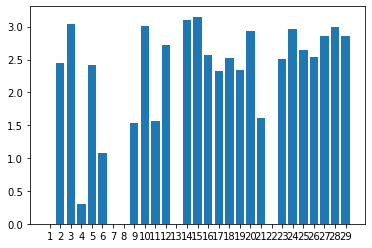

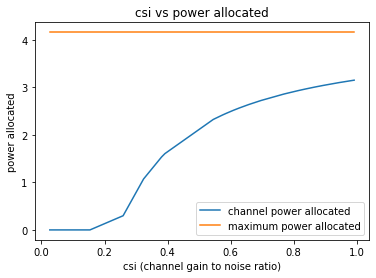

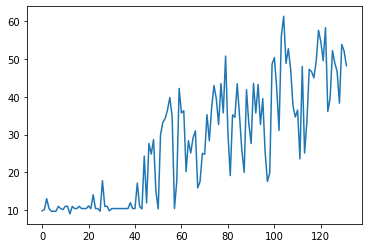

132
[6.160637869699463, 9.050943001326768, 9.320705622254103, 9.721550288068553, 9.792169254962385, 10.420937035611772, 10.43299085965316, 10.748379538129125, 10.788232286628148, 10.852861646496695, 11.410391137728814, 11.529615827174618, 12.653035318143464, 13.502618965486146, 13.677993108342312, 20.111388218947187, 20.4213389025805, 21.443335014766994, 22.167777193811812, 22.53911286152383, 23.845417414284537, 23.847738226513947, 24.794791799951984, 25.918181491767022, 25.957694975348257, 28.266385447503115, 29.321468091078238, 30.897606645095365, 31.279207974862775]


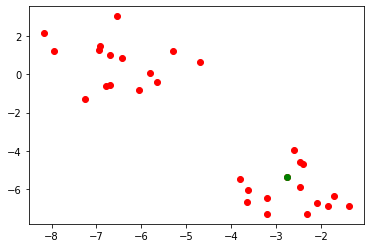

Power Allocated= 3.7102769377178957
CSI= 0.8765815674175278
SNR= 6.160637869699463
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.39868350262757
CSI= 0.6885209721468846
SNR= 9.050943001326768
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.568754
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.285396

Power Allocated= 0
CSI= 0.18611211490888413
SNR= 9.320705622254103
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.45059423782588404
CSI= 0.22724804766446904
SNR= 9.721550288068553
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.515129
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.673705

Power Allocated= 2.6930911140722342
CSI= 0.46339611543238657
SNR= 9.792169254962385
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06574690825256113
SNR= 10.420937035611772
Client: client6
Poor Channel, client not t

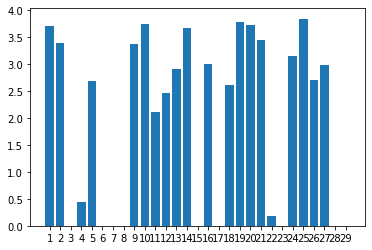

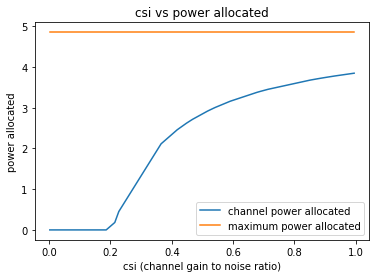

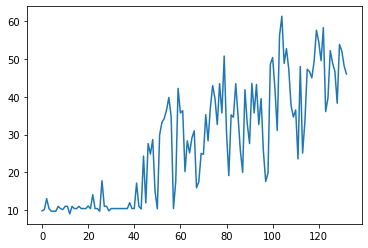

133
[1.6831783407885625, 2.306332155789354, 2.96660297677251, 3.089859063469894, 3.232322623902179, 3.6116905705551865, 3.9280629107502083, 4.284789174413744, 4.3744514694145975, 4.452120551433697, 4.68702666080002, 5.106472113192542, 5.827019200373296, 6.996019405440478, 7.823643032662036, 15.031251860574116, 16.072538267048568, 16.939352645574353, 17.35616386347082, 17.81180163549815, 17.93868991069027, 18.67490536898099, 19.36101289558679, 19.52439418977655, 19.62829307045105, 19.89464009235409, 22.451682983546288, 23.986653755292096, 24.10121485760143]


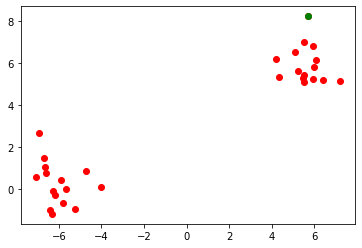

Power Allocated= 3.004542236943463
CSI= 0.7737141184220967
SNR= 1.6831783407885625
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.824731
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.065088

Power Allocated= 0.2710726176276106
CSI= 0.24838940189090875
SNR= 2.306332155789354
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1582743401963667
CSI= 0.8781674854199492
SNR= 2.96660297677251
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1993047896179747
CSI= 0.9109919904295972
SNR= 3.089859063469894
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.857907
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.105279

Power Allocated= 2.4571919958257658
CSI= 0.5435322342954972
SNR= 3.232322623902179
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0861364399938083
CSI= 0.45231004751065707
SNR= 3.6116905705551865
Client: cl

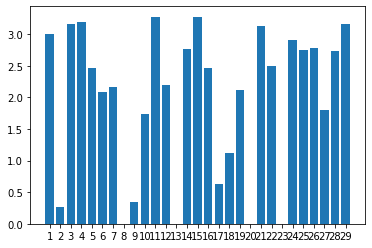

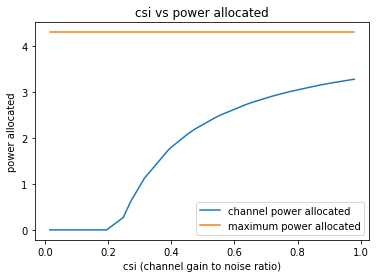

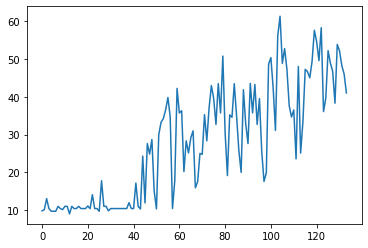

134
[8.82288802890227, 10.65324033936107, 11.628146176429828, 12.690797018029658, 12.882683234923483, 13.002175699676759, 13.108004035766616, 13.428427247906424, 13.620555248842003, 14.154286276820933, 15.629066555304638, 16.04876598748259, 16.56110727130339, 17.1003085205329, 17.632929142917906, 20.064510124218135, 21.373759626259826, 22.387741835130612, 25.75352622689888, 26.286263475422913, 27.076281510513148, 28.579457071317076, 29.453273459860988, 29.46653837159868, 30.106314876967545, 31.99567966593252, 33.24039370161043, 33.63846799958921, 42.56927253543083]


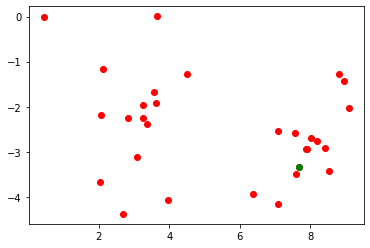

Power Allocated= 3.29424136485905
CSI= 0.8900754301609878
SNR= 8.82288802890227
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.172958
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.121462

Power Allocated= 3.311906044122316
CSI= 0.9042935444120336
SNR= 10.65324033936107
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.42943856765167254
CSI= 0.25073320137287014
SNR= 11.628146176429828
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.367274
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.426036

Power Allocated= 0
CSI= 0.1554224972659446
SNR= 12.690797018029658
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1791006382721544
SNR= 12.882683234923483
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8836380334809646
CSI= 0.6518464521735079
SNR= 13.002175699676759
Client: client6
Poor Channel, client not tak

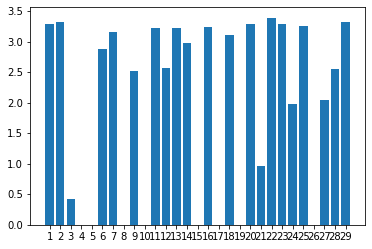

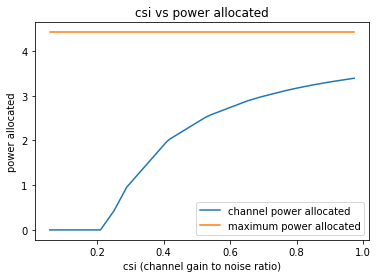

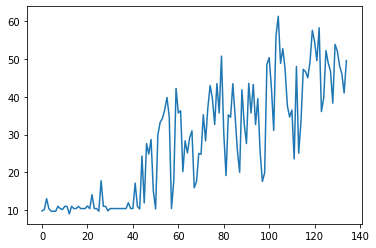

135
[4.0231709067041885, 5.6450562502518755, 5.9573837055135135, 6.146062854741628, 6.703029226104798, 6.929763927985642, 7.741179270953316, 8.311366205215899, 8.619093370399542, 8.789061289186058, 9.083950517127093, 9.095513396674615, 9.285787678945828, 9.32639021913295, 9.615147922215879, 21.01437006252933, 21.313912717456624, 22.71332071719707, 23.45522596151349, 24.891613095999766, 25.807553091779475, 26.130853471750978, 26.302165890120396, 26.648528595638126, 27.204822564702134, 28.253483125354954, 28.461790507575337, 33.25624302143766, 34.029885927919004]


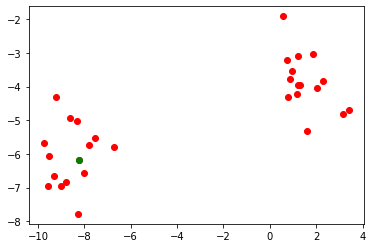

Power Allocated= 0.8359389025150947
CSI= 0.26646053004732906
SNR= 4.0231709067041885
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2465666093369823
CSI= 0.7450047439778427
SNR= 5.6450562502518755
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.154290468294196
CSI= 0.2911590029115344
SNR= 5.9573837055135135
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.333659
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.135185

Power Allocated= 0.07314452176527109
CSI= 0.22144983376916438
SNR= 6.146062854741628
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.490711
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.370778

Power Allocated= 2.302968005610991
CSI= 0.43746982689765823
SNR= 6.703029226104798
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06111259563096827
SNR= 6.929763927985642
Client: client6
Poor Ch

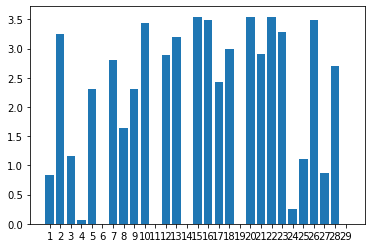

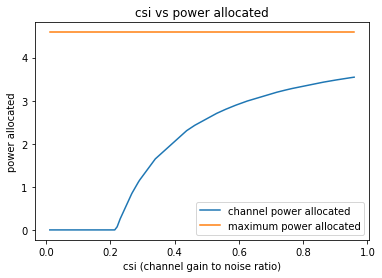

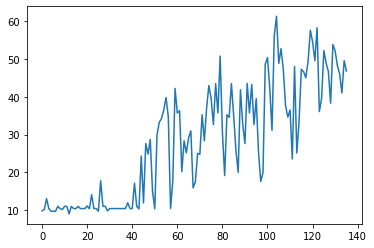

136
[19.125567924290344, 19.50648071731166, 19.671849244011348, 20.503673751067108, 21.09902636717398, 21.47224366247843, 21.728086392687356, 22.2741863182789, 22.482973825335407, 22.528782576734724, 23.202005657425396, 23.364843025711895, 23.811802438778724, 24.534814942890875, 25.34575343799103, 25.762030156215864, 28.26731648907735, 28.490539546585367, 28.886926811507685, 29.51186750636254, 29.75165427642699, 30.010501195488576, 30.06667821082845, 30.1747560155969, 31.697532591167093, 32.92819985083137, 35.483758004970994, 36.7408032217581, 38.27906152873455]


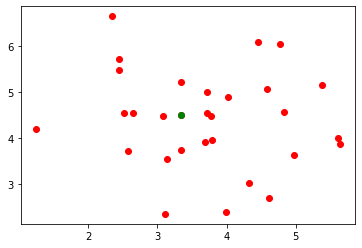

Power Allocated= 2.275457564109757
CSI= 0.45728165026368583
SNR= 19.125567924290344
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.790278
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.068946

Power Allocated= 3.340146959117904
CSI= 0.8911491125196475
SNR= 19.50648071731166
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 3.560021
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.143146

Power Allocated= 1.6237108893608054
CSI= 0.3522884817083005
SNR= 19.671849244011348
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.819615
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.245354

Power Allocated= 3.240427307364527
CSI= 0.8184201418292099
SNR= 20.503673751067108
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.474818
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.103108

Power Allocated= 3.26489911273534
CSI= 0.8351466411733612
SNR= 21.09902636717398
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss

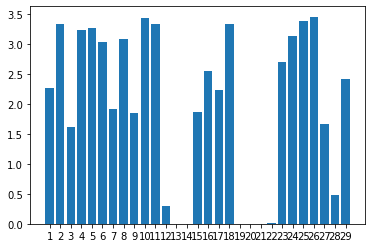

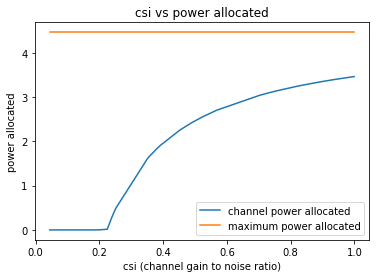

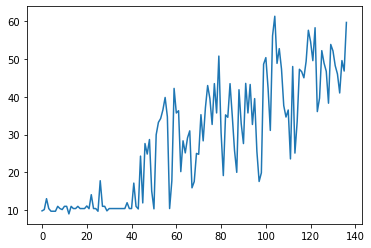

137
[1.4755652426984538, 1.7164603626150656, 2.8152660001438305, 3.4365307799003215, 3.4926040217219114, 3.5920156314469494, 3.930425578606605, 4.0241663077500345, 4.0835146476982676, 4.592426570546964, 4.944677772134314, 5.196445809070941, 6.482756026222252, 6.625284406565764, 6.799041928737657, 13.240573157844928, 18.264982292650902, 22.07513186618019, 23.22726018330064, 23.66846244599175, 24.510558644482433, 24.699548714214245, 24.79794318361968, 24.854841439520047, 25.484465357043444, 27.390025434546352, 28.079817424294088, 28.216162603378265, 28.99207557269466]


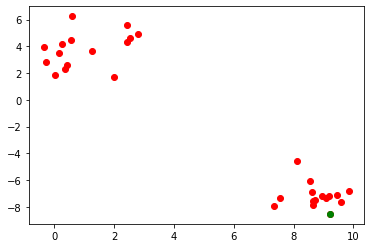

Power Allocated= 2.241495445702646
CSI= 0.43582958537027805
SNR= 1.4755652426984538
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4329594012500166
CSI= 0.9066094014765728
SNR= 1.7164603626150656
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.477895639000037
CSI= 0.9451129393341758
SNR= 2.8152660001438305
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.482638475489325
CSI= 0.9493684989489384
SNR= 3.4365307799003215
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1417561014815546
SNR= 3.4926040217219114
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.747349317018955
CSI= 0.35860019205616256
SNR= 3.5920156314469494
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.607212677031211
CSI= 0.5184684778985129


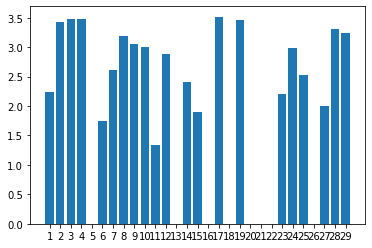

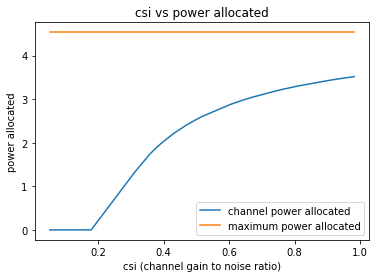

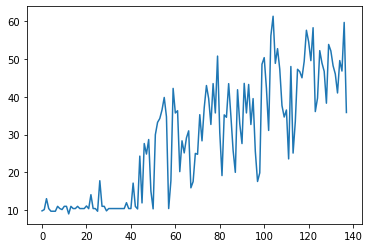

138
[0.9072325612439949, 1.6673400338224598, 2.2966511122630884, 2.6847108566889872, 3.3017759286560175, 3.551538666502034, 3.696194282935878, 4.902101310228381, 5.03446165944672, 5.235865332469084, 5.326026344254739, 5.466736413528712, 5.815536612475473, 5.891612057073278, 5.90201406539261, 16.172794640589956, 16.309469922502604, 17.69080675627864, 17.809191560454178, 18.38473679935518, 18.457300397599862, 18.62184899646759, 19.967135689940097, 21.75602181585958, 22.537946010701916, 22.5386335812912, 23.772069364367077, 25.76406701132536, 26.928985352683476]


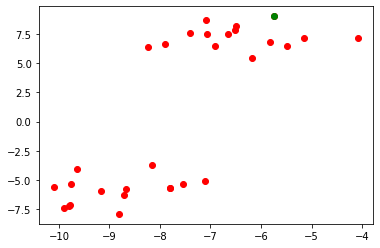

Power Allocated= 3.597434940469216
CSI= 0.853102509038187
SNR= 0.9072325612439949
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18918398558913907
SNR= 1.6673400338224598
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2643304065965277
CSI= 0.3991543342926974
SNR= 2.2966511122630884
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.692941215013997
CSI= 0.9287760643422578
SNR= 2.6847108566889872
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.433602882506748
CSI= 0.7484894737704071
SNR= 3.3017759286560175
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5357987815948855
CSI= 0.810485586882902
SNR= 3.551538666502034
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.187856629739504
CSI= 0.6322030107607937
SNR

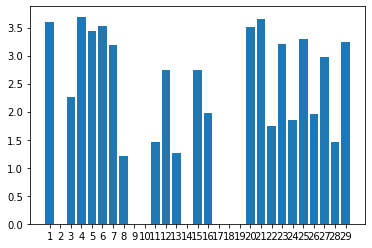

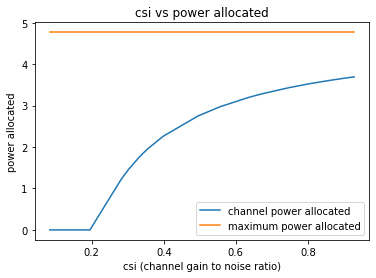

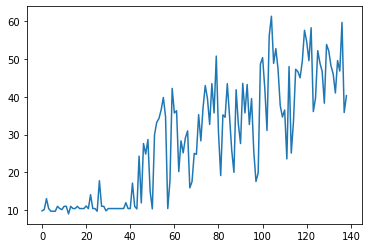

139
[5.886484899127142, 7.009025384511595, 7.0129012258992836, 7.373188822910455, 8.537477429666025, 8.606639857532935, 8.964293850962765, 9.11620466152721, 9.610738199624638, 10.850374335789459, 11.17150360067721, 11.850844942979357, 12.021288316550754, 12.114884051416428, 14.688253453812706, 18.942037256080663, 19.46823603420063, 19.52289957640124, 20.296837973874453, 21.38513354072688, 21.464564555982157, 22.667793388665967, 23.48045898456034, 24.325641058256675, 25.022845286869174, 25.813511208080772, 32.12029175779806, 34.72073423446073, 35.521086404140604]


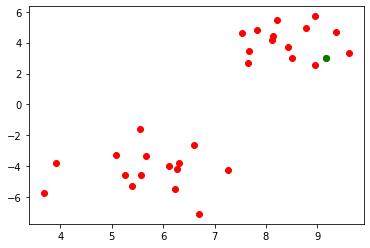

Power Allocated= 2.3507954939375773
CSI= 0.4647529356436242
SNR= 5.886484899127142
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9371686489425977
CSI= 0.38981678295753786
SNR= 7.009025384511595
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.442026940538564
CSI= 0.9429964124289335
SNR= 7.0129012258992836
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0600899263338794
CSI= 0.6932954825927276
SNR= 7.373188822910455
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.469405292918135
CSI= 0.9679876147235719
SNR= 8.537477429666025
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11105927810287364
SNR= 8.606639857532935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.406541044508179
CSI= 0.4771139603663562
SNR

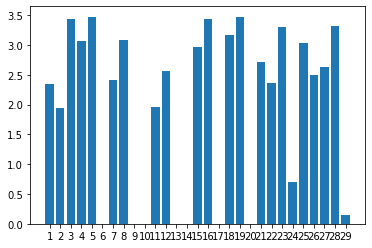

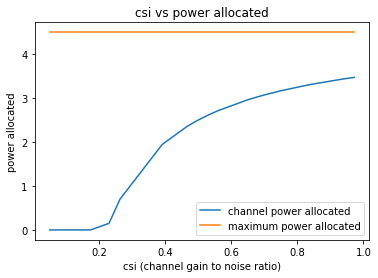

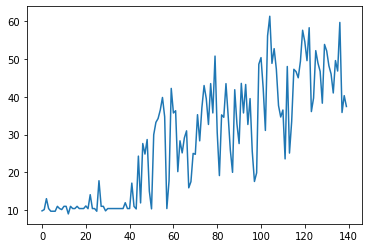

140
[-0.21962564535548168, -0.19821106390270415, 0.6503052684105217, 1.0420722148553798, 1.1049035868550523, 1.6304125481718779, 2.4270830622181148, 2.5681375726622018, 2.626964779209639, 2.7959187576818865, 3.260534272029931, 3.381082779526621, 3.7318032280090385, 3.7617662539505172, 4.948417201394937, 14.060617444318188, 15.808935140111851, 16.64907634496026, 16.85810250484225, 17.386270361487473, 17.95431166026463, 18.25040573194913, 19.33044828778177, 19.534610592633516, 20.157563530919035, 20.203419016726976, 21.685284229910234, 23.296140463427825, 33.111089506614846]


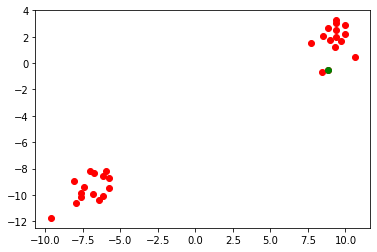

Power Allocated= 0.5726642870992107
CSI= 0.25100560778520953
SNR= -0.21962564535548168
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.18929370839457
CSI= 0.7313441522611229
SNR= -0.19821106390270415
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3804014292786047
CSI= 0.8501683718403724
SNR= 0.6503052684105217
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.378048699031406
CSI= 0.8484712453640505
SNR= 1.0420722148553798
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.920413315105418
CSI= 0.6111626257552987
SNR= 1.1049035868550523
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5683969504737894
CSI= 0.334644910188132
SNR= 1.6304125481718779
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5059956172179176
CSI=

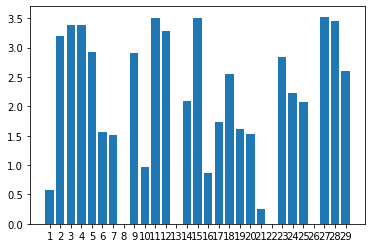

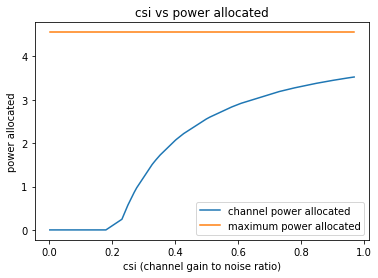

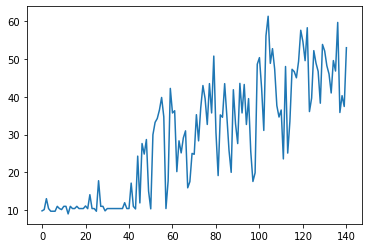

141
[5.523618779953965, 6.894061559319714, 7.098075783755292, 7.834488557510289, 7.846769851236889, 7.927459512747522, 8.49344694635977, 8.686664742484737, 9.11835248568844, 9.567580747094532, 10.130542021554174, 10.42381514639711, 10.77617509691982, 11.544523614346897, 11.639229945248966, 18.19013911837917, 19.190992587128854, 19.38215974036749, 20.01008808813326, 20.810926689616608, 24.17815370008399, 24.460373912095555, 24.916119130089093, 25.595496000284477, 26.008588608378727, 26.039410819276885, 28.44550080388869, 31.53379807387611, 32.360279351906556]


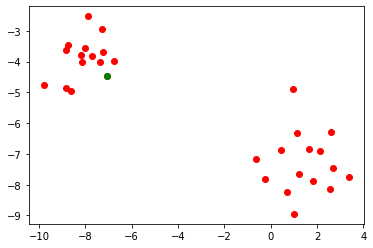

Power Allocated= 3.5254395727843506
CSI= 0.9581376454680388
SNR= 5.523618779953965
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13314624731403302
SNR= 6.894061559319714
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8285480834537537
CSI= 0.5745201900333182
SNR= 7.098075783755292
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0664393390076885
CSI= 0.6654725372951865
SNR= 7.834488557510289
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12105449982594918
SNR= 7.846769851236889
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0695993841837339
SNR= 7.927459512747522
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.829891064784337
CSI= 0.36506477761405554
SNR= 8.49344694635977
Client: clien

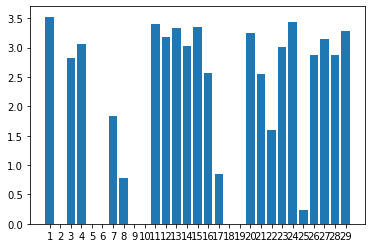

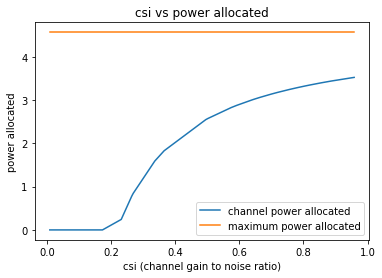

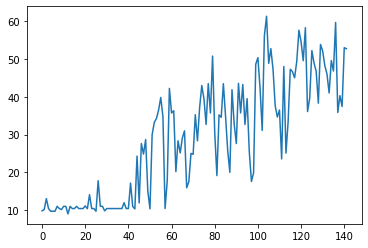

142
[3.764793581632567, 5.401350947404927, 5.515996331871145, 5.569584493139509, 5.587304214163053, 5.6791228738391455, 5.781784103169919, 5.870874045045191, 6.00930182394555, 6.03801876936426, 6.093857286226859, 7.294256877643114, 8.38258581604419, 8.48135285304287, 9.682758720679136, 16.153412465510645, 16.974098207217427, 18.6140659670607, 20.385914154924308, 20.900562441131125, 23.094843002929405, 23.868898675357222, 24.034677552103986, 24.331710041841806, 25.502663837416495, 29.258626434654843, 29.74112544278607, 32.25567900494605, 32.408527463658565]


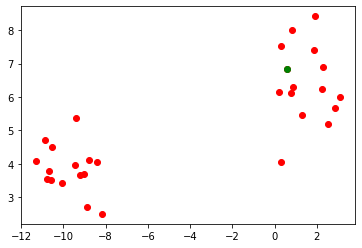

Power Allocated= 3.345816489428584
CSI= 0.8006872305685826
SNR= 3.764793581632567
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4048888378983353
CSI= 0.8404386994679632
SNR= 5.401350947404927
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.76408070235165
CSI= 0.5462502102466654
SNR= 5.515996331871145
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.184750
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.088605

Power Allocated= 0.7620924507273119
CSI= 0.2609159971989158
SNR= 5.569584493139509
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3301953071355928
CSI= 0.7907962037668835
SNR= 5.587304214163053
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08818797713430315
SNR= 5.6791228738391455
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

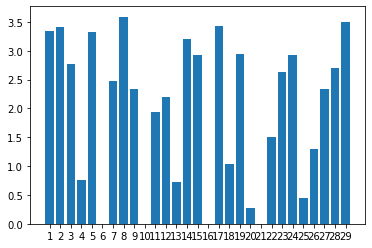

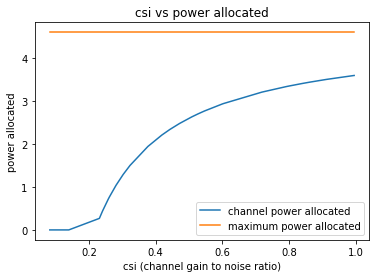

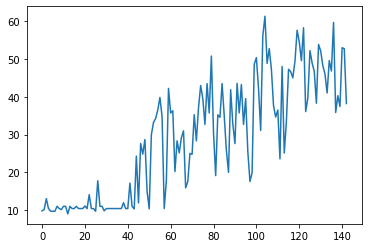

143
[5.711149918565928, 6.417849550133363, 8.326100480328018, 8.407800123225133, 9.535640420982997, 9.594064609561409, 9.739763108969933, 9.905851011503856, 10.145724899747984, 10.24415430825353, 10.271273361087848, 10.958340829367597, 10.974260996486223, 11.291395453642913, 11.594793637915046, 21.693602854808624, 22.439110903501224, 23.50613161193121, 23.584306560299996, 24.2007903444458, 24.446048073354522, 24.515937737458394, 27.606098869968736, 29.677212484977247, 29.827450983150005, 29.983258429355224, 30.24961068603642, 32.34217521608167, 32.63178354620987]


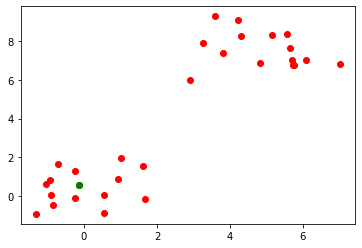

Power Allocated= 2.217238901993064
CSI= 0.40527184974943764
SNR= 5.711149918565928
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2715052873596786
CSI= 0.7076073359298254
SNR= 6.417849550133363
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2688590063589222
CSI= 0.7062847979762421
SNR= 8.326100480328018
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.925781
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.163375

Power Allocated= 0
CSI= 0.1966923052506261
SNR= 8.407800123225133
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3841857318215305
CSI= 0.30298139296437965
SNR= 9.535640420982997
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.584386
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.274010

Power Allocated= 3.6296726195462754
CSI= 0.9478261253030003
SNR= 9.594064609561409
Client: client6
Poor Channel

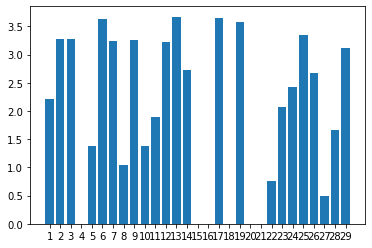

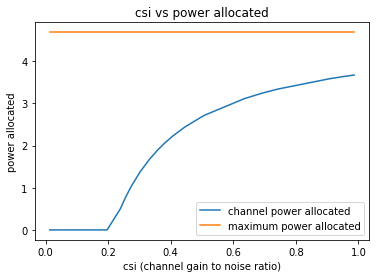

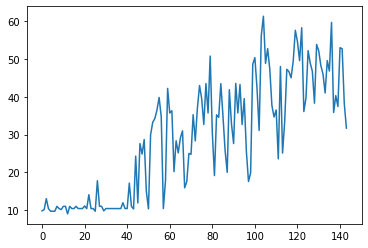

144
[4.752938067350632, 5.85330437264929, 6.228326609792054, 6.460150697637475, 7.56986611593184, 7.626775556492229, 9.348716222975629, 9.466543429537511, 9.493555446309362, 9.76294996776902, 10.009438351550266, 10.038481395061813, 10.320444719604737, 10.426804455269748, 11.68787242225708, 20.82743273471363, 22.565543857686134, 24.011816019462575, 24.89150597486869, 25.485419928291783, 26.205189880723584, 26.71095882204632, 26.783014933113986, 27.134519554040438, 29.317537091786367, 29.38299105118434, 30.38410339634371, 31.966482654231033, 38.09315036348307]


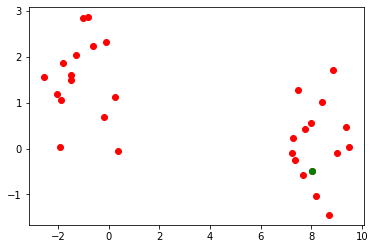

Power Allocated= 3.4392508618608613
CSI= 0.9046684067036942
SNR= 4.752938067350632
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.256181
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.174691

Power Allocated= 3.459509150026486
CSI= 0.9215578276785527
SNR= 5.85330437264929
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4946042525509817
CSI= 0.9523591870202339
SNR= 6.228326609792054
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1697169434948984
CSI= 0.7273196428730558
SNR= 6.460150697637475
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8185839798835
CSI= 0.5793594160099755
SNR= 7.56986611593184
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9279137946990739
CSI= 0.2764940424582235
SNR= 7.626775556492229
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.579032


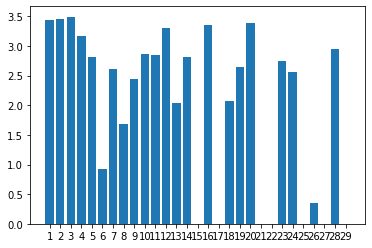

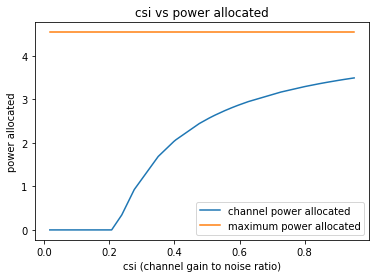

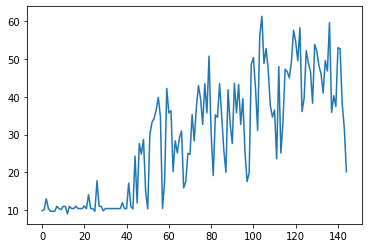

145
[1.2753061386215876, 2.135362374797608, 2.338542094574331, 2.7051310811458276, 2.9625726741627307, 3.6835899190367605, 3.7770665313297496, 3.9790308226542495, 5.0437037220565575, 5.222742280608165, 5.275255185126916, 5.505542701302486, 5.89474965352658, 6.600242667325297, 7.2225452943329165, 16.93556046659475, 20.126367704236223, 20.99996441942916, 21.159787920315672, 22.15639207257729, 22.717533534418152, 23.03786155972496, 24.418517579052185, 25.366858951279152, 25.8840588165126, 26.181797850943784, 27.721143542548727, 29.981529554753386, 38.865220322542314]


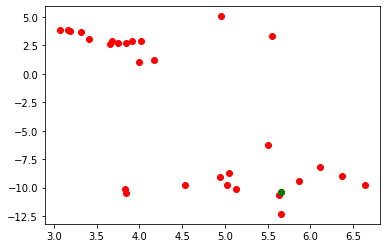

Power Allocated= 4.020290966110997
CSI= 0.8533755480799625
SNR= 1.2753061386215876
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9561760204280239
CSI= 0.30902998196390297
SNR= 2.135362374797608
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7336783856062388
CSI= 0.22429422182715641
SNR= 2.338542094574331
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7061794924447757
CSI= 0.28686761619584134
SNR= 2.7051310811458276
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.025389880104529472
SNR= 2.9625726741627307
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3856790851828693
CSI= 0.5535783855632648
SNR= 3.6835899190367605
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.914110148655921
CSI= 0.7824739315471

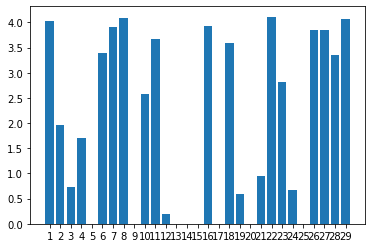

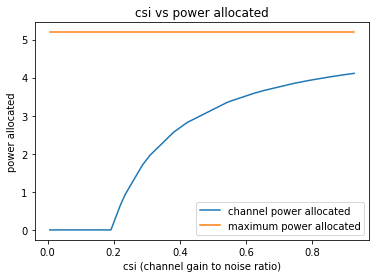

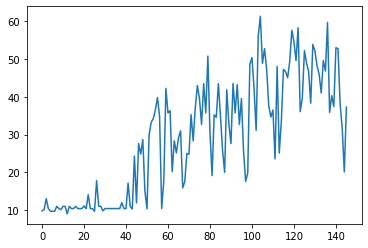

146
[9.891198595237226, 10.386600152438474, 10.721761040304312, 11.558851779878827, 11.634867894286153, 11.672406398356443, 12.096359317634139, 12.122664193566862, 12.924293860538402, 12.930800420044129, 13.0549101450861, 13.937849609927047, 14.357676777376359, 15.02604335431613, 16.126113407236137, 18.686394639366526, 20.33879021774327, 21.794934701001026, 22.487533911371177, 23.87696373766961, 24.6456898964355, 27.048928865092662, 27.196639671982936, 27.213584299804687, 28.437612794643606, 28.519162577695763, 28.903000558736164, 30.254428634504663, 42.53928960636793]


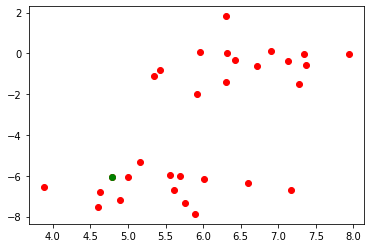

Power Allocated= 1.9125821917261794
CSI= 0.4031739660598429
SNR= 9.891198595237226
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.723153144133766
CSI= 0.5988927929719197
SNR= 10.386600152438474
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.296804
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.396725

Power Allocated= 2.7844384043474033
CSI= 0.6217116630635252
SNR= 10.721761040304312
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.564774
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.059599

Power Allocated= 0.3327084536193068
CSI= 0.24629373382567898
SNR= 11.558851779878827
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.615884
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.380604

Power Allocated= 3.1726802049389717
CSI= 0.8195237658215945
SNR= 11.634867894286153
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.975492
Model client5 Train Epoch: 2 [0/320 (0%

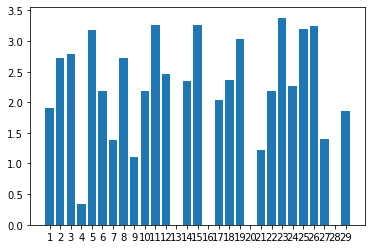

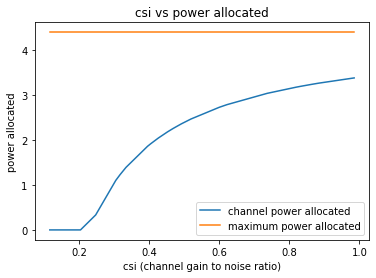

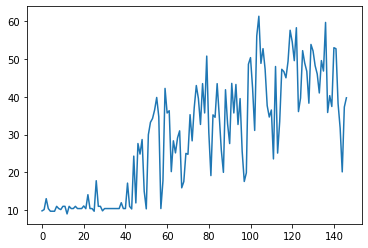

147
[2.5251115849269823, 3.3517179488770026, 3.631651860695334, 4.156234001777552, 4.272878213616201, 4.63419109868595, 4.673067517784407, 4.7478449939525795, 5.010617619537148, 5.112765349027276, 5.280177098739675, 5.320491225548006, 6.418546587791082, 6.457520580824721, 7.0725650166539, 14.893444339658458, 16.672930856253817, 17.52726220695157, 17.812191752065992, 17.925076813152707, 19.128991613758064, 19.21809460326998, 22.383051979455256, 23.277196690903274, 23.468442877982728, 24.69912223891684, 24.803356770715705, 30.5220804285271, 36.96056856447033]


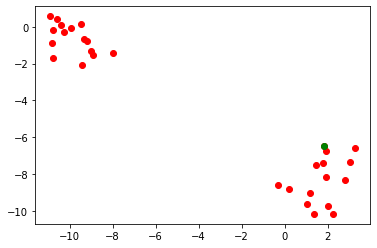

Power Allocated= 1.2171185756581493
CSI= 0.33640680235049913
SNR= 2.5251115849269823
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9504901135913437
CSI= 0.8069592433234614
SNR= 3.3517179488770026
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9079310454659595
CSI= 0.7801656754007776
SNR= 3.631651860695334
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6579411061616129
CSI= 0.28314422875751266
SNR= 4.156234001777552
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9498291455101158
CSI= 0.44645230384579504
SNR= 4.272878213616201
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7896856539575547
CSI= 0.4166624274552977
SNR= 4.63419109868595
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5539863695696843
CSI= 0

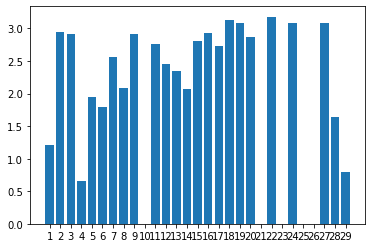

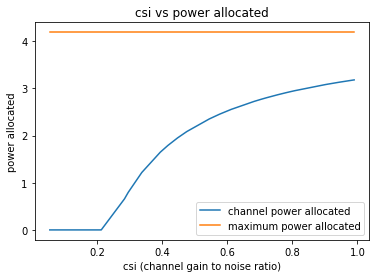

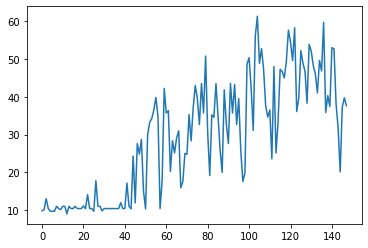

148
[-1.394671311001146, -0.3221909855768388, 0.3565302896711424, 0.3875282110837954, 0.5584021272273132, 0.6821604658185914, 0.7435345013109562, 1.2629794805666639, 1.542378174123856, 1.5855884196017271, 1.6614719262326085, 3.0550118487963793, 3.099468758206437, 3.175973678356834, 3.5231605070192225, 13.923772729985313, 14.74681961751006, 17.406593786709934, 18.304823255922884, 18.348115349346962, 19.882566980034333, 20.042811368886863, 21.003240826867696, 21.512146418897945, 25.724338740090037, 27.07692106300917, 29.336089331711594, 30.30575515167089, 32.07700280602744]


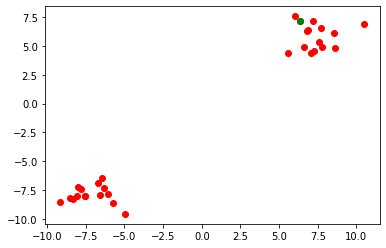

Power Allocated= 2.516781377095634
CSI= 0.45487204573910656
SNR= -1.394671311001146
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7259096758329466
CSI= 0.5026913757430982
SNR= -0.3221909855768388
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4577205802914426
CSI= 0.7952404981222069
SNR= 0.3565302896711424
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2579857833527854
CSI= 0.6862400503946553
SNR= 0.3875282110837954
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.485984317684429
CSI= 0.44858790277799787
SNR= 0.5584021272273132
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6457827115869232
CSI= 0.4832273948078568
SNR= 0.6821604658185914
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1938930777211

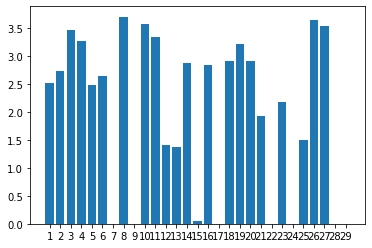

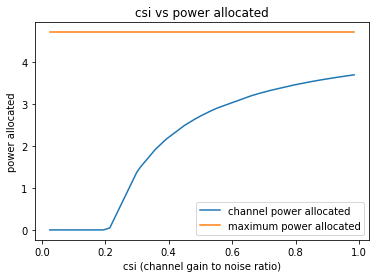

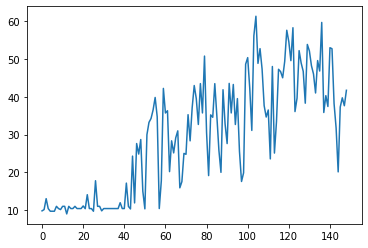

149
[2.7477828776727673, 3.1608674613213914, 3.522285123696788, 3.990778415024044, 4.8204193307316086, 5.0470411816464145, 6.3207497319005945, 6.45385212826287, 6.476596820730486, 6.5100314094182075, 6.633907151538319, 7.235609305494339, 7.617543064975541, 7.901709395840944, 8.24973486287378, 15.755639883641225, 17.517802034118272, 17.66305860342503, 17.808518407035113, 20.29909081729025, 21.619363907941317, 21.922377014715103, 21.979606354942383, 22.620964869022316, 22.697733319028465, 23.687250505167082, 23.780022809030907, 25.799747564511772, 35.31509459248155]


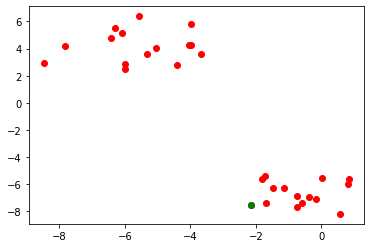

Power Allocated= 3.304219749894872
CSI= 0.871575751910406
SNR= 2.7477828776727673
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7982281613639497
CSI= 0.3768836470081295
SNR= 3.1608674613213914
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.010429
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.853260

Power Allocated= 1.9780765598376298
CSI= 0.40428699595662954
SNR= 3.522285123696788
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2678120719306727
CSI= 0.8447694849688089
SNR= 3.990778415024044
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.367115
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.190710

Power Allocated= 3.018422901482208
CSI= 0.6977665643175106
SNR= 4.8204193307316086
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4081316563689841
CSI= 0.24731445590028622
SNR= 5.0470411816464145
Client: c

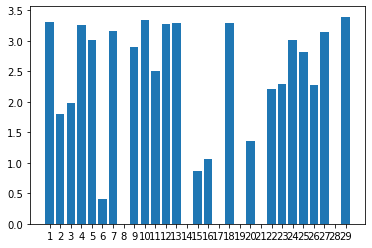

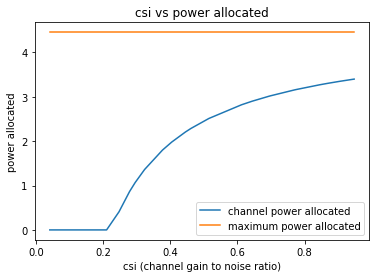

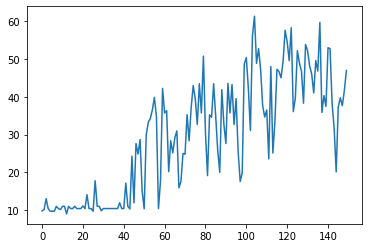

150
[2.7066916548712747, 3.623187324480744, 4.408650443140888, 5.137912869803289, 5.200672565458839, 5.319928573898864, 5.91728216114543, 6.251019272423528, 6.523518090070231, 7.106600334804773, 7.250391690214883, 7.379935337139075, 7.6397963509353355, 7.679674310475095, 8.255158779194087, 14.945996633173921, 14.981284460794466, 16.481382069415346, 16.700667203096785, 19.043159610905626, 19.421284348337686, 19.613495217000004, 20.18960851600315, 20.793224094064023, 21.152292714382433, 22.709011675554788, 24.47913487964331, 25.49319478701837, 29.03741816356518]


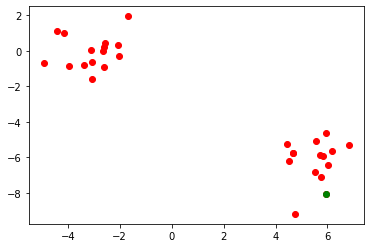

Power Allocated= 0.1219791228851621
CSI= 0.23141289046828206
SNR= 2.7066916548712747
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.370989
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.731760

Power Allocated= 2.0752234380105024
CSI= 0.42229085286526846
SNR= 3.623187324480744
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4050130800686964
CSI= 0.4906177944505258
SNR= 4.408650443140888
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.548017076000877
CSI= 0.34539421145829885
SNR= 5.137912869803289
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.086765
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.206920

Power Allocated= 3.4347252739209138
CSI= 0.9915379166649577
SNR= 5.200672565458839
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5111885748644238
CSI= 0.34105586115653164
SNR= 5.319928573898864
Client: 

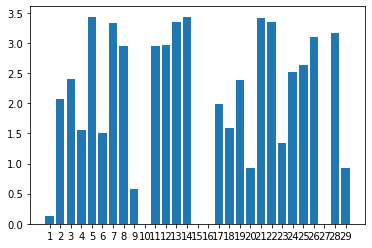

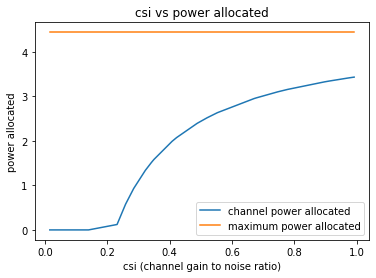

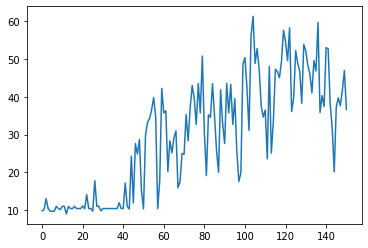

151
[9.26222428797746, 10.28436756113327, 10.467076835107154, 10.649101928252676, 11.85478264007967, 12.06095976293471, 12.116653463372925, 12.526688959366249, 12.563388715732978, 13.306908338685242, 13.310092685065868, 13.786476380933903, 14.073240019921219, 14.255633984239704, 14.718795994986168, 15.821906187059417, 17.484156674929725, 18.60299563217918, 20.953054031805333, 21.17591231045339, 21.580817723531702, 23.367900727277895, 23.45008216535559, 23.77632139304453, 24.916691367201576, 25.7069031803677, 31.401271791890874, 31.552320130818025, 31.875515273266554]


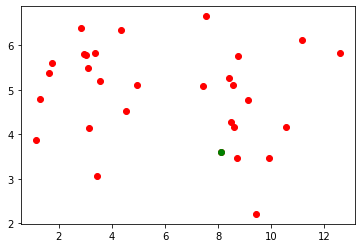

Power Allocated= 2.7315436257744943
CSI= 0.4913147756926929
SNR= 9.26222428797746
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.267943
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.073113

Power Allocated= 0
CSI= 0.11031349866840012
SNR= 10.28436756113327
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09646115757845586
SNR= 10.467076835107154
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9040829810413484
CSI= 0.5368217658811028
SNR= 10.649101928252676
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08421243986121729
SNR= 11.85478264007967
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7606099996711677
CSI= 0.9937506439868361
SNR= 12.06095976293471
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.794841
Model client6 Train Epoch: 2 [0/320 (0%)]

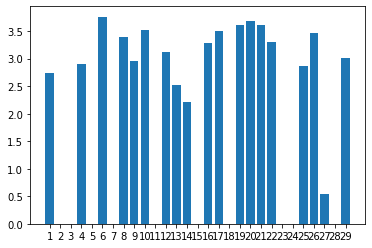

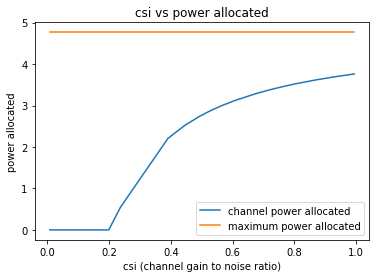

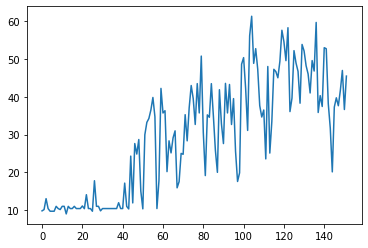

152
[7.006327942468015, 7.8943978232655265, 9.10111554224234, 9.559559862623763, 9.810794913047161, 9.93244391568936, 10.071366006193738, 10.523311782836517, 11.176649107561353, 11.192647502519097, 11.502585731308617, 11.562592094263353, 12.23592869096581, 12.409686398408434, 13.006783650391062, 19.06952526188642, 21.013179895817977, 22.18747755170372, 23.10932808342617, 23.535191257470213, 23.75068411322831, 23.895138321362985, 24.444851350461178, 24.763160816416118, 29.298619331816063, 29.500512630510165, 32.106530678189124, 33.72783384823952, 34.750132785069354]


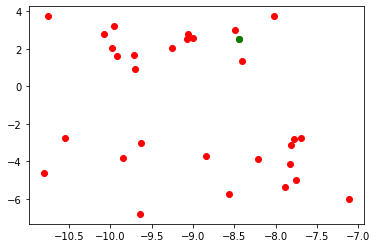

Power Allocated= 0
CSI= 0.037783281436912564
SNR= 7.006327942468015
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2820174289702413
CSI= 0.9724529379898686
SNR= 7.8943978232655265
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.663016355786093
CSI= 0.6070434750071351
SNR= 9.10111554224234
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.595536343532032
CSI= 0.5831555006279948
SNR= 9.559559862623763
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9568290613019803
CSI= 0.42489624005308124
SNR= 9.810794913047161
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 0.944963
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.467802

Power Allocated= 3.077749772650715
CSI= 0.8112964562006785
SNR= 9.93244391568936
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

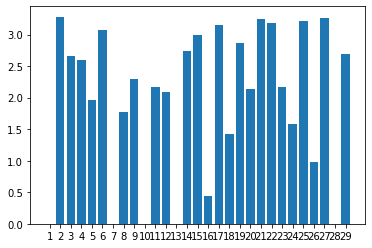

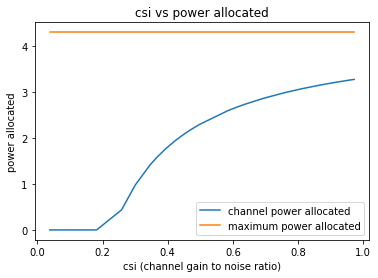

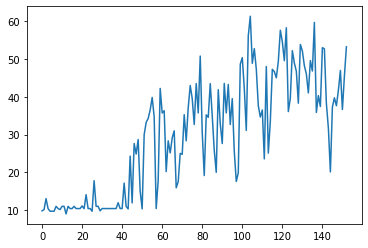

153
[1.5951151565650346, 2.1583716967025666, 2.813469695250017, 2.8323895679754862, 2.8564746550601736, 2.995084808108905, 3.1461788832047723, 3.277547227319927, 3.9433122655823634, 4.384717965134023, 4.815449007978902, 5.3795218407860546, 5.729316518283844, 5.87804678380767, 7.218456407728923, 16.41763388328121, 16.645975828780408, 17.14175889648037, 17.53566470494896, 18.12661944516375, 18.617502634826046, 19.531805832900773, 19.678627582980134, 20.091922793825717, 20.37443597370866, 22.7637705682693, 25.482946312389437, 26.672646645578645, 27.468022771016194]


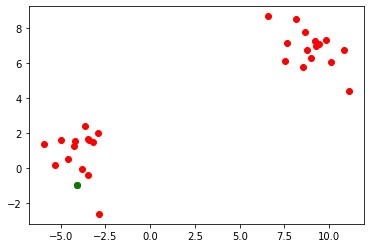

Power Allocated= 3.4309949047418113
CSI= 0.853707415273314
SNR= 1.5951151565650346
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.344137903661027
CSI= 0.7947745147278935
SNR= 2.1583716967025666
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1492534686559077
CSI= 0.28959461041436185
SNR= 2.813469695250017
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15455688285757951
SNR= 2.8323895679754862
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.929963947217011
CSI= 0.37419653559253097
SNR= 2.8564746550601736
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8977540629427754
CSI= 0.5866470873931844
SNR= 2.995084808108905
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06847012240451156
SNR= 3.14617888

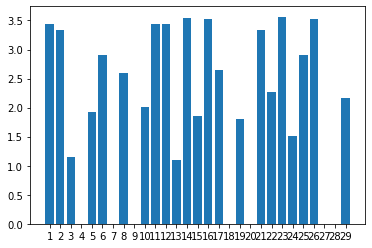

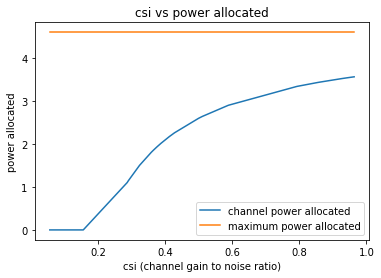

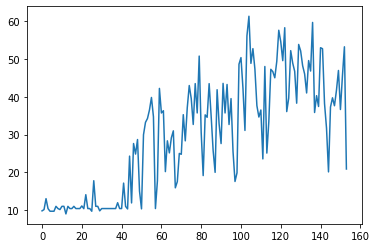

154
[12.003250615960962, 13.63443671499369, 14.235171852380814, 14.71277498818773, 14.830409790406371, 16.101822082697204, 16.19266769544442, 16.64145644008601, 17.409717154970274, 17.513512284347467, 17.69025671792535, 17.842522354621146, 18.26672685895617, 18.34589765892216, 20.216624744125482, 21.638810520212516, 21.644293806919002, 21.869557004530435, 21.875525349850484, 21.92079897958724, 22.414606509301514, 23.560365292287887, 24.673029158416785, 24.68580332110771, 25.25715348834698, 25.705044476944522, 30.182614462869523, 30.825213884046782, 31.266977991003188]


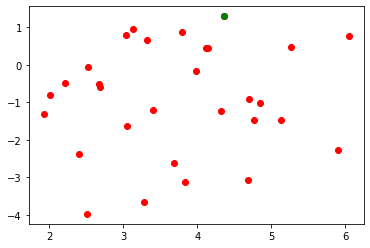

Power Allocated= 2.882316735747277
CSI= 0.6445431191060101
SNR= 12.003250615960962
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.745473
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.203532

Power Allocated= 2.2105383717028015
CSI= 0.44978894771258693
SNR= 13.63443671499369
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1681902127406213
SNR= 14.235171852380814
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0883207648958847
SNR= 14.71277498818773
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020281935646749072
SNR= 14.830409790406371
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.618846804144694
CSI= 0.3552452748794023
SNR= 16.101822082697204
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.023181
Model client6 Train Epoch: 2 [0/320 (0%)

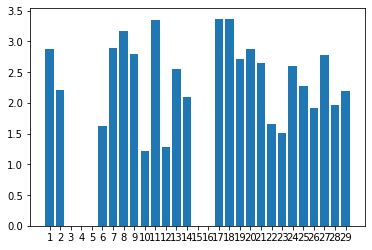

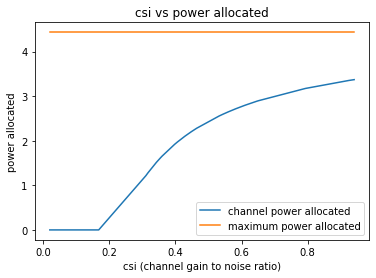

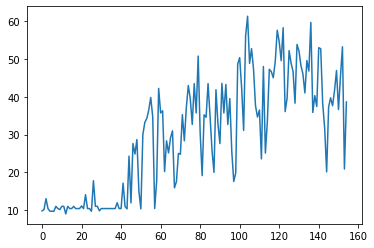

155
[4.570584650860342, 4.874464435977661, 5.627821443380313, 6.23163022433015, 6.589079988818391, 6.756863590735661, 6.820000238300626, 7.131971932729936, 7.667632667881086, 8.107245466254273, 8.115632628515879, 8.198937483529804, 9.194211849607445, 10.00421264820552, 10.224817485229803, 14.998478041646514, 19.622419943326896, 21.15632412881881, 21.249447999404527, 21.940617230547886, 22.503112645014255, 23.489796484891716, 23.920352760721386, 24.618292778544976, 24.65318364819844, 25.360296816610628, 29.24377886817396, 38.788513654963964, 44.48161269724659]


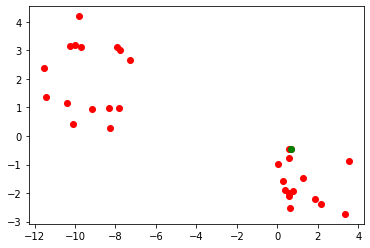

Power Allocated= 3.497421873095166
CSI= 0.8394541468250557
SNR= 4.570584650860342
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.027526135043129063
SNR= 4.874464435977661
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0662508557856396
SNR= 5.627821443380313
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.370556640997205
CSI= 0.7586588424777247
SNR= 6.23163022433015
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.501700
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.147731

Power Allocated= 0
CSI= 0.010801924190722123
SNR= 6.589079988818391
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6810462190560758
CSI= 0.2495242851326842
SNR= 6.756863590735661
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.584332
Model client6 Train Epoch: 2 [0/320 (0%)]	Lo

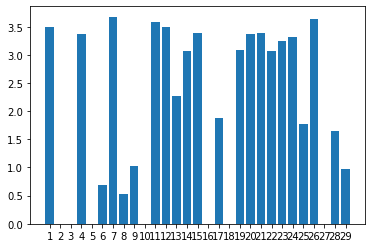

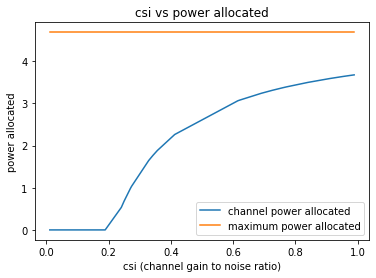

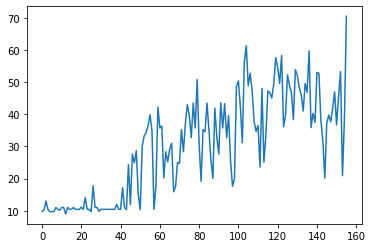

156
[5.513424027513034, 7.055514920263921, 7.120516707491997, 7.8574490801492605, 8.056956626947542, 8.09551419742249, 8.250831393993625, 8.300173244230148, 8.553456028298578, 8.654349393084823, 8.703651957749532, 8.791648830179339, 9.084840830768561, 9.359002748360407, 10.231157383045169, 13.130357541713995, 14.982043213044648, 16.575325367436356, 18.536592547003103, 18.906851446850098, 19.257487935946738, 19.68545940763373, 20.61241680461767, 21.239175413021087, 21.24247630858847, 22.22551655158779, 22.425137212942165, 28.343919960538912, 43.693581272035765]


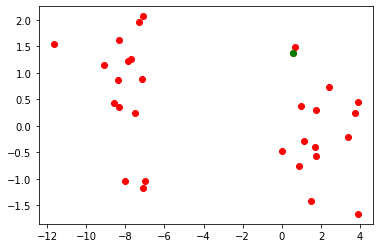

Power Allocated= 0
CSI= 0.04437061137328746
SNR= 5.513424027513034
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.187674188571376
CSI= 0.8377463203935502
SNR= 7.055514920263921
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.413944100904356
CSI= 0.5082827570204637
SNR= 7.120516707491997
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7777350943760855
CSI= 0.6235899588781225
SNR= 7.8574490801492605
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.357911609878445
CSI= 0.9770955591420233
SNR= 8.056956626947542
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1671694395499772
CSI= 0.23729388972297616
SNR= 8.09551419742249
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.093718
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.543369

Power All

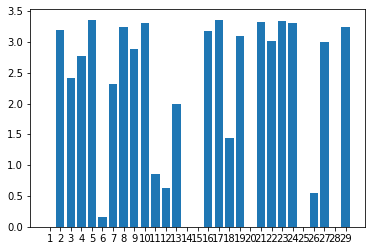

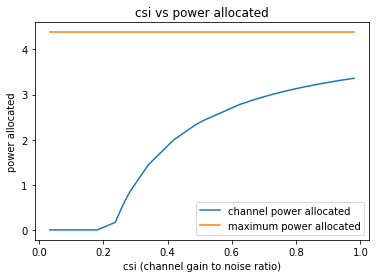

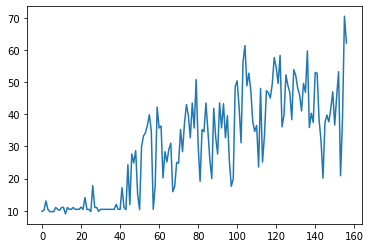

157
[6.150784642144845, 6.532367996618337, 7.029732955975403, 7.059279136930217, 7.7184344564481275, 7.8621275956934085, 7.911185536531985, 7.925870193830259, 8.506423342664872, 9.6518156226508, 9.661374390117782, 10.859435430141605, 11.004514285694402, 12.38567444499442, 13.188672879548507, 19.67782821129837, 19.944457363123732, 20.748325930124746, 20.862553663530726, 20.933822880866323, 21.77313154985715, 24.01988427840185, 25.143539962569665, 25.655650848275833, 26.125054721302572, 30.37610754153247, 32.652817729269955, 32.69794960304754, 33.66593978208502]


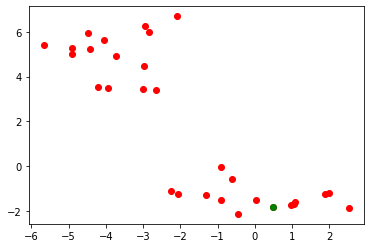

Power Allocated= 3.0881482179766735
CSI= 0.8139857300127564
SNR= 6.150784642144845
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3315183206888337
CSI= 0.33499124266312175
SNR= 6.532367996618337
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.265635384736549
CSI= 0.951442559443806
SNR= 7.029732955975403
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2024663322593754
CSI= 0.897501189778606
SNR= 7.059279136930217
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.729008198191181
CSI= 0.6298566731898743
SNR= 7.7184344564481275
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 0.667443
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.075617

Power Allocated= 0
CSI= 0.12544928550701073
SNR= 7.8621275956934085
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

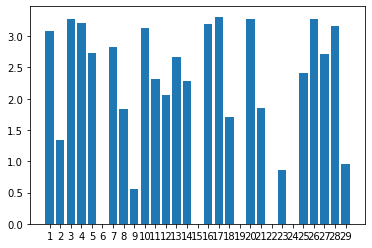

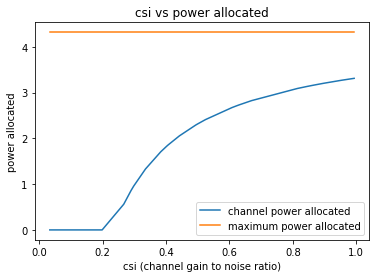

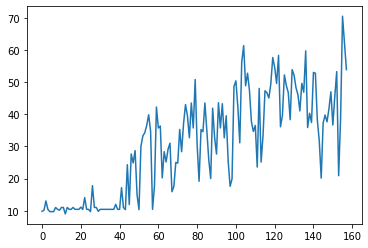

158
[7.051279289178481, 7.777909336206557, 7.870004731824035, 8.294101732585519, 8.543928981718928, 9.190341917296202, 9.228353689890643, 9.526433219379776, 10.050425117298687, 10.137792856646112, 11.884902954184273, 12.515082367851527, 12.644527305921088, 12.955154441727453, 13.548715230557994, 15.16698499151108, 17.36714113008731, 19.997663386444575, 20.671669179591618, 21.162741675406785, 21.534710417955203, 21.584483477791025, 24.39298733881156, 25.220954680673696, 25.642496160995282, 30.012716225295993, 30.08824471557352, 30.871331462414066, 35.570397356642644]


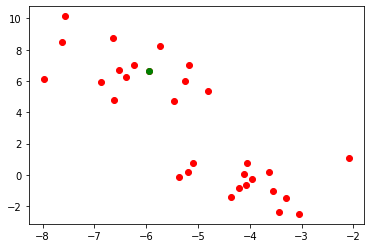

Power Allocated= 3.1971860795992164
CSI= 0.7148859206856658
SNR= 7.051279289178481
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9682043003864096
CSI= 0.614323683162775
SNR= 7.777909336206557
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 0.886435
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.176084

Power Allocated= 3.0109506435084645
CSI= 0.6308909365347496
SNR= 7.870004731824035
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.973988285087337
CSI= 0.6165143057052098
SNR= 8.294101732585519
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.938551153714596
CSI= 0.6033329891629864
SNR= 8.543928981718928
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10036449045456974
SNR= 9.190341917296202
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allo

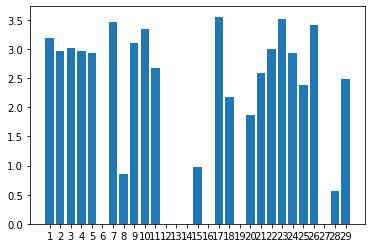

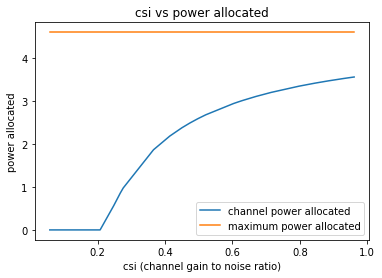

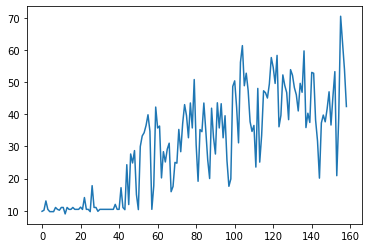

159
[8.578300201865202, 9.661260078399188, 9.968674240826832, 10.191060085916085, 10.496525187172026, 10.664122267162247, 11.298694208471108, 11.32083806360131, 11.99607608001549, 12.460181380762712, 12.495831640033158, 12.543194038891109, 12.600832761621128, 13.532844073458968, 17.187088031659396, 17.91922281787958, 18.134883267876404, 18.328361893193, 18.397827282234562, 19.579813826266463, 20.06058999884857, 20.592612192929703, 20.957318568028704, 21.666177693277337, 22.278208707472675, 22.300770093184077, 24.93748589086749, 29.37180420392501, 40.05871947784726]


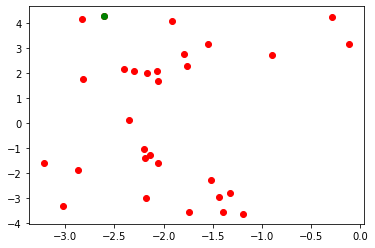

Power Allocated= 2.328684135749817
CSI= 0.41629678641944623
SNR= 8.578300201865202
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.011896
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.476327

Power Allocated= 2.8050519098856053
CSI= 0.5192742586063808
SNR= 9.661260078399188
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.587393
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.198349

Power Allocated= 3.1509739518221145
CSI= 0.6329744546432879
SNR= 9.968674240826832
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.671890
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.062448

Power Allocated= 3.698948863369612
CSI= 0.9691165094905249
SNR= 10.191060085916085
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.630719355730392
CSI= 0.4761684402024109
SNR= 10.496525187172026
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0960256611046586
CSI=

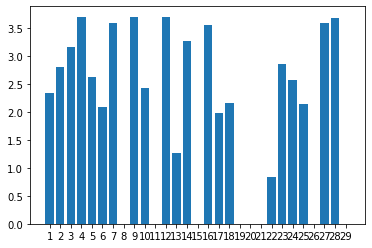

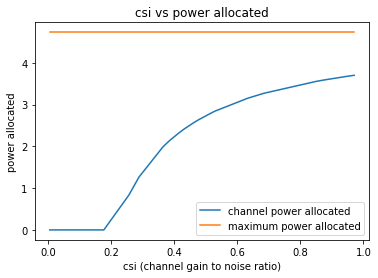

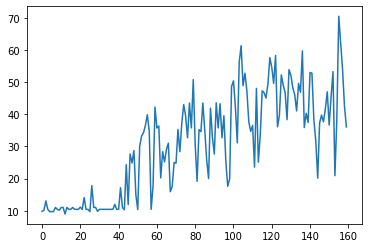

160
[1.3485780173572106, 1.784312610418553, 2.681724593193449, 2.8630133720638047, 3.0743881367921064, 3.1910992510396983, 3.2956852334424003, 3.709179559041752, 4.040650830735678, 4.507199019477018, 4.811173423049305, 5.134054484474578, 5.376429728045903, 5.6371655269113266, 7.363114427782686, 15.802925207725025, 17.347141460004707, 17.80150341107991, 19.52872126293761, 21.107999895260264, 21.67106411301532, 22.247211811688658, 23.004992337727327, 25.33786577769288, 26.152679680100757, 26.35462000620249, 27.78206607751091, 29.802731902839565, 31.09364412591648]


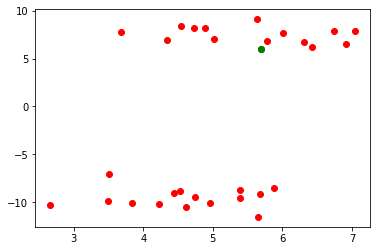

Power Allocated= 3.297466472935019
CSI= 0.5087268474129383
SNR= 1.3485780173572106
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.680463298528996
CSI= 0.6318338373024612
SNR= 1.784312610418553
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1351373531052963
SNR= 2.681724593193449
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1502857304546339
SNR= 2.8630133720638047
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.981022154345223
CSI= 0.7799486189304732
SNR= 3.0743881367921064
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.326978
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.233090

Power Allocated= 0
CSI= 0.04506458565860372
SNR= 3.1910992510396983
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4418895778273804
CSI=

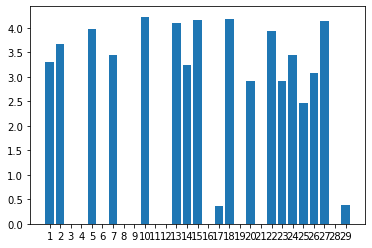

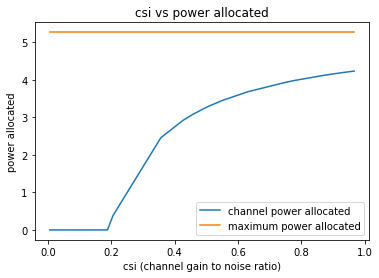

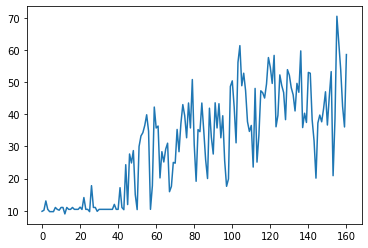

161
[7.011737706034346, 7.08655701584124, 7.251890548148657, 7.272514826710823, 7.491714842178334, 8.057429892886894, 8.612030037992524, 8.878414046297419, 9.484555272629326, 9.821011943187997, 10.23155453052228, 10.913101453087366, 11.870832450859117, 12.03527705933771, 12.404058963973192, 16.3835723034517, 18.11107203259698, 18.139345965492335, 19.235894829333027, 20.36692607361668, 21.300353314141365, 22.03850094982467, 22.86578978238535, 24.464694590626298, 25.669666250339567, 27.025547149430896, 28.432662593192127, 29.27461393990549, 35.72687471220017]


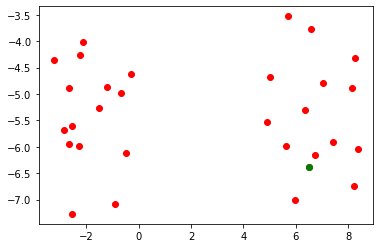

Power Allocated= 1.3266668708363536
CSI= 0.2736795119482004
SNR= 7.011737706034346
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.898770
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137628

Power Allocated= 2.087887563483262
CSI= 0.34569920224572603
SNR= 7.08655701584124
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.314378
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.340241

Power Allocated= 2.261435275880162
CSI= 0.3677632721963753
SNR= 7.251890548148657
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12227992353820993
SNR= 7.272514826710823
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08757929448952018
SNR= 7.491714842178334
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.76345498627321
CSI= 0.8216111548319379
SNR= 8.057429892886894
Client: client6
Poor Channel, client not taken f

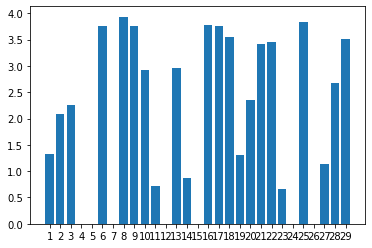

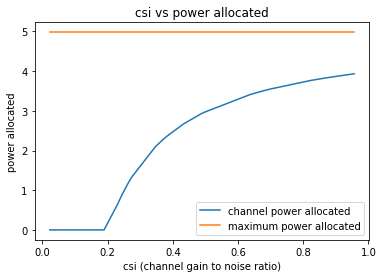

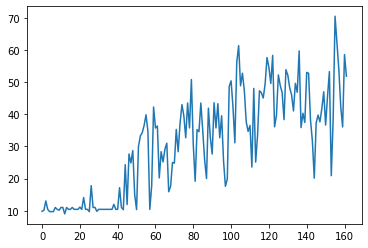

162
[3.218158162829301, 3.393854405313472, 4.06083622640543, 4.197144444141351, 4.349009182046299, 4.507585391870869, 5.010503787576794, 5.222288357658165, 5.4290938071253665, 6.607021314979383, 6.979172951077142, 8.071391465702686, 8.697853681759792, 9.0026991595076, 9.373681761518101, 15.271737061065163, 16.760748988997445, 16.822665623102242, 17.174521452428053, 17.39321082665038, 17.43230995260435, 20.09425073429731, 20.96431567143506, 23.107019920574572, 23.697846810999305, 25.456930893199857, 26.01634457353029, 27.276456254635804, 29.37077154082841]


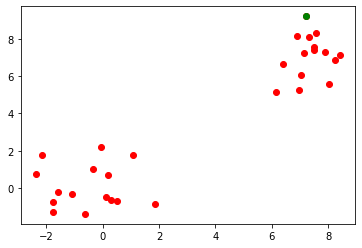

Power Allocated= 2.943839862369438
CSI= 0.610869005492811
SNR= 3.218158162829301
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.046436662335889
CSI= 0.6517140114388301
SNR= 3.393854405313472
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8372452883176438
CSI= 0.5735238177456865
SNR= 4.06083622640543
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.728329
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.484716

Power Allocated= 2.7759768059988015
CSI= 0.5540549185915388
SNR= 4.197144444141351
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6281755723519376
CSI= 0.25299313226606934
SNR= 4.349009182046299
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.328348
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.121231

Power Allocated= 1.8411504558116105
CSI= 0.3650032566781223
SNR= 4.507585391870869
Client: client6

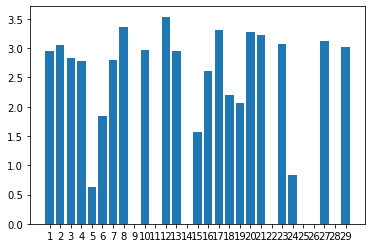

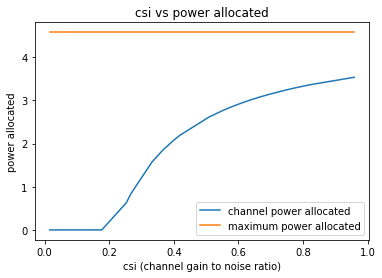

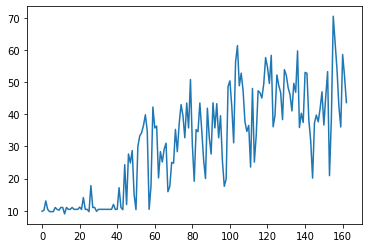

163
[15.161639547339608, 17.418496867266796, 18.505934559966207, 18.675519562279025, 19.18673947730354, 19.34817404404676, 19.3637480259466, 19.764001435734258, 19.814912726281673, 20.308174544347054, 20.510573934941696, 20.766973070584456, 20.81499746626285, 21.23341438223177, 21.66586192335142, 22.377981946911813, 23.057738223915145, 23.490228647255524, 23.770299013404063, 24.36291612333743, 24.516978371266788, 26.540659464379043, 26.753785429279457, 27.07175962429543, 27.09878299055426, 27.749104503316325, 28.464471735290793, 31.98951574415722, 34.88554550329837]


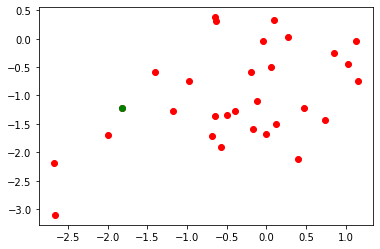

Power Allocated= 3.5002199772233977
CSI= 0.9589965848249905
SNR= 15.161639547339608
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.599939
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.132470

Power Allocated= 2.3127708434872707
CSI= 0.4483891299284326
SNR= 17.418496867266796
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.656723
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.110435

Power Allocated= 3.2974003438938198
CSI= 0.8028412781821057
SNR= 18.505934559966207
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.260808
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.262560

Power Allocated= 1.9182206152970385
CSI= 0.38098780295674006
SNR= 18.675519562279025
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.181420
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.116853

Power Allocated= 0.9747781364366248
CSI= 0.2802534729820937
SNR= 19.18673947730354
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)

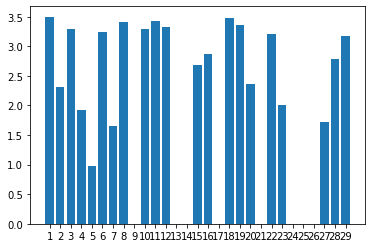

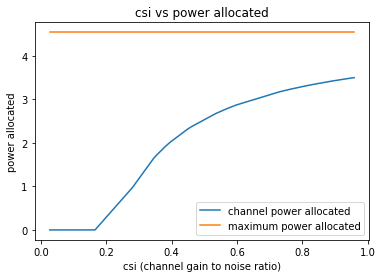

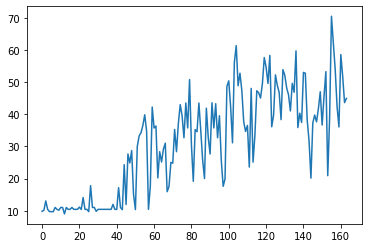

164
[7.127435082437, 8.315411985506056, 9.076126710903669, 9.400593567108363, 9.510313491323089, 9.76091405198083, 9.927434483122735, 10.287150414842326, 10.929594602173111, 10.958534860205363, 11.3477066942342, 12.443603532271002, 12.913964549073205, 12.997095959170906, 13.31346767497419, 18.167827445559134, 19.945543402513795, 20.60810186558485, 21.69466987316092, 22.41894763978489, 22.443968569656718, 23.163494988472266, 23.8529592494826, 25.16053303196725, 26.901607903410458, 27.22264570737444, 28.21578653032433, 28.48137915155964, 36.645920727617295]


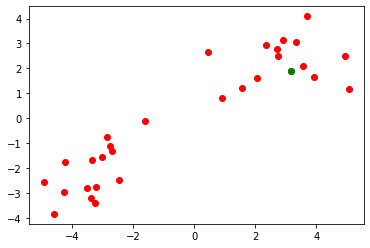

Power Allocated= 2.3151560502697097
CSI= 0.4791503860052051
SNR= 7.127435082437
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7919176860357955
CSI= 0.6210154881761216
SNR= 8.315411985506056
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 0.608928
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.294280

Power Allocated= 2.631284735310097
CSI= 0.5646850229579554
SNR= 9.076126710903669
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.605609
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.348567

Power Allocated= 3.1092757124152066
CSI= 0.7734503749958205
SNR= 9.400593567108363
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020069037999607797
SNR= 9.510313491323089
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1353074443784625
CSI= 0.7893432107862517
SNR= 9.76091405198083
Client: client7
Poor Channel, cl

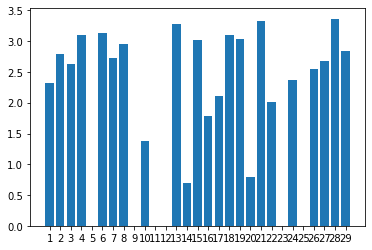

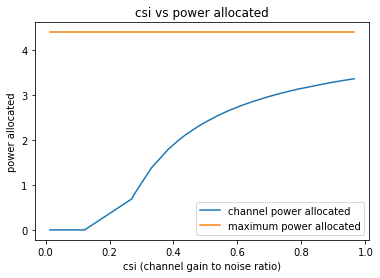

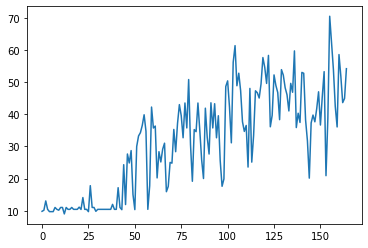

165
[7.627234033099519, 7.921188563460055, 8.286025638639275, 9.27434494865688, 10.024534491199088, 10.333815010472737, 10.76126668289851, 10.849039488596869, 10.95885073510403, 11.237078289290576, 11.32766492984749, 11.380835474285412, 13.591097308735245, 14.369226909498176, 14.602505793798278, 18.473108642923208, 21.12497301337013, 22.42118657503325, 22.74166372817664, 27.012882519259488, 27.61512909258927, 27.960373913797717, 28.054489575270622, 30.69563955387222, 30.90547481327934, 31.86770755321446, 33.08074743680173, 38.227039267165694, 43.4823920513601]


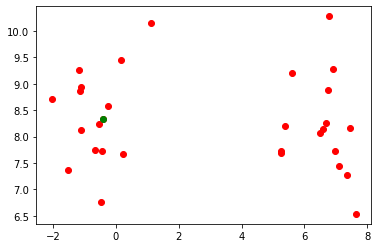

Power Allocated= 0
CSI= 0.1571411946649124
SNR= 7.627234033099519
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18187236395294537
SNR= 7.921188563460055
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.311399632929618
CSI= 0.9292775594089483
SNR= 8.286025638639275
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7828329799579103
CSI= 0.6231805435660651
SNR= 9.27434494865688
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2981001667009666
CSI= 0.9179329223289822
SNR= 10.024534491199088
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9473579248859414
CSI= 0.6943738195777157
SNR= 10.333815010472737
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.332281452446043
CSI= 0.9476670443523937
SNR= 10.761266682898

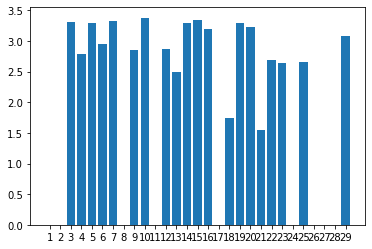

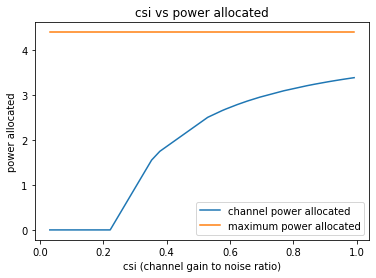

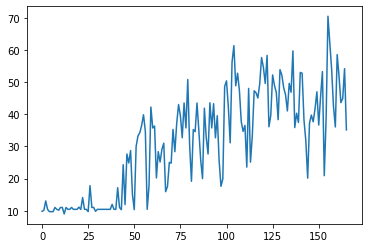

166
[4.922055031018371, 5.059164352448162, 5.326772921246758, 5.431543408415481, 5.505314172019081, 5.559403057356571, 5.60422220904497, 6.244125080525369, 6.560744041313962, 6.839453850768629, 7.479516945949683, 7.879952212777861, 7.918331577879123, 8.31038749301346, 9.168520992788068, 15.370038191945078, 16.555746387963364, 18.175745707357056, 18.286794876967043, 18.509200240658203, 18.82954987008685, 19.697085267393227, 20.836643872183213, 22.853749168540293, 23.352536045901218, 24.25327051774797, 26.85131611632527, 27.32621954821749, 31.966758707079556]


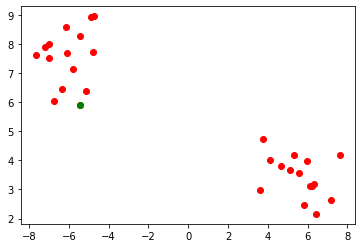

Power Allocated= 0
CSI= 0.1005474678903463
SNR= 4.922055031018371
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17067951772267298
SNR= 5.059164352448162
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8754946607514418
CSI= 0.7290512689031933
SNR= 5.326772921246758
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2450336792937327
CSI= 0.3330994276688013
SNR= 5.431543408415481
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9185568056382127
CSI= 0.3004280947528004
SNR= 5.505314172019081
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5583310454881794
CSI= 0.2132737639557598
SNR= 5.559403057356571
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.473865
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.850559

Power Allocated= 3.77873

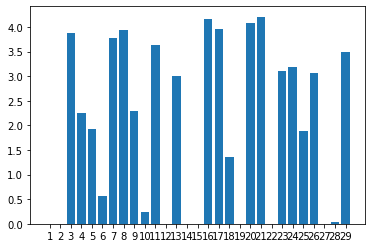

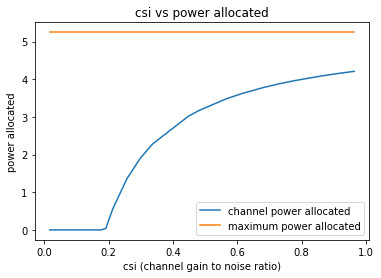

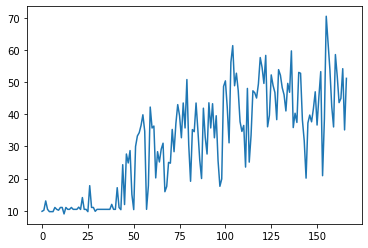

167
[9.999942024392602, 10.10290395819334, 10.104954967516381, 10.676628172629016, 11.038449183829416, 11.339187500182804, 11.670555853308693, 11.687403027678924, 11.868227050102734, 12.1087377751615, 12.205640493490618, 12.951659517970707, 13.175931167364842, 13.512600681545551, 14.49536771588738, 16.015340116926893, 16.61333954567313, 17.764624595254425, 18.88942609710321, 19.710562493741968, 20.239827177147536, 21.053958058803982, 21.48588790077325, 21.9587659896805, 22.406849208807643, 23.79461914358561, 25.188119198846678, 26.061012016531002, 32.513682391673775]


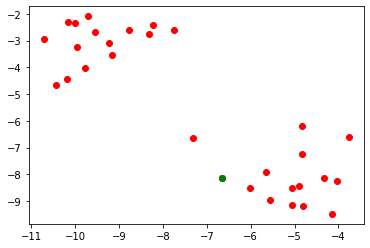

Power Allocated= 2.2807912321645296
CSI= 0.42964485966386656
SNR= 9.999942024392602
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.896322854350926
CSI= 0.3687353600193942
SNR= 10.10290395819334
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.882837
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.291963

Power Allocated= 0
CSI= 0.1354794992495002
SNR= 10.104954967516381
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05837853262565229
SNR= 10.676628172629016
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1506486119757433
CSI= 0.22433363449227617
SNR= 11.038449183829416
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.887787
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.822988

Power Allocated= 0
CSI= 0.1532888874010765
SNR= 11.339187500182804
Client: client6
Poor Channel, client not taken for averag

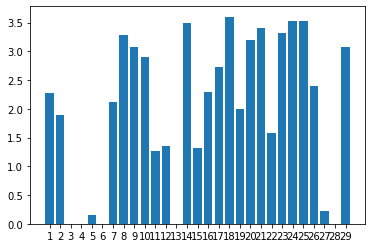

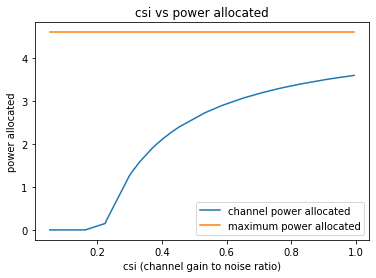

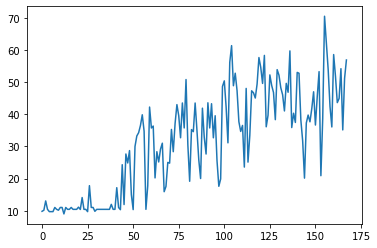

168
[8.784046237099542, 8.922769910520042, 9.101894230234606, 10.031633993963357, 10.278745293313316, 10.399661323966729, 10.493970962061377, 10.884658352735995, 11.373292521012281, 12.384455953209404, 12.829799407569867, 12.883119190458423, 12.894343476521337, 12.921252119582961, 13.282449314667753, 17.338479614310117, 19.459359233760342, 19.884568178929143, 21.788071876901817, 21.87421777658014, 22.60654557900652, 25.03716549280017, 25.577491730732, 25.707375134689954, 26.50588915331246, 28.391713628340035, 31.21118127186366, 31.93299611103847, 38.286154446672604]


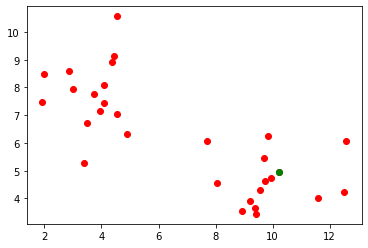

Power Allocated= 3.251733490527861
CSI= 0.9942732866529685
SNR= 8.784046237099542
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.132782605100642
CSI= 0.889117622963982
SNR= 8.922769910520042
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.935143776477287
CSI= 0.7562297765458968
SNR= 9.101894230234606
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.866838931001668
CSI= 0.7190859949260853
SNR= 10.031633993963357
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.574463
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000333

Power Allocated= 3.095186390258796
CSI= 0.8603580413825431
SNR= 10.278745293313316
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.266136
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.538925

Power Allocated= 0
CSI= 0.17406431288300417
SNR= 10.399661323966729
Client: client6
Poor Channel, c

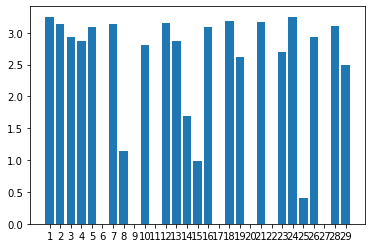

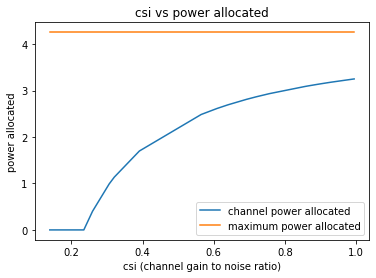

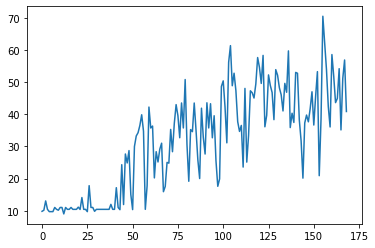

169
[-0.3095658392066909, 0.4023240842628355, 0.5292388912836419, 1.1002150105602335, 1.3028619887845263, 1.8865628527252403, 2.1517306055621157, 2.5378999631604415, 2.6901954018211116, 2.9522706330846376, 2.955675821592458, 3.171111144731983, 3.836377658417273, 4.014715338484752, 4.31669765271886, 18.143863856360593, 22.108176581239622, 22.86708231138019, 24.798974614706314, 25.303104194875434, 26.00098392725634, 26.418932582520284, 26.555299807417363, 27.374214465671027, 28.103381217411798, 28.787994860825894, 29.184666361933, 30.63138911702215, 32.654953446427974]


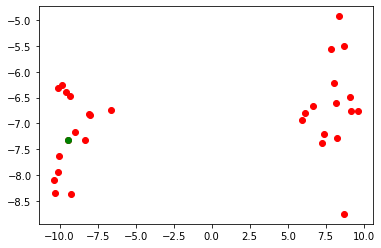

Power Allocated= 0
CSI= 0.1698633176655926
SNR= -0.3095658392066909
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5842863899335855
CSI= 0.6397845608755349
SNR= 0.4023240842628355
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.358525069216946
CSI= 0.5590379044518071
SNR= 0.5292388912836419
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16433842132686904
SNR= 1.1002150105602335
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6480984577493056
CSI= 0.6670161458968162
SNR= 1.3028619887845263
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.507614
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.697376

Power Allocated= 0
CSI= 0.20305612581325683
SNR= 1.8865628527252403
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.704335508543856

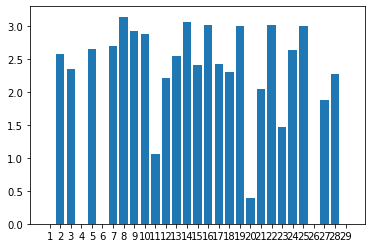

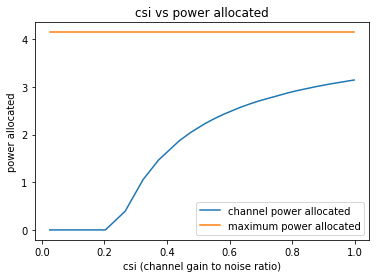

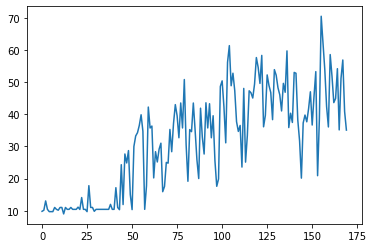

170
[6.849130348592756, 9.883767598111767, 10.67023240391427, 10.751861745116043, 11.57744649665786, 12.068755722718784, 12.376724584757437, 12.998200664847733, 13.538615271911265, 14.583285589524118, 14.599715343142494, 15.342606278686667, 15.973339142160592, 16.129528153229234, 16.37746845348524, 16.7332213743135, 16.8948190463544, 18.064671520453143, 19.08521995518313, 19.979834744274193, 21.271273008821126, 21.420221933348518, 22.47196591208371, 22.90526860904706, 23.188528683875006, 27.9367208835674, 29.145591617547502, 32.67774781950983, 36.325090825355645]


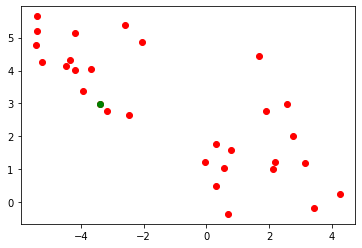

Power Allocated= 3.605965958233495
CSI= 0.996831486847179
SNR= 6.849130348592756
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.375203
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.118492

Power Allocated= 2.678349921383905
CSI= 0.5179214759156698
SNR= 9.883767598111767
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.333738
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.332608

Power Allocated= 1.9734867058471655
CSI= 0.37941191985917444
SNR= 10.67023240391427
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.493892
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.075161

Power Allocated= 1.8180789483022024
CSI= 0.35828609760406605
SNR= 10.751861745116043
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.257542868993344
CSI= 0.42524208549002696
SNR= 11.57744649665786
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.142399
Model client5 Train Epoch: 2 [0/320 (0%)]	L

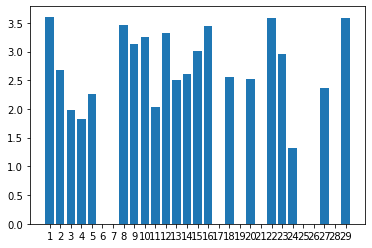

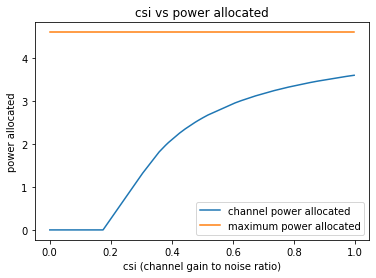

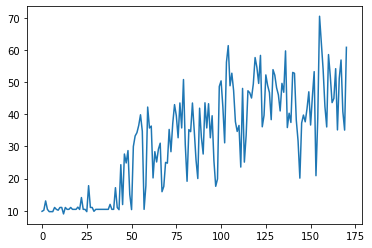

171
[-1.3873797623646142, -1.3400545225255613, -0.8007248700959986, -0.5257700315936344, 0.39477882899687566, 0.9160270255762608, 0.9278687341614, 1.5099290553312403, 1.6576355784852077, 1.9067322128648496, 1.962422868163498, 2.503233294567566, 2.562521546155245, 3.099523819707394, 3.3006143708447047, 16.36995973057066, 19.35585526427691, 22.28768214494661, 22.791505814612993, 23.490706971432235, 23.565120477628746, 23.880999347794884, 25.76106312678672, 27.104740853333098, 27.61367080680166, 28.405254440308912, 29.718571776421165, 32.934496518519964, 33.03955084786841]


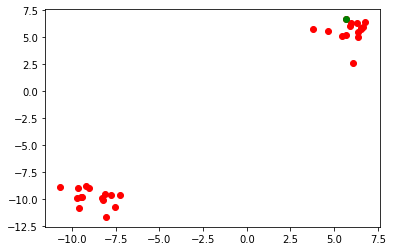

Power Allocated= 3.1523014504468834
CSI= 0.7218572787957502
SNR= -1.3873797623646142
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6685271512435174
CSI= 0.5350198035285203
SNR= -1.3400545225255613
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4174940876168054
CSI= 0.32050021047135113
SNR= -0.8007248700959986
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12784083428445714
SNR= -0.5257700315936344
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1374787550066197
CSI= 0.714215267852804
SNR= 0.39477882899687566
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.20023022190657
CSI= 0.7477269353182758
SNR= 0.9160270255762608
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.300064991064462
CSI= 0.80804695005

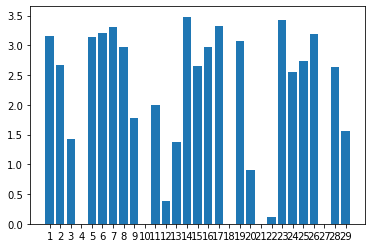

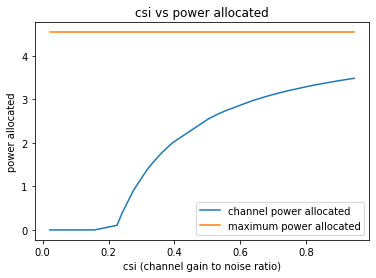

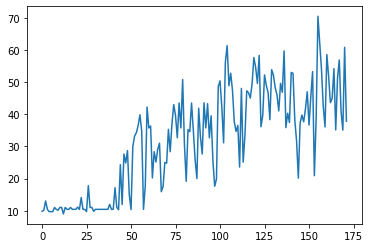

172
[4.046561044201235, 4.229068925353082, 5.526390234645937, 5.554731297643249, 6.330449462640412, 6.435817438559155, 7.1137873849369, 7.11715171742571, 7.195819454386019, 7.703044174154073, 7.873725777077323, 8.334102346992166, 8.6794524682118, 9.499389675052925, 9.776603001198, 16.770454110498125, 19.61807907792487, 19.78155801779176, 20.435476811426387, 24.348115700557607, 24.893563342364345, 26.45461797822049, 26.72396880557424, 27.271160612872198, 30.5378067134424, 30.595342879089646, 31.179073877640555, 31.857747690299817, 39.623245860145204]


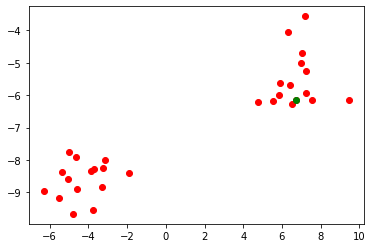

Power Allocated= 2.438700781875742
CSI= 0.4335605604357834
SNR= 4.046561044201235
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.684643963610931
CSI= 0.9429161620036107
SNR= 4.229068925353082
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.040393870098336
CSI= 0.36971450115744475
SNR= 5.526390234645937
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.313360
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.046468

Power Allocated= 0
CSI= 0.08826224404399163
SNR= 5.554731297643249
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.69514945549852
CSI= 0.48779674419068275
SNR= 6.330449462640412
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4692697235989756
CSI= 0.43938392986028396
SNR= 6.435817438559155
Client: client7
Poor Channel, client not taken for averaging in this round

Power All

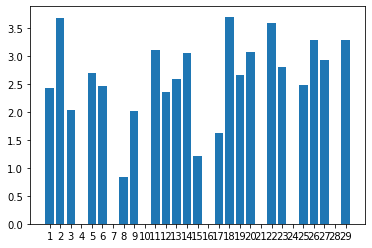

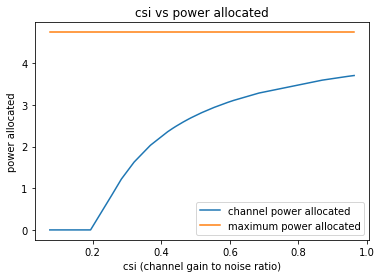

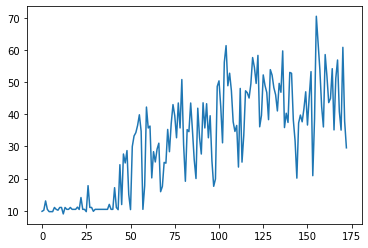

173
[11.123316245665212, 13.58773554971128, 14.911318677362116, 15.343443365989403, 15.576240460182431, 15.694609741542054, 17.546476671092496, 17.886285242609087, 18.00003101068415, 18.17054315085679, 19.96022688284549, 20.142554876107692, 20.25818051007357, 20.72963759157912, 20.903250535850358, 21.725689349681275, 22.3504707046972, 23.02309249929465, 23.475788734138625, 24.19372931598323, 24.759045086620013, 24.87407715887492, 25.37305436969791, 27.63745222737949, 30.13476114402406, 30.318307575550794, 32.450928569599014, 35.0504501364716, 38.00575490058179]


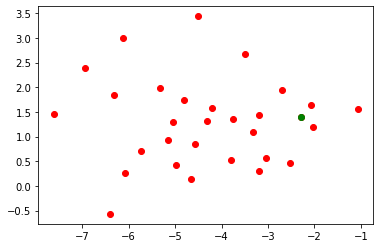

Power Allocated= 3.606613837483323
CSI= 0.701213691343521
SNR= 11.123316245665212
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.715225
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.097826

Power Allocated= 3.2142525569272093
CSI= 0.5499158401374546
SNR= 13.58773554971128
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7429247191512136
CSI= 0.43672166943543744
SNR= 14.911318677362116
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.747145030676995
CSI= 0.7778665228387135
SNR= 15.343443365989403
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.837759
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.009409

Power Allocated= 3.6925119489661054
CSI= 0.7461569096166444
SNR= 15.576240460182431
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1977993591640802
SNR= 15.694609741542054
Client: client6
Poor Chann

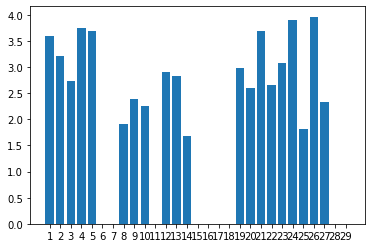

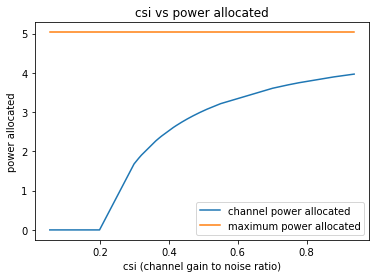

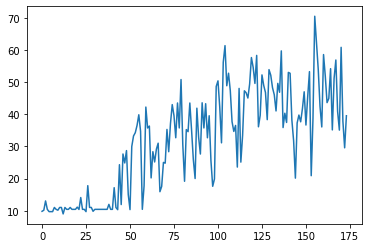

174
[11.521829409387193, 11.920448598262542, 12.489123816409638, 13.462630108904552, 13.941604129131962, 14.656683304059474, 15.355575685556689, 15.686573753819477, 15.701835344096953, 15.714838524276551, 16.107687673618983, 16.2015970527938, 16.4170421234825, 16.842035057041006, 17.261764996258133, 17.740443742822315, 18.567130924619512, 18.72248875954689, 18.789764573376843, 20.167874517498554, 20.811039156050445, 20.83904564901937, 20.98062889725775, 21.26588449070711, 22.79695999753366, 24.690759596055827, 25.756341846461, 25.947858088489, 27.335293130348212]


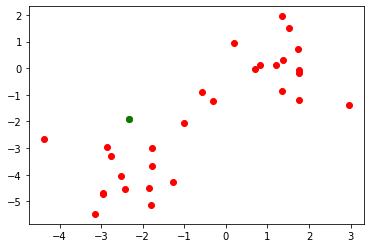

Power Allocated= 0.11962111838493517
CSI= 0.24842962712228256
SNR= 11.521829409387193
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 0.802870
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.022581

Power Allocated= 2.8614309406008536
CSI= 0.7791347890270011
SNR= 11.920448598262542
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 3.083461
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.707870

Power Allocated= 0
CSI= 0.19096328483121094
SNR= 12.489123816409638
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9537365866051823
CSI= 0.8395112095531776
SNR= 13.462630108904552
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6793435034112836
CSI= 0.6823319123567473
SNR= 13.941604129131962
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.229784
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.300985

Power Allocated= 2.88250951069665
CSI= 0.79214421

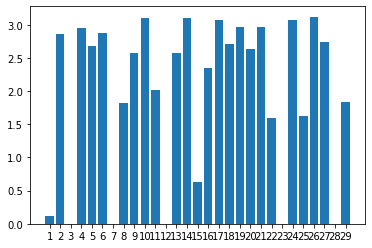

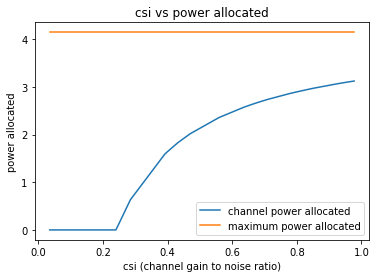

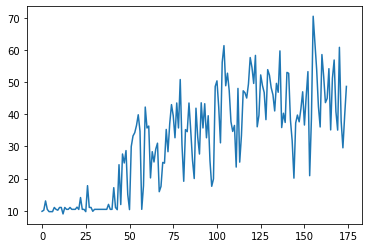

175
[0.44576508878446575, 0.9751486573066472, 1.9171938408169478, 2.283912712351814, 2.4866078049282665, 2.797035370789155, 3.2428369353742768, 3.6860331435170526, 3.848205583297691, 3.9446838988058546, 5.09387937104645, 5.46748076091296, 5.501774940473984, 5.907237699911039, 6.072062158178639, 15.38796939680723, 18.86798355779824, 21.01561225461283, 21.84505823487706, 22.516700106722976, 23.23209493876819, 23.237809460135942, 23.64087302317086, 26.19172129152327, 28.83125483615505, 29.22320592695437, 33.67480396328915, 34.24094160216525, 35.957259932085805]


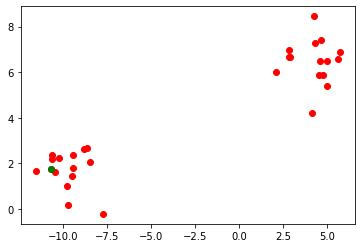

Power Allocated= 2.98068748645358
CSI= 0.8941783377793344
SNR= 0.44576508878446575
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.060191874903026
CSI= 0.9626114462008214
SNR= 0.9751486573066472
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10546009942192658
SNR= 1.9171938408169478
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4160981159290777
CSI= 0.5942001858355627
SNR= 2.283912712351814
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.959502903808742
CSI= 0.8775549935270692
SNR= 2.4866078049282665
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6213365840643585
CSI= 0.6767291581382906
SNR= 2.797035370789155
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.829945519645194
CSI= 0.44070586633086506
S

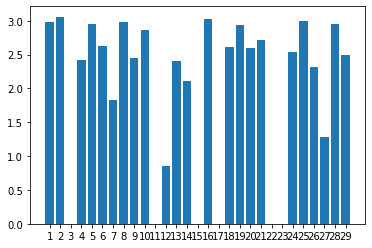

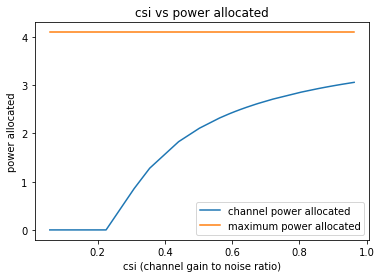

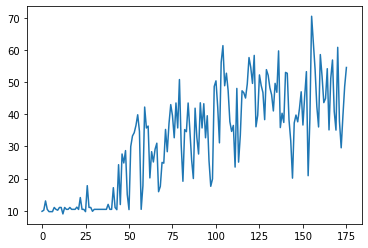

176
[7.541155859150706, 8.474405934963528, 8.926915665077306, 9.453242585555959, 9.484377934857502, 9.601634924499876, 10.087450188636524, 10.566525775788042, 10.956275805480102, 11.02714751159559, 11.832124503974638, 12.40587739973332, 12.677794082194627, 12.751284614496251, 13.072414764365744, 15.234206074642126, 16.067908327368777, 18.873816065581188, 19.28410985948461, 20.444206511940884, 20.79803394295086, 21.01360333970218, 21.320284132669116, 21.53512358790685, 21.564559797313677, 21.582390045831154, 24.635072425487625, 26.334445185977017, 28.560319580827063]


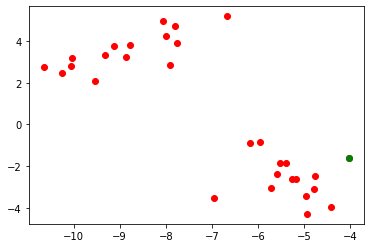

Power Allocated= 0
CSI= 0.030644191142709776
SNR= 7.541155859150706
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.342553359495669
CSI= 0.9766793200946757
SNR= 8.474405934963528
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9546632152201107
CSI= 0.2931031941298654
SNR= 8.926915665077306
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.111569
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.031219

Power Allocated= 0
CSI= 0.13550065023319513
SNR= 9.453242585555959
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.345536220687989
CSI= 0.9795329924264798
SNR= 9.484377934857502
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.192122583745334
CSI= 0.4599163798430387
SNR= 9.601634924499876
Client: client7
Model client7 Train Epoch: 1 [0/320 (0%)]	Loss: 1.621581
Model client7 Train Epoch: 2

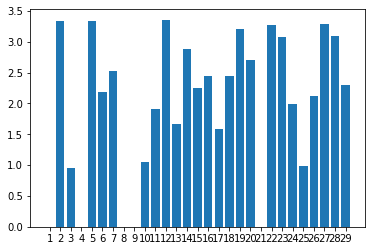

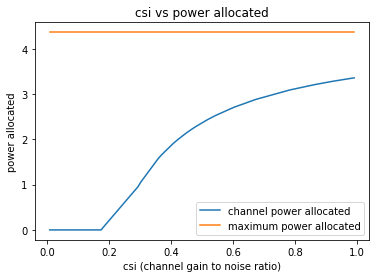

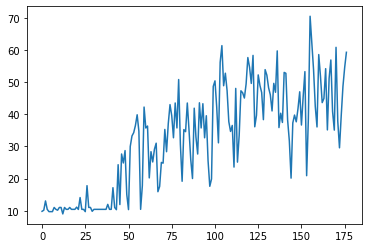

177
[4.271232724397764, 4.395412261700638, 4.886574234874845, 5.520912500653179, 5.52500138769, 5.581575614261924, 6.099645787797324, 6.821320477197744, 6.905737251062527, 7.106209782149135, 7.2426646497459695, 7.743686748285675, 8.11438397696185, 8.79511228937421, 8.929016780516676, 16.1197491192495, 16.64278021886537, 16.751096422445073, 17.744765790517135, 18.84816108423089, 19.125396291915276, 19.38642485455013, 24.223875616195897, 24.7965894768346, 25.46244841967607, 25.872309995170035, 26.93857958700671, 29.73141628973333, 34.974124009230884]


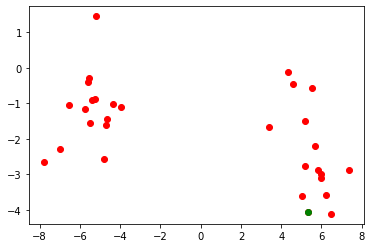

Power Allocated= 2.955428757738505
CSI= 0.447954508330468
SNR= 4.271232724397764
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.045127
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.216509

Power Allocated= 0.9719363081870283
CSI= 0.23719941552188195
SNR= 4.395412261700638
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.961290
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.409760

Power Allocated= 3.9441324164669718
CSI= 0.8040744821621907
SNR= 4.886574234874845
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.085617044025593
CSI= 0.9072917871075871
SNR= 5.520912500653179
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.186996
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.040816

Power Allocated= 0.7342472193701735
CSI= 0.22453991932597472
SNR= 5.52500138769
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17786104951179393
S

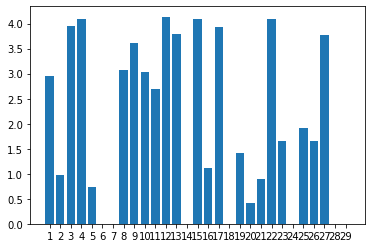

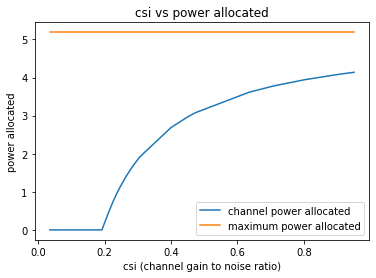

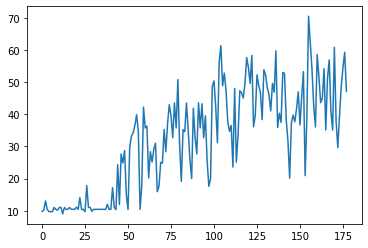

178
[13.019568339050956, 14.028565652185227, 15.309719177210681, 15.382094756363784, 16.09670298818129, 16.240198462988204, 17.465862752250118, 17.595990444404467, 18.030236914867157, 18.701365255718613, 18.99493891164672, 19.064566900443864, 19.102586212689836, 19.117292011266485, 19.433520653953373, 20.011371156338573, 20.241697134966124, 20.652905219926232, 21.481242412103004, 21.902073700875157, 22.71576216815706, 23.679880874590328, 23.975616970284744, 24.131789293513307, 25.149539950236598, 26.26900845682227, 27.598884097710595, 35.3535618961512, 35.93133863621567]


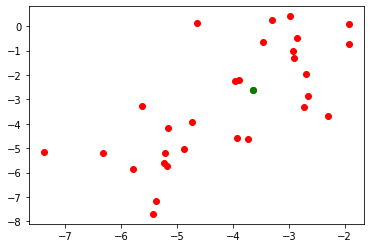

Power Allocated= 3.138518875839882
CSI= 0.8013906988262236
SNR= 13.019568339050956
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18235792198445677
SNR= 14.028565652185227
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3483852781606664
CSI= 0.9634241775764337
SNR= 15.309719177210681
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6148035402165646
CSI= 0.3608094361912446
SNR= 15.382094756363784
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 0.727015
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.182397

Power Allocated= 0.8672323194732536
CSI= 0.28416216272708594
SNR= 16.09670298818129
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.286502
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.064776

Power Allocated= 0.9909118947099809
CSI= 0.2945128325991113
SNR= 16.240198462988204
Client: client7
Model c

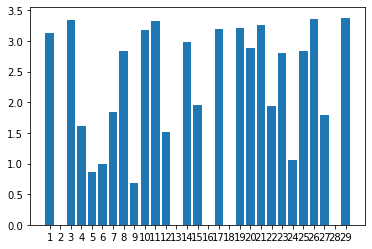

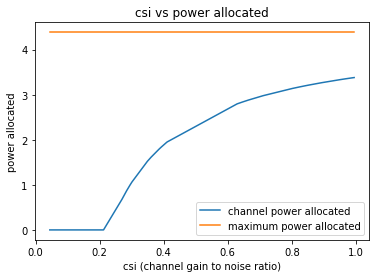

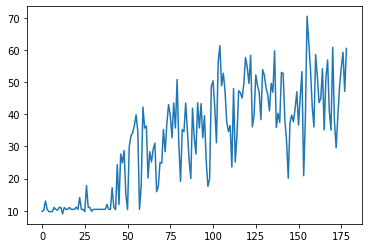

179
[5.4356624451791316, 6.5995167007723605, 6.755012824859109, 7.024780759118448, 7.320897922396332, 7.754179463158152, 9.262848724016665, 9.897814672711494, 10.014477658753059, 10.333996821487473, 10.36317884802048, 10.709606708963882, 11.487023935375557, 12.10096339839233, 12.68775694604519, 18.83647489368662, 18.920688727187983, 21.76316552425948, 21.930364772581537, 22.605195922227082, 22.729607734022466, 23.006708284898327, 23.56555161673627, 24.645901428438318, 24.768189101471737, 25.8772587126865, 26.26653011186098, 27.744179329831717, 31.985599635140453]


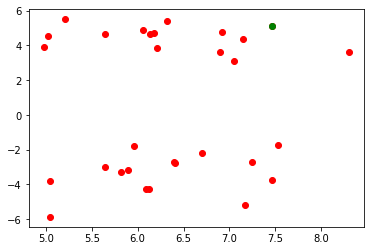

Power Allocated= 1.7298660072947776
CSI= 0.3943246250063315
SNR= 5.4356624451791316
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4345319731743187
CSI= 0.5460555091040717
SNR= 6.5995167007723605
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06277082233187359
SNR= 6.755012824859109
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19982807192004437
SNR= 7.024780759118448
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6577466787917365
CSI= 0.38342074215595534
SNR= 7.320897922396332
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2612625623711717
CSI= 0.4988563564499984
SNR= 7.754179463158152
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0280994222000994
CSI= 0.3088566305025734
SNR= 9.26284872

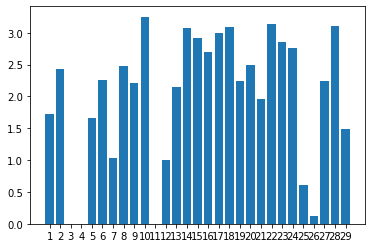

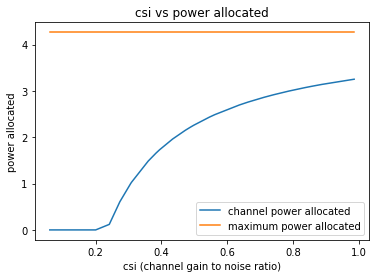

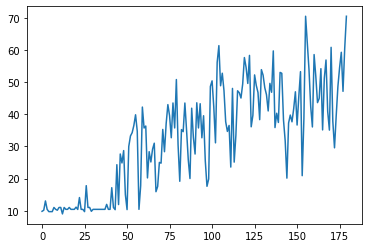

180
[7.187601684698436, 7.782832524378719, 7.905543759818367, 8.008233442250452, 8.873914213234116, 9.131345589748868, 9.335719021198294, 9.71991777457817, 10.399180436839547, 11.001688737637725, 11.0761753170491, 11.553233546364133, 11.614396806598696, 12.52578944147345, 13.9471325239689, 19.185560837625466, 19.443021622505427, 20.11265232245801, 23.00302422425546, 24.11316120103646, 24.702881490844966, 24.886598496696827, 24.967847076941936, 25.235624481991884, 26.801178729858773, 27.023118240980843, 28.729871167907024, 30.149944263962013, 32.93952256054741]


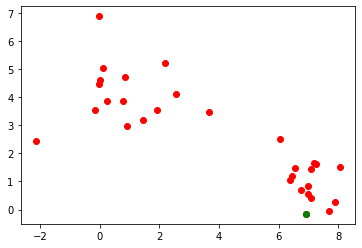

Power Allocated= 2.7639212153379304
CSI= 0.49835146651846585
SNR= 7.187601684698436
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15137341455670705
SNR= 7.782832524378719
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0135796631658875
CSI= 0.2661728273959122
SNR= 7.905543759818367
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06250844765825858
SNR= 8.008233442250452
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.283684715138056
CSI= 0.6725616935187181
SNR= 8.873914213234116
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.260079
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.630653

Power Allocated= 3.6358840149570857
CSI= 0.881326599391947
SNR= 9.131345589748868
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.63660

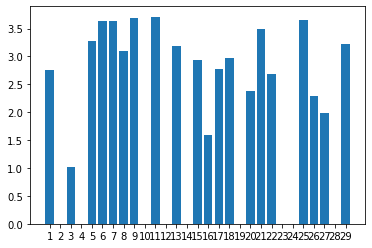

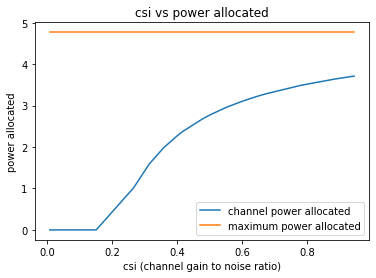

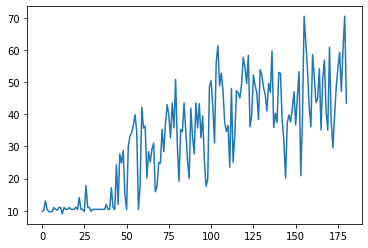

181
[4.909423604690805, 5.420872536144904, 6.925429020349874, 6.929924061307284, 7.447501520652999, 7.516702768036739, 7.8609268584705925, 7.885195440282882, 7.901595237329289, 7.988803754021847, 8.173505681756879, 8.952055928680869, 8.969865675029636, 9.00936444161945, 10.432520614155814, 18.799687124156815, 19.710137345947643, 21.09022810664228, 21.610348489954397, 22.01801535097731, 22.184532671558486, 23.93348364224746, 25.218884714945755, 26.50415037530407, 27.224455526458968, 27.787295469745445, 30.339225688538622, 30.418745882773138, 31.057182603540067]


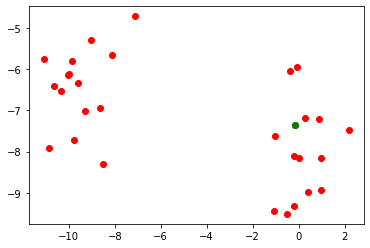

Power Allocated= 2.251702563143048
CSI= 0.3995274384292621
SNR= 4.909423604690805
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0745004316142035
CSI= 0.5951817177973068
SNR= 5.420872536144904
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07062587300154743
SNR= 6.925429020349874
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5687719443225561
CSI= 0.2388979567276539
SNR= 6.929924061307284
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.385080
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.265336

Power Allocated= 0
CSI= 0.05168310464550896
SNR= 7.447501520652999
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7144963001353926
CSI= 0.24751474980135046
SNR= 7.516702768036739
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.334213
Model client6 Train Epoch:

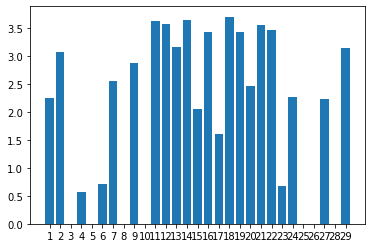

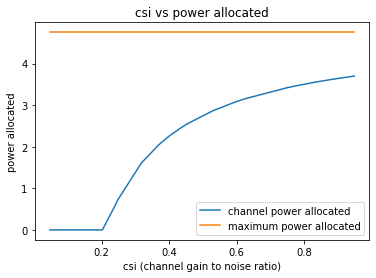

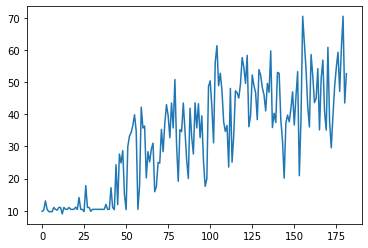

182
[9.610838814996036, 10.899890216932501, 12.311729260424368, 13.012656579545283, 13.282986137549223, 14.241441659773436, 14.805297663465437, 14.826774119602888, 15.08806671079977, 15.440338055754744, 15.66466201795967, 16.444434858170524, 17.207530525320273, 17.267376832750628, 17.379769833496265, 17.47592876185484, 17.86204860774258, 18.282860300486515, 18.485069039111277, 18.870159567561313, 19.718693977821367, 20.139299251108806, 20.414411240798565, 20.421023370133337, 20.627488430891404, 20.955040915390263, 21.195484328167773, 25.16958012128557, 25.775032997303267]


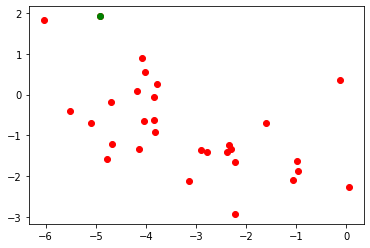

Power Allocated= 3.199957040855041
CSI= 0.5821011450065707
SNR= 9.610838814996036
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.769897
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.034901

Power Allocated= 3.8589284135123685
CSI= 0.9443377742207151
SNR= 10.899890216932501
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2071170630396733
CSI= 0.584537413422302
SNR= 12.311729260424368
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.560359
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.482620

Power Allocated= 0
CSI= 0.07264907536591159
SNR= 13.012656579545283
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.712387979776757
CSI= 0.8295426239615318
SNR= 13.282986137549223
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5118448461429317
CSI= 0.4156229855611152
SNR= 14.241441659773436
Client: client6
Poor Chann

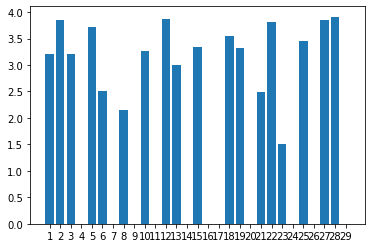

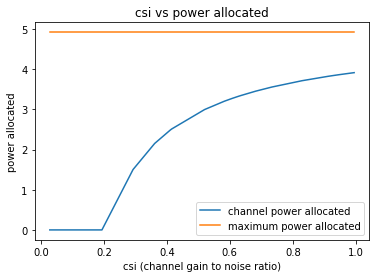

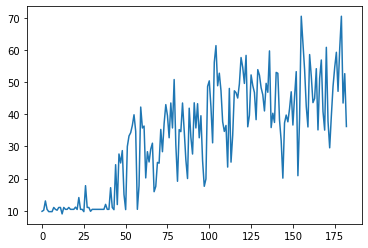

183
[4.990402920027416, 5.253485398803336, 5.328009641682446, 5.916117838275562, 6.592435380508125, 7.048136790155111, 7.354795569470828, 7.512727562657563, 7.58026566992754, 8.255392995054068, 8.551233826546364, 8.67146457019968, 8.776645744743261, 9.092400419315261, 9.647844472948815, 16.39193953378989, 18.119116997097784, 19.9025677746854, 20.58367883694921, 21.371330542651414, 21.9673405619417, 24.176700406279316, 24.339413394227268, 26.21103168214597, 29.326419460987655, 30.882745652708465, 33.168190795845234, 38.932049772235175, 43.32968551561638]


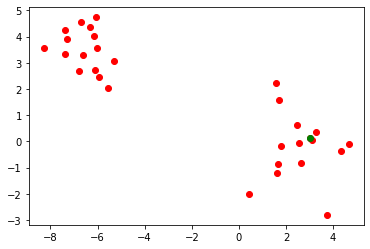

Power Allocated= 3.4166674981896543
CSI= 0.9570936997176198
SNR= 4.990402920027416
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9622584051786918
CSI= 0.6670051169319641
SNR= 5.253485398803336
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0965471451535342
CSI= 0.7326274972095582
SNR= 5.328009641682446
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14071518066934718
SNR= 5.916117838275562
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.979878881585062
CSI= 0.6749376236762127
SNR= 6.592435380508125
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.850788
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.387976

Power Allocated= 3.4361217850457173
CSI= 0.9752524869146358
SNR= 7.048136790155111
Client: client7
Poor Channel, client not taken for averaging in this round

Power Al

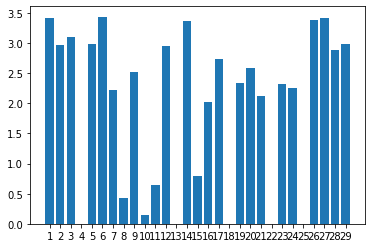

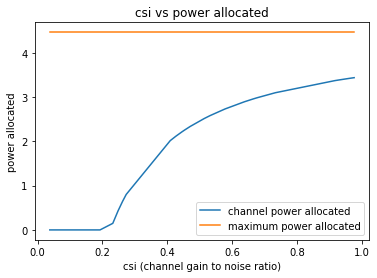

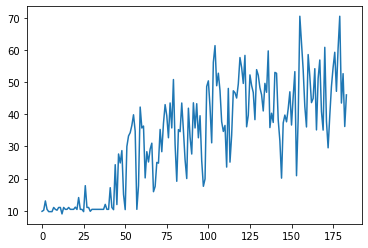

184
[14.936004521511954, 15.539473597524829, 16.102315026266783, 17.267074330708418, 17.663421589292142, 19.641839645944586, 19.756811655904286, 19.958599409940845, 20.462598439340493, 20.515810747323005, 20.587267380623146, 20.885665235314057, 21.3372655991516, 22.596337023996696, 22.647672570028547, 22.961952630866936, 23.451034263988223, 24.708062319023046, 25.094578516204635, 26.413873412044907, 26.675344549340117, 26.72050873008072, 27.572863964780232, 27.724526465101675, 29.029912267346408, 29.77383919507862, 29.820270710366675, 30.064826107671923, 36.644518149052494]


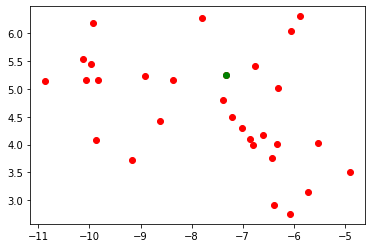

Power Allocated= 0
CSI= 0.13202056561128506
SNR= 14.936004521511954
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4782594345930127
CSI= 0.747254456612774
SNR= 15.539473597524829
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.798441
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.075925

Power Allocated= 3.589662065145211
CSI= 0.8151091220045987
SNR= 16.102315026266783
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.615805
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.067442

Power Allocated= 1.8100404118093634
CSI= 0.33261806527455107
SNR= 17.267074330708418
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.132343
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.158860

Power Allocated= 2.758354275444065
CSI= 0.4858762120908612
SNR= 17.663421589292142
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.051585
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.687472

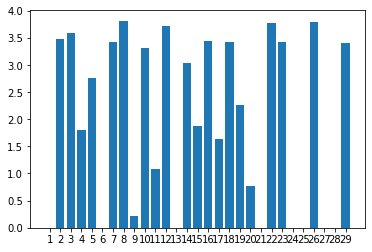

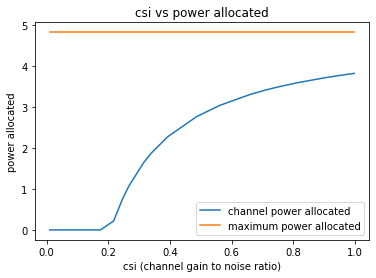

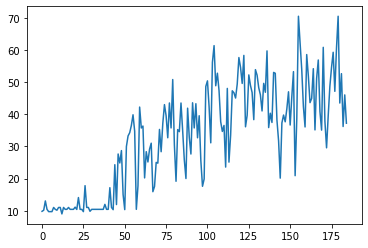

185
[6.826828685761114, 8.979990501836896, 9.549835835425077, 9.594023364924674, 9.84088296387326, 9.90556637728501, 9.94436054220001, 10.589552766334293, 10.683255567488462, 11.289839124483422, 11.707464504475077, 11.722911519857204, 12.388110704329158, 12.966443250466643, 14.099173242442161, 17.019377091222726, 18.28313821791335, 18.395317475003015, 19.492900672077294, 19.87911372552351, 20.66152921096774, 20.701475663874366, 21.563597758902546, 23.981711344178695, 24.757743205013835, 25.34100311596908, 26.29887452799551, 26.862588255914737, 37.620553773581236]


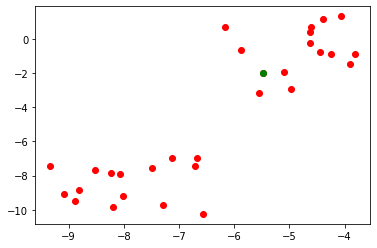

Power Allocated= 1.937441338221236
CSI= 0.3785394509737007
SNR= 6.826828685761114
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.394492
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.279463

Power Allocated= 3.3476131765096446
CSI= 0.8119778157112512
SNR= 8.979990501836896
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.784127249795657
CSI= 0.557088580623412
SNR= 9.549835835425077
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.039440361577834704
SNR= 9.594023364924674
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.540442480739392
CSI= 0.9627127523695328
SNR= 9.84088296387326
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0828829296836107
CSI= 0.6683192029220851
SNR= 9.90556637728501
Client: client6
Poor Channel, client not taken for averaging in this round

Power Alloca

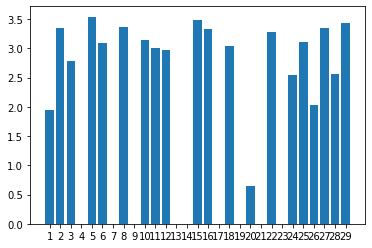

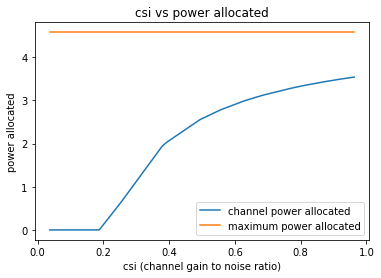

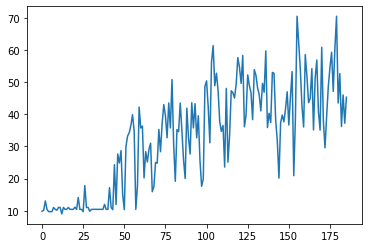

186
[9.812103620910548, 11.37219456525655, 11.91324417077065, 13.248363748963257, 14.653071772639905, 14.987297898513411, 15.496526784275618, 15.795190683200598, 16.321754968931263, 16.35741573491992, 17.52054430061733, 17.633385617078382, 17.990115328946477, 18.314355105321454, 19.508358270426136, 19.952975708937792, 20.4154415322078, 20.842958240973985, 21.192999321078844, 21.715537281873754, 23.699224603906103, 23.72826234304661, 23.86832739964125, 23.88544554401303, 23.989972516971097, 26.361960750985496, 27.266803090003595, 29.98402852490196, 34.195261617060545]


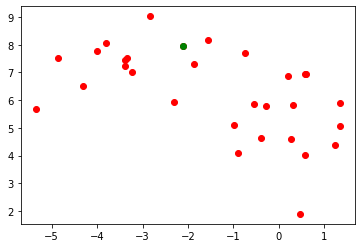

Power Allocated= 0
CSI= 0.006404989830298136
SNR= 9.812103620910548
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.146327544007964
CSI= 0.317318780545903
SNR= 11.37219456525655
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.98958600733247
CSI= 0.7644403373343459
SNR= 11.91324417077065
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08710505236787747
SNR= 13.248363748963257
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.192011496764216
CSI= 0.9043872128235285
SNR= 14.653071772639905
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.657264
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.208713

Power Allocated= 0
CSI= 0.06531506785109376
SNR= 14.987297898513411
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03167667012635

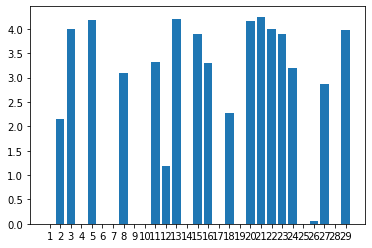

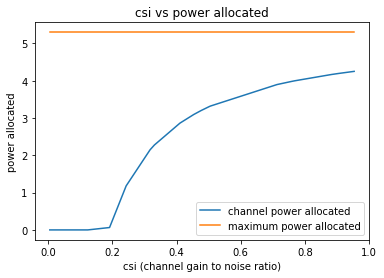

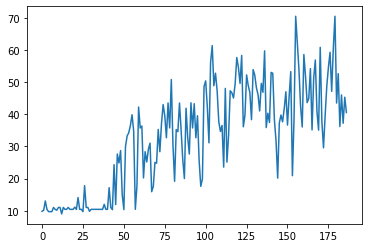

187
[4.261747401633115, 4.3012443610804665, 4.3138498507593805, 5.280907708667122, 5.514683043594393, 5.818486709147626, 5.858659455896406, 6.4748640694192785, 6.590433187809708, 6.6977304112532385, 6.753475911827936, 7.56032432402172, 8.422941295774352, 8.609916295476832, 9.743591733618747, 15.62424334074726, 16.514656858118308, 18.27071781584477, 18.93150672389877, 19.06614613291295, 20.20658568871675, 20.932045628301985, 21.330163735768394, 21.71611357693533, 22.900493404347962, 23.525346622336443, 24.04052470982353, 24.44474940617997, 24.471684204666225]


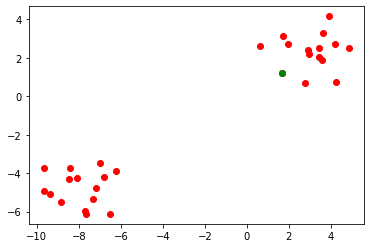

Power Allocated= 0
CSI= 0.1287559367132043
SNR= 4.261747401633115
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20263280730490696
SNR= 4.3012443610804665
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3351157259277224
CSI= 0.7015432434177387
SNR= 4.3138498507593805
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.994200
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.059683

Power Allocated= 3.1573988903946555
CSI= 0.6237736158832012
SNR= 5.280907708667122
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.27316116678496
CSI= 0.6723215906745802
SNR= 5.514683043594393
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20016318668086464
SNR= 5.818486709147626
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.631156693431904
CSI= 

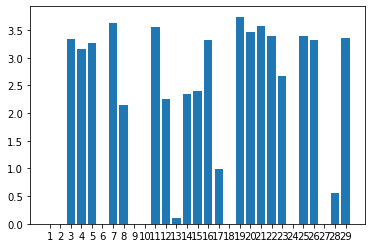

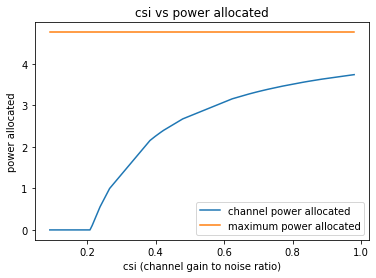

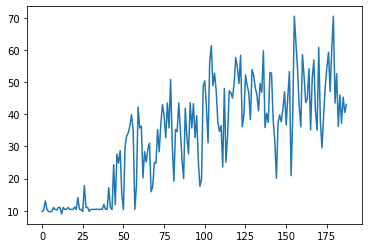

188
[3.6396783254333336, 6.297554965384139, 6.550164131349739, 6.9546651856010975, 7.55910163982726, 7.746652639054898, 7.796518966420004, 7.924016196440341, 8.249361006435596, 8.877152176730565, 9.25902488981564, 9.892045314431213, 10.346298715910288, 10.37790603445557, 10.439708132993083, 17.563593742096863, 17.986475833146056, 19.280913022979632, 20.99051509599092, 21.2326585779732, 21.35731227096741, 23.776247196737305, 24.048264281673145, 25.26924978260615, 25.7632043264569, 26.190814016335807, 30.0879529506291, 38.02999240814304, 38.92406175750585]


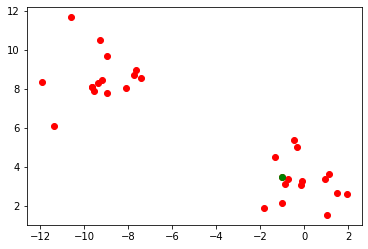

Power Allocated= 3.2223547918971596
CSI= 0.8903101824621128
SNR= 3.6396783254333336
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8162606270876838
CSI= 0.653894703006579
SNR= 6.297554965384139
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.669247153265705
CSI= 0.3736485572214979
SNR= 6.550164131349739
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.987636418880963
CSI= 0.2978031874852325
SNR= 6.9546651856010975
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6737476877560122
CSI= 0.3742779498409312
SNR= 7.55910163982726
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 3.202973
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.051262

Power Allocated= 2.2966120168667072
CSI= 0.4880556143588404
SNR= 7.746652639054898
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 3.892

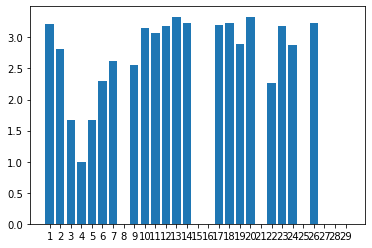

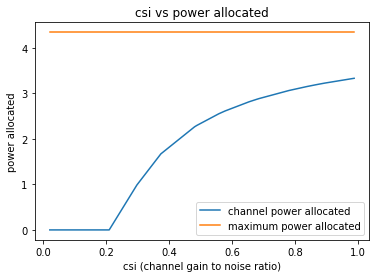

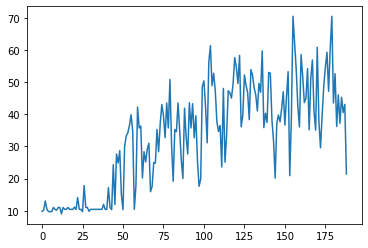

189
[0.6675494540680544, 0.7129736744138402, 1.0165028608238527, 1.2751742009518257, 1.3220548314969136, 1.4478425573045461, 2.19457875865032, 2.431807218604684, 3.53759030163477, 3.5955135168451258, 3.6711692959617666, 3.684783046774408, 3.928652738625221, 4.02270158041303, 5.504379436005908, 15.214895904188168, 15.830442495437518, 18.363203228776197, 22.883613217753542, 23.58938622035138, 24.316069706310522, 24.719836930689183, 25.53076353532093, 27.27041336521482, 29.027181725884162, 29.477566450364602, 30.06881476214419, 32.842875399476874, 40.027636501794255]


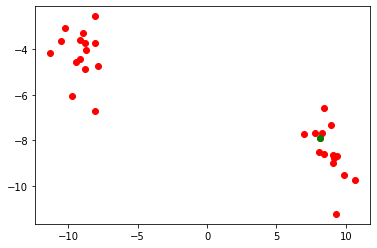

Power Allocated= 0
CSI= 0.18775753636073478
SNR= 0.6675494540680544
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3207990939502112
CSI= 0.9651394589591121
SNR= 0.7129736744138402
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.282857995072896
CSI= 0.9310459961711289
SNR= 1.0165028608238527
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2164359528554165
CSI= 0.8768216145226125
SNR= 1.2751742009518257
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21115811283866293
SNR= 1.3220548314969136
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0580936648052814
CSI= 0.7699265920294691
SNR= 1.4478425573045461
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6393796022012617
CSI= 0.3679799745229657
SNR= 2.194578

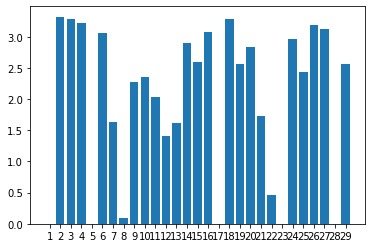

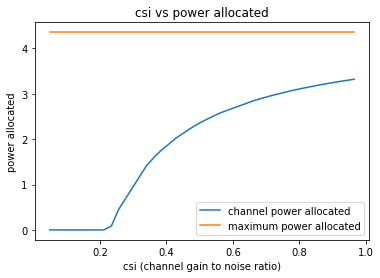

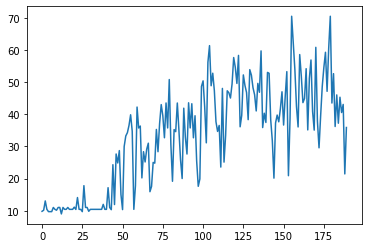

190
[2.529598176222689, 3.2161075111842523, 3.2960316379549806, 3.363775567337556, 3.4216940248974876, 3.553133641208179, 4.237040590806932, 4.507459126088227, 4.652596731174427, 4.748175273025616, 4.763686796227752, 4.903274475389493, 5.060924884981109, 6.092282530229569, 6.22478775196453, 15.278901053262437, 15.51480195083656, 18.093062332900978, 18.868093359423334, 19.57397654460972, 19.876794081049358, 20.623858685350257, 20.890115254941065, 21.648567849747085, 22.659604991893836, 24.984464049052534, 26.890745578199077, 27.543735048193504, 29.323744163945072]


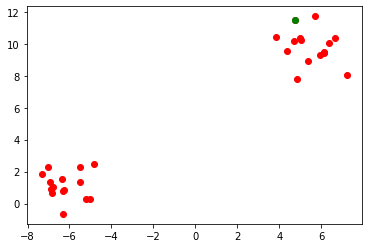

Power Allocated= 3.0869439981518862
CSI= 0.8706634367927133
SNR= 2.529598176222689
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.772395
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.088710

Power Allocated= 0
CSI= 0.07782209096002646
SNR= 3.2161075111842523
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1766127607294585
CSI= 0.944393475405026
SNR= 3.2960316379549806
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.002649
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.282226

Power Allocated= 3.2065116736888077
CSI= 0.9718345238109041
SNR= 3.363775567337556
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0024017852258327
CSI= 0.8109697281583241
SNR= 3.4216940248974876
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.614260
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.324437

Power Allocated= 0
CSI= 0.0275287022106121
SNR= 3.5531

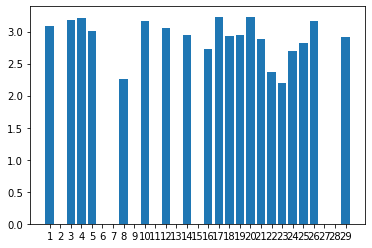

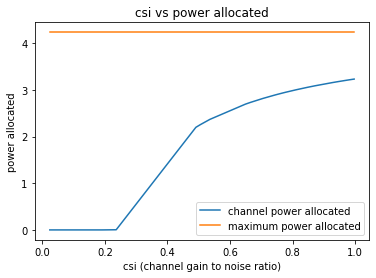

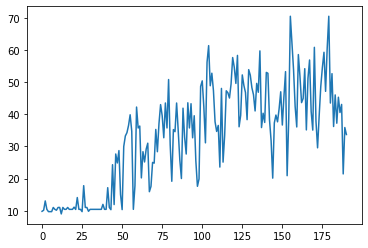

191
[9.210838520251919, 9.543367520564892, 11.413935114884696, 12.34755782292686, 12.811365722612074, 13.94745428979932, 14.160708844661732, 14.34749685614546, 14.539801384311199, 15.17424014577151, 15.199373510193677, 16.573780191720587, 17.900014584054922, 18.405601858380198, 18.605042496909604, 19.143100298288296, 19.43522120027053, 20.434346842755215, 20.886457787404044, 20.88887852041845, 21.58922558575334, 21.64202377420625, 21.97074763575021, 22.66195426951436, 26.262505500870716, 27.362394189498488, 29.651129810413657, 30.18216802344189, 32.91765870859875]


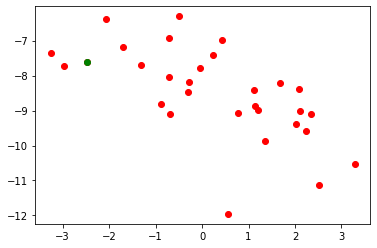

Power Allocated= 0
CSI= 0.20399545327369806
SNR= 9.210838520251919
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2899183755786794
CSI= 0.95410741645728
SNR= 9.543367520564892
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1751896251203955
CSI= 0.8599718440513346
SNR= 11.413935114884696
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8693307285115988
CSI= 0.2882934690778184
SNR= 12.34755782292686
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.988711
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.345287

Power Allocated= 2.1861906648076848
CSI= 0.46472121666907773
SNR= 12.811365722612074
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.154234
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.123209

Power Allocated= 1.52354132308677
CSI= 0.3553057904146756
SNR= 13.94745428979932
Client: client6
Model client6

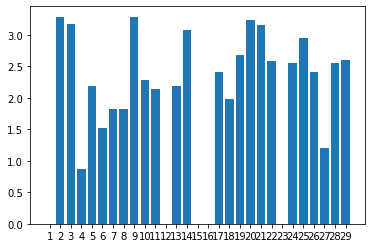

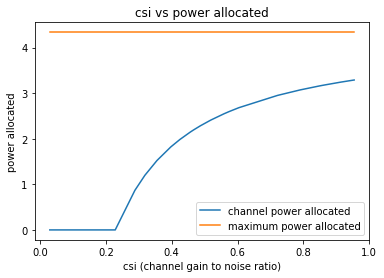

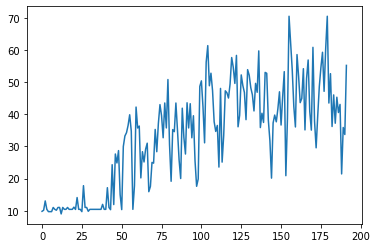

192
[7.607972099298822, 7.897977262885407, 8.368140046797736, 8.49391043651578, 10.011480090391451, 10.37788156422479, 11.159159961906317, 11.32494155515552, 11.441252266160898, 11.712688237373841, 12.32817050018745, 12.79218013908606, 13.307405061139521, 13.362902033397521, 13.682043257189402, 16.100412210332035, 18.777785987990487, 22.00655053003623, 23.27456762884175, 23.92942570474772, 25.83620961924855, 27.480416586277002, 27.99582218786997, 28.40784917444621, 29.187076498136353, 29.547748737880283, 29.77281740802797, 30.98766043272477, 36.20523797860856]


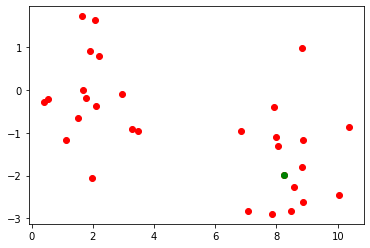

Power Allocated= 2.6415498085141254
CSI= 0.632484455563504
SNR= 7.607972099298822
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8647383361096406
CSI= 0.7364431872604477
SNR= 7.897977262885407
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6682951268235167
CSI= 0.3914934416041568
SNR= 8.368140046797736
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.207378
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.143167

Power Allocated= 1.2985948924539659
CSI= 0.34199475629896636
SNR= 8.49391043651578
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10261714707391367
SNR= 10.011480090391451
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6961711437609654
CSI= 0.6551168735025663
SNR= 10.37788156422479
Client: client6
Poor Channel, client not taken for averaging in this round

Power A

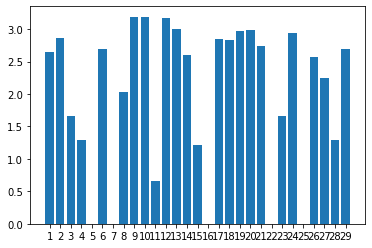

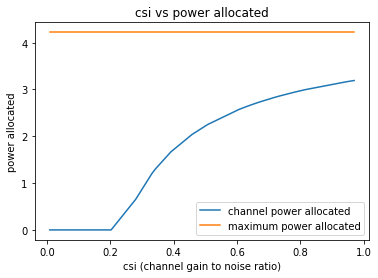

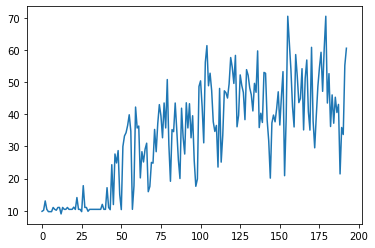

193
[0.935038365913142, 1.172226305299077, 1.2269681195829496, 1.3624972346720585, 1.6617977640917072, 1.997100718266303, 2.019666047586074, 2.388204651680394, 2.517106071611873, 2.561160845487247, 2.7122361330116167, 2.9289044475143973, 3.151537234550227, 3.3907621848591547, 4.326200801068494, 13.748211083444208, 20.068321451139973, 20.16945039294882, 20.594519792392827, 21.130843118143257, 23.310876885026865, 23.689453559484374, 24.639187095211714, 26.157860540408144, 26.54200490132811, 27.18193932262092, 28.85388882909163, 32.0271481652896, 33.85851946677837]


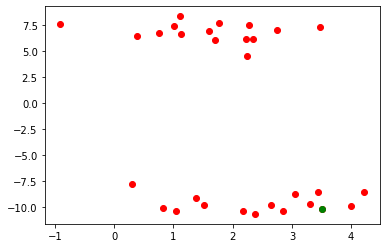

Power Allocated= 2.2290543618538137
CSI= 0.40475416820869725
SNR= 0.935038365913142
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.043715
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.126512

Power Allocated= 1.1092592487248467
CSI= 0.2785181275663351
SNR= 1.172226305299077
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5685175020021678
CSI= 0.4692253138488105
SNR= 1.2269681195829496
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4388734576940365
CSI= 0.23469680804266646
SNR= 1.3624972346720585
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2989191476142805
CSI= 0.22723292676157236
SNR= 1.6617977640917072
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06019258643640768
SNR= 1.997100718266303
Client: client6
Poor Channel, client not taken for averaging in this round

P

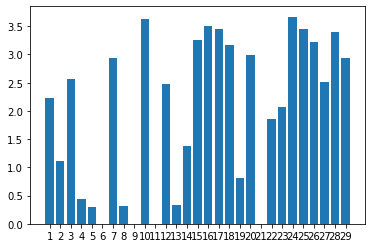

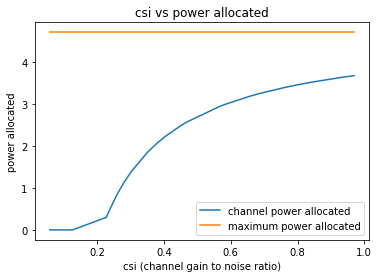

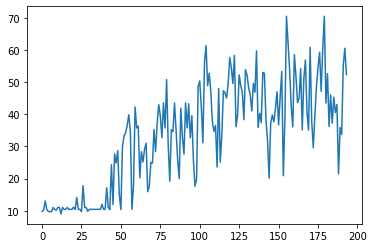

194
[9.611098374412407, 10.50631748706821, 11.218484557158856, 11.339670309229227, 11.449493398943217, 12.625195596495368, 12.721569760176699, 12.740600625046149, 12.9202149370878, 13.38062636237849, 13.40607875031353, 13.7927352738715, 14.077882677812502, 14.173208910176726, 15.513632622368302, 16.057242103375554, 16.588024143096103, 17.099276635647065, 18.022531445650294, 19.985147061831594, 20.1040398012022, 22.452657650546687, 28.935355850019867, 29.12503146660514, 29.78640900072895, 33.53084401701866, 35.17260641821051, 42.1797859974754, 51.36168469190534]


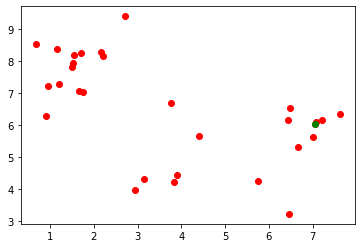

Power Allocated= 2.951145927047672
CSI= 0.829310383374684
SNR= 9.611098374412407
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.369285
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001922

Power Allocated= 3.0505321646006345
CSI= 0.9038037293969965
SNR= 10.50631748706821
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.95767058544812
CSI= 0.45469085406291254
SNR= 11.218484557158856
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.170045519259139
CSI= 0.5032911320500166
SNR= 11.339670309229227
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3638135035706487
CSI= 0.5576767182228761
SNR= 11.449493398943217
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.677773093470814
CSI= 0.4033569001521181
SNR= 12.625195596495368
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.34

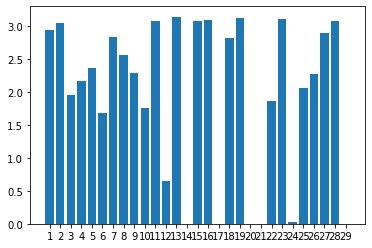

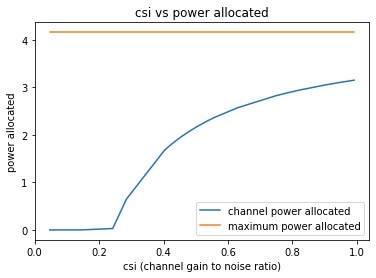

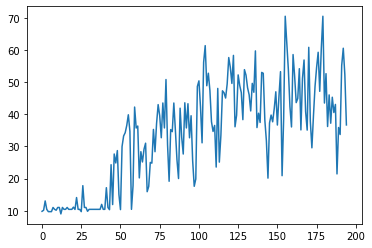

195
[7.079029406525544, 7.21106255696455, 7.783201795601581, 7.888013433491162, 8.06205046937307, 9.066770781634082, 9.16812621807673, 9.430782213368998, 9.722272251183119, 9.78333310493116, 10.297337513638036, 10.918234749463021, 11.057379856538448, 11.131408381518893, 11.262857036519657, 17.013073322943015, 18.252185982935252, 18.687659175004544, 20.59302162484086, 21.56181349311407, 24.43122424227441, 24.468929806676357, 26.402899806724722, 29.608946957031932, 30.472988181642286, 31.45179286199121, 33.601287182366754, 34.272138043152765, 34.31537021939269]


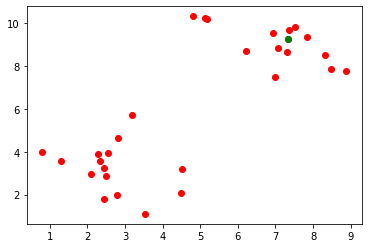

Power Allocated= 3.261438857601422
CSI= 0.7773049467535524
SNR= 7.079029406525544
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7890815331423804
CSI= 0.5685521186769756
SNR= 7.21106255696455
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.385660
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.484296

Power Allocated= 3.0614534869615704
CSI= 0.6727294160882231
SNR= 7.783201795601581
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.447107
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.187402

Power Allocated= 3.526122212379003
CSI= 0.9786526257843478
SNR= 7.888013433491162
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.818058
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.152792

Power Allocated= 3.0426836186397974
CSI= 0.664340757076823
SNR= 8.06205046937307
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.23261577923471055
CSI= 0.2

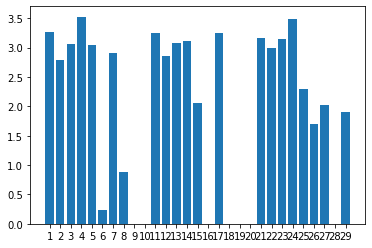

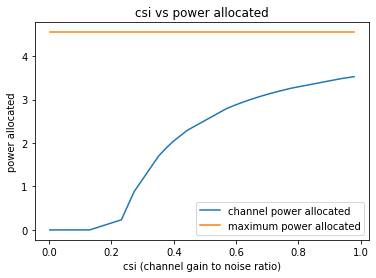

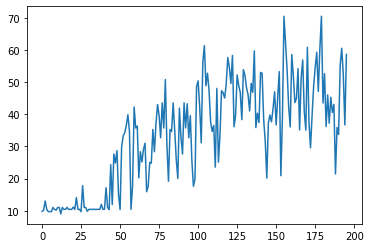

196
[3.8795928026706035, 4.580394575513094, 4.867624098034817, 4.999600519810906, 5.02099553759061, 5.2587313119494725, 5.898098928379233, 6.541244325993619, 6.5925358829920455, 6.593517232927078, 6.6596008376003955, 7.490870040617012, 8.087050746972212, 8.28703451800489, 8.541292335394765, 15.025429118633333, 15.897375826596543, 16.23782587341074, 18.86752582901367, 20.81383287951283, 21.984582185790845, 23.556241321942895, 23.889083433369056, 23.918363826442437, 23.947207118065922, 24.801454331937055, 25.59557955932786, 27.23699496021484, 29.13317774771066]


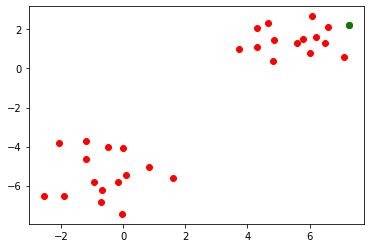

Power Allocated= 0
CSI= 0.09317578595780329
SNR= 3.8795928026706035
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.593240403138614
CSI= 0.821851785240211
SNR= 4.580394575513094
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.02928701544463
CSI= 0.5615712961675692
SNR= 4.867624098034817
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18848614963787647
SNR= 4.999600519810906
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0011006227379419808
SNR= 5.02099553759061
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0277011898942447
CSI= 0.264389139645717
SNR= 5.2587313119494725
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.001256
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001815

Power Allocated= 2.1705246590851877
CSI= 

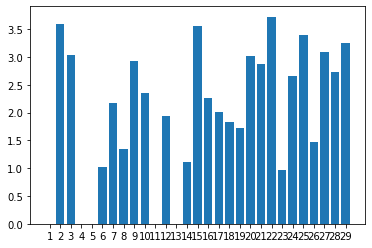

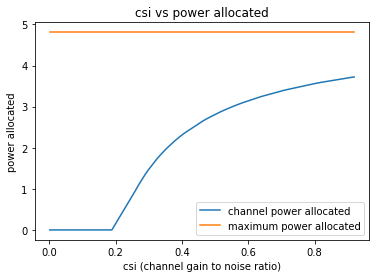

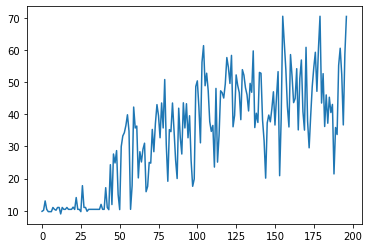

197
[12.034996878454974, 12.31253998563377, 13.859208202684137, 13.934180774942682, 14.620045802200469, 14.626055032017776, 14.778254229580126, 14.869921025507637, 15.070930150679123, 15.390860481868648, 15.416874967449237, 15.573720918279147, 15.821065702750353, 16.16936363710789, 16.585828020322886, 16.78495205315667, 17.330933930101803, 17.35390880951233, 17.40986811960514, 17.549966639065858, 17.597132179514727, 17.882371355819654, 18.25138286166211, 18.721480303603222, 19.21368336384047, 19.841191806922435, 20.51638769652527, 20.87906613004811, 21.356882365371792]


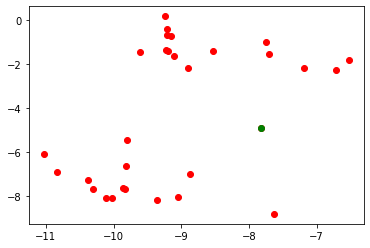

Power Allocated= 0
CSI= 0.21122647997416322
SNR= 12.034996878454974
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17842699575496357
SNR= 12.31253998563377
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9044814674917623
CSI= 0.6538845964033758
SNR= 13.859208202684137
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.951831
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.078134

Power Allocated= 2.9563785375706946
CSI= 0.6768534102525727
SNR= 13.934180774942682
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 0.893856
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.576346

Power Allocated= 2.2892253701816805
CSI= 0.46629221461667836
SNR= 14.620045802200469
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.017065027264526633
SNR= 14.626055032017776
Client: client6
Poor Channel, client not taken for av

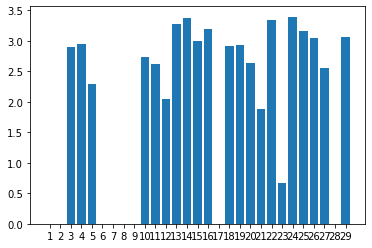

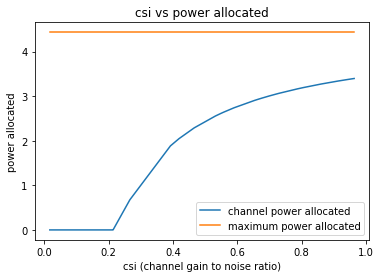

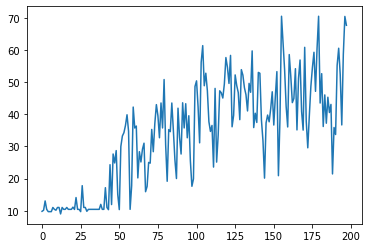

198
[9.305772281616761, 9.851321631543213, 9.886787424411832, 11.287221597895929, 12.785667184642776, 13.021809138708315, 13.111356125422214, 13.518237550618826, 13.958521301282202, 14.604795961061171, 15.7219409381776, 16.608754705677267, 17.242225286000153, 17.449401286478835, 19.309252323632037, 20.127521895850165, 20.621240300324367, 23.509941665866243, 24.197076251065344, 24.394228795516888, 24.50279768509386, 25.287420415363606, 25.963143471075536, 26.087372310703653, 26.735159826748763, 27.847507179707563, 29.53608064525533, 32.88170514160948, 41.459444974693525]


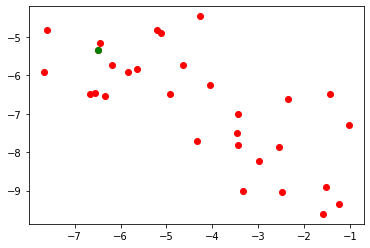

Power Allocated= 0
CSI= 0.1268457139191974
SNR= 9.305772281616761
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6942740622255386
CSI= 0.39905281683832705
SNR= 9.851321631543213
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.921238878334338
CSI= 0.781879700263585
SNR= 9.886787424411832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7054516056820384
CSI= 0.286142976730798
SNR= 11.287221597895929
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.566574
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.210062

Power Allocated= 3.7989039077627
CSI= 0.7136209760621582
SNR= 12.785667184642776
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.042565763892451924
SNR= 13.021809138708315
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.683636

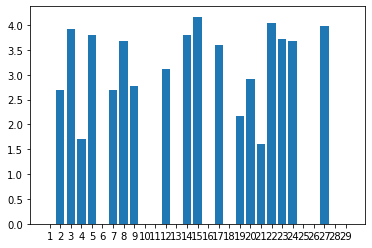

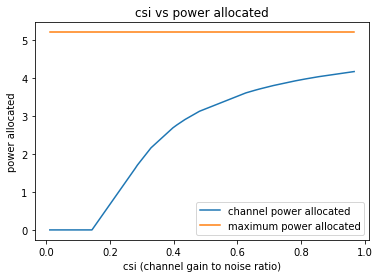

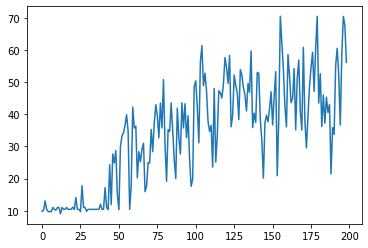

199
[7.822114629276114, 8.495606518236864, 9.22783891077982, 9.450518156567833, 9.591154629877277, 10.018097317426914, 10.325588845994332, 10.404954453393266, 10.580533500472344, 11.626317889377406, 12.793374732391495, 12.915123916565285, 14.093109387036886, 14.64652274923224, 14.801472027819361, 20.718837718550652, 21.274634074439582, 21.322730525230803, 23.11375948682182, 23.630067419978033, 23.913363660006638, 24.26265494310794, 25.901553388346837, 25.91044470378421, 29.898928057047343, 30.657699752275903, 30.788896694565505, 32.63066109187096, 38.79097490256849]


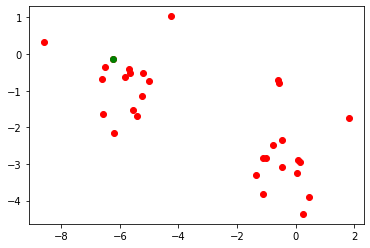

Power Allocated= 0
CSI= 0.14595555727971676
SNR= 7.822114629276114
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1003778870315877
CSI= 0.6484463417213188
SNR= 8.495606518236864
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.267212
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.116461

Power Allocated= 2.2137151136904594
CSI= 0.41172418879754014
SNR= 9.22783891077982
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9079916609677436
CSI= 0.5765237656124785
SNR= 9.450518156567833
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.513875455380985
CSI= 0.8860142031977885
SNR= 9.591154629877277
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.331818525381525
CSI= 0.4327679780766043
SNR= 10.018097317426914
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

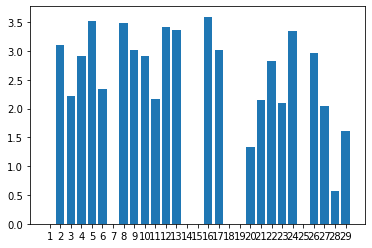

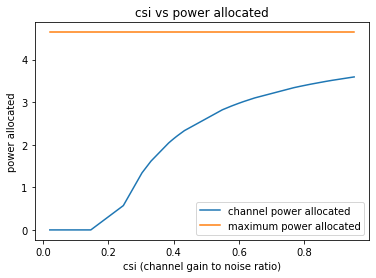

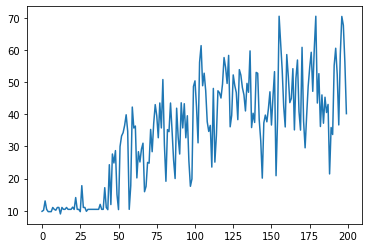

200


In [10]:
for fed_round in range(args.rounds):
    
    client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round

    # Training 
    #even slot
    
    snr=[] #snr of the channel
    csi=[] #csi of the channel
    for ii in range (int(args.clients)-1):
        #snr.append(random.uniform(args.snr_low, args.snr_high))
        csi.append(random.uniform(args.csi_low,args.csi_high))
    
    # if(fed_round==0):
    #     snr,cluster_head=get_cluster()
    if(True): #fed_round==0 or True                                        %%%static or moving
        snr,cluster_head=get_cluster()
        temp=copy.deepcopy(cluster_head)
        temp1=copy.deepcopy(snr)
    else:
        #print(temp)
        cluster_head=copy.deepcopy(temp)
        snr=copy.deepcopy(temp1)
    #print(cluster_head)
    smallmu1=0
    gsmall1=3.402823466E+38 
    
    #water filling algorithm
    mu=1e-15
    while(mu<=1):
        #print("yay")
        #pn=max(1/mu-1/csi,0)
        g1=0
        pn1=0
        for jj in csi:
            pn=max(1/mu-1/jj,0)
            g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
            pn1+=pn
        g=g1-mu*(pn1-P*(int(args.clients)-1))
        if(g<gsmall1):
            smallmu1=mu
            gsmall1=g
        mu+=0.00002

    #print(smallmu1)
    # poptim=max(1/smallmu1-1/csi1,0)
    # print(poptim)
    index=0
    members=[]
    for i in clients:
        if(i['hook'].id!=cluster_head):
            members.append(i)
        else:
            head=i
    for client in members:
        goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
        if(goodchannel):
            client_good_channel.append(client)
        index+=1
        
    po=[]    
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    
    plt.bar([str(i) for i in range (1,len(po)+1)],po,)
    csi.sort()
    po=[]
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    fig,ax=plt.subplots()
    line1=ax.plot(csi,po,label="channel power allocated")
    line2=ax.plot(csi,[1/smallmu1]*len(csi),label="maximum power allocated")
    ax.set_title("csi vs power allocated")
    ax.set_xlabel("csi (channel gain to noise ratio)")
    ax.set_ylabel("power allocated")
    ax.legend()
    #plt.show()
    

#     # Testing 
#     for client in active_clients:
#         test(args, client['model'], device, client['testset'], client['hook'].id)
    
    
    
    print()
    print("Clients having a good channel and considered for training")
    for no in range (len(client_good_channel)):
        print(client_good_channel[no]['hook'].id)
        
        
        
    # Averaging 
        #odd slot

    head['model'] = averageModels(head['model'],client_good_channel)
    # Testing the average model
    #test(args, global_model, device, global_test_loader, 'Global')
    ac=test(args, head['model'], device, global_test_loader, 'Final')
    accuracy.append(ac)
    
    print("Power in training Round=",sum(po))
    #print("Power cap=",P*len(active_clients))
    
    #print("Total Power =",power_odd+power_even)
    print()
            
    # Share the global model with the clients
    index=0
    for client in members:
        client['model'].load_state_dict(head['model'].state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1) #CHANGE:Commented
        index+=1
        #client['model']=torch.quantization.quantize_dynamic(client['model'],{torch.nn.Conv2d},dtype=torch.qint8)
        #print(client['model'].conv1.weight.data)
    fig1,ax1=plt.subplots()
    ax1.plot([i for i in range(len(accuracy))],accuracy)
    plt.show()
    print(rc)
    rc+=1

In [11]:
print(accuracy)

[9.82, 10.16, 13.05, 10.43, 9.72, 9.72, 9.72, 11.02, 10.43, 10.16, 11.02, 11.02, 9.01, 11.02, 10.43, 10.43, 11.02, 10.43, 10.43, 10.43, 11.12, 10.4, 14.1, 10.43, 10.43, 9.72, 17.8, 11.02, 11.02, 9.82, 10.43, 10.43, 10.43, 10.43, 10.43, 10.43, 10.43, 10.43, 11.98, 10.43, 10.43, 17.17, 11.0, 10.33, 24.32, 11.92, 27.65, 24.86, 28.71, 15.04, 10.35, 29.98, 33.26, 34.28, 36.54, 39.85, 34.74, 10.43, 17.78, 42.25, 35.74, 36.34, 20.21, 28.37, 25.17, 29.15, 31.01, 15.92, 17.56, 25.03, 24.8, 35.29, 28.36, 37.14, 43.01, 39.56, 32.7, 43.52, 35.75, 50.81, 30.56, 19.16, 35.24, 34.6, 43.51, 34.99, 25.84, 20.02, 41.9, 32.87, 27.64, 43.58, 35.75, 43.29, 32.69, 39.55, 25.57, 17.6, 19.89, 48.66, 50.4, 42.28, 31.12, 56.18, 61.36, 48.88, 52.78, 47.36, 37.69, 34.67, 36.53, 23.58, 48.05, 25.12, 33.47, 47.31, 46.7, 45.06, 49.43, 57.65, 54.61, 49.6, 58.32, 36.11, 39.69, 52.25, 48.97, 46.77, 38.33, 53.89, 52.17, 48.26, 46.07, 41.04, 49.62, 46.85, 59.72, 35.87, 40.33, 37.46, 53.03, 52.76, 38.24, 31.73, 20.14, 37.